In [1]:
import sys
print(sys.version)

3.6.10 |Anaconda, Inc.| (default, Jan  7 2020, 15:01:53) 
[GCC 4.2.1 Compatible Clang 4.0.1 (tags/RELEASE_401/final)]


In [2]:
"""
Created on Jan 2 2020
@author: Neven Caplar
@contact: ncaplar@princeton.edu

These comments are theoretically the only ones you need to read to run the notebook

1. Specify the directory in which you want to run the analysis below (PSF_DIRECTORY)
2. Name and place the data in DATA_FOLDER. The data is avaliable at https://github.com/nevencaplar/PFS_Work_In_Progress/tree/master/CutsForTigerMay2
3. TESTING_FOLDER will be filled during the run with images from the analysis analysis

4. (OPTIONAL)Next cell contains some extensions that I use that make life much easier when using jupyter notebook 
    Without them this notebook becomes reallllly huge and hard to deal with
    These can be downloaded from https://github.com/ipython-contrib/jupyter_contrib_nbextensions

"""
############################################################
# name your directory where you want to have files!
PSF_DIRECTORY='/Users/nevencaplar/Documents/PFS/'
# place cutouts in this folder - name as you wish
DATA_FOLDER=PSF_DIRECTORY+'TigerAnalysis/CutsForTigerMay2/'
############################################################
    

TESTING_FOLDER=PSF_DIRECTORY+'Testing/'
TESTING_PUPIL_IMAGES_FOLDER=TESTING_FOLDER+'Pupil_Images/'
TESTING_WAVEFRONT_IMAGES_FOLDER=TESTING_FOLDER+'Wavefront_Images/'
TESTING_FINAL_IMAGES_FOLDER=TESTING_FOLDER+'Final_Images/'
import os

for i in [PSF_DIRECTORY,DATA_FOLDER,TESTING_PUPIL_IMAGES_FOLDER,TESTING_WAVEFRONT_IMAGES_FOLDER,TESTING_FINAL_IMAGES_FOLDER]:
    if not os.path.exists(i):
        os.makedirs(i)

In [3]:
%%javascript
try {
  require(['base/js/utils'], function (utils) {
    utils.load_extension('code_prettify/code_prettify');
    utils.load_extension('collapsible_headings/main'); 
    utils.load_extension('codefolding/edit'); 
    utils.load_extension('codefolding/main'); 
    utils.load_extension('execute_time/ExecuteTime');   
    utils.load_extension('toc2/main'); 
  });
}
catch (err) {
  console.log('toc2 load error:', err);
}

<IPython.core.display.Javascript object>

In [4]:
# make notebook nice and wide to fill the entire screen
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [5]:
%load_ext autoreload
%autoreload 2

#import Zernike_Module
#from Zernike_Module import LNP_PFS,LN_PFS_single,create_parInit,downsample_manual_function,Zernike_Analysis,PFSPupilFactory,custom_fftconvolve,stepK,maxK,sky_scale,sky_size,create_x,remove_pupil_parameters_from_all_parameters

#Zernike_Module_lastOct15_beforeScatterChange
import Zernike_Module
import Zernike_Analysis_Module
from Zernike_Module import *
from Residual_1D_module import * 
from Zernike_Analysis_Module import *




In [6]:
import galsim
import numpy as np
np.set_printoptions(suppress=True)
np.seterr(divide='ignore', invalid='ignore')
import pandas as pd
import io
import math
import pickle
import glob

#tqdm is not necesarry, it is the monitor evaluation of the 'for' loops
from tqdm import tqdm

# lsst stack
#import lsst.afw
#from lsst.afw.cameraGeom import PupilFactory
#from lsst.afw.geom import Angle, degrees
#from lsst.afw import geom
#from lsst.afw.geom import Point2D

# astropy
import astropy
import astropy.convolution
from astropy.convolution import Gaussian2DKernel

# scipy and skimage
#from scipy.ndimage import gaussian_filter
import scipy.misc
import skimage.transform

#lmfit
import lmfit

#matplotlib
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
matplotlib.rcParams.update({'font.size': 18})
%config InlineBackend.rc = {}
%matplotlib inline
%config IPython.matplotlib.backend = "retina"

from shutil import copy
from scipy.optimize import curve_fit

def lin_fit_1D(x, a, b):
    return a * x + b

def lin_fit_1DConstant(x, b):
    return  np.full(len(x),b)

def lin_fit_2D(x,y, a, b,c):
    return a * x + b*y+c



print(np.__version__)
print(skimage.__version__)
print(scipy.__version__)

1.17.0
0.16.2
1.3.1


## unit test 

In [8]:
columns=['z4','z5','z6','z7','z8','z9','z10','z11',
          'hscFrac','strutFrac','dxFocal','dyFocal','slitFrac','slitFrac_dy',
          'radiometricEffect','radiometricExponent','x_ilum','y_ilum',
          'x_fiber','y_fiber','effective_radius_illumination',
          'frd_sigma','frd_lorentz_factor','det_vert','slitHolder_frac_dx',
          'grating_lines','scattering_slope','scattering_amplitude',
          'pixel_effect','fiber_r','flux']  

sci_image_unit=np.ones((50,50))
var_image_unit=np.ones((50,50))
#array([     0.85110826,      0.73047372,     -0.31672873,     -0.00539844, -0.32264156,     -0.04922217,     -0.49565709,      0.18057418,
#            0.79993531,      0.10032969,      0.08769052,      0.25372595,          0.06064503,      0.21049747,   
#           0.45840763,      2.05047984,  0.30893478,     -0.13166649, 
#           -0.06752367,     -0.13093007,            0.89197452, 
#           0.10757197,   0.60969064,      1.06409559,   0.14192374, 
#           109336.61223169,   2.41053199,      0.00379578,
#            0.4673993 ,      1.88555321,      0.99733826])
allparameters_proposal=np.array([24,0.09,0.02,-0.1,0.0,0.1,0.02,0.2,
                                 0.7,0.1,0.3,0.0,0.07,0.0,
                                 0.17,0.67,1,1,
                                 0.0,-0.0,0.80,
                                 0.01,0.51,1.06,0.28,
                                 50000,2.5,0.027,
                                 0.37,1.85,1.0])
print('version of the code is: '+str(Zernike_Module.__version__))
model = LN_PFS_single(sci_image_unit,var_image_unit,dithering=1,save=1)   

res=model(allparameters_proposal,return_Image=True)
print(res[0])

version of the code is: 0.28b
npix_value:1280
-5607.8416656774525


In [9]:
pupililluminated=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')
ilum=np.load(TESTING_PUPIL_IMAGES_FOLDER+'ilum.npy')
radiometricEffectArray=np.load(TESTING_PUPIL_IMAGES_FOLDER+'radiometricEffectArray.npy')
optPsf=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf.npy')
ilum_radiometric=np.load(TESTING_PUPIL_IMAGES_FOLDER+'ilum_radiometric.npy')
wf_full=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'wf_full.npy') 

optPsf_cut_fiber_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved.npy')
optPsf_cut_pixel_response_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_pixel_response_convolved.npy')
optPsf_cut_grating_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_grating_convolved.npy')
optPsf_cut_fiber_convolved_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')



res_iapetus=res[1]

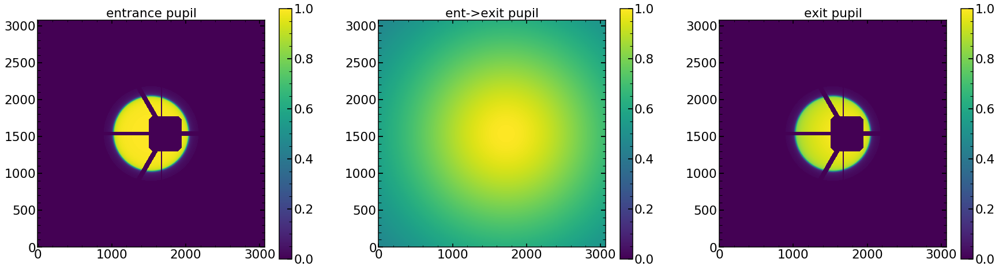

In [10]:
plt.figure(figsize=(30,8))
plt.subplot(131)
plt.imshow(ilum,origin='lower',vmax=1,vmin=0)
plt.title('entrance pupil')
plt.colorbar()
plt.subplot(132)
plt.title('ent->exit pupil')
plt.imshow(radiometricEffectArray,origin='lower',vmax=1,vmin=0)

plt.colorbar()
plt.subplot(133)
plt.title('exit pupil')
plt.imshow(ilum_radiometric,origin='lower',vmax=1,vmin=0)
plt.colorbar()

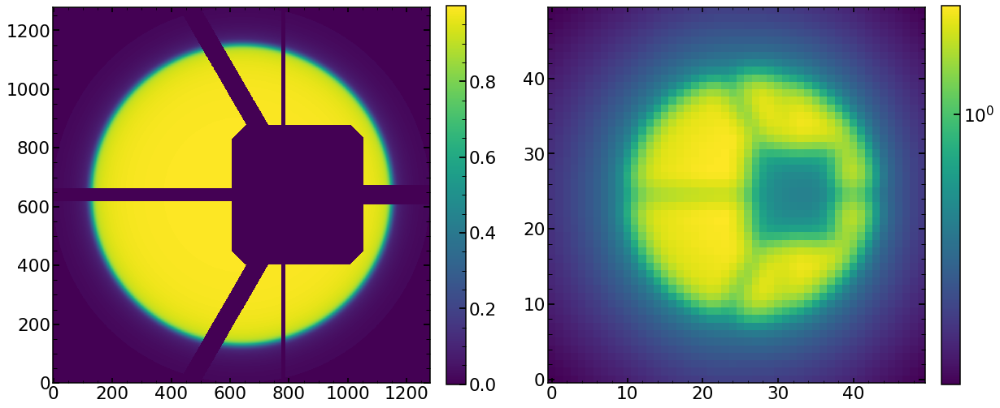

In [11]:
plt.figure(figsize=(20,20))
plt.subplot(121)
plt.imshow(pupililluminated,origin='lower')
cbar=plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(122)
plt.imshow(res_iapetus,norm=LogNorm(),origin='lower')
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([1,10**-2,10**-3,10**-4,10**-5,10,10**2,10**3,10**4,10**5])

# quality difference between real data and simulations 

In [37]:
from astropy.io import fits 

finalHgAr=np.load('/Users/nevencaplar/Documents/PFS/ReducedData/Data_May_28/Dataframes/finalHgAr_May2019.pkl')
image_index=1
run_5=21280+30
sci_5=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Aug_14/Stamps_cleaned/sci"+str(run_5)+str(image_index)+'HgAr_Stacked.npy')

# HgAr
DATA_FOLDER='/Volumes/My Passport for Mac/Old_Files/PFS/ReducedData/Jun_2019_run1/rerun/rerun_1/detrend/calExp/2019-07-26/'
data=fits.open(DATA_FOLDER+'v00'+str(run_5+0)+'/calExp-LA0'+str(run_5+0)+'r1.fits')
scidata_HgAr=data[1].data

# Ne
run_Ne=21484+5*6
DATA_FOLDER='/Volumes/My Passport for Mac/Old_Files/PFS/ReducedData/Jun_2019_run1/rerun/rerun_1/detrend/calExp/2019-07-26/'
data=fits.open(DATA_FOLDER+'v00'+str(run_Ne+0)+'/calExp-LA0'+str(run_Ne+0)+'r1.fits')
scidata_Ne=data[1].data

# sim 
DATA_FOLDER='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Sim/'
data=fits.open(DATA_FOLDER+'PFFAr1.fits')
scidata_sim=data[1].data

In [186]:
FA000031r1=astropy.io.fits.open('/Users/nevencaplar/Documents/PFS/ReducedData/v0000031/calExp-FA000031r1.fits')[1].data

Lower_left_31=FA000031r1[550-10:550+10,77-10:77+10]
Lower_right_31=FA000031r1[550-10:550+10,4019-10:4019+10]

Upper_left_31=FA000031r1[3495-10:3495+10,76-10:76+10]
Upper_right_31=FA000031r1[3495-10:3495+10,4020-10:4020+10]

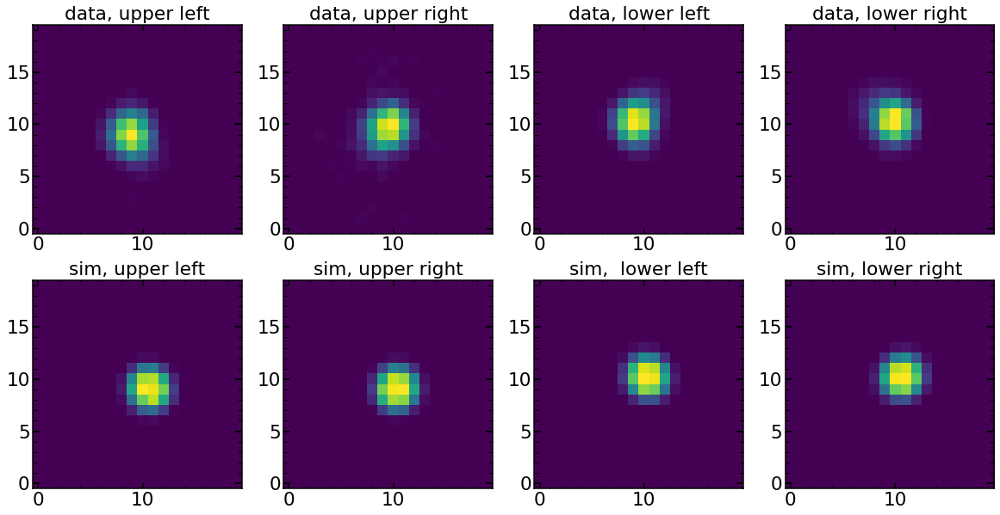

In [187]:
scidata_upper_left=scidata[4030:4050,50:70]
scidata_upper_right=scidata[4030:4050,4006:4026]
scidata_lower_left=scidata_Ne[140:160,53:73]
scidata_lower_right=scidata_Ne[141:161,4004:4024]


plt.figure(figsize=(20,10))
plt.subplot(2,4,1)
plt.title('data, upper left')
plt.imshow(scidata_upper_left,origin='lower',vmax=np.max(scidata_upper_left),vmin=np.max(scidata_upper_left)/100)
plt.subplot(2,4,2)
plt.title('data, upper right')
plt.imshow(scidata_upper_right,origin='lower',vmax=np.max(scidata_upper_right),vmin=np.max(scidata_upper_right)/100)
plt.subplot(2,4,3)
plt.title('data, lower left')
plt.imshow(scidata_lower_left,origin='lower',vmax=np.max(scidata_lower_left),vmin=np.max(scidata_lower_left)/100)
plt.subplot(2,4,4)
plt.title('data, lower right')
plt.imshow(scidata_lower_right,origin='lower',vmax=np.max(scidata_lower_right),vmin=np.max(scidata_lower_right)/100)

plt.subplot(2,4,5)
plt.title('sim, upper left')
plt.imshow(Upper_left_31,vmax=np.max(Upper_left_31),origin='lower',vmin=np.max(Upper_left_31)/10**2)
plt.subplot(2,4,6)
plt.title('sim, upper right')
plt.imshow(Upper_right_31,vmax=np.max(Upper_right_31),origin='lower',vmin=np.max(Upper_right_31)/10**2)
plt.subplot(2,4,7)
plt.title('sim,  lower left')
plt.imshow(Lower_left_31,vmax=np.max(Lower_left_31),origin='lower',vmin=np.max(Lower_left_31)/10**2)
plt.subplot(2,4,8)
plt.title('sim, lower right')
plt.imshow(Lower_right_31,vmax=np.max(Lower_right_31)/1,origin='lower',vmin=np.max(Lower_right_31)/10**2)

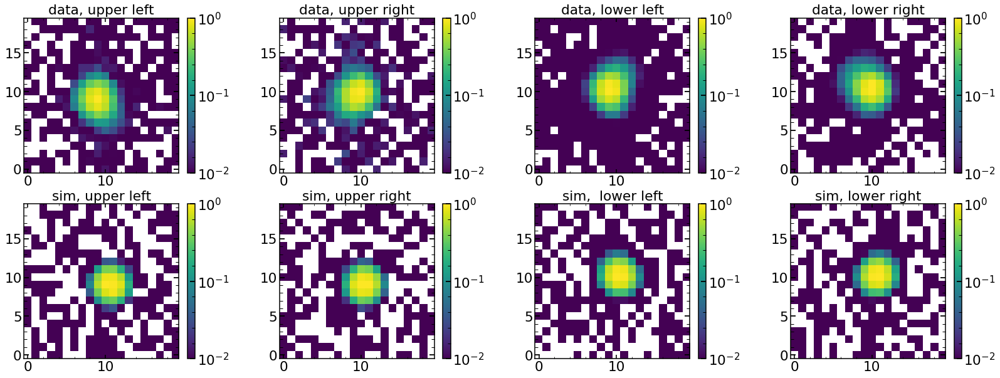

In [188]:
plt.figure(figsize=(28,10))
plt.subplot(2,4,1)
plt.title('data, upper left')
plt.imshow(scidata_upper_left/np.max(scidata_upper_left),origin='lower',vmax=1,vmin=1/100,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([0.01,0.1,1])

plt.subplot(2,4,2)
plt.title('data, upper right')
plt.imshow(scidata_upper_right/np.max(scidata_upper_right),origin='lower',vmax=1,vmin=1/100,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([0.01,0.1,1])

plt.subplot(2,4,3)
plt.title('data, lower left')
plt.imshow(scidata_lower_left/np.max(scidata_lower_left),origin='lower',vmax=1,vmin=1/100,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([0.01,0.1,1])

plt.subplot(2,4,4)
plt.title('data, lower right')
plt.imshow(scidata_lower_right/np.max(scidata_lower_right),origin='lower',vmax=1,vmin=1/100,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([0.01,0.1,1])

plt.subplot(2,4,5)
plt.title('sim, upper left')
plt.imshow(Upper_left_31/np.max(Upper_left_31),vmax=1,origin='lower',vmin=1/10**2,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([0.01,0.1,1])

plt.subplot(2,4,6)
plt.title('sim, upper right')
plt.imshow(Upper_right_31/np.max(Upper_right_31),vmax=1,origin='lower',vmin=1/10**2,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([0.01,0.1,1])

plt.subplot(2,4,7)
plt.title('sim,  lower left')
plt.imshow(Lower_left_31/np.max(Lower_left_31),vmax=1,origin='lower',vmin=1/10**2,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([0.01,0.1,1])

plt.subplot(2,4,8)
plt.title('sim, lower right')
plt.imshow(Lower_right_31/np.max(Lower_right_31),vmax=1,origin='lower',vmin=1/10**2,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([0.01,0.1,1])

# Determining separations of lines

In [13]:
# https://github.com/Subaru-PFS/obs_pfs/blob/master/pfs/lineLists/ArCdHgKrNeXe.txt

with open('/Users/nevencaplar/Documents/PFS/ReducedData/Data_May_28/Dataframes/finalNe_May2019.pkl', 'rb') as f:
    finalNe_May2019=pickle.load(f)  
with open('/Users/nevencaplar/Documents/PFS/ReducedData/Data_May_28/Dataframes/finalHgAr_May2019.pkl', 'rb') as f:
    finalHgAr_May2019=pickle.load(f)  
with open('/Users/nevencaplar/Documents/PFS/ReducedData/Data_May_28/Dataframes/finalKr_May2019.pkl', 'rb') as f:
    finalKr_May2019=pickle.load(f)  
    
finalKr=finalKr_May2019
finalHgAr=finalHgAr_May2019
finalNe=finalNe_May2019

STAMPS_FOLDER='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Aug_14/Stamps_cleaned/'

In [14]:
finalHgAr[finalHgAr['wavelength']=='706.8989']

,fiber,xc,yc,wavelength,close,lamp,xc_effective,old_index_approx,superold_index_approx
2,2,70,992,706.8989,0,HgAr,70,2,nan
14,63,461,977,706.8989,0,HgAr,461,14,nan
26,192,845,968,706.8989,0,HgAr,845,26,nan
38,255,1223,960,706.8989,0,HgAr,1223,50,nan
50,339,1610,955,706.8989,0,HgAr,1610,74,nan
62,401,1992,952,706.8989,0,HgAr,1992,86,nan
74,464,2440,955,706.8989,0,HgAr,2509,122,nan
86,525,2828,959,706.8989,0,HgAr,2897,146,nan
98,587,3625,978,706.8989,0,HgAr,3694,170,nan
110,650,4005,992,706.8989,0,HgAr,4074,182,nan


In [208]:
finalHgAr

,fiber,xc,yc,wavelength,close,lamp,xc_effective,old_index_approx,superold_index_approx
0,2,69,808,690.9346,0,HgAr,69,0,nan
1,2,69,875,696.7261,1,HgAr,69,1,90.0
2,2,70,992,706.8989,0,HgAr,70,2,nan
3,2,71,1229,727.47876,1,HgAr,71,3,nan
4,2,72,1358,738.6248,0,HgAr,72,4,80.0
...,...,...,...,...,...,...,...,...,...
115,650,4002,2379,826.6699,0.5,HgAr,4071,187,45.0
116,650,4003,2681,852.4029,0.5,HgAr,4072,188,35.0
117,650,4008,3393,912.5693,1,HgAr,4077,189,25.0
118,650,4009,3515,922.7301,0,HgAr,4078,190,15.0


## for a single line - HgAr (close = 0)

In [23]:
finalHgAr[(finalHgAr['close']=='0')&(finalHgAr['fiber']==339)]

,fiber,xc,yc,wavelength,close,lamp,xc_effective,old_index_approx,superold_index_approx
48,339,1610,772,690.9346,0,HgAr,1610,72,nan
50,339,1610,955,706.8989,0,HgAr,1610,74,nan
52,339,1610,1318,738.6248,0,HgAr,1610,76,82.0
58,339,1609,3464,922.7301,0,HgAr,1609,82,12.0


In [209]:
finalHgAr

,fiber,xc,yc,wavelength,close,lamp,xc_effective,old_index_approx,superold_index_approx
0,2,69,808,690.9346,0,HgAr,69,0,nan
1,2,69,875,696.7261,1,HgAr,69,1,90.0
2,2,70,992,706.8989,0,HgAr,70,2,nan
3,2,71,1229,727.47876,1,HgAr,71,3,nan
4,2,72,1358,738.6248,0,HgAr,72,4,80.0
...,...,...,...,...,...,...,...,...,...
115,650,4002,2379,826.6699,0.5,HgAr,4071,187,45.0
116,650,4003,2681,852.4029,0.5,HgAr,4072,188,35.0
117,650,4008,3393,912.5693,1,HgAr,4077,189,25.0
118,650,4009,3515,922.7301,0,HgAr,4078,190,15.0


### focus - HgAr line at 690.9346

In [24]:
finalHgAr[finalHgAr['wavelength']=='690.9346']

,fiber,xc,yc,wavelength,close,lamp,xc_effective,old_index_approx,superold_index_approx
0,2,69,808,690.9346,0,HgAr,69,0,nan
12,63,461,794,690.9346,0,HgAr,461,12,nan
24,192,845,785,690.9346,0,HgAr,845,24,nan
36,255,1222,777,690.9346,0,HgAr,1222,48,nan
48,339,1610,772,690.9346,0,HgAr,1610,72,nan
60,401,1992,771,690.9346,0,HgAr,1992,84,nan
72,464,2440,772,690.9346,0,HgAr,2509,120,nan
84,525,2828,776,690.9346,0,HgAr,2897,144,nan
96,587,3626,796,690.9346,0,HgAr,3695,168,nan
108,650,4006,809,690.9346,0,HgAr,4075,180,nan


In [212]:
# secondary is Argon line at  687.3185 ?

date='Dec04'
obs=21346+54
obs_int=int(obs)
arc='HgAr'

single_number_0=12
single_number_1=24
single_number_2=48
single_number_3=84
single_number_4=96
sci_image_0_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_0)+str(arc)+'_Stacked_large.npy')
sci_image_1_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_1)+str(arc)+'_Stacked_large.npy')
sci_image_2_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_2)+str(arc)+'_Stacked_large.npy')
sci_image_3_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_3)+str(arc)+'_Stacked_large.npy')
sci_image_4_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_4)+str(arc)+'_Stacked_large.npy')

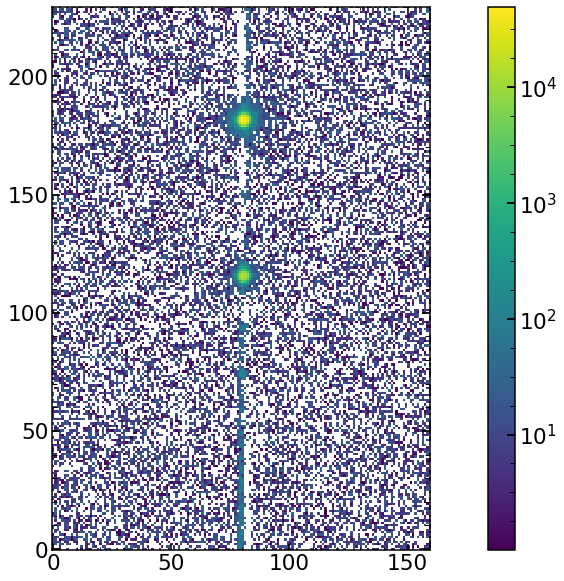

In [213]:
plt.figure(figsize=(26,10))
plt.imshow(sci_image_2_large,norm=LogNorm(),vmin=1)
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

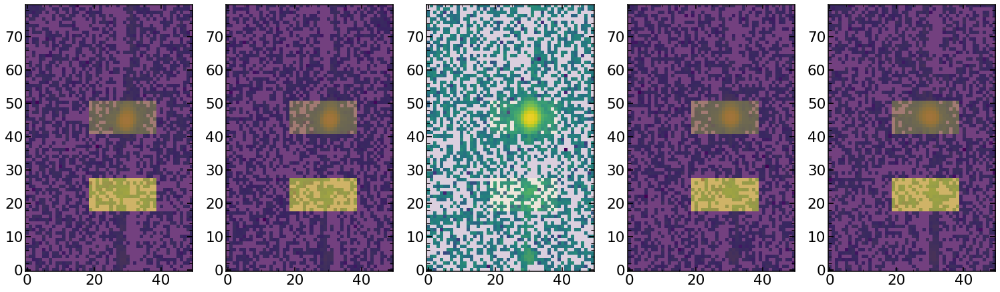

In [216]:
delta_y=-23
delta_y_primary=111
delta_y_step=10
sci_image_primary_0_large=np.zeros((sci_image_0_large.shape))
sci_image_secondary_0_large=np.zeros((sci_image_0_large.shape))
sci_image_primary_0_large[delta_y_primary:delta_y_primary+delta_y_step,69:89]=1
sci_image_secondary_0_large[delta_y_primary+delta_y:delta_y_primary+delta_y_step+delta_y,69:89]=1

plt.figure(figsize=(26,10))
plt.subplot(1,5,1)
plt.imshow(sci_image_0_large[70:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[70:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[70:150,50:100],alpha=0.5)
plt.subplot(1,5,2)
plt.imshow(sci_image_1_large[70:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[70:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[70:150,50:100],alpha=0.5)
plt.subplot(1,5,3)
plt.imshow(sci_image_2_large[70:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[70:150,50:100],alpha=0.1)
plt.imshow(sci_image_secondary_0_large[70:150,50:100],alpha=0.1)
plt.subplot(1,5,4)
plt.imshow(sci_image_3_large[70:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[70:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[70:150,50:100],alpha=0.5)
plt.subplot(1,5,5)
plt.imshow(sci_image_4_large[70:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[70:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[70:150,50:100],alpha=0.5)

In [217]:
list_of_ratio_primary_secondary=[]
list_of_delta_y_primary_secondary=[]

for sci_image in [sci_image_0_large,sci_image_1_large,sci_image_2_large,sci_image_3_large,sci_image_4_large]:
    sci_image_primary_image=sci_image[delta_y_primary:delta_y_primary+delta_y_step,69:89]
    sci_image_secondary_image=sci_image[delta_y_primary+delta_y:delta_y_primary+delta_y_step+delta_y,69:89]

    ratio_primary_secondary=np.sum(sci_image_secondary_image)/np.sum(sci_image_primary_image)
    delta_y_primary_secondary=delta_y+find_centroid_of_flux(sci_image_secondary_image)[1]-find_centroid_of_flux(sci_image_primary_image)[1]

    list_of_ratio_primary_secondary.append(ratio_primary_secondary)
    list_of_delta_y_primary_secondary.append(delta_y_primary_secondary)
print(list_of_ratio_primary_secondary)
print(list_of_delta_y_primary_secondary)

print(np.mean(list_of_ratio_primary_secondary))
print(np.mean(list_of_delta_y_primary_secondary))

[0.001104093, 0.002177496, 0.0064961556, 0.004402358, 0.003223526]
[-14.825408474732818, -17.86874932151879, -23.27881293960018, -21.886272824692178, -18.478170344532902]
0.0034807257
-19.267482781015374


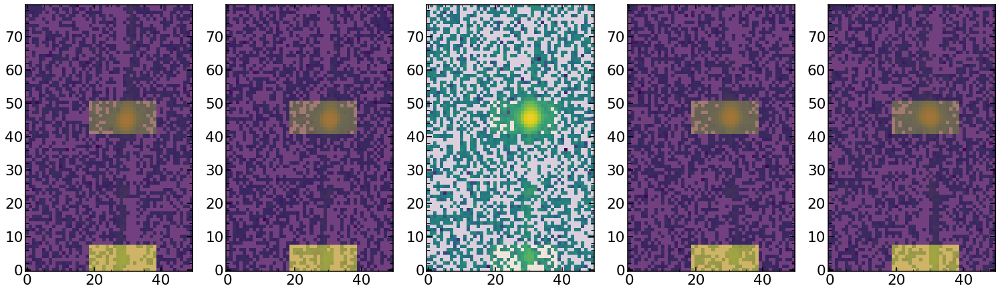

In [218]:
delta_y=-43
delta_y_primary=111
delta_y_step=10
sci_image_primary_0_large=np.zeros((sci_image_0_large.shape))
sci_image_secondary_0_large=np.zeros((sci_image_0_large.shape))
sci_image_primary_0_large[delta_y_primary:delta_y_primary+delta_y_step,69:89]=1
sci_image_secondary_0_large[delta_y_primary+delta_y:delta_y_primary+delta_y_step+delta_y,69:89]=1

plt.figure(figsize=(26,10))
plt.subplot(1,5,1)
plt.imshow(sci_image_0_large[70:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[70:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[70:150,50:100],alpha=0.5)
plt.subplot(1,5,2)
plt.imshow(sci_image_1_large[70:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[70:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[70:150,50:100],alpha=0.5)
plt.subplot(1,5,3)
plt.imshow(sci_image_2_large[70:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[70:150,50:100],alpha=0.1)
plt.imshow(sci_image_secondary_0_large[70:150,50:100],alpha=0.1)
plt.subplot(1,5,4)
plt.imshow(sci_image_3_large[70:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[70:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[70:150,50:100],alpha=0.5)
plt.subplot(1,5,5)
plt.imshow(sci_image_4_large[70:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[70:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[70:150,50:100],alpha=0.5)

In [219]:
list_of_ratio_primary_secondary=[]
list_of_delta_y_primary_secondary=[]

for sci_image in [sci_image_0_large,sci_image_1_large,sci_image_2_large,sci_image_3_large,sci_image_4_large]:
    sci_image_primary_image=sci_image[delta_y_primary:delta_y_primary+delta_y_step,69:89]
    sci_image_secondary_image=sci_image[delta_y_primary+delta_y:delta_y_primary+delta_y_step+delta_y,69:89]

    ratio_primary_secondary=np.sum(sci_image_secondary_image)/np.sum(sci_image_primary_image)
    delta_y_primary_secondary=delta_y+find_centroid_of_flux(sci_image_secondary_image)[1]-find_centroid_of_flux(sci_image_primary_image)[1]

    list_of_ratio_primary_secondary.append(ratio_primary_secondary)
    list_of_delta_y_primary_secondary.append(delta_y_primary_secondary)
print(list_of_ratio_primary_secondary)
print(list_of_delta_y_primary_secondary)

print(np.mean(list_of_ratio_primary_secondary))
print(np.mean(list_of_delta_y_primary_secondary))

[0.004564308, 0.006312429, 0.0074308827, 0.0067787375, 0.004237623]
[-40.659168714056435, -40.78165635710371, -41.3224549260222, -41.74700666181795, -39.000851349851665]
0.005864796
-40.70222760177039


### focus - HgAr line at 696?

In [24]:
finalHgAr[finalHgAr['wavelength']=='690.9346']

,fiber,xc,yc,wavelength,close,lamp,xc_effective,old_index_approx,superold_index_approx
0,2,69,808,690.9346,0,HgAr,69,0,nan
12,63,461,794,690.9346,0,HgAr,461,12,nan
24,192,845,785,690.9346,0,HgAr,845,24,nan
36,255,1222,777,690.9346,0,HgAr,1222,48,nan
48,339,1610,772,690.9346,0,HgAr,1610,72,nan
60,401,1992,771,690.9346,0,HgAr,1992,84,nan
72,464,2440,772,690.9346,0,HgAr,2509,120,nan
84,525,2828,776,690.9346,0,HgAr,2897,144,nan
96,587,3626,796,690.9346,0,HgAr,3695,168,nan
108,650,4006,809,690.9346,0,HgAr,4075,180,nan


In [30]:
date='Dec04'
obs=21346+54
obs_int=int(obs)
arc='HgAr'

single_number_0=12
single_number_1=24
single_number_2=48
single_number_3=84
single_number_4=96
sci_image_0_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_0)+str(arc)+'_Stacked_large.npy')
sci_image_1_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_1)+str(arc)+'_Stacked_large.npy')
sci_image_2_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_2)+str(arc)+'_Stacked_large.npy')
sci_image_3_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_3)+str(arc)+'_Stacked_large.npy')
sci_image_4_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_4)+str(arc)+'_Stacked_large.npy')

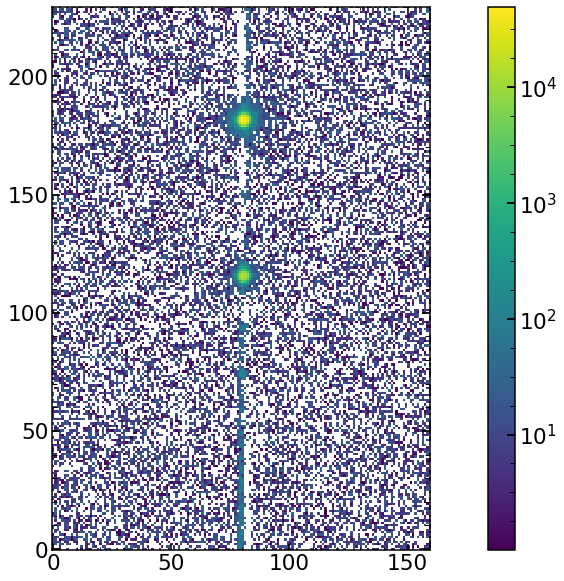

In [31]:
plt.figure(figsize=(26,10))
plt.imshow(sci_image_2_large,norm=LogNorm(),vmin=1)
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

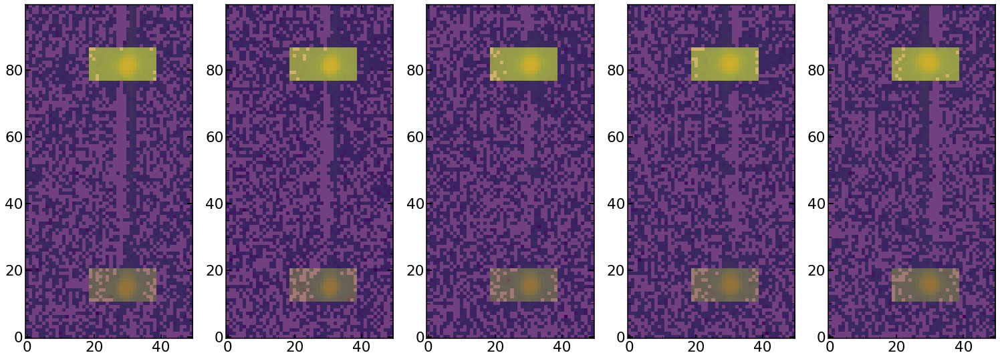

In [41]:
delta_y=66
delta_y_primary=111
delta_y_step=10
sci_image_primary_0_large=np.zeros((sci_image_0_large.shape))
sci_image_secondary_0_large=np.zeros((sci_image_0_large.shape))
sci_image_primary_0_large[delta_y_primary:delta_y_primary+delta_y_step,69:89]=1
sci_image_secondary_0_large[delta_y_primary+delta_y:delta_y_primary+delta_y_step+delta_y,69:89]=1

plt.figure(figsize=(26,10))
plt.subplot(1,5,1)
plt.imshow(sci_image_0_large[100:200,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[100:200,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[100:200,50:100],alpha=0.5)
plt.subplot(1,5,2)
plt.imshow(sci_image_1_large[100:200,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[100:200,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[100:200,50:100],alpha=0.5)
plt.subplot(1,5,3)
plt.imshow(sci_image_2_large[100:200,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[100:200,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[100:200,50:100],alpha=0.5)
plt.subplot(1,5,4)
plt.imshow(sci_image_3_large[100:200,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[100:200,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[100:200,50:100],alpha=0.5)
plt.subplot(1,5,5)
plt.imshow(sci_image_4_large[100:200,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[100:200,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[100:200,50:100],alpha=0.5)

In [42]:
list_of_ratio_primary_secondary=[]
list_of_delta_y_primary_secondary=[]

for sci_image in [sci_image_0_large,sci_image_1_large,sci_image_2_large,sci_image_3_large,sci_image_4_large]:
    sci_image_primary_image=sci_image[delta_y_primary:delta_y_primary+delta_y_step,69:89]
    sci_image_secondary_image=sci_image[delta_y_primary+delta_y:delta_y_primary+delta_y_step+delta_y,69:89]

    ratio_primary_secondary=np.sum(sci_image_secondary_image)/np.sum(sci_image_primary_image)
    delta_y_primary_secondary=delta_y+find_centroid_of_flux(sci_image_secondary_image)[1]-find_centroid_of_flux(sci_image_primary_image)[1]

    list_of_ratio_primary_secondary.append(ratio_primary_secondary)
    list_of_delta_y_primary_secondary.append(delta_y_primary_secondary)
print(list_of_ratio_primary_secondary)
print(list_of_delta_y_primary_secondary)

print(np.mean(list_of_ratio_primary_secondary))
print(np.mean(list_of_delta_y_primary_secondary))

[3.3526447, 3.309088, 3.2582536, 3.2342448, 3.3244138]
[66.24196250886682, 66.09688650767663, 65.95850507595304, 65.98993621316995, 66.23113407046499]
3.2957292
66.10368487522629


### focus  - HgAr line at 706.89

In [499]:
finalHgAr_May2019[finalHgAr_May2019['wavelength']=='706.8989']

,fiber,xc,yc,wavelength,close,lamp,xc_effective,old_index_approx,superold_index_approx
2,2,70,992,706.8989,0,HgAr,70,2,nan
14,63,461,977,706.8989,0,HgAr,461,14,nan
26,192,845,968,706.8989,0,HgAr,845,26,nan
38,255,1223,960,706.8989,0,HgAr,1223,50,nan
50,339,1610,955,706.8989,0,HgAr,1610,74,nan
62,401,1992,952,706.8989,0,HgAr,1992,86,nan
74,464,2440,955,706.8989,0,HgAr,2509,122,nan
86,525,2828,959,706.8989,0,HgAr,2897,146,nan
98,587,3625,978,706.8989,0,HgAr,3694,170,nan
110,650,4005,992,706.8989,0,HgAr,4074,182,nan


In [472]:
single_number_0=2
single_number_1=26
single_number_2=50
single_number_3=86
single_number_4=110
sci_image_0_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int_0)+str(single_number_0)+str(arc)+'_Stacked_large.npy')
sci_image_1_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int_0)+str(single_number_1)+str(arc)+'_Stacked_large.npy')
sci_image_2_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int_0)+str(single_number_2)+str(arc)+'_Stacked_large.npy')
sci_image_3_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int_0)+str(single_number_3)+str(arc)+'_Stacked_large.npy')
sci_image_4_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int_0)+str(single_number_4)+str(arc)+'_Stacked_large.npy')

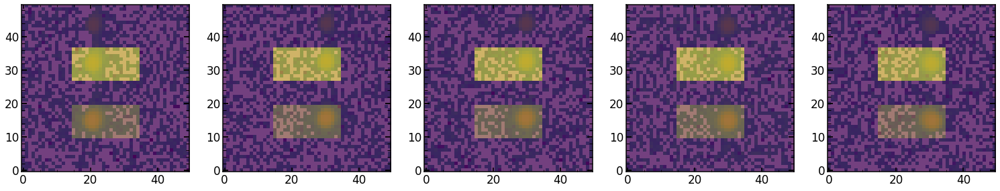

In [487]:
# secondary seems to be Mercury line at 708.3854

delta_y=17
delta_y_primary=110
delta_y_step=10
sci_image_primary_0_large=np.zeros((sci_image_0_large.shape))
sci_image_secondary_0_large=np.zeros((sci_image_0_large.shape))
sci_image_primary_0_large[delta_y_primary:delta_y_primary+delta_y_step,65:85]=1
sci_image_secondary_0_large[delta_y_primary+delta_y:delta_y_primary+delta_y_step+delta_y,65:85]=1

plt.figure(figsize=(26,10))
plt.subplot(1,5,1)
plt.imshow(sci_image_0_large[100:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[100:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[100:150,50:100],alpha=0.5)
plt.subplot(1,5,2)
plt.imshow(sci_image_1_large[100:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[100:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[100:150,50:100],alpha=0.5)
plt.subplot(1,5,3)
plt.imshow(sci_image_2_large[100:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[100:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[100:150,50:100],alpha=0.5)
plt.subplot(1,5,4)
plt.imshow(sci_image_3_large[100:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[100:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[100:150,50:100],alpha=0.5)
plt.subplot(1,5,5)
plt.imshow(sci_image_4_large[100:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[100:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[100:150,50:100],alpha=0.5)

In [498]:
list_of_ratio_primary_secondary=[]
list_of_delta_y_primary_secondary=[]

for sci_image in [sci_image_0_large,sci_image_1_large,sci_image_2_large,sci_image_3_large,sci_image_4_large]:
    sci_image_primary_image=sci_image[delta_y_primary:delta_y_primary+delta_y_step,65:85]
    sci_image_secondary_image=sci_image[delta_y_primary+delta_y:delta_y_primary+delta_y_step+delta_y,65:85]

    ratio_primary_secondary=np.sum(sci_image_secondary_image)/np.sum(sci_image_primary_image)
    delta_y_primary_secondary=delta_y+find_centroid_of_flux(sci_image_secondary_image)[1]-find_centroid_of_flux(sci_image_primary_image)[1]

    list_of_ratio_primary_secondary.append(ratio_primary_secondary)
    list_of_delta_y_primary_secondary.append(delta_y_primary_secondary)
print(list_of_ratio_primary_secondary)
print(list_of_delta_y_primary_secondary)

print(np.mean(list_of_ratio_primary_secondary))
print(np.mean(list_of_delta_y_primary_secondary))

[0.26887894, 0.2672378, 0.26668364, 0.27035138, 0.2668146]
[16.98124759265093, 16.928365818916042, 16.894568224846005, 16.925515867507357, 16.942306341765864]
0.26799327
16.934400769137238


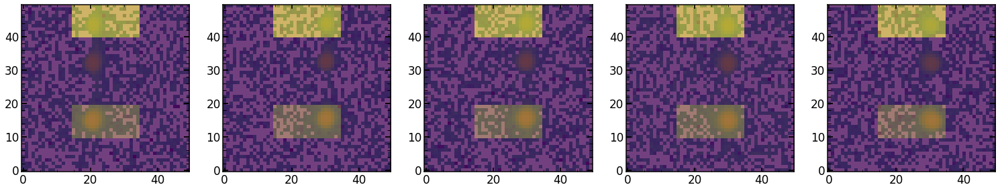

In [502]:
# additional secondary is a Mercury line at 709.3815

delta_y=30
delta_y_primary=110
delta_y_step=10
sci_image_primary_0_large=np.zeros((sci_image_0_large.shape))
sci_image_secondary_0_large=np.zeros((sci_image_0_large.shape))
sci_image_primary_0_large[delta_y_primary:delta_y_primary+delta_y_step,65:85]=1
sci_image_secondary_0_large[delta_y_primary+delta_y:delta_y_primary+delta_y_step+delta_y,65:85]=1

plt.figure(figsize=(26,10))
plt.subplot(1,5,1)
plt.imshow(sci_image_0_large[100:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[100:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[100:150,50:100],alpha=0.5)
plt.subplot(1,5,2)
plt.imshow(sci_image_1_large[100:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[100:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[100:150,50:100],alpha=0.5)
plt.subplot(1,5,3)
plt.imshow(sci_image_2_large[100:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[100:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[100:150,50:100],alpha=0.5)
plt.subplot(1,5,4)
plt.imshow(sci_image_3_large[100:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[100:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[100:150,50:100],alpha=0.5)
plt.subplot(1,5,5)
plt.imshow(sci_image_4_large[100:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[100:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[100:150,50:100],alpha=0.5)

In [503]:
list_of_ratio_primary_secondary=[]
list_of_delta_y_primary_secondary=[]

for sci_image in [sci_image_0_large,sci_image_1_large,sci_image_2_large,sci_image_3_large,sci_image_4_large]:
    sci_image_primary_image=sci_image[delta_y_primary:delta_y_primary+delta_y_step,65:85]
    sci_image_secondary_image=sci_image[delta_y_primary+delta_y:delta_y_primary+delta_y_step+delta_y,65:85]

    ratio_primary_secondary=np.sum(sci_image_secondary_image)/np.sum(sci_image_primary_image)
    delta_y_primary_secondary=delta_y+find_centroid_of_flux(sci_image_secondary_image)[1]-find_centroid_of_flux(sci_image_primary_image)[1]

    list_of_ratio_primary_secondary.append(ratio_primary_secondary)
    list_of_delta_y_primary_secondary.append(delta_y_primary_secondary)
print(list_of_ratio_primary_secondary)
print(list_of_delta_y_primary_secondary)

print(np.mean(list_of_ratio_primary_secondary))
print(np.mean(list_of_delta_y_primary_secondary))

[0.0871306, 0.08725478, 0.087824374, 0.09202992, 0.08571394]
[28.327905141447033, 28.354683317472688, 28.249667876165823, 28.22836574931165, 28.48760033103349]
0.08799072
28.32964448308614


### focus  - HgAr line at 738.6248

In [43]:
finalHgAr_May2019[finalHgAr_May2019['wavelength']=='738.6248']

,fiber,xc,yc,wavelength,close,lamp,xc_effective,old_index_approx,superold_index_approx
4,2,72,1358,738.6248,0,HgAr,72,4,80.0
16,63,463,1342,738.6248,0,HgAr,463,16,81.0
28,192,846,1331,738.6248,0,HgAr,846,28,82.0
40,255,1223,1323,738.6248,0,HgAr,1223,52,82.0
52,339,1610,1318,738.6248,0,HgAr,1610,76,82.0
64,401,1992,1314,738.6248,0,HgAr,1992,88,83.0
76,464,2439,1318,738.6248,0,HgAr,2508,124,83.0
88,525,2827,1323,738.6248,0,HgAr,2896,148,84.0
100,587,3624,1342,738.6248,0,HgAr,3693,172,85.0
112,650,4003,1357,738.6248,0,HgAr,4072,184,85.0


In [52]:
single_number_0=16
single_number_1=28
single_number_2=52
single_number_3=88
single_number_4=100
sci_image_0_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_0)+str(arc)+'_Stacked_large.npy')
sci_image_1_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_1)+str(arc)+'_Stacked_large.npy')
sci_image_2_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_2)+str(arc)+'_Stacked_large.npy')
sci_image_3_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_3)+str(arc)+'_Stacked_large.npy')
sci_image_4_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_4)+str(arc)+'_Stacked_large.npy')

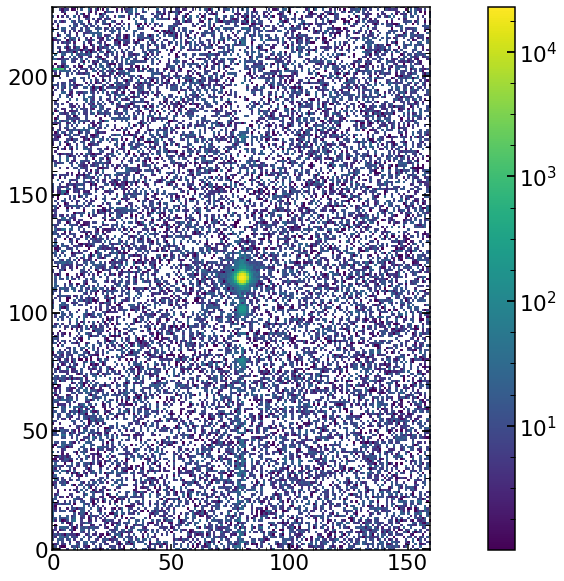

In [53]:
plt.figure(figsize=(26,10))
plt.imshow(sci_image_2_large,norm=LogNorm(),vmin=1)
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

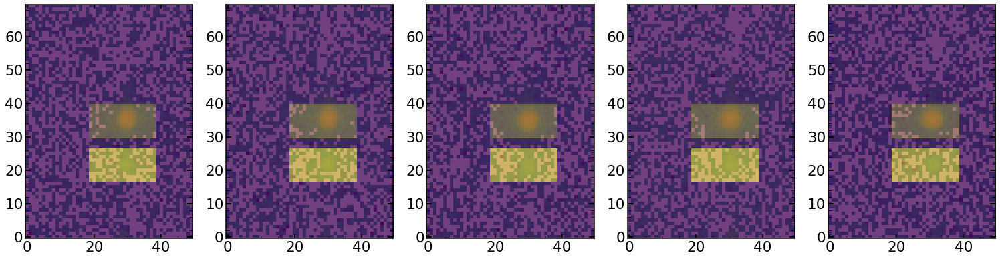

In [57]:
# secondary seems to be Argon line at 737.4149

delta_y=-13
delta_y_primary=110
delta_y_step=10
sci_image_primary_0_large=np.zeros((sci_image_0_large.shape))
sci_image_secondary_0_large=np.zeros((sci_image_0_large.shape))
sci_image_primary_0_large[delta_y_primary:delta_y_primary+delta_y_step,69:89]=1
sci_image_secondary_0_large[delta_y_primary+delta_y:delta_y_primary+delta_y_step+delta_y,69:89]=1

plt.figure(figsize=(26,10))
plt.subplot(1,5,1)
plt.imshow(sci_image_0_large[80:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[80:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[80:150,50:100],alpha=0.5)
plt.subplot(1,5,2)
plt.imshow(sci_image_1_large[80:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[80:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[80:150,50:100],alpha=0.5)
plt.subplot(1,5,3)
plt.imshow(sci_image_2_large[80:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[80:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[80:150,50:100],alpha=0.5)
plt.subplot(1,5,4)
plt.imshow(sci_image_3_large[80:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[80:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[80:150,50:100],alpha=0.5)
plt.subplot(1,5,5)
plt.imshow(sci_image_4_large[80:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[80:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[80:150,50:100],alpha=0.5)

In [58]:
list_of_ratio_primary_secondary=[]
list_of_delta_y_primary_secondary=[]

for sci_image in [sci_image_0_large,sci_image_1_large,sci_image_2_large,sci_image_3_large,sci_image_4_large]:
    sci_image_primary_image=sci_image[delta_y_primary:delta_y_primary+delta_y_step,69:89]
    sci_image_secondary_image=sci_image[delta_y_primary+delta_y:delta_y_primary+delta_y_step+delta_y,69:89]

    ratio_primary_secondary=np.sum(sci_image_secondary_image)/np.sum(sci_image_primary_image)
    delta_y_primary_secondary=delta_y+find_centroid_of_flux(sci_image_secondary_image)[1]-find_centroid_of_flux(sci_image_primary_image)[1]

    list_of_ratio_primary_secondary.append(ratio_primary_secondary)
    list_of_delta_y_primary_secondary.append(delta_y_primary_secondary)
print(list_of_ratio_primary_secondary)
print(list_of_delta_y_primary_secondary)

print(np.mean(list_of_ratio_primary_secondary))
print(np.mean(list_of_delta_y_primary_secondary))

[0.010191582, 0.011064574, 0.01144498, 0.010904425, 0.010553408]
[-13.294322553768797, -13.09216827788374, -13.345459523383616, -12.993811579894157, -12.963045295875837]
0.010831794
-13.13776144616123


### focus  - HgAr line at 922.7301

In [60]:
finalHgAr_May2019[finalHgAr_May2019['wavelength']=='922.7301']

,fiber,xc,yc,wavelength,close,lamp,xc_effective,old_index_approx,superold_index_approx
10,2,65,3517,922.7301,0,HgAr,65,10,10.0
22,63,458,3495,922.7301,0,HgAr,458,22,11.0
34,192,843,3481,922.7301,0,HgAr,843,34,12.0
46,255,1221,3471,922.7301,0,HgAr,1221,58,12.0
58,339,1609,3464,922.7301,0,HgAr,1609,82,12.0
70,401,1992,3460,922.7301,0,HgAr,1992,94,13.0
82,464,2440,3463,922.7301,0,HgAr,2509,130,13.0
94,525,2829,3469,922.7301,0,HgAr,2898,154,14.0
106,587,3629,3495,922.7301,0,HgAr,3698,178,15.0
118,650,4009,3515,922.7301,0,HgAr,4078,190,15.0


In [222]:
single_number_0=22
single_number_1=34
single_number_2=58
single_number_3=94
single_number_4=106
sci_image_0_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_0)+str(arc)+'_Stacked_large.npy')
sci_image_1_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_1)+str(arc)+'_Stacked_large.npy')
sci_image_2_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_2)+str(arc)+'_Stacked_large.npy')
sci_image_3_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_3)+str(arc)+'_Stacked_large.npy')
sci_image_4_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_4)+str(arc)+'_Stacked_large.npy')

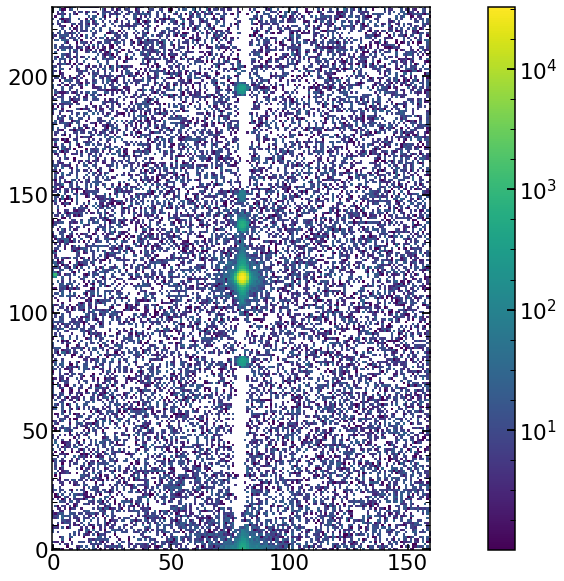

In [223]:
# secondary is Argon line at 929.4081

plt.figure(figsize=(26,10))
plt.imshow(sci_image_2_large,norm=LogNorm(),vmin=1)
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

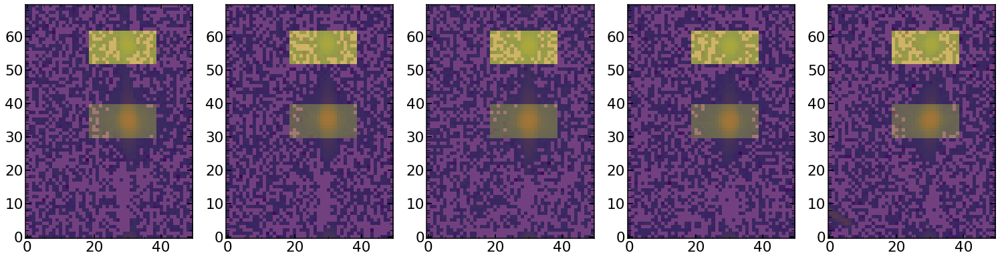

In [224]:
# secondary seems to be Argon line 

delta_y=22
delta_y_primary=110
delta_y_step=10
sci_image_primary_0_large=np.zeros((sci_image_0_large.shape))
sci_image_secondary_0_large=np.zeros((sci_image_0_large.shape))
sci_image_primary_0_large[delta_y_primary:delta_y_primary+delta_y_step,69:89]=1
sci_image_secondary_0_large[delta_y_primary+delta_y:delta_y_primary+delta_y_step+delta_y,69:89]=1

plt.figure(figsize=(26,10))
plt.subplot(1,5,1)
plt.imshow(sci_image_0_large[80:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[80:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[80:150,50:100],alpha=0.5)
plt.subplot(1,5,2)
plt.imshow(sci_image_1_large[80:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[80:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[80:150,50:100],alpha=0.5)
plt.subplot(1,5,3)
plt.imshow(sci_image_2_large[80:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[80:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[80:150,50:100],alpha=0.5)
plt.subplot(1,5,4)
plt.imshow(sci_image_3_large[80:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[80:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[80:150,50:100],alpha=0.5)
plt.subplot(1,5,5)
plt.imshow(sci_image_4_large[80:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[80:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[80:150,50:100],alpha=0.5)

In [225]:
list_of_ratio_primary_secondary=[]
list_of_delta_y_primary_secondary=[]

for sci_image in [sci_image_0_large,sci_image_1_large,sci_image_2_large,sci_image_3_large,sci_image_4_large]:
    sci_image_primary_image=sci_image[delta_y_primary:delta_y_primary+delta_y_step,69:89]
    sci_image_secondary_image=sci_image[delta_y_primary+delta_y:delta_y_primary+delta_y_step+delta_y,69:89]

    ratio_primary_secondary=np.sum(sci_image_secondary_image)/np.sum(sci_image_primary_image)
    delta_y_primary_secondary=delta_y+find_centroid_of_flux(sci_image_secondary_image)[1]-find_centroid_of_flux(sci_image_primary_image)[1]

    list_of_ratio_primary_secondary.append(ratio_primary_secondary)
    list_of_delta_y_primary_secondary.append(delta_y_primary_secondary)
print(list_of_ratio_primary_secondary)
print(list_of_delta_y_primary_secondary)

print(np.mean(list_of_ratio_primary_secondary))
print(np.mean(list_of_delta_y_primary_secondary))

[0.022490805, 0.02129712, 0.02296053, 0.0223562, 0.020349419]
[22.459189758804087, 22.41208844906154, 22.363538964830795, 22.360089573589857, 22.607238912264695]
0.021890815
22.440429131710196


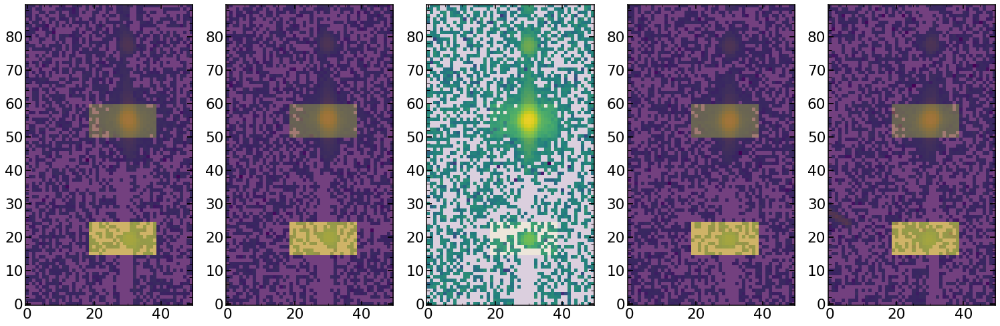

In [228]:
# secondary seems to 
delta_y=-35
delta_y_primary=110
delta_y_step=10
sci_image_primary_0_large=np.zeros((sci_image_0_large.shape))
sci_image_secondary_0_large=np.zeros((sci_image_0_large.shape))
sci_image_primary_0_large[delta_y_primary:delta_y_primary+delta_y_step,69:89]=1
sci_image_secondary_0_large[delta_y_primary+delta_y:delta_y_primary+delta_y_step+delta_y,69:89]=1

plt.figure(figsize=(26,10))
plt.subplot(1,5,1)
plt.imshow(sci_image_0_large[60:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[60:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[60:150,50:100],alpha=0.5)
plt.subplot(1,5,2)
plt.imshow(sci_image_1_large[60:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[60:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[60:150,50:100],alpha=0.5)
plt.subplot(1,5,3)
plt.imshow(sci_image_2_large[60:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[60:150,50:100],alpha=0.1)
plt.imshow(sci_image_secondary_0_large[60:150,50:100],alpha=0.1)
plt.subplot(1,5,4)
plt.imshow(sci_image_3_large[60:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[60:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[60:150,50:100],alpha=0.5)
plt.subplot(1,5,5)
plt.imshow(sci_image_4_large[60:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[60:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[60:150,50:100],alpha=0.5)

In [229]:
list_of_ratio_primary_secondary=[]
list_of_delta_y_primary_secondary=[]

for sci_image in [sci_image_0_large,sci_image_1_large,sci_image_2_large,sci_image_3_large,sci_image_4_large]:
    sci_image_primary_image=sci_image[delta_y_primary:delta_y_primary+delta_y_step,69:89]
    sci_image_secondary_image=sci_image[delta_y_primary+delta_y:delta_y_primary+delta_y_step+delta_y,69:89]

    ratio_primary_secondary=np.sum(sci_image_secondary_image)/np.sum(sci_image_primary_image)
    delta_y_primary_secondary=delta_y+find_centroid_of_flux(sci_image_secondary_image)[1]-find_centroid_of_flux(sci_image_primary_image)[1]

    list_of_ratio_primary_secondary.append(ratio_primary_secondary)
    list_of_delta_y_primary_secondary.append(delta_y_primary_secondary)
print(list_of_ratio_primary_secondary)
print(list_of_delta_y_primary_secondary)

print(np.mean(list_of_ratio_primary_secondary))
print(np.mean(list_of_delta_y_primary_secondary))

[0.008934599, 0.009133221, 0.009030306, 0.00868743, 0.009912819]
[-35.355544451502105, -35.11437964647387, -35.19766300391184, -35.00209324954053, -35.25590853188564]
0.009139675
-35.1851177766628


## for a single line - HgAr (close = 0.5)

In [12]:
finalHgAr[(finalHgAr['close']==0.5)&(finalHgAr['fiber']==339)]

NameError: name 'finalHgAr' is not defined

In [17]:
obs=21346+54
obs_int=int(obs)
arc='HgAr'

### focus - HgAr line at 763.743

In [21]:
finalHgAr_May2019[finalHgAr_May2019['wavelength']=='763.74286']

,fiber,xc,yc,wavelength,close,lamp,xc_effective,old_index_approx,superold_index_approx
5,2,73,1647,763.74286,0.5,HgAr,73,5,70.0
17,63,463,1631,763.74286,0.5,HgAr,463,17,71.0
29,192,846,1620,763.74286,0.5,HgAr,846,29,72.0
41,255,1224,1612,763.74286,0.5,HgAr,1224,53,72.0
53,339,1610,1606,763.74286,0.5,HgAr,1610,77,72.0
65,401,1992,1603,763.74286,0.5,HgAr,1992,89,73.0
77,464,2439,1606,763.74286,0.5,HgAr,2508,125,73.0
89,525,2827,1611,763.74286,0.5,HgAr,2896,149,74.0
101,587,3623,1632,763.74286,0.5,HgAr,3692,173,75.0
113,650,4002,1647,763.74286,0.5,HgAr,4071,185,75.0


In [22]:
single_number_0=17
single_number_1=29
single_number_2=53
single_number_3=89
single_number_4=101
sci_image_0_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_0)+str(arc)+'_Stacked_large.npy')
sci_image_1_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_1)+str(arc)+'_Stacked_large.npy')
sci_image_2_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_2)+str(arc)+'_Stacked_large.npy')
sci_image_3_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_3)+str(arc)+'_Stacked_large.npy')
sci_image_4_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_4)+str(arc)+'_Stacked_large.npy')

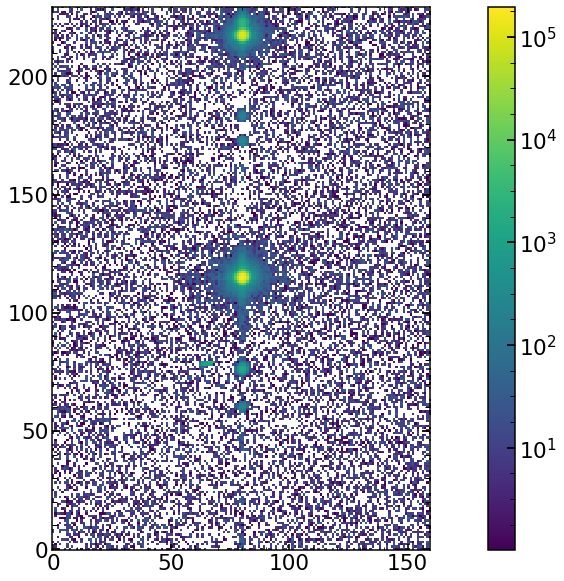

In [23]:
# secondary is Argon line at 

plt.figure(figsize=(26,10))
plt.imshow(sci_image_2_large,norm=LogNorm(),vmin=1)
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

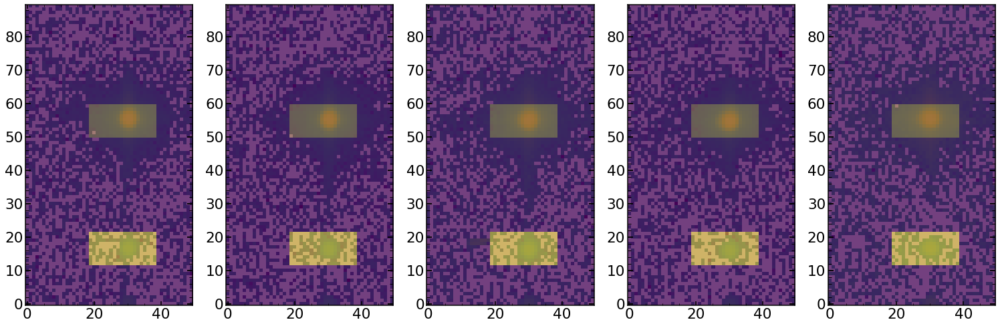

In [30]:
# secondary seems to be Argon line 

delta_y=-38
delta_y_primary=110
delta_y_step=+10
sci_image_primary_0_large=np.zeros((sci_image_0_large.shape))
sci_image_secondary_0_large=np.zeros((sci_image_0_large.shape))
sci_image_primary_0_large[delta_y_primary:delta_y_primary+delta_y_step,69:89]=1
sci_image_secondary_0_large[delta_y_primary+delta_y:delta_y_primary+delta_y_step+delta_y,69:89]=1

plt.figure(figsize=(26,10))
plt.subplot(1,5,1)
plt.imshow(sci_image_0_large[60:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[60:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[60:150,50:100],alpha=0.5)
plt.subplot(1,5,2)
plt.imshow(sci_image_1_large[60:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[60:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[60:150,50:100],alpha=0.5)
plt.subplot(1,5,3)
plt.imshow(sci_image_2_large[60:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[60:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[60:150,50:100],alpha=0.5)
plt.subplot(1,5,4)
plt.imshow(sci_image_3_large[60:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[60:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[60:150,50:100],alpha=0.5)
plt.subplot(1,5,5)
plt.imshow(sci_image_4_large[60:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[60:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[60:150,50:100],alpha=0.5)

In [31]:
list_of_ratio_primary_secondary=[]
list_of_delta_y_primary_secondary=[]

for sci_image in [sci_image_0_large,sci_image_1_large,sci_image_2_large,sci_image_3_large,sci_image_4_large]:
    sci_image_primary_image=sci_image[delta_y_primary:delta_y_primary+delta_y_step,69:89]
    sci_image_secondary_image=sci_image[delta_y_primary+delta_y:delta_y_primary+delta_y_step+delta_y,69:89]

    ratio_primary_secondary=np.sum(sci_image_secondary_image)/np.sum(sci_image_primary_image)
    delta_y_primary_secondary=delta_y+find_centroid_of_flux(sci_image_secondary_image)[1]-find_centroid_of_flux(sci_image_primary_image)[1]

    list_of_ratio_primary_secondary.append(ratio_primary_secondary)
    list_of_delta_y_primary_secondary.append(delta_y_primary_secondary)
print(list_of_ratio_primary_secondary)
print(list_of_delta_y_primary_secondary)

print(np.mean(list_of_ratio_primary_secondary))
print(np.mean(list_of_delta_y_primary_secondary))

[0.008565841, 0.008486793, 0.00840638, 0.007926836, 0.008185929]
[-38.62027657566131, -38.554937708542845, -38.53141859075385, -38.580510290867885, -38.66719276461951]
0.008314356
-38.59086718608908


### focus - HgAr line at 826.6699	

In [32]:
finalHgAr_May2019[finalHgAr_May2019['wavelength']=='826.6699']

,fiber,xc,yc,wavelength,close,lamp,xc_effective,old_index_approx,superold_index_approx
7,2,72,2377,826.6699,0.5,HgAr,72,7,40.0
19,63,463,2361,826.6699,0.5,HgAr,463,19,41.0
31,192,846,2350,826.6699,0.5,HgAr,846,31,42.0
43,255,1223,2340,826.6699,0.5,HgAr,1223,55,42.0
55,339,1610,2334,826.6699,0.5,HgAr,1610,79,42.0
67,401,1992,2332,826.6699,0.5,HgAr,1992,91,43.0
79,464,2439,2334,826.6699,0.5,HgAr,2508,127,43.0
91,525,2827,2339,826.6699,0.5,HgAr,2896,151,44.0
103,587,3623,2361,826.6699,0.5,HgAr,3692,175,45.0
115,650,4002,2379,826.6699,0.5,HgAr,4071,187,45.0


In [33]:
single_number_0=19
single_number_1=31
single_number_2=55
single_number_3=91
single_number_4=103
sci_image_0_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_0)+str(arc)+'_Stacked_large.npy')
sci_image_1_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_1)+str(arc)+'_Stacked_large.npy')
sci_image_2_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_2)+str(arc)+'_Stacked_large.npy')
sci_image_3_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_3)+str(arc)+'_Stacked_large.npy')
sci_image_4_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_4)+str(arc)+'_Stacked_large.npy')

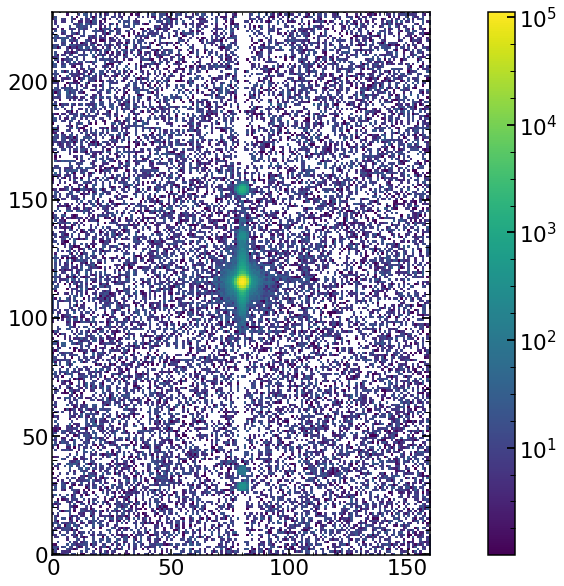

In [34]:
# secondary is Argon line at 

plt.figure(figsize=(26,10))
plt.imshow(sci_image_2_large,norm=LogNorm(),vmin=1)
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

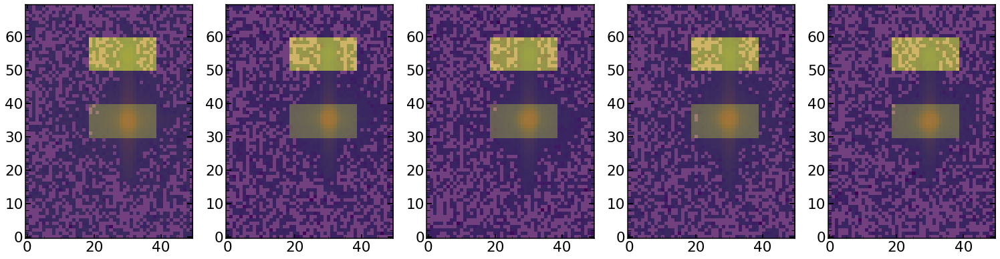

In [36]:
# secondary seems to be Argon line 

delta_y=20
delta_y_primary=110
delta_y_step=+10
sci_image_primary_0_large=np.zeros((sci_image_0_large.shape))
sci_image_secondary_0_large=np.zeros((sci_image_0_large.shape))
sci_image_primary_0_large[delta_y_primary:delta_y_primary+delta_y_step,69:89]=1
sci_image_secondary_0_large[delta_y_primary+delta_y:delta_y_primary+delta_y_step+delta_y,69:89]=1

plt.figure(figsize=(26,10))
plt.subplot(1,5,1)
plt.imshow(sci_image_0_large[80:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[80:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[80:150,50:100],alpha=0.5)
plt.subplot(1,5,2)
plt.imshow(sci_image_1_large[80:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[80:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[80:150,50:100],alpha=0.5)
plt.subplot(1,5,3)
plt.imshow(sci_image_2_large[80:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[80:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[80:150,50:100],alpha=0.5)
plt.subplot(1,5,4)
plt.imshow(sci_image_3_large[80:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[80:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[80:150,50:100],alpha=0.5)
plt.subplot(1,5,5)
plt.imshow(sci_image_4_large[80:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[80:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[80:150,50:100],alpha=0.5)

In [37]:
list_of_ratio_primary_secondary=[]
list_of_delta_y_primary_secondary=[]

for sci_image in [sci_image_0_large,sci_image_1_large,sci_image_2_large,sci_image_3_large,sci_image_4_large]:
    sci_image_primary_image=sci_image[delta_y_primary:delta_y_primary+delta_y_step,69:89]
    sci_image_secondary_image=sci_image[delta_y_primary+delta_y:delta_y_primary+delta_y_step+delta_y,69:89]

    ratio_primary_secondary=np.sum(sci_image_secondary_image)/np.sum(sci_image_primary_image)
    delta_y_primary_secondary=delta_y+find_centroid_of_flux(sci_image_secondary_image)[1]-find_centroid_of_flux(sci_image_primary_image)[1]

    list_of_ratio_primary_secondary.append(ratio_primary_secondary)
    list_of_delta_y_primary_secondary.append(delta_y_primary_secondary)
print(list_of_ratio_primary_secondary)
print(list_of_delta_y_primary_secondary)

print(np.mean(list_of_ratio_primary_secondary))
print(np.mean(list_of_delta_y_primary_secondary))

[0.004000686, 0.0044916766, 0.0042888215, 0.0046807006, 0.004041032]
[18.881556282632012, 18.67132927211724, 18.793176165546875, 18.865589835832033, 18.956026564354712]
0.004300583
18.833535624096577


### focus - HgAr line at 852.4029

In [38]:
finalHgAr_May2019[finalHgAr_May2019['wavelength']=='852.4029']

,fiber,xc,yc,wavelength,close,lamp,xc_effective,old_index_approx,superold_index_approx
8,2,72,2679,852.4029,0.5,HgAr,72,8,30.0
20,63,462,2662,852.4029,0.5,HgAr,462,20,31.0
32,192,846,2651,852.4029,0.5,HgAr,846,32,32.0
44,255,1223,2641,852.4029,0.5,HgAr,1223,56,32.0
56,339,1610,2635,852.4029,0.5,HgAr,1610,80,32.0
68,401,1992,2631,852.4029,0.5,HgAr,1992,92,33.0
80,464,2440,2634,852.4029,0.5,HgAr,2509,128,33.0
92,525,2828,2639,852.4029,0.5,HgAr,2897,152,34.0
104,587,3624,2662,852.4029,0.5,HgAr,3693,176,35.0
116,650,4003,2681,852.4029,0.5,HgAr,4072,188,35.0


In [39]:
single_number_0=20
single_number_1=32
single_number_2=56
single_number_3=92
single_number_4=104
sci_image_0_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_0)+str(arc)+'_Stacked_large.npy')
sci_image_1_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_1)+str(arc)+'_Stacked_large.npy')
sci_image_2_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_2)+str(arc)+'_Stacked_large.npy')
sci_image_3_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_3)+str(arc)+'_Stacked_large.npy')
sci_image_4_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_4)+str(arc)+'_Stacked_large.npy')

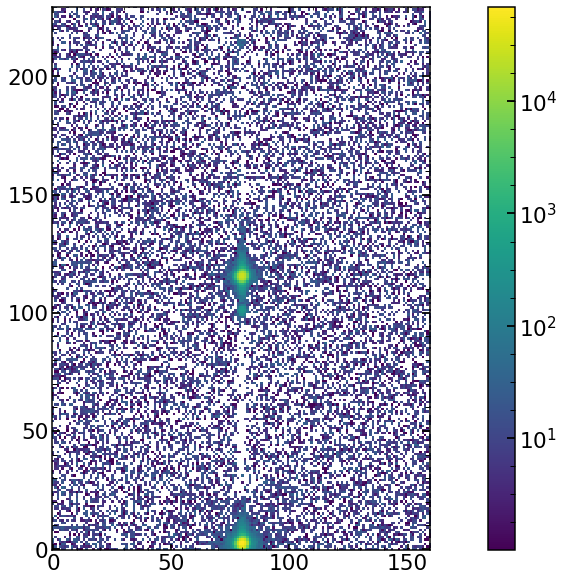

In [40]:
# secondary is Argon line at 

plt.figure(figsize=(26,10))
plt.imshow(sci_image_2_large,norm=LogNorm(),vmin=1)
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

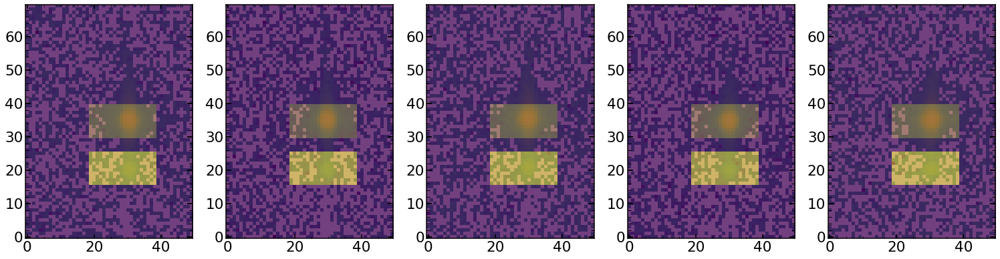

In [43]:
# secondary seems to be Argon line 

delta_y=-14
delta_y_primary=110
delta_y_step=+10
sci_image_primary_0_large=np.zeros((sci_image_0_large.shape))
sci_image_secondary_0_large=np.zeros((sci_image_0_large.shape))
sci_image_primary_0_large[delta_y_primary:delta_y_primary+delta_y_step,69:89]=1
sci_image_secondary_0_large[delta_y_primary+delta_y:delta_y_primary+delta_y_step+delta_y,69:89]=1

plt.figure(figsize=(26,10))
plt.subplot(1,5,1)
plt.imshow(sci_image_0_large[80:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[80:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[80:150,50:100],alpha=0.5)
plt.subplot(1,5,2)
plt.imshow(sci_image_1_large[80:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[80:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[80:150,50:100],alpha=0.5)
plt.subplot(1,5,3)
plt.imshow(sci_image_2_large[80:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[80:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[80:150,50:100],alpha=0.5)
plt.subplot(1,5,4)
plt.imshow(sci_image_3_large[80:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[80:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[80:150,50:100],alpha=0.5)
plt.subplot(1,5,5)
plt.imshow(sci_image_4_large[80:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[80:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[80:150,50:100],alpha=0.5)

In [44]:
list_of_ratio_primary_secondary=[]
list_of_delta_y_primary_secondary=[]

for sci_image in [sci_image_0_large,sci_image_1_large,sci_image_2_large,sci_image_3_large,sci_image_4_large]:
    sci_image_primary_image=sci_image[delta_y_primary:delta_y_primary+delta_y_step,69:89]
    sci_image_secondary_image=sci_image[delta_y_primary+delta_y:delta_y_primary+delta_y_step+delta_y,69:89]

    ratio_primary_secondary=np.sum(sci_image_secondary_image)/np.sum(sci_image_primary_image)
    delta_y_primary_secondary=delta_y+find_centroid_of_flux(sci_image_secondary_image)[1]-find_centroid_of_flux(sci_image_primary_image)[1]

    list_of_ratio_primary_secondary.append(ratio_primary_secondary)
    list_of_delta_y_primary_secondary.append(delta_y_primary_secondary)
print(list_of_ratio_primary_secondary)
print(list_of_delta_y_primary_secondary)

print(np.mean(list_of_ratio_primary_secondary))
print(np.mean(list_of_delta_y_primary_secondary))

[0.015857602, 0.014975853, 0.013874527, 0.015879488, 0.014446334]
[-14.396542203515388, -14.457928588034267, -14.278240498769938, -13.995601615636065, -14.14137781673433]
0.015006761
-14.253938144537997


## for a single line - Ne

In [74]:
arc='Ne'
obs=21550+54
obs_int=int(obs)
finalNe[(finalNe['close']=='0')&(finalNe['fiber']==339)]

,fiber,xc,yc,wavelength,close,lamp,xc_effective,old_index_approx,superold_index_approx
36,339,1612,315,650.84186,0,Ne,1612,54,nan
37,339,1612,345,653.4774,0,Ne,1612,55,nan
39,339,1613,511,668.01764,0,Ne,1613,57,nan
40,339,1613,555,671.9268,0,Ne,1613,58,nan
44,339,1613,1381,744.1276,0,Ne,1613,62,nan


### focus - Ne line at 650.84186

In [75]:
finalNe[finalNe['wavelength']=='650.84186']

,fiber,xc,yc,wavelength,close,lamp,xc_effective,old_index_approx,superold_index_approx
0,2,68,347,650.84186,0,Ne,68,0,nan
9,63,460,337,650.84186,0,Ne,460,9,nan
18,192,845,327,650.84186,0,Ne,845,18,nan
27,255,1223,320,650.84186,0,Ne,1223,36,nan
36,339,1612,315,650.84186,0,Ne,1612,54,nan
45,401,1995,315,650.84186,0,Ne,1995,63,nan
54,464,2443,309,650.84186,0,Ne,2512,90,nan
63,525,2833,318,650.84186,0,Ne,2902,108,nan
72,587,3632,336,650.84186,0,Ne,3701,126,nan
81,650,4013,348,650.84186,0,Ne,4082,135,nan


In [76]:
single_number_0=9
single_number_1=27
single_number_2=45
single_number_3=63
single_number_4=81
sci_image_0_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_0)+str(arc)+'_Stacked_large.npy')
sci_image_1_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_1)+str(arc)+'_Stacked_large.npy')
sci_image_2_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_2)+str(arc)+'_Stacked_large.npy')
sci_image_3_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_3)+str(arc)+'_Stacked_large.npy')
sci_image_4_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_4)+str(arc)+'_Stacked_large.npy')

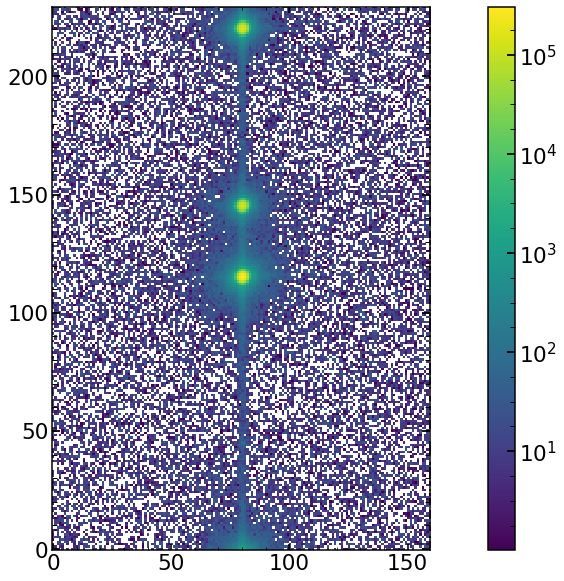

In [78]:
# secondary is Neon line at 653.4774

plt.figure(figsize=(26,10))
plt.imshow(sci_image_2_large,norm=LogNorm(),vmin=1)
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

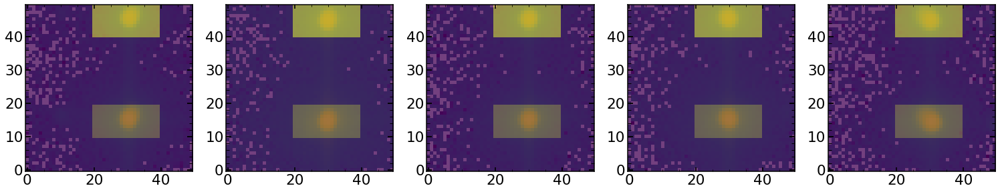

In [83]:
delta_y=30
delta_y_primary=110
delta_y_step=10
sci_image_primary_0_large=np.zeros((sci_image_0_large.shape))
sci_image_secondary_0_large=np.zeros((sci_image_0_large.shape))
sci_image_primary_0_large[delta_y_primary:delta_y_primary+delta_y_step,70:90]=1
sci_image_secondary_0_large[delta_y_primary+delta_y:delta_y_primary+delta_y_step+delta_y,70:90]=1

plt.figure(figsize=(26,10))
plt.subplot(1,5,1)
plt.imshow(sci_image_0_large[100:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[100:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[100:150,50:100],alpha=0.5)
plt.subplot(1,5,2)
plt.imshow(sci_image_1_large[100:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[100:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[100:150,50:100],alpha=0.5)
plt.subplot(1,5,3)
plt.imshow(sci_image_2_large[100:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[100:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[100:150,50:100],alpha=0.5)
plt.subplot(1,5,4)
plt.imshow(sci_image_3_large[100:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[100:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[100:150,50:100],alpha=0.5)
plt.subplot(1,5,5)
plt.imshow(sci_image_4_large[100:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[100:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[100:150,50:100],alpha=0.5)

In [84]:
list_of_ratio_primary_secondary=[]
list_of_delta_y_primary_secondary=[]

for sci_image in [sci_image_0_large,sci_image_1_large,sci_image_2_large,sci_image_3_large,sci_image_4_large]:
    sci_image_primary_image=sci_image[delta_y_primary:delta_y_primary+delta_y_step,70:90]
    sci_image_secondary_image=sci_image[delta_y_primary+delta_y:delta_y_primary+delta_y_step+delta_y,70:90]

    ratio_primary_secondary=np.sum(sci_image_secondary_image)/np.sum(sci_image_primary_image)
    delta_y_primary_secondary=delta_y+find_centroid_of_flux(sci_image_secondary_image)[1]-find_centroid_of_flux(sci_image_primary_image)[1]

    list_of_ratio_primary_secondary.append(ratio_primary_secondary)
    list_of_delta_y_primary_secondary.append(delta_y_primary_secondary)
print(list_of_ratio_primary_secondary)
print(list_of_delta_y_primary_secondary)

print(np.mean(list_of_ratio_primary_secondary))
print(np.mean(list_of_delta_y_primary_secondary))

[0.40068537, 0.4078732, 0.41304806, 0.40932104, 0.39937025]
[30.18991478939882, 30.05035650349429, 30.028648583762706, 30.049253231241245, 30.302552120057612]
0.4060596
30.124145045590932


### focus - Ne line at 668.01764

In [85]:
finalNe[finalNe['wavelength']=='668.01764']

,fiber,xc,yc,wavelength,close,lamp,xc_effective,old_index_approx,superold_index_approx
3,2,71,544,668.01764,0,Ne,71,3,nan
12,63,462,534,668.01764,0,Ne,462,12,nan
21,192,847,523,668.01764,0,Ne,847,21,nan
30,255,1224,516,668.01764,0,Ne,1224,39,nan
39,339,1613,511,668.01764,0,Ne,1613,57,nan
48,401,1995,511,668.01764,0,Ne,1995,66,nan
57,464,2443,510,668.01764,0,Ne,2512,93,nan
66,525,2832,514,668.01764,0,Ne,2901,111,nan
75,587,3631,534,668.01764,0,Ne,3700,129,nan
84,650,4011,547,668.01764,0,Ne,4080,138,nan


In [88]:
single_number_0=12
single_number_1=30
single_number_2=48
single_number_3=66
single_number_4=75
sci_image_0_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_0)+str(arc)+'_Stacked_large.npy')
sci_image_1_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_1)+str(arc)+'_Stacked_large.npy')
sci_image_2_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_2)+str(arc)+'_Stacked_large.npy')
sci_image_3_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_3)+str(arc)+'_Stacked_large.npy')
sci_image_4_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_4)+str(arc)+'_Stacked_large.npy')

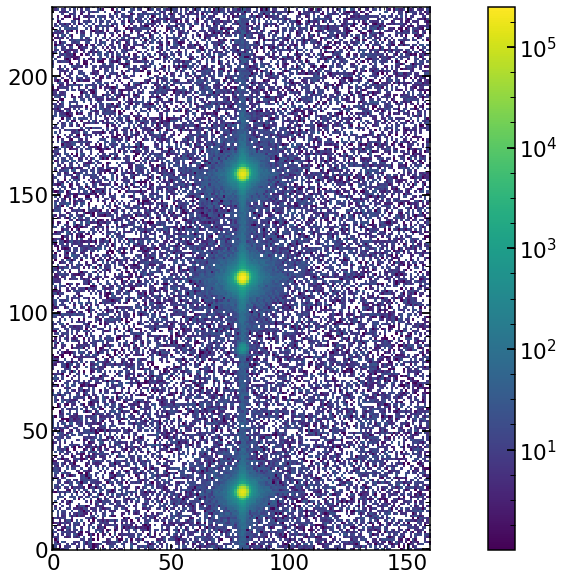

In [89]:
# secondary is Neon line at 671.88974

plt.figure(figsize=(26,10))
plt.imshow(sci_image_2_large,norm=LogNorm(),vmin=1)
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

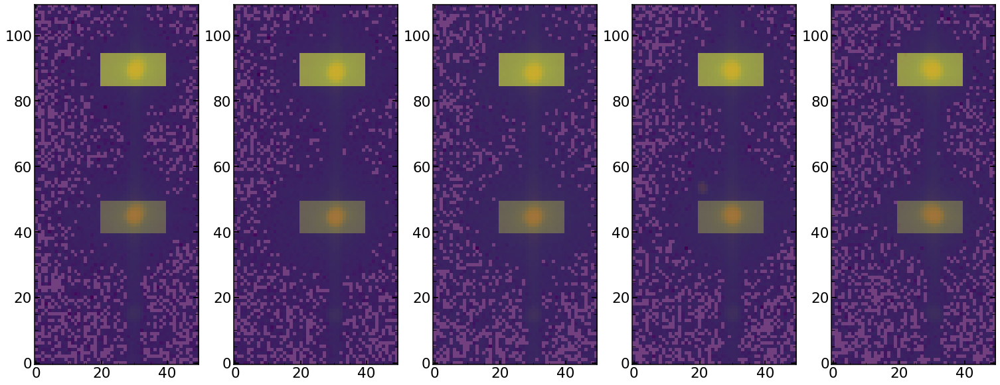

In [94]:
delta_y=45
delta_y_primary=110
delta_y_step=10
sci_image_primary_0_large=np.zeros((sci_image_0_large.shape))
sci_image_secondary_0_large=np.zeros((sci_image_0_large.shape))
sci_image_primary_0_large[delta_y_primary:delta_y_primary+delta_y_step,70:90]=1
sci_image_secondary_0_large[delta_y_primary+delta_y:delta_y_primary+delta_y_step+delta_y,70:90]=1

plt.figure(figsize=(26,10))
plt.subplot(1,5,1)
plt.imshow(sci_image_0_large[70:180,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[70:180,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[70:180,50:100],alpha=0.5)
plt.subplot(1,5,2)
plt.imshow(sci_image_1_large[70:180,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[70:180,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[70:180,50:100],alpha=0.5)
plt.subplot(1,5,3)
plt.imshow(sci_image_2_large[70:180,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[70:180,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[70:180,50:100],alpha=0.5)
plt.subplot(1,5,4)
plt.imshow(sci_image_3_large[70:180,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[70:180,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[70:180,50:100],alpha=0.5)
plt.subplot(1,5,5)
plt.imshow(sci_image_4_large[70:180,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[70:180,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[70:180,50:100],alpha=0.5)

In [95]:
list_of_ratio_primary_secondary=[]
list_of_delta_y_primary_secondary=[]

for sci_image in [sci_image_0_large,sci_image_1_large,sci_image_2_large,sci_image_3_large,sci_image_4_large]:
    sci_image_primary_image=sci_image[delta_y_primary:delta_y_primary+delta_y_step,70:90]
    sci_image_secondary_image=sci_image[delta_y_primary+delta_y:delta_y_primary+delta_y_step+delta_y,70:90]

    ratio_primary_secondary=np.sum(sci_image_secondary_image)/np.sum(sci_image_primary_image)
    delta_y_primary_secondary=delta_y+find_centroid_of_flux(sci_image_secondary_image)[1]-find_centroid_of_flux(sci_image_primary_image)[1]

    list_of_ratio_primary_secondary.append(ratio_primary_secondary)
    list_of_delta_y_primary_secondary.append(delta_y_primary_secondary)
print(list_of_ratio_primary_secondary)
print(list_of_delta_y_primary_secondary)

print(np.mean(list_of_ratio_primary_secondary))
print(np.mean(list_of_delta_y_primary_secondary))

[0.6775415, 0.66789585, 0.654238, 0.6662104, 0.6734316]
[44.3987385380109, 44.22638628092105, 43.9669750832775, 44.2198872294403, 44.401902830116484]
0.6678635
44.24277799235325


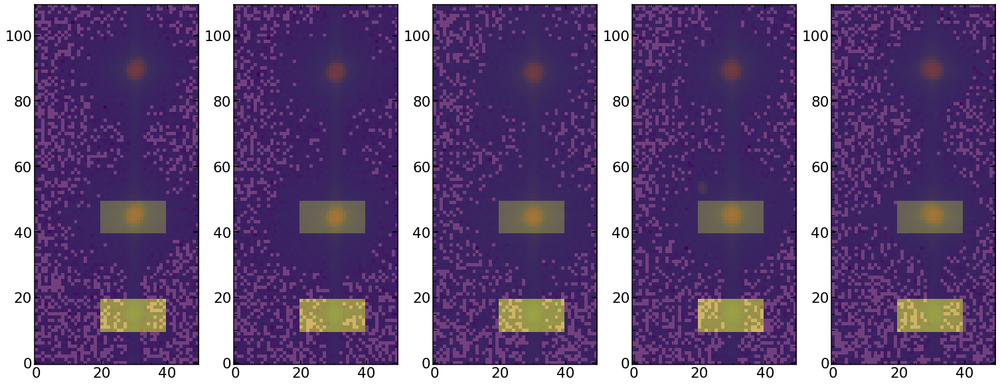

In [98]:
# 666.8733?


delta_y=-30
delta_y_primary=110
delta_y_step=10
sci_image_primary_0_large=np.zeros((sci_image_0_large.shape))
sci_image_secondary_0_large=np.zeros((sci_image_0_large.shape))
sci_image_primary_0_large[delta_y_primary:delta_y_primary+delta_y_step,70:90]=1
sci_image_secondary_0_large[delta_y_primary+delta_y:delta_y_primary+delta_y_step+delta_y,70:90]=1

plt.figure(figsize=(26,10))
plt.subplot(1,5,1)
plt.imshow(sci_image_0_large[70:180,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[70:180,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[70:180,50:100],alpha=0.5)
plt.subplot(1,5,2)
plt.imshow(sci_image_1_large[70:180,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[70:180,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[70:180,50:100],alpha=0.5)
plt.subplot(1,5,3)
plt.imshow(sci_image_2_large[70:180,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[70:180,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[70:180,50:100],alpha=0.5)
plt.subplot(1,5,4)
plt.imshow(sci_image_3_large[70:180,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[70:180,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[70:180,50:100],alpha=0.5)
plt.subplot(1,5,5)
plt.imshow(sci_image_4_large[70:180,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[70:180,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[70:180,50:100],alpha=0.5)

In [99]:
list_of_ratio_primary_secondary=[]
list_of_delta_y_primary_secondary=[]

for sci_image in [sci_image_0_large,sci_image_1_large,sci_image_2_large,sci_image_3_large,sci_image_4_large]:
    sci_image_primary_image=sci_image[delta_y_primary:delta_y_primary+delta_y_step,70:90]
    sci_image_secondary_image=sci_image[delta_y_primary+delta_y:delta_y_primary+delta_y_step+delta_y,70:90]

    ratio_primary_secondary=np.sum(sci_image_secondary_image)/np.sum(sci_image_primary_image)
    delta_y_primary_secondary=delta_y+find_centroid_of_flux(sci_image_secondary_image)[1]-find_centroid_of_flux(sci_image_primary_image)[1]

    list_of_ratio_primary_secondary.append(ratio_primary_secondary)
    list_of_delta_y_primary_secondary.append(delta_y_primary_secondary)
print(list_of_ratio_primary_secondary)
print(list_of_delta_y_primary_secondary)

print(np.mean(list_of_ratio_primary_secondary))
print(np.mean(list_of_delta_y_primary_secondary))

[0.003227287, 0.0031853125, 0.0032243715, 0.003167077, 0.0033036505]
[-30.113580912326874, -29.775254559772314, -29.82087190322245, -30.008669035381605, -30.15486505220484]
0.0032215393
-29.974648292581616


### focus - Ne line at 744.1276

In [100]:
finalNe[finalNe['wavelength']=='744.1276']

,fiber,xc,yc,wavelength,close,lamp,xc_effective,old_index_approx,superold_index_approx
8,2,76,1421,744.1276,0,Ne,76,8,nan
17,63,466,1408,744.1276,0,Ne,466,17,nan
26,192,849,1395,744.1276,0,Ne,849,26,nan
35,255,1225,1387,744.1276,0,Ne,1225,44,nan
44,339,1613,1381,744.1276,0,Ne,1613,62,nan
53,401,1995,1377,744.1276,0,Ne,1995,71,nan
62,464,2442,1383,744.1276,0,Ne,2511,98,nan
71,525,2830,1386,744.1276,0,Ne,2899,116,nan
80,587,3627,1405,744.1276,0,Ne,3696,134,nan
89,650,4005,1421,744.1276,0,Ne,4074,143,nan


In [101]:
single_number_0=8
single_number_1=26
single_number_2=44
single_number_3=62
single_number_4=80
sci_image_0_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_0)+str(arc)+'_Stacked_large.npy')
sci_image_1_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_1)+str(arc)+'_Stacked_large.npy')
sci_image_2_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_2)+str(arc)+'_Stacked_large.npy')
sci_image_3_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_3)+str(arc)+'_Stacked_large.npy')
sci_image_4_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_4)+str(arc)+'_Stacked_large.npy')

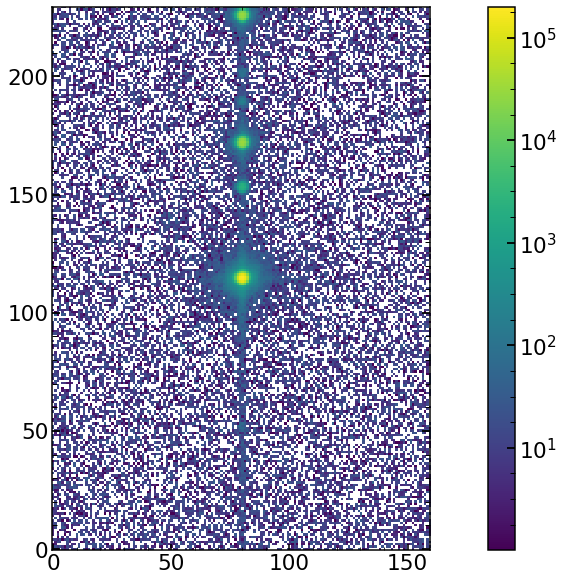

In [102]:
# secondary is Neon line at 747.44962

plt.figure(figsize=(26,10))
plt.imshow(sci_image_2_large,norm=LogNorm(),vmin=1)
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

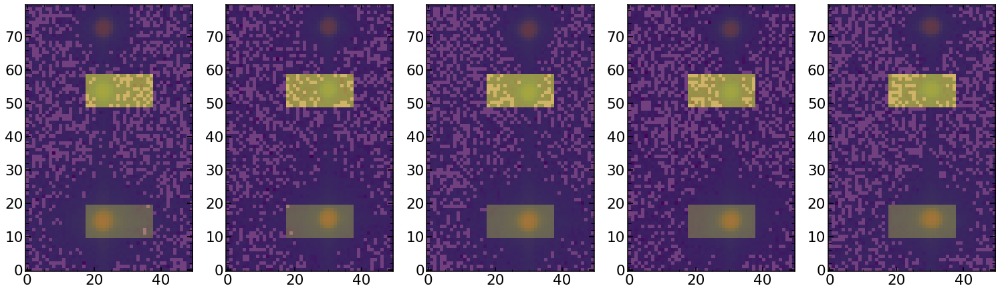

In [109]:
delta_y=39
delta_y_primary=110
delta_y_step=10
sci_image_primary_0_large=np.zeros((sci_image_0_large.shape))
sci_image_secondary_0_large=np.zeros((sci_image_0_large.shape))
sci_image_primary_0_large[delta_y_primary:delta_y_primary+delta_y_step,68:88]=1
sci_image_secondary_0_large[delta_y_primary+delta_y:delta_y_primary+delta_y_step+delta_y,68:88]=1

plt.figure(figsize=(26,10))
plt.subplot(1,5,1)
plt.imshow(sci_image_0_large[100:180,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[100:180,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[100:180,50:100],alpha=0.5)
plt.subplot(1,5,2)
plt.imshow(sci_image_1_large[100:180,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[100:180,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[100:180,50:100],alpha=0.5)
plt.subplot(1,5,3)
plt.imshow(sci_image_2_large[100:180,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[100:180,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[100:180,50:100],alpha=0.5)
plt.subplot(1,5,4)
plt.imshow(sci_image_3_large[100:180,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[100:180,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[100:180,50:100],alpha=0.5)
plt.subplot(1,5,5)
plt.imshow(sci_image_4_large[100:180,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[100:180,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[100:180,50:100],alpha=0.5)

In [110]:
list_of_ratio_primary_secondary=[]
list_of_delta_y_primary_secondary=[]

for sci_image in [sci_image_0_large,sci_image_1_large,sci_image_2_large,sci_image_3_large,sci_image_4_large]:
    sci_image_primary_image=sci_image[delta_y_primary:delta_y_primary+delta_y_step,68:88]
    sci_image_secondary_image=sci_image[delta_y_primary+delta_y:delta_y_primary+delta_y_step+delta_y,68:88]

    ratio_primary_secondary=np.sum(sci_image_secondary_image)/np.sum(sci_image_primary_image)
    delta_y_primary_secondary=delta_y+find_centroid_of_flux(sci_image_secondary_image)[1]-find_centroid_of_flux(sci_image_primary_image)[1]

    list_of_ratio_primary_secondary.append(ratio_primary_secondary)
    list_of_delta_y_primary_secondary.append(delta_y_primary_secondary)
print(list_of_ratio_primary_secondary)
print(list_of_delta_y_primary_secondary)

print(np.mean(list_of_ratio_primary_secondary))
print(np.mean(list_of_delta_y_primary_secondary))

[0.012319819, 0.0124150915, 0.012227796, 0.012271735, 0.01229036]
[38.713527770322685, 38.54367442710137, 38.543741086211014, 38.479428281127696, 38.56676175022761]
0.01230496
38.569426662998076


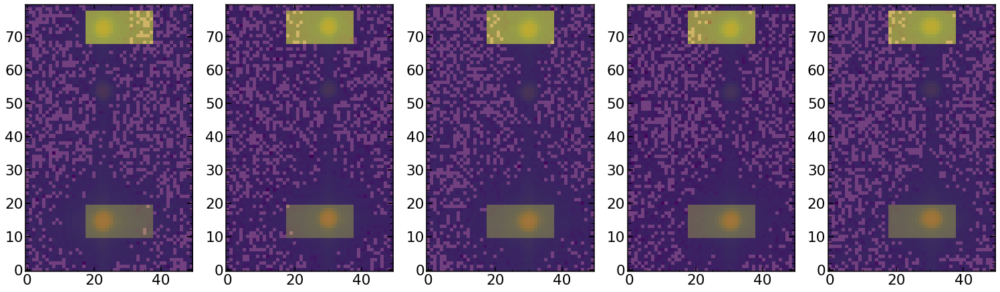

In [113]:
# another secondary at 749.09335 

delta_y=58
delta_y_primary=110
delta_y_step=10
sci_image_primary_0_large=np.zeros((sci_image_0_large.shape))
sci_image_secondary_0_large=np.zeros((sci_image_0_large.shape))
sci_image_primary_0_large[delta_y_primary:delta_y_primary+delta_y_step,68:88]=1
sci_image_secondary_0_large[delta_y_primary+delta_y:delta_y_primary+delta_y_step+delta_y,68:88]=1

plt.figure(figsize=(26,10))
plt.subplot(1,5,1)
plt.imshow(sci_image_0_large[100:180,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[100:180,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[100:180,50:100],alpha=0.5)
plt.subplot(1,5,2)
plt.imshow(sci_image_1_large[100:180,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[100:180,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[100:180,50:100],alpha=0.5)
plt.subplot(1,5,3)
plt.imshow(sci_image_2_large[100:180,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[100:180,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[100:180,50:100],alpha=0.5)
plt.subplot(1,5,4)
plt.imshow(sci_image_3_large[100:180,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[100:180,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[100:180,50:100],alpha=0.5)
plt.subplot(1,5,5)
plt.imshow(sci_image_4_large[100:180,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[100:180,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[100:180,50:100],alpha=0.5)

In [115]:
list_of_ratio_primary_secondary=[]
list_of_delta_y_primary_secondary=[]

for sci_image in [sci_image_0_large,sci_image_1_large,sci_image_2_large,sci_image_3_large,sci_image_4_large]:
    sci_image_primary_image=sci_image[delta_y_primary:delta_y_primary+delta_y_step,68:88]
    sci_image_secondary_image=sci_image[delta_y_primary+delta_y:delta_y_primary+delta_y_step+delta_y,68:88]

    ratio_primary_secondary=np.sum(sci_image_secondary_image)/np.sum(sci_image_primary_image)
    delta_y_primary_secondary=delta_y+find_centroid_of_flux(sci_image_secondary_image)[1]-find_centroid_of_flux(sci_image_primary_image)[1]

    list_of_ratio_primary_secondary.append(ratio_primary_secondary)
    list_of_delta_y_primary_secondary.append(delta_y_primary_secondary)
print(list_of_ratio_primary_secondary)
print(list_of_delta_y_primary_secondary)

print(np.mean(list_of_ratio_primary_secondary))
print(np.mean(list_of_delta_y_primary_secondary))

[0.16231471, 0.16285633, 0.16114663, 0.16249941, 0.16291122]
[57.65255844003522, 57.40910334733605, 57.31592284143452, 57.31567177948966, 57.512013876666956]
0.16234568
57.441054056992485


## for a single line -  Krypton

In [119]:
arc='Kr'
obs=21754+54
obs_int=int(obs)
finalKr[(finalKr['close']==0)&(finalKr['fiber']==339)]

,fiber,xc,yc,wavelength,close,lamp,xc_effective
16,339,1611,1858,785.48,0,Kr,1611
17,339,1611,2246,819.00,0,Kr,1611
18,339,1611,2931,877.68,0,Kr,1611


### focus  - Kr line at 785.48

In [121]:
finalKr[finalKr['wavelength']==785.48]

,fiber,xc,yc,wavelength,close,lamp,xc_effective
0,2,74,1902,785.48,0,Kr,74
4,63,465,1885,785.48,0,Kr,465
8,192,848,1873,785.48,0,Kr,848
12,255,1224,1863,785.48,0,Kr,1224
16,339,1611,1858,785.48,0,Kr,1611
20,401,1993,1856,785.48,0,Kr,1993
24,464,2440,1857,785.48,0,Kr,2509
28,525,2828,1863,785.48,0,Kr,2897
32,587,3624,1887,785.48,0,Kr,3693
36,650,4003,1903,785.48,0,Kr,4072


In [122]:
single_number_0=4
single_number_1=12
single_number_2=20
single_number_3=28
single_number_4=32
sci_image_0_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_0)+str(arc)+'_Stacked_large.npy')
sci_image_1_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_1)+str(arc)+'_Stacked_large.npy')
sci_image_2_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_2)+str(arc)+'_Stacked_large.npy')
sci_image_3_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_3)+str(arc)+'_Stacked_large.npy')
sci_image_4_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_4)+str(arc)+'_Stacked_large.npy')

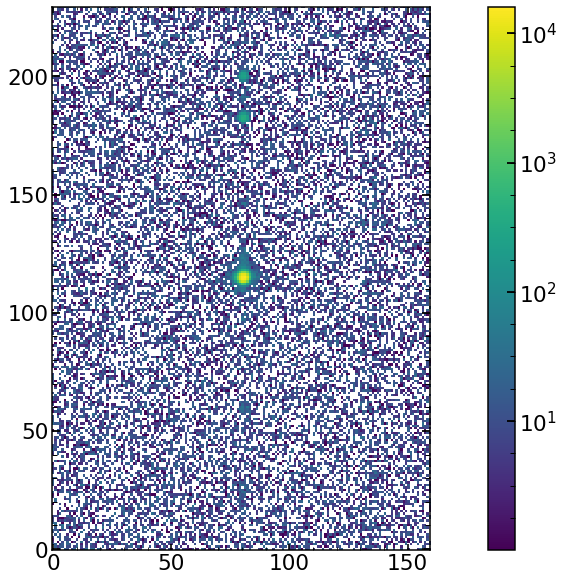

In [123]:
# secondary is Kr at 760.36384

plt.figure(figsize=(26,10))
plt.imshow(sci_image_2_large,norm=LogNorm(),vmin=1)
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

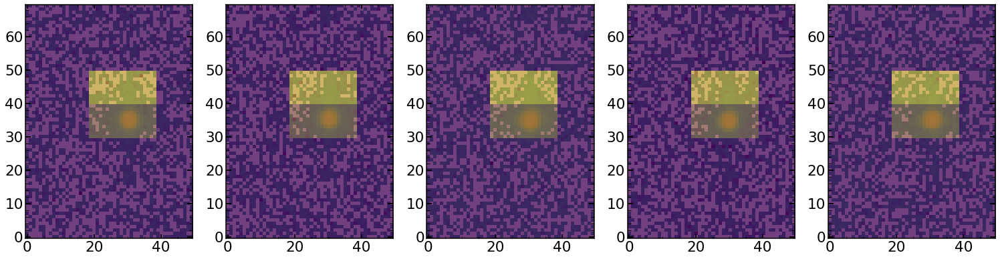

In [124]:
delta_y=10
delta_y_primary=110
delta_y_step=10
sci_image_primary_0_large=np.zeros((sci_image_0_large.shape))
sci_image_secondary_0_large=np.zeros((sci_image_0_large.shape))
sci_image_primary_0_large[delta_y_primary:delta_y_primary+delta_y_step,69:89]=1
sci_image_secondary_0_large[delta_y_primary+delta_y:delta_y_primary+delta_y_step+delta_y,69:89]=1

plt.figure(figsize=(26,10))
plt.subplot(1,5,1)
plt.imshow(sci_image_0_large[80:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[80:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[80:150,50:100],alpha=0.5)
plt.subplot(1,5,2)
plt.imshow(sci_image_1_large[80:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[80:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[80:150,50:100],alpha=0.5)
plt.subplot(1,5,3)
plt.imshow(sci_image_2_large[80:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[80:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[80:150,50:100],alpha=0.5)
plt.subplot(1,5,4)
plt.imshow(sci_image_3_large[80:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[80:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[80:150,50:100],alpha=0.5)
plt.subplot(1,5,5)
plt.imshow(sci_image_4_large[80:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[80:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[80:150,50:100],alpha=0.5)

In [125]:
list_of_ratio_primary_secondary=[]
list_of_delta_y_primary_secondary=[]

for sci_image in [sci_image_0_large,sci_image_1_large,sci_image_2_large,sci_image_3_large,sci_image_4_large]:
    sci_image_primary_image=sci_image[delta_y_primary:delta_y_primary+delta_y_step,69:89]
    sci_image_secondary_image=sci_image[delta_y_primary+delta_y:delta_y_primary+delta_y_step+delta_y,69:89]

    ratio_primary_secondary=np.sum(sci_image_secondary_image)/np.sum(sci_image_primary_image)
    delta_y_primary_secondary=delta_y+find_centroid_of_flux(sci_image_secondary_image)[1]-find_centroid_of_flux(sci_image_primary_image)[1]

    list_of_ratio_primary_secondary.append(ratio_primary_secondary)
    list_of_delta_y_primary_secondary.append(delta_y_primary_secondary)
print(list_of_ratio_primary_secondary)
print(list_of_delta_y_primary_secondary)

print(np.mean(list_of_ratio_primary_secondary))
print(np.mean(list_of_delta_y_primary_secondary))

[0.0077682347, 0.010016314, 0.008503774, 0.009766546, 0.012429135]
[7.690944129475071, 8.045496161871217, 7.536971524004502, 8.207569859655305, 8.044182481998206]
0.009696801
7.9050328314008595


### focus  - Kr line at 819.00

In [145]:
finalKr[finalKr['wavelength']==819.00]

,fiber,xc,yc,wavelength,close,lamp,xc_effective
1,2,74,2292,819.0,0,Kr,74
5,63,464,2274,819.0,0,Kr,464
9,192,848,2261,819.0,0,Kr,848
13,255,1223,2251,819.0,0,Kr,1223
17,339,1611,2246,819.0,0,Kr,1611
21,401,1993,2244,819.0,0,Kr,1993
25,464,2440,2245,819.0,0,Kr,2509
29,525,2828,2251,819.0,0,Kr,2897
33,587,3624,2275,819.0,0,Kr,3693
37,650,4003,2293,819.0,0,Kr,4072


In [146]:
single_number_0=5
single_number_1=13
single_number_2=21
single_number_3=29
single_number_4=33
sci_image_0_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_0)+str(arc)+'_Stacked_large.npy')
sci_image_1_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_1)+str(arc)+'_Stacked_large.npy')
sci_image_2_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_2)+str(arc)+'_Stacked_large.npy')
sci_image_3_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_3)+str(arc)+'_Stacked_large.npy')
sci_image_4_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_4)+str(arc)+'_Stacked_large.npy')

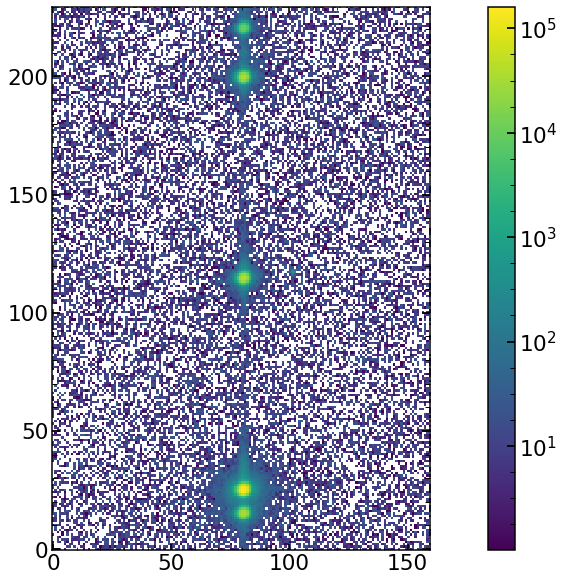

In [147]:
# secondary is Kr at 

plt.figure(figsize=(26,10))
plt.imshow(sci_image_2_large,norm=LogNorm(),vmin=1)
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

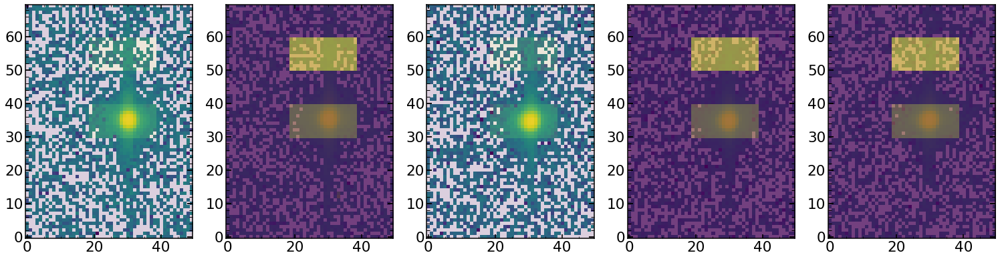

In [149]:
delta_y=+20
delta_y_primary=110
delta_y_step=10
sci_image_primary_0_large=np.zeros((sci_image_0_large.shape))
sci_image_secondary_0_large=np.zeros((sci_image_0_large.shape))
sci_image_primary_0_large[delta_y_primary:delta_y_primary+delta_y_step,69:89]=1
sci_image_secondary_0_large[delta_y_primary+delta_y:delta_y_primary+delta_y_step+delta_y,69:89]=1

plt.figure(figsize=(26,10))
plt.subplot(1,5,1)
plt.imshow(sci_image_0_large[80:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[80:150,50:100],alpha=0.1)
plt.imshow(sci_image_secondary_0_large[80:150,50:100],alpha=0.1)
plt.subplot(1,5,2)
plt.imshow(sci_image_1_large[80:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[80:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[80:150,50:100],alpha=0.5)
plt.subplot(1,5,3)
plt.imshow(sci_image_2_large[80:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[80:150,50:100],alpha=0.1)
plt.imshow(sci_image_secondary_0_large[80:150,50:100],alpha=0.1)
plt.subplot(1,5,4)
plt.imshow(sci_image_3_large[80:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[80:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[80:150,50:100],alpha=0.5)
plt.subplot(1,5,5)
plt.imshow(sci_image_4_large[80:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[80:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[80:150,50:100],alpha=0.5)

In [150]:
list_of_ratio_primary_secondary=[]
list_of_delta_y_primary_secondary=[]

for sci_image in [sci_image_0_large,sci_image_1_large,sci_image_2_large,sci_image_3_large,sci_image_4_large]:
    sci_image_primary_image=sci_image[delta_y_primary:delta_y_primary+delta_y_step,69:89]
    sci_image_secondary_image=sci_image[delta_y_primary+delta_y:delta_y_primary+delta_y_step+delta_y,69:89]

    ratio_primary_secondary=np.sum(sci_image_secondary_image)/np.sum(sci_image_primary_image)
    delta_y_primary_secondary=delta_y+find_centroid_of_flux(sci_image_secondary_image)[1]-find_centroid_of_flux(sci_image_primary_image)[1]

    list_of_ratio_primary_secondary.append(ratio_primary_secondary)
    list_of_delta_y_primary_secondary.append(delta_y_primary_secondary)
print(list_of_ratio_primary_secondary)
print(list_of_delta_y_primary_secondary)

print(np.mean(list_of_ratio_primary_secondary))
print(np.mean(list_of_delta_y_primary_secondary))

[0.0025694468, 0.0028800333, 0.0031231926, 0.0034019777, 0.0027261763]
[19.345415741466304, 19.651918594890162, 19.999345449691667, 19.06604175998213, 19.503286657699142]
0.0029401656
19.513201640745883


### focus  - Kr line at 877.68

In [138]:
finalKr[finalKr['wavelength']==877.68]

,fiber,xc,yc,wavelength,close,lamp,xc_effective
2,2,71,2980,877.68,0,Kr,71
6,63,462,2962,877.68,0,Kr,462
10,192,846,2947,877.68,0,Kr,846
14,255,1223,2937,877.68,0,Kr,1223
18,339,1611,2931,877.68,0,Kr,1611
22,401,1993,2929,877.68,0,Kr,1993
26,464,2440,2930,877.68,0,Kr,2509
30,525,2828,2936,877.68,0,Kr,2897
34,587,3625,2963,877.68,0,Kr,3694
38,650,4005,2981,877.68,0,Kr,4074


In [151]:
single_number_0=6
single_number_1=14
single_number_2=22
single_number_3=30
single_number_4=34
sci_image_0_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_0)+str(arc)+'_Stacked_large.npy')
sci_image_1_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_1)+str(arc)+'_Stacked_large.npy')
sci_image_2_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_2)+str(arc)+'_Stacked_large.npy')
sci_image_3_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_3)+str(arc)+'_Stacked_large.npy')
sci_image_4_large=np.load(STAMPS_FOLDER+'sci'+str(obs_int)+str(single_number_4)+str(arc)+'_Stacked_large.npy')

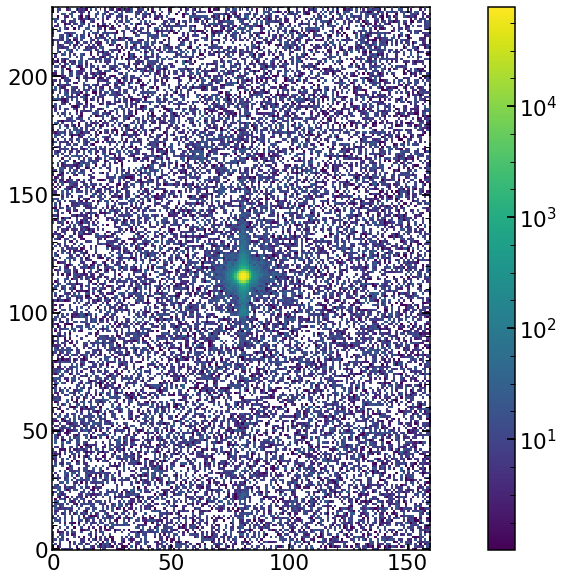

In [152]:
# secondary is Kr at 877.646 (and probably one more at 878.266)

plt.figure(figsize=(26,10))
plt.imshow(sci_image_2_large,norm=LogNorm(),vmin=1)
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

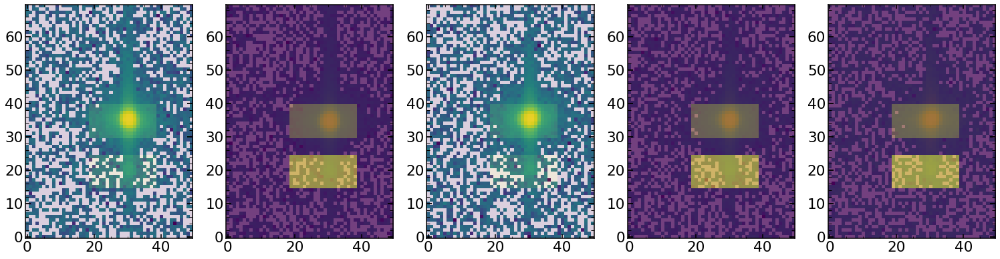

In [153]:
delta_y=-15
delta_y_primary=110
delta_y_step=10
sci_image_primary_0_large=np.zeros((sci_image_0_large.shape))
sci_image_secondary_0_large=np.zeros((sci_image_0_large.shape))
sci_image_primary_0_large[delta_y_primary:delta_y_primary+delta_y_step,69:89]=1
sci_image_secondary_0_large[delta_y_primary+delta_y:delta_y_primary+delta_y_step+delta_y,69:89]=1

plt.figure(figsize=(26,10))
plt.subplot(1,5,1)
plt.imshow(sci_image_0_large[80:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[80:150,50:100],alpha=0.1)
plt.imshow(sci_image_secondary_0_large[80:150,50:100],alpha=0.1)
plt.subplot(1,5,2)
plt.imshow(sci_image_1_large[80:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[80:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[80:150,50:100],alpha=0.5)
plt.subplot(1,5,3)
plt.imshow(sci_image_2_large[80:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[80:150,50:100],alpha=0.1)
plt.imshow(sci_image_secondary_0_large[80:150,50:100],alpha=0.1)
plt.subplot(1,5,4)
plt.imshow(sci_image_3_large[80:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[80:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[80:150,50:100],alpha=0.5)
plt.subplot(1,5,5)
plt.imshow(sci_image_4_large[80:150,50:100],norm=LogNorm())
plt.imshow(sci_image_primary_0_large[80:150,50:100],alpha=0.5)
plt.imshow(sci_image_secondary_0_large[80:150,50:100],alpha=0.5)

In [154]:
list_of_ratio_primary_secondary=[]
list_of_delta_y_primary_secondary=[]

for sci_image in [sci_image_0_large,sci_image_1_large,sci_image_2_large,sci_image_3_large,sci_image_4_large]:
    sci_image_primary_image=sci_image[delta_y_primary:delta_y_primary+delta_y_step,69:89]
    sci_image_secondary_image=sci_image[delta_y_primary+delta_y:delta_y_primary+delta_y_step+delta_y,69:89]

    ratio_primary_secondary=np.sum(sci_image_secondary_image)/np.sum(sci_image_primary_image)
    delta_y_primary_secondary=delta_y+find_centroid_of_flux(sci_image_secondary_image)[1]-find_centroid_of_flux(sci_image_primary_image)[1]

    list_of_ratio_primary_secondary.append(ratio_primary_secondary)
    list_of_delta_y_primary_secondary.append(delta_y_primary_secondary)
print(list_of_ratio_primary_secondary)
print(list_of_delta_y_primary_secondary)

print(np.mean(list_of_ratio_primary_secondary))
print(np.mean(list_of_delta_y_primary_secondary))

[0.0037569404, 0.004103507, 0.0033969372, 0.0037409274, 0.0037321209]
[-14.839991664848476, -14.357841225566464, -14.658418061719125, -14.463593006199535, -15.010684009230193]
0.0037460863
-14.666105593512757


## modifying final_arc

In [15]:
# https://github.com/Subaru-PFS/obs_pfs/blob/master/pfs/lineLists/ArCdHgKrNeXe.txt

with open('/Users/nevencaplar/Documents/PFS/ReducedData/Data_May_28/Dataframes/finalNe_May2019.pkl', 'rb') as f:
    finalNe_May2019=pickle.load(f)  
with open('/Users/nevencaplar/Documents/PFS/ReducedData/Data_May_28/Dataframes/finalHgAr_May2019.pkl', 'rb') as f:
    finalHgAr_May2019=pickle.load(f)  
with open('/Users/nevencaplar/Documents/PFS/ReducedData/Data_May_28/Dataframes/finalKr_May2019.pkl', 'rb') as f:
    finalKr_May2019=pickle.load(f)  
    
finalKr=finalKr_May2019
finalHgAr=finalHgAr_May2019
finalNe=finalNe_May2019

### HgAr

In [16]:
finalHgAr_Feb2020=np.copy(finalHgAr)

for i in range(4):
    finalHgAr_Feb2020=np.insert(finalHgAr_Feb2020, 7, 0, axis=1)

In [26]:
place = np.argwhere(finalHgAr_Feb2020[:,3]=='690.9346').flatten()
for i in place:
    # secondary offset
    finalHgAr_Feb2020[i][7]=-19.25
    # secondary ratio
    finalHgAr_Feb2020[i][8]=0.0034
    
place = np.argwhere(finalHgAr_Feb2020[:,3]=='690.9346').flatten()
for i in place:
    # secondary offset
    finalHgAr_Feb2020[i][9]=-40.7
    # secondary ratio
    finalHgAr_Feb2020[i][10]=0.006
    
place = np.argwhere(finalHgAr_Feb2020[:,3]=='706.8989').flatten()
for i in place:
    # secondary offset
    finalHgAr_Feb2020[i][7]=16.93
    # secondary ratio
    finalHgAr_Feb2020[i][8]=0.268
    
place = np.argwhere(finalHgAr_Feb2020[:,3]=='706.8989').flatten()
for i in place:
    # secondary offset
    finalHgAr_Feb2020[i][9]=28.33
    # secondary ratio
    finalHgAr_Feb2020[i][10]=0.088
    
place = np.argwhere(finalHgAr_Feb2020[:,3]=='738.6248').flatten()
for i in place:
    # secondary offset
    finalHgAr_Feb2020[i][7]=-13.14
    # secondary ratio
    finalHgAr_Feb2020[i][8]=0.011 
    
place = np.argwhere(finalHgAr_Feb2020[:,3]=='763.74286').flatten()
for i in place:
    # secondary offset
    finalHgAr_Feb2020[i][7]=-38.59
    # secondary ratio
    finalHgAr_Feb2020[i][8]=0.008   
   
place = np.argwhere(finalHgAr_Feb2020[:,3]=='826.6699').flatten()
for i in place:
    # secondary offset
    finalHgAr_Feb2020[i][7]=18.83
    # secondary ratio
    finalHgAr_Feb2020[i][8]=0.0043   

place = np.argwhere(finalHgAr_Feb2020[:,3]=='852.4029').flatten()
for i in place:
    # secondary offset
    finalHgAr_Feb2020[i][7]=-14.26
    # secondary ratio
    finalHgAr_Feb2020[i][8]=0.015
    
    
place = np.argwhere(finalHgAr_Feb2020[:,3]=='922.7301').flatten()
for i in place:
    # secondary offset
    finalHgAr_Feb2020[i][7]=22.44
    # secondary ratio
    finalHgAr_Feb2020[i][8]=0.022  
    
    
place = np.argwhere(finalHgAr_Feb2020[:,3]=='922.7301').flatten()
for i in place:
    # secondary offset
    finalHgAr_Feb2020[i][9]=-13.14
    # secondary ratio
    finalHgAr_Feb2020[i][10]=0.011

In [27]:
finalHgAr_Feb2020_dataset=pd.DataFrame({'fiber':finalHgAr_Feb2020[:,0],'xc':finalHgAr_Feb2020[:,1],'yc':finalHgAr_Feb2020[:,2],'wavelength':finalHgAr_Feb2020[:,3],'close':finalHgAr_Feb2020[:,4],\
                                     'lamp':finalHgAr_Feb2020[:,5],'xc_effective':finalHgAr_Feb2020[:,6],'second_offset':finalHgAr_Feb2020[:,7],'second_ratio':finalHgAr_Feb2020[:,8],\
                                      'second2_offset':finalHgAr_Feb2020[:,9], 'second2_ratio':finalHgAr_Feb2020[:,10]})

finalHgAr_Feb2020_dataset

,fiber,xc,yc,wavelength,close,lamp,xc_effective,second_offset,second_ratio,second2_offset,second2_ratio
0,2,69,808,690.9346,0,HgAr,69,-19.25,0.0034,-40.7,0.006
1,2,69,875,696.7261,1,HgAr,69,0,0,0,0
2,2,70,992,706.8989,0,HgAr,70,16.93,0.268,28.33,0.088
3,2,71,1229,727.47876,1,HgAr,71,0,0,0,0
4,2,72,1358,738.6248,0,HgAr,72,-13.14,0.011,0,0
...,...,...,...,...,...,...,...,...,...,...,...
115,650,4002,2379,826.6699,0.5,HgAr,4071,18.83,0.0043,0,0
116,650,4003,2681,852.4029,0.5,HgAr,4072,-14.26,0.015,0,0
117,650,4008,3393,912.5693,1,HgAr,4077,0,0,0,0
118,650,4009,3515,922.7301,0,HgAr,4078,22.44,0.022,-13.14,0.011


In [28]:
finalHgAr_Feb2020_dataset.loc[8]

fiber                    2
xc                      72
yc                    2679
wavelength        852.4029
close                  0.5
lamp                  HgAr
xc_effective            72
second_offset       -14.26
second_ratio         0.015
second2_offset           0
second2_ratio            0
Name: 8, dtype: object

In [29]:
finalHgAr_Feb2020_dataset.to_pickle("/Users/nevencaplar/Documents/PFS/ReducedData/Data_May_28/Dataframes/finalHgAr_Feb2020")

### Neon

In [519]:
finalNe_Feb2020=np.copy(finalNe)

for i in range(4):
    finalNe_Feb2020=np.insert(finalNe_Feb2020, 7, 0, axis=1)

In [520]:
finalNe_Feb2020[:,4]

array(['0', '-1', '1', '0', '-1', '1', '1', '1', '0', '0', '-1', '1', '0',
       '-1', '1', '1', '1', '0', '0', '-1', '1', '0', '-1', '1', '1', '1',
       '0', '0', '-1', '1', '0', '-1', '1', '1', '1', '0', '0', '-1', '1',
       '0', '-1', '1', '1', '1', '0', '0', '-1', '1', '0', '-1', '1', '1',
       '1', '0', '0', '-1', '1', '0', '-1', '1', '1', '1', '0', '0', '-1',
       '1', '0', '-1', '1', '1', '1', '0', '0', '-1', '1', '0', '-1', '1',
       '1', '1', '0', '0', '-1', '1', '0', '-1', '1', '1', '1', '0'],
      dtype=object)

In [522]:
place = np.argwhere(finalNe_Feb2020[:,3]=='650.84186').flatten()
for i in place:
    # secondary offset
    finalNe_Feb2020[i][7]=30.12
    # secondary ratio
    finalNe_Feb2020[i][8]=0.406
    
place = np.argwhere(finalNe_Feb2020[:,3]=='653.4774').flatten()
for i in place:
    # secondary offset
    finalNe_Feb2020[i][4]='-1'
    
place = np.argwhere(finalNe_Feb2020[:,3]=='668.01764').flatten()
for i in place:
    # secondary offset
    finalNe_Feb2020[i][7]=44.24
    # secondary ratio
    finalNe_Feb2020[i][8]=0.67
    
place = np.argwhere(finalNe_Feb2020[:,3]=='668.01764').flatten()
for i in place:
    # secondary offset
    finalNe_Feb2020[i][9]=-29.97
    # secondary ratio
    finalNe_Feb2020[i][10]=0.003
    
place = np.argwhere(finalNe_Feb2020[:,3]=='671.9268').flatten()
for i in place:
    # secondary offset
    finalNe_Feb2020[i][4]='-1'
    
place = np.argwhere(finalNe_Feb2020[:,3]=='744.1276').flatten()
for i in place:
    # secondary offset
    finalNe_Feb2020[i][7]=38.57
    # secondary ratio
    finalNe_Feb2020[i][8]=0.012
    
place = np.argwhere(finalNe_Feb2020[:,3]=='744.1276').flatten()
for i in place:
    # secondary offset
    finalNe_Feb2020[i][9]=57.44
    # secondary ratio
    finalNe_Feb2020[i][10]=0.162

In [523]:
finalNe_Feb2020_dataset=pd.DataFrame({'fiber':finalNe_Feb2020[:,0],'xc':finalNe_Feb2020[:,1],'yc':finalNe_Feb2020[:,2],'wavelength':finalNe_Feb2020[:,3],'close':finalNe_Feb2020[:,4],\
                                     'lamp':finalNe_Feb2020[:,5],'xc_effective':finalNe_Feb2020[:,6],'second_offset':finalNe_Feb2020[:,7],'second_ratio':finalNe_Feb2020[:,8],\
                                      'second2_offset':finalNe_Feb2020[:,9], 'second2_ratio':finalNe_Feb2020[:,10]})

finalNe_Feb2020_dataset

,fiber,xc,yc,wavelength,close,lamp,xc_effective,second_offset,second_ratio,second2_offset,second2_ratio
0,2,68,347,650.84186,0,Ne,68,30.12,0.406,0,0
1,2,69,377,653.4774,-1,Ne,69,0,0,0,0
2,2,69,453,660.0668,1,Ne,69,0,0,0,0
3,2,71,544,668.01764,0,Ne,71,44.24,0.67,-29.97,0.003
4,2,71,589,671.9268,-1,Ne,71,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...
85,650,4011,592,671.9268,-1,Ne,4080,0,0,0,0
86,650,4008,835,693.13116,1,Ne,4077,0,0,0,0
87,650,4007,1116,717.59015,1,Ne,4076,0,0,0,0
88,650,4006,1198,724.72437,1,Ne,4075,0,0,0,0


In [819]:
finalNe_Feb2020_dataset.to_pickle("/Users/nevencaplar/Documents/PFS/ReducedData/Data_May_28/Dataframes/finalNe_Feb2020")

### Krypton 

In [16]:
finalKr_Feb2020=np.copy(finalKr)

for i in range(4):
    finalKr_Feb2020=np.insert(finalKr_Feb2020, 7, 0, axis=1)

In [17]:

place = np.argwhere(finalKr_Feb2020[:,3]==785.48).flatten()
for i in place:
    # secondary offset
    finalKr_Feb2020[i][7]=8
    # secondary ratio
    finalKr_Feb2020[i][8]=0.01
    
place = np.argwhere(finalKr_Feb2020[:,3]==819.00).flatten()
for i in place:
    # secondary offset
    finalKr_Feb2020[i][7]=20
    # secondary ratio
    finalKr_Feb2020[i][8]=0.004
    
place = np.argwhere(finalKr_Feb2020[:,3]==877.68).flatten()
for i in place:
    # secondary offset
    finalKr_Feb2020[i][7]=-15
    # secondary ratio
    finalKr_Feb2020[i][8]=0.004
    
    # secondary offset
    finalKr_Feb2020[i][9]=10
    # secondary ratio
    finalKr_Feb2020[i][10]=0.003

In [18]:
finalKr.columns

Index(['fiber', 'xc', 'yc', 'wavelength', 'close', 'lamp', 'xc_effective'], dtype='object')

In [19]:
finalKr_Feb2020_dataset=pd.DataFrame({'fiber':finalKr_Feb2020[:,0],'xc':finalKr_Feb2020[:,1],'yc':finalKr_Feb2020[:,2],'wavelength':finalKr_Feb2020[:,3],'close':finalKr_Feb2020[:,4],\
                                     'lamp':finalKr_Feb2020[:,5],'xc_effective':finalKr_Feb2020[:,6],'second_offset':finalKr_Feb2020[:,7],'second_ratio':finalKr_Feb2020[:,8],\
                                      'second2_offset':finalKr_Feb2020[:,9], 'second2_ratio':finalKr_Feb2020[:,10]})

finalKr_Feb2020_dataset

,fiber,xc,yc,wavelength,close,lamp,xc_effective,second_offset,second_ratio,second2_offset,second2_ratio
0,2,74,1902,785.48,0,Kr,74,8,0.01,0,0
1,2,74,2292,819,0,Kr,74,20,0.004,0,0
2,2,71,2980,877.68,0,Kr,71,-15,0.004,10,0.003
3,2,70,3161,892.87,1,Kr,70,0,0,0,0
4,63,465,1885,785.48,0,Kr,465,8,0.01,0,0
5,63,464,2274,819,0,Kr,464,20,0.004,0,0
6,63,462,2962,877.68,0,Kr,462,-15,0.004,10,0.003
7,63,462,3141,892.87,1,Kr,462,0,0,0,0
8,192,848,1873,785.48,0,Kr,848,8,0.01,0,0
9,192,848,2261,819,0,Kr,848,20,0.004,0,0


In [820]:
finalKr_Feb2020_dataset.to_pickle("/Users/nevencaplar/Documents/PFS/ReducedData/Data_May_28/Dataframes/finalKr_Feb2020")

# Double simulating 

## init work

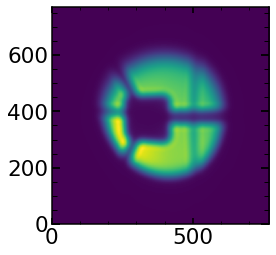

In [7]:
optPsf_cut_grating_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_grating_convolved.npy')
# run spot 1 from Dec04
plt.imshow(optPsf_cut_grating_convolved)

In [8]:
optPsf_cut_grating_convolved_2=np.copy(optPsf_cut_grating_convolved)
optPsf_cut_grating_convolved_second_image=np.zeros(optPsf_cut_grating_convolved.shape)

len(optPsf_cut_grating_convolved_2)

Dy2=170
Dx2=0

relative_flux=0.5

# optPsf_cut_grating_convolved_second_image[0:Dy2,:]=optPsf_cut_grating_convolved_2[len(optPsf_cut_grating_convolved_2)-Dy2:,:]*0.5

if Dy2>0:
    optPsf_cut_grating_convolved_second_image[Dy2:,:]=optPsf_cut_grating_convolved_2[0:len(optPsf_cut_grating_convolved_2)-Dy2,:]*relative_flux
if Dy2<0:
    optPsf_cut_grating_convolved_second_image[:Dy2,:]=optPsf_cut_grating_convolved_2[-Dy2:len(optPsf_cut_grating_convolved_2),:]*relative_flux

final_image=optPsf_cut_grating_convolved+optPsf_cut_grating_convolved_second_image

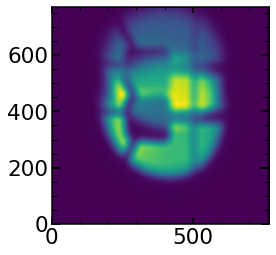

In [9]:
plt.imshow(final_image)

In [19]:
second_image_fitting_res=[]
for i in range(-len(single_realization_1d),len(single_realization_1d)):
    for ratio in np.arange(0.05,0.7,0.01):
        if i >0:
            single_realization_1d_shifted=ratio*np.concatenate((single_realization_1d[i:len(single_realization_1d)],np.zeros(i,)))
        else:
            single_realization_1d_shifted=ratio*np.concatenate((np.zeros(-i,),single_realization_1d[-i:]))

        complete_realization_1d=single_realization_1d+ratio*single_realization_1d_shifted
        complete_realization_1d_renormalized=complete_realization_1d*np.sum(sci_image_1d)/np.sum(complete_realization_1d)
        second_image_fitting_res.append([i,ratio,np.mean((sci_image_1d-complete_realization_1d_renormalized)**2/var_image_1d)])
        
second_image_fitting_res=np.array(second_image_fitting_res)

In [31]:
second_image_fitting_res[second_image_fitting_res[:,2]==np.min(second_image_fitting_res[:,2])]

array([[    4.        ,     0.69      , 19620.50769773]])

In [32]:
i=1
ratio=0.69
if i >0:
    single_realization_1d_shifted=ratio*np.concatenate((single_realization_1d[i:len(single_realization_1d)],np.zeros(i,)))
else:
    single_realization_1d_shifted=ratio*np.concatenate((np.zeros(-i,),single_realization_1d[-i:]))
complete_realization_1d=single_realization_1d+ratio*single_realization_1d_shifted
complete_realization_1d_renormalized=complete_realization_1d*np.sum(sci_image_1d)/np.sum(complete_realization_1d)

single_realization_1d_renormalized=single_realization_1d*np.sum(sci_image_1d)/np.sum(complete_realization_1d)
single_realization_1d_shifted_renormalized=single_realization_1d_shifted*np.sum(sci_image_1d)/np.sum(complete_realization_1d)

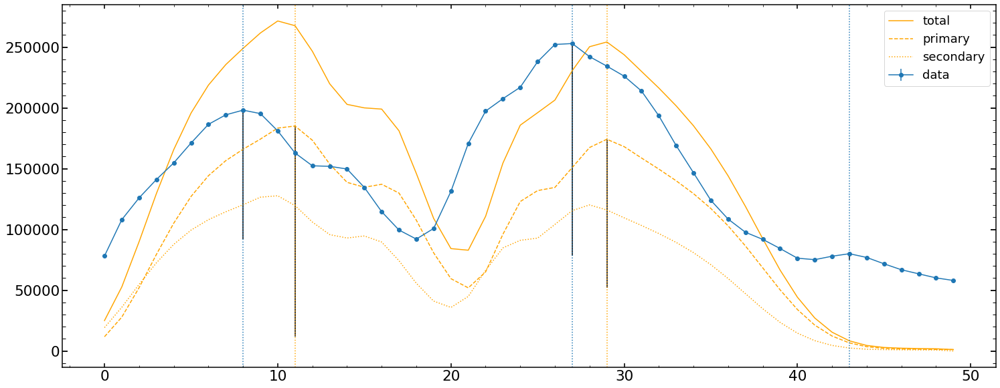

In [33]:
peaks_sci_data=scipy.signal.find_peaks(sci_image_1d)[0]
prominences_sci_data= scipy.signal.peak_prominences(sci_image_1d, peaks_sci_data)[0]
contour_heights_sci_image = sci_image_1d[peaks_sci_data] - prominences_sci_data


peaks_single_realization=scipy.signal.find_peaks(single_realization_1d_renormalized,prominence=np.max(single_realization_1d_renormalized)/4)[0]
prominences_single_realization= scipy.signal.peak_prominences(single_realization_1d_renormalized, peaks_single_realization)[0]
contour_heights_single_realization = single_realization_1d_renormalized[peaks_single_realization] - prominences_single_realization


plt.figure(figsize=(25,10))
plt.errorbar(range(len(sci_image_1d)),sci_image_1d,yerr=np.sqrt(var_image_1d),marker='o',label='data')
plt.plot(complete_realization_1d_renormalized,color='orange',label='total')
plt.plot(single_realization_1d_renormalized,color='orange',ls='--',label='primary')
plt.plot(single_realization_1d_shifted_renormalized,color='orange',ls=':',label='secondary')
plt.legend()
for i in range(len(peaks_sci_data)):
    plt.axvline(peaks_sci_data[i],ls=':')
    
for i in range(len(peaks_single_realization)):
    plt.axvline(peaks_single_realization[i],ls=':',color='orange')
    
plt.vlines(x=peaks_sci_data, ymin=contour_heights_sci_image, ymax=sci_image_1d[peaks_sci_data])    
plt.vlines(x=peaks_single_realization, ymin=contour_heights_single_realization, ymax=single_realization_1d_renormalized[peaks_single_realization])

In [34]:
sorted_prominences_sci_data=np.flip(np.sort(prominences_sci_data))
second_prominence_sci_data_value=sorted_prominences_sci_data[1]
third_prominence_sci_data_value=sorted_prominences_sci_data[2]
print(peaks_sci_data[prominences_sci_data>=second_prominence_sci_data_value])
print(np.mean(peaks_sci_data[prominences_sci_data>=second_prominence_sci_data_value]))

[ 8 27]
17.5


In [35]:
print(peaks_single_realization)
print(np.mean(peaks_single_realization))

[11 29]
20.0


In [36]:
modification_value=np.round(np.mean(peaks_sci_data[prominences_sci_data>=second_prominence_sci_data_value])-np.mean(peaks_single_realization)).astype(int)
modification_value

-2

In [37]:
third_peak_positions=peaks_sci_data[prominences_sci_data==third_prominence_sci_data_value][0]
third_peak_positions

43

In [38]:
offset_second_image=27-third_peak_positions
offset_second_image

-16

In [39]:
single_realization_1d_modified=np.concatenate((single_realization_1d[-modification_value:],np.zeros(-modification_value,)))

In [40]:
peaks_sci_data=scipy.signal.find_peaks(sci_image_1d)[0]
prominences_sci_data= scipy.signal.peak_prominences(sci_image_1d, peaks_sci_data)[0]
contour_heights_sci_image = sci_image_1d[peaks_sci_data] - prominences_sci_data
peak_values_sci_data=sci_image_1d[peaks_sci_data]

sorted_prominences_sci_data=np.flip(np.sort(prominences_sci_data))
sorted_values_single_sci_data=np.flip(np.sort(peak_values_sci_data))

second_prominence_sci_data_value=sorted_prominences_sci_data[1]
second_value_sci_data_value=sorted_values_single_sci_data[1]

third_prominence_sci_data_value=sorted_prominences_sci_data[2]
mean_sci_data_peaks=np.mean(peaks_sci_data[prominences_sci_data>=second_prominence_sci_data_value])
print(peaks_sci_data[prominences_sci_data>=second_prominence_sci_data_value])
print(mean_sci_data_peaks)




peaks_single_realization=scipy.signal.find_peaks(single_realization_1d,prominence=np.max(single_realization_1d)/4)[0]
prominences_single_realization= scipy.signal.peak_prominences(single_realization_1d, peaks_single_realization)[0]
contour_heights_single_realization = single_realization_1d[peaks_single_realization] - prominences_single_realization
peak_values_single_realization=single_realization_1d[peaks_single_realization]

sorted_prominences_single_realization=np.flip(np.sort(prominences_single_realization))
sorted_values_single_realization=np.flip(np.sort(peak_values_single_realization))

second_prominence_single_realization_value=prominences_single_realization[1]
second_value_single_realization_value=sorted_values_single_realization[1]

position_of_second_prominance_single_realization=peaks_single_realization[prominences_single_realization==second_prominence_single_realization_value]
mean_single_realization_peaks=np.mean(peaks_single_realization[prominences_single_realization>=second_prominence_single_realization_value])
print(peaks_single_realization[prominences_single_realization>=second_prominence_single_realization_value])
print(mean_single_realization_peaks)


[ 8 27]
17.5
[11 29]
20.0


In [41]:
second_value_sci_data_value

198172.55

In [42]:
primary_offset_from_single_realization=int(mean_sci_data_peaks-mean_single_realization_peaks)
primary_offset_from_single_realization

single_realization_1d_primary_v0=np.concatenate((single_realization_1d[-primary_offset_from_single_realization:],np.zeros(-primary_offset_from_single_realization,)))

renormalization_primary=second_value_sci_data_value/second_value_single_realization_value
single_realization_1d_primary_v1=renormalization_primary*single_realization_1d_primary_v0

secondary_offset_proposal_res=[]
ratio_secondary=np.sum(sci_image_1d)/np.sum(single_realization_1d_primary_v1)-1

for secondary_offset_proposal in range(-20,21):
    if secondary_offset_proposal >=0:
        single_realization_1d_secondary_v0=np.concatenate((single_realization_1d_primary_v1[secondary_offset_proposal:len(single_realization_1d_primary_v1)],np.zeros(secondary_offset_proposal,)))
    else:
        single_realization_1d_secondary_v0=np.concatenate((np.zeros(-secondary_offset_proposal,),single_realization_1d_primary_v1[:secondary_offset_proposal]))    
    single_realization_1d_secondary_v1=ratio_secondary*single_realization_1d_secondary_v0    
    complete_realization_1d=single_realization_1d_primary_v1+single_realization_1d_secondary_v1
    secondary_offset_proposal_res.append([secondary_offset_proposal,np.mean((complete_realization_1d-sci_image_1d)**2/var_image_1d)])
    
secondary_offset_proposal_res=np.array(secondary_offset_proposal_res)
secondary_offset_best_proposal=int(secondary_offset_proposal_res[secondary_offset_proposal_res[:,1]==np.min(secondary_offset_proposal_res[:,1])][0][0])

secondary_offset_proposal=secondary_offset_best_proposal
if secondary_offset_proposal >=0:
    single_realization_1d_secondary_v0=np.concatenate((single_realization_1d_primary_v1[secondary_offset_proposal:len(single_realization_1d_primary_v1)],np.zeros(secondary_offset_proposal,)))
else:
    single_realization_1d_secondary_v0=np.concatenate((np.zeros(-secondary_offset_proposal,),single_realization_1d_primary_v1[:secondary_offset_proposal]))    
single_realization_1d_secondary_v1=ratio_secondary*single_realization_1d_secondary_v0    
complete_realization_1d=single_realization_1d_primary_v1+single_realization_1d_secondary_v1


In [43]:
secondary_offset_best_proposal

-17

In [20]:
sci_image_1d

NameError: name 'sci_image_1d' is not defined

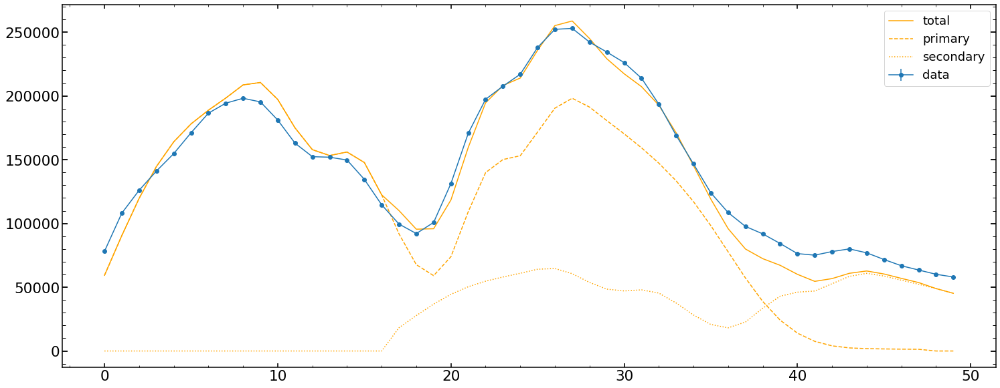

In [44]:
plt.figure(figsize=(25,10))
plt.errorbar(range(len(sci_image_1d)),sci_image_1d,yerr=np.sqrt(var_image_1d),marker='o',label='data')
plt.plot(complete_realization_1d,color='orange',label='total')
plt.plot(single_realization_1d_primary_v1,color='orange',ls='--',label='primary')
plt.plot(single_realization_1d_secondary_v1,color='orange',ls=':',label='secondary')
plt.legend()
#for i in range(len(peaks_sci_data)):
#    plt.axvline(peaks_sci_data[i],ls=':')
    
#for i in range(len(peaks_single_realization)):
#    plt.axvline(peaks_single_realization[i],ls=':',color='orange')
    
#plt.vlines(x=peaks_sci_data, ymin=contour_heights_sci_image, ymax=sci_image_1d[peaks_sci_data])    
#plt.vlines(x=peaks_single_realization, ymin=contour_heights_single_realization, ymax=single_realization_1d_renormalized[peaks_single_realization])

In [ ]:
def gaussian(x, amp, cen, wid):
    """1-d gaussian: gaussian(x, amp, cen, wid)"""
    return (amp / (sqrt(2*pi) * wid)) * exp(-(x-cen)**2 / (2*wid**2))


In [186]:
v_flux=1
sci_image_1d_vflux=v_flux*sci_image_1d

def primary_secondary_ratio(x):
    print(x)
    primary_offset_from_single_realization=int(x[0])
    secondary_offset=int(x[1])
    ratio_secondary=x[2]
    
    try:
    
        if primary_offset_from_single_realization >=0:
            single_realization_1d_primary_v0=np.concatenate((single_realization_1d[primary_offset_from_single_realization:len(single_realization_1d)],np.zeros(primary_offset_from_single_realization,)))
        else:
            single_realization_1d_primary_v0=np.concatenate((np.zeros(-primary_offset_from_single_realization,),single_realization_1d[:primary_offset_from_single_realization]))  

        if secondary_offset >=0:
            single_realization_1d_secondary_v0=ratio_secondary*np.concatenate((single_realization_1d_primary_v0[secondary_offset:len(single_realization_1d_primary_v0)],np.zeros(secondary_offset,)))
        else:
            single_realization_1d_secondary_v0=ratio_secondary*np.concatenate((np.zeros(-secondary_offset,),single_realization_1d_primary_v0[:secondary_offset]))  

        complete_realization_1d=single_realization_1d_primary_v0+single_realization_1d_secondary_v0
        complete_realization_1d_renormalized=complete_realization_1d*(np.sum(sci_image_1d)*v_flux/np.sum(complete_realization_1d))
        print(np.mean((sci_image_1d-complete_realization_1d_renormalized)**2/var_image_1d))
        return np.mean((sci_image_1d-complete_realization_1d_renormalized)**2/var_image_1d)
    except:
        return 10000000000

In [187]:
initial_simplex=[]
for i,j,l in product([-5,5],[-20,20],[0.1,0.8]):
    initial_simplex.append([i,j,l])
    
initial_simplex=np.array(initial_simplex)
initial_simplex=initial_simplex[2:6]
initial_simplex

array([[ -5. ,  20. ,   0.1],
       [ -5. ,  20. ,   0.8],
       [  5. , -20. ,   0.1],
       [  5. , -20. ,   0.8]])

In [208]:
scipy.optimize.minimize(primary_secondary_ratio,np.array((0,-16,0.4),), method='Nelder-Mead',options={'initial_simplex':initial_simplex})

[-5.  20.   0.1]
70111.82318815518
[-5.  20.   0.8]
65284.20573391286
[  5.  -20.    0.1]
28090.78818299456
[  5.  -20.    0.8]
14963.46415920292
[  8.33333333 -33.33333333   1.03333333]
45674.65846619349
[ 17.22222222 -68.88888889   0.48888889]
[ 0.55555556 -2.22222222  0.72222222]
31572.9947826573
[-1.2962963   5.18518519  0.04814815]
32811.6524988295
[ 1.11111111 -4.44444444  0.29444444]
21929.056493879027
[  6.85185185 -27.40740741   0.07407407]
43063.220419749974
[ 2.12962963 -8.51851852  0.56018519]
14786.87794135753
[ 0.49382716 -1.97530864  1.00308642]
30846.91277121889
[  3.87345679 -15.49382716   0.3257716 ]
3016.162642474378
[  6.22427984 -24.89711934   0.82952675]
17428.981462435022
[  4.94598765 -19.78395062   0.69575617]
9628.5258060567
[ 2.29938272 -9.19753086  0.25447531]
11414.794220243273
[  5.28292181 -21.13168724   0.29048354]
13639.527048285503
[  4.49459877 -17.97839506   0.35790895]
7234.129429857084
[  6.57664609 -26.30658436   0.66514918]
13526.706282099318
[  

 final_simplex: (array([[  3.84488875, -15.37955498,   0.4072938 ],
       [  3.84490137, -15.37960549,   0.40729301],
       [  3.84491313, -15.37965253,   0.4072941 ],
       [  3.84489886, -15.37959542,   0.40729267]]), array([2518.36434958, 2518.36434959, 2518.3643496 , 2518.36434962]))
           fun: 2518.3643495810247
       message: 'Optimization terminated successfully.'
          nfev: 124
           nit: 62
        status: 0
       success: True
             x: array([  3.84488875, -15.37955498,   0.4072938 ])

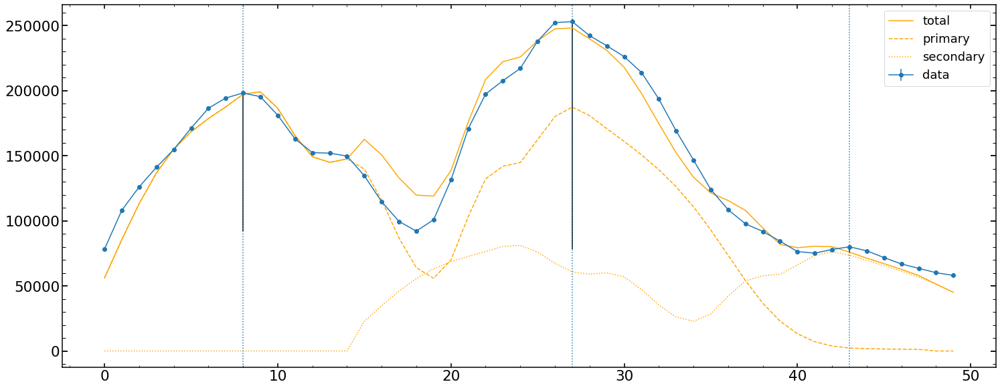

In [205]:
peaks_sci_data=scipy.signal.find_peaks(sci_image_1d)[0]
prominences_sci_data= scipy.signal.peak_prominences(sci_image_1d, peaks_sci_data)[0]
contour_heights_sci_image = sci_image_1d[peaks_sci_data] - prominences_sci_data


#peaks_single_realization=scipy.signal.find_peaks(single_realization_1d_renormalized,prominence=np.max(single_realization_1d_renormalized)/4)[0]
#prominences_single_realization= scipy.signal.peak_prominences(single_realization_1d_renormalized, peaks_single_realization)[0]
#contour_heights_single_realization = single_realization_1d_renormalized[peaks_single_realization] - prominences_single_realization


plt.figure(figsize=(25,10))
plt.errorbar(range(len(sci_image_1d)),sci_image_1d,yerr=np.sqrt(var_image_1d),marker='o',label='data')
plt.plot(complete_realization_1d_renormalized,color='orange',label='total')
plt.plot(single_realization_1d_primary_v1,color='orange',ls='--',label='primary')
plt.plot(single_realization_1d_secondary_v1,color='orange',ls=':',label='secondary')
plt.legend()

for i in range(len(peaks_sci_data)):
    plt.axvline(peaks_sci_data[i],ls=':')
    
#for i in range(len(peaks_single_realization)):
#    plt.axvline(peaks_single_realization[i],ls=':',color='orange')
    
plt.vlines(x=peaks_sci_data, ymin=contour_heights_sci_image, ymax=sci_image_1d[peaks_sci_data])    
#plt.vlines(x=peaks_single_realization, ymin=contour_heights_single_realization, ymax=single_realization_1d_renormalized[peaks_single_realization])


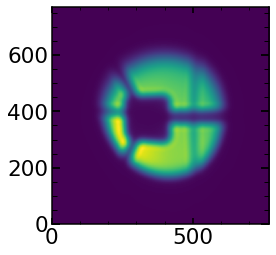

In [220]:
plt.imshow(optPsf_cut_grating_convolved)

In [17]:
STAMPS_FOLDER="/Users/nevencaplar/Documents/PFS/ReducedData/Data_Aug_14/Stamps_cleaned/"  
arc='HgAr'
obs=21346+12
single_number=2
sci_image =np.load(STAMPS_FOLDER+'sci'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
var_image =np.load(STAMPS_FOLDER+'var'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
single_realization=np.load(TESTING_FINAL_IMAGES_FOLDER+'single_realization.npy') 

In [18]:
sci_image_1d_axis_1=np.sum(sci_image,axis=1)
var_image_1d_axis_1=np.sum(var_image,axis=1)
single_realization_1d_axis_1=np.sum(single_realization,axis=1)/np.sum(single_realization)*np.sum(sci_image)

sci_image_1d_axis_0=np.sum(sci_image,axis=0)
var_image_1d_axis_0=np.sum(var_image,axis=0)
single_realization_1d_axis_0=np.sum(single_realization,axis=0)/np.sum(single_realization)*np.sum(sci_image)


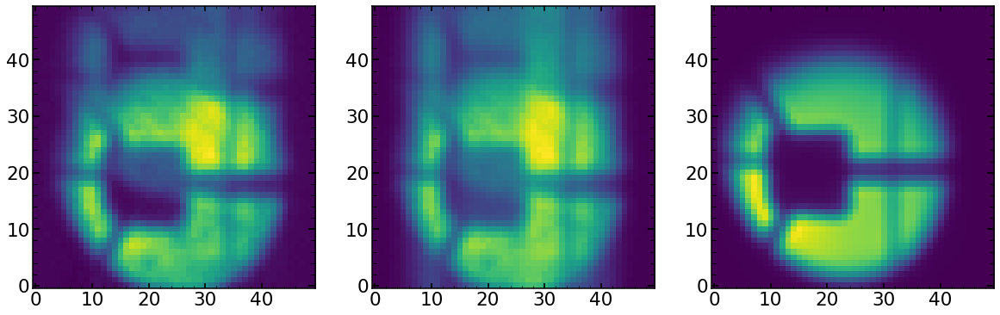

In [19]:
plt.figure(figsize=(20,8))
plt.subplot(1,3,1)
plt.imshow(sci_image)
plt.subplot(1,3,2)
plt.imshow(var_image)
plt.subplot(1,3,3)
plt.imshow(single_realization)

In [20]:
input_img=optPsf_cut_grating_convolved

oversampling=10

shape_of_input_img=input_img.shape[0]
shape_of_sci_image=sci_image.shape[0]
max_possible_value_to_analyze=int(shape_of_input_img-oversampling)
min_possible_value_to_analyze=int(oversampling)
center_point=int(shape_of_input_img/2)


# largest and smallest value to analyze 
min_dx_value_to_analyse=int(center_point+oversampling*(-shape_of_sci_image/2-5))
max_dx_value_to_analyse=int(center_point+oversampling*(shape_of_sci_image/2+5)) 
min_dy_value_to_analyse=int(center_point+oversampling*(-shape_of_sci_image/2-5))
max_dy_value_to_analyse=int(center_point+oversampling*(shape_of_sci_image/2+5))    

# if largest and smallest values are outside image 
if max_dx_value_to_analyse>max_possible_value_to_analyze:  
    max_dx_value_to_analyse=max_possible_value_to_analyze
if max_dy_value_to_analyse>max_possible_value_to_analyze:  
    max_dy_value_to_analyse=max_possible_value_to_analyze 
if min_dx_value_to_analyse<min_possible_value_to_analyze:  
    min_dx_value_to_analyse=min_possible_value_to_analyze
if min_dy_value_to_analyse<min_possible_value_to_analyze:  
    min_dy_value_to_analyse=min_possible_value_to_analyze 

###############################################################
# First step
# test chi2 for every combination of the parameters
# create an array res_init, for every movement of pixel dx and dy, give chi2

res_init=[]

delta_x_1=np.arange(min_dy_value_to_analyse,max_dy_value_to_analyse-oversampling*shape_of_sci_image,oversampling)
delta_y_1=np.arange(min_dx_value_to_analyse,max_dx_value_to_analyse-oversampling*shape_of_sci_image,oversampling)

In [21]:
deltay=130
deltax=130

delta_x_1=np.array([125,126,127,128,129,130,131,132,133,134])
delta_y_1=np.array([125,126,127,128,129,130,131,132,133,134])

array_of_single_realization=[]
array_of_single_realization_1d_axis_1=[]
array_of_single_realization_1d_axis_0=[]

for deltay in delta_x_1:

    array_of_single_realization_rows=[]    
    array_of_single_realization_rows_1d_axis_1=[]
    array_of_single_realization_rows_1d_axis_0=[]
    
    for deltax in delta_y_1:

        y_list=np.arange(deltay,deltay+oversampling*shape_of_sci_image,oversampling,dtype=np.intp)
        x_list=np.arange(deltax,deltax+oversampling*shape_of_sci_image,oversampling,dtype=np.intp)
        
        # we probably need to pixelize first then go?
        single_realization=input_img[y_list][:,x_list]
        single_realization_1d_axis_1=np.sum(single_realization,axis=1)/np.sum(single_realization_1d)*np.sum(sci_image_1d)
        single_realization_1d_axis_0=np.sum(single_realization,axis=0)/np.sum(single_realization_1d)*np.sum(sci_image_1d)        
        
        array_of_single_realization_rows.append(single_realization)
        array_of_single_realization_rows_1d_axis_1.append(single_realization_1d_axis_1)
        array_of_single_realization_rows_1d_axis_0.append(single_realization_1d_axis_0)
     
    array_of_single_realization.append(array_of_single_realization_rows)
    array_of_single_realization_1d_axis_1.append(array_of_single_realization_rows_1d_axis_1)
    array_of_single_realization_1d_axis_0.append(array_of_single_realization_rows_1d_axis_0)
    
array_of_single_realization=np.array(array_of_single_realization)
array_of_single_realization_1d_axis_1=np.array(array_of_single_realization_1d_axis_1)
array_of_single_realization_1d_axis_0=np.array(array_of_single_realization_1d_axis_0)


NameError: name 'single_realization_1d' is not defined

In [12]:
array_of_single_realization.shape

AttributeError: 'list' object has no attribute 'shape'

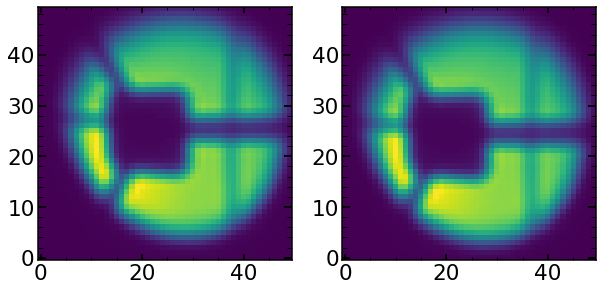

In [22]:
plt.figure(figsize=(10,7))
plt.subplot(121)
plt.imshow(array_of_single_realization[0][0])

plt.subplot(122)
plt.imshow(array_of_single_realization[9][9])

In [46]:
v_flux=1
sci_image_1d_vflux=v_flux*sci_image_1d
"""
def primary_secondary_ratio(x):
    print(x)
    primary_offset_from_single_realization_round=round(x[0])
    secondary_offset_round=round(x[0]+x[1])
    primary_offset_from_single_realization_mod=round((primary_offset_from_single_realization_round-(x[0]))*10)
    secondary_offset_round_mod=round((secondary_offset_round-(x[0]+x[1]))*10)
    
    ratio_secondary=x[2]
    print([primary_offset_from_single_realization_round,secondary_offset_round,\
           primary_offset_from_single_realization_mod,secondary_offset_round_mod,ratio_secondary])
    
    try:
        # use the round number to concatenate 
        # which single_realization_1d you use depends on the mod number
        single_realization_1d=array_of_single_realization_1d_axis_1[0][primary_offset_from_single_realization_mod]
        
        if primary_offset_from_single_realization >=0:
            single_realization_1d_primary_v0=np.concatenate((single_realization_1d[primary_offset_from_single_realization_round:len(single_realization_1d)],\
                                                             np.zeros(primary_offset_from_single_realization_round,)))
        else:
            single_realization_1d_primary_v0=np.concatenate((np.zeros(-primary_offset_from_single_realization_round,),\
                                                             single_realization_1d[:primary_offset_from_single_realization_round]))  

            
        single_realization_1d=array_of_single_realization_1d_axis_1[0][secondary_offset_round_mod]
        if secondary_offset >=0:
            single_realization_1d_secondary_v0=ratio_secondary*np.concatenate((single_realization_1d[secondary_offset_round:len(single_realization_1d_primary_v0)],\
                                                                               np.zeros(secondary_offset_round,)))
        else:
            single_realization_1d_secondary_v0=ratio_secondary*np.concatenate((np.zeros(-secondary_offset_round,),\
                                                                               single_realization_1d[:secondary_offset_round]))  

        complete_realization_1d=single_realization_1d_primary_v0+single_realization_1d_secondary_v0
        complete_realization_1d_renormalized=complete_realization_1d*(np.sum(sci_image_1d)*v_flux/np.sum(complete_realization_1d))
        print(np.mean((sci_image_1d-complete_realization_1d_renormalized)**2/var_image_1d))
        return np.mean((sci_image_1d-complete_realization_1d_renormalized)**2/var_image_1d)
    except:
        return 10000000000
"""  
def primary_secondary_ratio_axis_1(x):
    print(x)
    primary_offset_from_single_realization_round=int(np.floor(x[0]))
    secondary_offset_round=int(np.floor(x[1]))
    primary_offset_from_single_realization_mod=int(((x[0])-primary_offset_from_single_realization_round)*10)
    secondary_offset_round_mod=int(((x[1])-secondary_offset_round)*10)
    
    ratio_secondary=x[2]
    #print([primary_offset_from_single_realization_round,secondary_offset_round,\
    #       primary_offset_from_single_realization_mod/10,secondary_offset_round_mod,ratio_secondary/10])
    

    # use the round number to concatenate 
    # which single_realization_1d you use depends on the mod number
    single_realization_1d=array_of_single_realization_1d_axis_1[0][primary_offset_from_single_realization_mod]

    if primary_offset_from_single_realization_round >=0:
        single_realization_1d_primary_v0=np.concatenate((single_realization_1d[primary_offset_from_single_realization_round:len(single_realization_1d)],\
                                                         np.zeros(primary_offset_from_single_realization_round,)))
    else:
        single_realization_1d_primary_v0=np.concatenate((np.zeros(-primary_offset_from_single_realization_round,),\
                                                         single_realization_1d[:primary_offset_from_single_realization_round]))  


    single_realization_1d=array_of_single_realization_1d_axis_1[0][secondary_offset_round_mod]
    if secondary_offset_round >=0:
        single_realization_1d_secondary_v0=ratio_secondary*np.concatenate((single_realization_1d[secondary_offset_round:len(single_realization_1d_primary_v0)],\
                                                                           np.zeros(secondary_offset_round,)))
    else:
        single_realization_1d_secondary_v0=ratio_secondary*np.concatenate((np.zeros(-secondary_offset_round,),\
                                                                           single_realization_1d[:secondary_offset_round]))  

    complete_realization_1d=single_realization_1d_primary_v0+single_realization_1d_secondary_v0
    complete_realization_1d_renormalized=complete_realization_1d*(np.sum(sci_image_1d)*v_flux/np.sum(complete_realization_1d))
    single_realization_1d_secondary_renormalized=single_realization_1d_secondary_v0*(np.sum(sci_image_1d)*v_flux/np.sum(complete_realization_1d))
    single_realization_1d_primary_renormalized=single_realization_1d_primary_v0*(np.sum(sci_image_1d)*v_flux/np.sum(complete_realization_1d))
    print(np.mean((sci_image_1d-complete_realization_1d_renormalized)**2/var_image_1d))
    
    return np.mean((sci_image_1d_axis_1-complete_realization_1d_renormalized)**2/var_image_1d_axis_1)
    
    #return np.mean((sci_image_1d_axis_1-complete_realization_1d_renormalized)**2/var_image_1d_axis_1),\
    #single_realization_1d_primary_renormalized,single_realization_1d_secondary_renormalized,complete_realization_1d_renormalized
    

def primary_secondary_ratio_axis_1_full(x):
    print(x)
    primary_offset_from_single_realization_round=int(np.floor(x[0]))
    secondary_offset_round=int(np.floor(x[1]))
    primary_offset_from_single_realization_mod=int(((x[0])-primary_offset_from_single_realization_round)*10)
    secondary_offset_round_mod=int(((x[1])-secondary_offset_round)*10)
    
    ratio_secondary=x[2]
    #print([primary_offset_from_single_realization_round,secondary_offset_round,\
    #       primary_offset_from_single_realization_mod/10,secondary_offset_round_mod,ratio_secondary/10])
    

    # use the round number to concatenate 
    # which single_realization_1d you use depends on the mod number
    single_realization_1d=array_of_single_realization_1d_axis_1[0][primary_offset_from_single_realization_mod]

    if primary_offset_from_single_realization_round >=0:
        single_realization_1d_primary_v0=np.concatenate((single_realization_1d[primary_offset_from_single_realization_round:len(single_realization_1d)],\
                                                         np.zeros(primary_offset_from_single_realization_round,)))
    else:
        single_realization_1d_primary_v0=np.concatenate((np.zeros(-primary_offset_from_single_realization_round,),\
                                                         single_realization_1d[:primary_offset_from_single_realization_round]))  


    single_realization_1d=array_of_single_realization_1d_axis_1[0][secondary_offset_round_mod]
    if secondary_offset_round >=0:
        single_realization_1d_secondary_v0=ratio_secondary*np.concatenate((single_realization_1d[secondary_offset_round:len(single_realization_1d_primary_v0)],\
                                                                           np.zeros(secondary_offset_round,)))
    else:
        single_realization_1d_secondary_v0=ratio_secondary*np.concatenate((np.zeros(-secondary_offset_round,),\
                                                                           single_realization_1d[:secondary_offset_round]))  

    complete_realization_1d=single_realization_1d_primary_v0+single_realization_1d_secondary_v0
    complete_realization_1d_renormalized=complete_realization_1d*(np.sum(sci_image_1d)*v_flux/np.sum(complete_realization_1d))
    single_realization_1d_secondary_renormalized=single_realization_1d_secondary_v0*(np.sum(sci_image_1d)*v_flux/np.sum(complete_realization_1d))
    single_realization_1d_primary_renormalized=single_realization_1d_primary_v0*(np.sum(sci_image_1d)*v_flux/np.sum(complete_realization_1d))
    print(np.mean((sci_image_1d-complete_realization_1d_renormalized)**2/var_image_1d))
    
    #return np.mean((sci_image_1d_axis_1-complete_realization_1d_renormalized)**2/var_image_1d_axis_1)
    
    return np.mean((sci_image_1d_axis_1-complete_realization_1d_renormalized)**2/var_image_1d_axis_1),\
    single_realization_1d_primary_renormalized,single_realization_1d_secondary_renormalized,complete_realization_1d_renormalized    

    
def primary_secondary_ratio_axis_0(x):
    print(x)
    primary_offset_from_single_realization_round=int(np.floor(x[0]))
    secondary_offset_round=int(np.floor(x[1]))
    primary_offset_from_single_realization_mod=int(((x[0])-primary_offset_from_single_realization_round)*10)
    secondary_offset_round_mod=int(((x[1])-secondary_offset_round)*10)
    
    ratio_secondary=x[2]
    #print([primary_offset_from_single_realization_round,secondary_offset_round,\
    #       primary_offset_from_single_realization_mod/10,secondary_offset_round_mod,ratio_secondary/10])
    

    # use the round number to concatenate 
    # which single_realization_1d you use depends on the mod number
    single_realization_1d=array_of_single_realization_1d_axis_0[0][primary_offset_from_single_realization_mod]

    if primary_offset_from_single_realization_round >=0:
        single_realization_1d_primary_v0=np.concatenate((single_realization_1d[primary_offset_from_single_realization_round:len(single_realization_1d)],\
                                                         np.zeros(primary_offset_from_single_realization_round,)))
    else:
        single_realization_1d_primary_v0=np.concatenate((np.zeros(-primary_offset_from_single_realization_round,),\
                                                         single_realization_1d[:primary_offset_from_single_realization_round]))  


    single_realization_1d=array_of_single_realization_1d_axis_1[0][secondary_offset_round_mod]
    if secondary_offset_round >=0:
        single_realization_1d_secondary_v0=ratio_secondary*np.concatenate((single_realization_1d[secondary_offset_round:len(single_realization_1d_primary_v0)],\
                                                                           np.zeros(secondary_offset_round,)))
    else:
        single_realization_1d_secondary_v0=ratio_secondary*np.concatenate((np.zeros(-secondary_offset_round,),\
                                                                           single_realization_1d[:secondary_offset_round]))  

    complete_realization_1d=single_realization_1d_primary_v0+single_realization_1d_secondary_v0
    complete_realization_1d_renormalized=complete_realization_1d*(np.sum(sci_image_1d)*v_flux/np.sum(complete_realization_1d))
    single_realization_1d_secondary_renormalized=single_realization_1d_secondary_v0*(np.sum(sci_image_1d)*v_flux/np.sum(complete_realization_1d))
    single_realization_1d_primary_renormalized=single_realization_1d_primary_v0*(np.sum(sci_image_1d)*v_flux/np.sum(complete_realization_1d))
    print(np.mean((sci_image_1d-complete_realization_1d_renormalized)**2/var_image_1d))
    
    return np.mean((sci_image_1d_axis_0-complete_realization_1d_renormalized)**2/var_image_1d_axis_0)

def primary_secondary_ratio_axis_0_full(x):
    print(x)
    primary_offset_from_single_realization_round=int(np.floor(x[0]))
    secondary_offset_round=int(np.floor(x[1]))
    primary_offset_from_single_realization_mod=int(((x[0])-primary_offset_from_single_realization_round)*10)
    secondary_offset_round_mod=int(((x[1])-secondary_offset_round)*10)
    
    ratio_secondary=x[2]
    #print([primary_offset_from_single_realization_round,secondary_offset_round,\
    #       primary_offset_from_single_realization_mod/10,secondary_offset_round_mod,ratio_secondary/10])
    

    # use the round number to concatenate 
    # which single_realization_1d you use depends on the mod number
    single_realization_1d=array_of_single_realization_1d_axis_0[0][primary_offset_from_single_realization_mod]

    if primary_offset_from_single_realization_round >=0:
        single_realization_1d_primary_v0=np.concatenate((single_realization_1d[primary_offset_from_single_realization_round:len(single_realization_1d)],\
                                                         np.zeros(primary_offset_from_single_realization_round,)))
    else:
        single_realization_1d_primary_v0=np.concatenate((np.zeros(-primary_offset_from_single_realization_round,),\
                                                         single_realization_1d[:primary_offset_from_single_realization_round]))  


    single_realization_1d=array_of_single_realization_1d_axis_1[0][secondary_offset_round_mod]
    if secondary_offset_round >=0:
        single_realization_1d_secondary_v0=ratio_secondary*np.concatenate((single_realization_1d[secondary_offset_round:len(single_realization_1d_primary_v0)],\
                                                                           np.zeros(secondary_offset_round,)))
    else:
        single_realization_1d_secondary_v0=ratio_secondary*np.concatenate((np.zeros(-secondary_offset_round,),\
                                                                           single_realization_1d[:secondary_offset_round]))  

    complete_realization_1d=single_realization_1d_primary_v0+single_realization_1d_secondary_v0
    complete_realization_1d_renormalized=complete_realization_1d*(np.sum(sci_image_1d)*v_flux/np.sum(complete_realization_1d))
    single_realization_1d_secondary_renormalized=single_realization_1d_secondary_v0*(np.sum(sci_image_1d)*v_flux/np.sum(complete_realization_1d))
    single_realization_1d_primary_renormalized=single_realization_1d_primary_v0*(np.sum(sci_image_1d)*v_flux/np.sum(complete_realization_1d))
    print(np.mean((sci_image_1d-complete_realization_1d_renormalized)**2/var_image_1d))
    
    return np.mean((sci_image_1d_axis_0-complete_realization_1d_renormalized)**2/var_image_1d_axis_0),\
    single_realization_1d_primary_renormalized,single_realization_1d_secondary_renormalized,complete_realization_1d_renormalized    

In [54]:
primary_secondary_ratio_axis_1_res=scipy.optimize.differential_evolution(primary_secondary_ratio_axis_1,bounds=[(-20,20),(-20,20),(0,1)])
primary_secondary_ratio_axis_0_res=scipy.optimize.differential_evolution(primary_secondary_ratio_axis_0,bounds=[(-20,20),(-20,20),(0,1)])

[-4.77600654  0.2566817   0.95195206]
72052.7272252546
[-7.07293383  5.4926594   0.35021648]
58443.901027624
[  8.19551021 -18.25322439   0.5941784 ]
11068.306756945716
[1.81419173 8.37075198 0.75023676]
16858.342417609976
[10.98752478 12.27162216  0.92636342]
46160.62790836125
[2.51974375 1.8472845  0.76080662]
44299.26163148893
[14.87223543  7.51805967  0.99418234]
32626.362417089636
[-13.3624708  -11.67124745   0.38522242]
147701.27871708854
[12.16443146 -7.89140719  0.06327297]
48904.67386861092
[18.34298456 -6.00124819  0.53923028]
64033.199615670404
[-16.91309298  16.79037906   0.97696874]
23173.777188645337
[-1.59649607 17.34296207  0.67457252]
50518.932153968744
[-2.2614068  18.54676418  0.8250632 ]
58853.527108190116
[-10.83762681 -12.10120924   0.90990028]
141651.22770934066
[-9.32161542  6.55229343  0.30790808]
60235.27380111073
[ 1.11583473 14.57958637  0.3661178 ]
28076.290353954002
[-12.82369211  -2.0018624    0.61668111]
87947.29480013589
[-3.6584373  -3.43180633  0.6248

1519.0355472038261
[ 8.12432877 -9.11812826  0.42457725]
1877.4749216561975
[  8.39293567 -10.06313372   0.3379253 ]
2767.636660449926
[ 7.84067285 -8.27400005  0.50226937]
1988.373784249183
[  8.35014655 -11.49687366   0.54707675]
3323.712864936363
[  7.07760341 -10.11311029   0.41638562]
993.871893263252
[ 7.24080884 -7.40910642  0.30753763]
2721.5421334931593
[  7.37973039 -12.06208597   0.47827766]
2526.8610780854897
[  6.61199646 -12.17450164   0.51359178]
3799.9436196224287
[  6.03184174 -11.10717628   0.40820152]
2555.8413037692426
[ 7.08199537 -8.91442326  0.52624024]
2248.017255591515
[  8.60782216 -16.60099045   0.47484847]
7714.876569818126
[ 7.88348913 -8.42533889  0.45881281]
1629.53932042353
[  6.1890471  -10.90832673   0.43683368]
2429.9549334845883
[  7.03053278 -13.90592417   0.40743817]
3614.0011727851393
[ 8.25959486 -8.12585557  0.39601793]
2003.899595387206
[ 5.51195147 -8.38157094  0.23907155]
9317.918992115607
[  8.72444654 -10.25423285   0.49321729]
2346.4943570

[ 7.84452835 -9.98541391  0.38981114]
1002.2712204450726
[  7.95748592 -10.1587698    0.43022566]
1001.749292029071
[  7.882976   -10.14710162   0.43249714]
1005.9131726318635
[  7.91669017 -10.19949256   0.41044463]
992.8696858059266
[  7.89573662 -10.47802765   0.41255811]
992.077748580561
[  7.94730105 -10.25313925   0.40618231]
996.8880525043271
[  8.05854485 -10.01671584   0.40884768]
2202.513708543104
[  7.91675199 -10.17081507   0.40943637]
993.6166344608042
[ 7.94332034 -9.96312133  0.40639217]
979.1306198769582
[ 7.89512876 -9.99562377  0.41799146]
982.8749063868543
[ 8.20220445 -9.25917622  0.39924737]
1932.4708830762181
[ 7.74484814 -9.31087615  0.39322008]
995.273954783221
[ 7.94696578 -9.85475988  0.40529157]
979.7237765522957
[ 8.2058811  -9.6615801   0.38565821]
1997.4206143316944
[  7.81163364 -10.07625724   0.41364212]
991.5987231538886
[  7.93596242 -10.03056354   0.39903736]
1008.3173048847874
[ 7.55717423 -9.76907776  0.3986931 ]
986.4144396826663
[ 7.99845396 -9.47

[3.89131845 2.86622469 0.5543214 ]
27620.533142848046
[1.44407558 5.36090113 0.0205662 ]
39822.6869340767
[3.63103712 1.07016718 0.50681521]
30110.035161871714
[ 2.30992924 -5.98951162  0.04017474]
35462.827972381485
[ 1.67847821 13.93411231  0.24985891]
23140.082694062254
[ 1.35815611 17.64270325  0.5888674 ]
22428.221282713137
[3.75579307 9.68479001 0.81554362]
11216.224822206374
[0.1534347  6.10640175 0.13548815]
38335.4012372133
[1.30067589 3.83389082 0.02527575]
40959.19298547956
[ 3.7844357  -5.96073589  0.59030974]
36560.70928759149
[ 0.91666794 -3.31604321  0.06599529]
45071.20853510848
[ 0.80038085 -9.49304029  0.18752861]
44479.299301622064
[5.55242878 5.07228256 0.0777697 ]
22339.009774651324
[  2.49626746 -13.72450073   0.36881555]
31526.115901886173
[ 1.0723627  10.97298622  0.2849855 ]
21997.392153533463
[2.83585963 5.50499579 0.26501887]
24674.82454742115
[ 0.71888279 16.18703538  0.71207347]
20304.617362179233
[ 3.1269287  16.88127597  0.8136376 ]
24168.554792590916
[ 4

[2.28743076 2.70003947 0.42238582]
33205.18428033739
[ 2.28455477 11.37974177  0.49909255]
14494.367734227428
[2.2937445  2.98937421 0.00881381]
36053.62021726855
[2.2982679  2.69690933 0.01205707]
36002.77166991067
[2.13423082 5.56448404 0.00201685]
36714.94063324576
[2.21347077 1.69540302 0.01145497]
36103.97063555702
[2.29351826 4.58521793 0.37157924]
27616.911501270934
[2.46129321 5.16556812 0.02128019]
33925.872087573676
[2.23205647 7.09340498 0.0007981 ]
36131.28466444008
[2.39564531 2.11545406 0.00216486]
35543.92306287123
[ 2.39369271 -0.14198534  0.12683169]
36195.512579570976
[2.32000844 4.63536344 0.80567678]
24256.357868609502
[2.27493636 4.69297345 0.0226235 ]
35329.1893618623
[2.38665379 5.91582147 0.0078771 ]
35169.48533076617
[2.53323432 3.71034243 0.69228066]
28393.674826103426
[2.29032845 0.86658487 0.06480921]
36131.45515030194
[ 2.40497722 -2.88873824  0.31979951]
38994.58638281314
[ 2.4405305  -1.22153462  0.72874153]
44070.12388876747
[2.44231827 3.2817898  0.0218

In [56]:
res_axis_1,single_realization_1d_primary_renormalized_axis_1,\
single_realization_1d_secondary_renormalized_axis_1,complete_realization_1d_renormalized_axis_1=primary_secondary_ratio_axis_1_full(primary_secondary_ratio_axis_1_res.x)

res_axis_0,single_realization_1d_primary_renormalized_axis_0,\
single_realization_1d_secondary_renormalized_axis_0,complete_realization_1d_renormalized_axis_0=primary_secondary_ratio_axis_0_full(primary_secondary_ratio_axis_0_res.x)

[ 7.8539052  -9.79923796  0.40945779]
979.0003025152367
[2.3594715  1.81930112 0.        ]
35577.77444070582


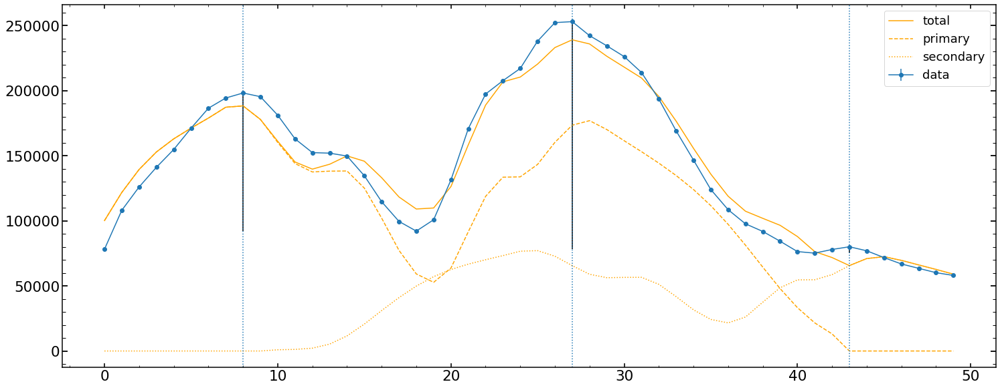

In [47]:
peaks_sci_data=scipy.signal.find_peaks(sci_image_1d_axis_1)[0]
prominences_sci_data= scipy.signal.peak_prominences(sci_image_1d_axis_1, peaks_sci_data)[0]
contour_heights_sci_image = sci_image_1d_axis_1[peaks_sci_data] - prominences_sci_data


#peaks_single_realization=scipy.signal.find_peaks(single_realization_1d_renormalized,prominence=np.max(single_realization_1d_renormalized)/4)[0]
#prominences_single_realization= scipy.signal.peak_prominences(single_realization_1d_renormalized, peaks_single_realization)[0]
#contour_heights_single_realization = single_realization_1d_renormalized[peaks_single_realization] - prominences_single_realization


plt.figure(figsize=(25,10))
plt.errorbar(range(len(sci_image_1d)),sci_image_1d,yerr=np.sqrt(var_image_1d),marker='o',label='data')
plt.plot(complete_realization_1d_renormalized,color='orange',label='total')
plt.plot(single_realization_1d_primary_renormalized,color='orange',ls='--',label='primary')
plt.plot(single_realization_1d_secondary_renormalized,color='orange',ls=':',label='secondary')
plt.legend()

for i in range(len(peaks_sci_data)):
    plt.axvline(peaks_sci_data[i],ls=':')
    
#for i in range(len(peaks_single_realization)):
#    plt.axvline(peaks_single_realization[i],ls=':',color='orange')
    
plt.vlines(x=peaks_sci_data, ymin=contour_heights_sci_image, ymax=sci_image_1d_axis_1[peaks_sci_data])    
#plt.vlines(x=peaks_single_realization, ymin=contour_heights_single_realization, ymax=single_realization_1d_renormalized[peaks_single_realization])

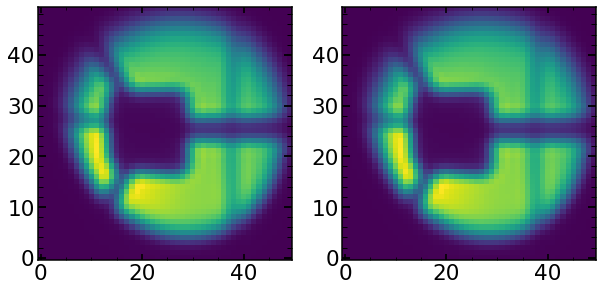

In [57]:
plt.figure(figsize=(10,7))
plt.subplot(121)
plt.imshow(array_of_single_realization[0][0])

plt.subplot(122)
plt.imshow(array_of_single_realization[1][1])

In [58]:
scipy.interpolate.interp2d(array_of_single_realization[0][0], array_of_single_realization[1][1], kind='linear', copy=True, bounds_error=False, fill_value=None)

TypeError: __init__() missing 1 required positional argument: 'z'

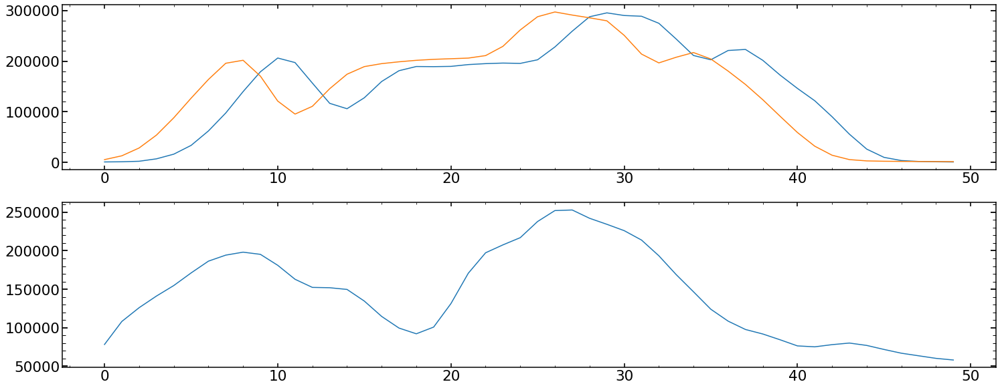

In [103]:
plt.figure(figsize=(25,10))

plt.subplot(2,1,1)
plt.plot(sci_image_1d_axis_0)
plt.plot(single_realization_1d_axis_0)

plt.subplot(2,1,2)
plt.plot(sci_image_1d_axis_1)

In [ ]:
single_realization_1d_axis_0

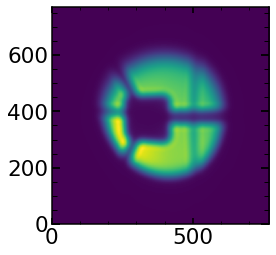

In [44]:
optPsf_cut_grating_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_grating_convolved.npy')
optPsf_cut_grating_convolved=optPsf_cut_grating_convolved/np.sum(optPsf_cut_grating_convolved)
# run spot 1 from Dec04
plt.imshow(optPsf_cut_grating_convolved)

In [25]:
x=[ 20.20566762 ,143.37686329, 136.96485845 ,  0.53622588]
shape_of_sci_image=len(sci_image)
oversampling=10
v_flux=1

ratio_secondary=x[3]

center_position=int(np.floor(optPsf_cut_grating_convolved.shape[0]/2))
primary_offset_axis_1=x[0]
primary_offset_axis_0=x[1]  

secondary_offset_axis_1=primary_offset_axis_1
secondary_offset_axis_0=x[2]

primary_offset_axis_1_floor=int(np.floor(primary_offset_axis_1)+center_position-shape_of_sci_image/2*oversampling)
primary_offset_axis_1_ceiling=int(np.ceil(primary_offset_axis_1)+center_position-shape_of_sci_image/2*oversampling)
primary_offset_axis_1_mod_from_floor=primary_offset_axis_1-int(np.floor(primary_offset_axis_1))

primary_offset_axis_0_floor=int(np.floor(primary_offset_axis_0)+center_position-shape_of_sci_image/2*oversampling)
primary_offset_axis_0_ceiling=int(np.ceil(primary_offset_axis_0)+center_position-shape_of_sci_image/2*oversampling)
primary_offset_axis_0_mod_from_floor=primary_offset_axis_0-int(np.floor(primary_offset_axis_0))

secondary_offset_axis_1_floor=int(np.floor(secondary_offset_axis_1)+center_position-shape_of_sci_image/2*oversampling)
secondary_offset_axis_1_ceiling=int(np.ceil(secondary_offset_axis_1)+center_position-shape_of_sci_image/2*oversampling)
secondary_offset_axis_1_mod_from_floor=secondary_offset_axis_1-int(np.floor(secondary_offset_axis_1))

secondary_offset_axis_0_floor=int(np.floor(secondary_offset_axis_0)+center_position-shape_of_sci_image/2*oversampling)
secondary_offset_axis_0_ceiling=int(np.ceil(secondary_offset_axis_0)+center_position-shape_of_sci_image/2*oversampling)
secondary_offset_axis_0_mod_from_floor=secondary_offset_axis_0-int(np.floor(secondary_offset_axis_0))

In [26]:
def fill_crop(img, pos, crop):
  '''
  Fills `crop` with values from `img` at `pos`, 
  while accounting for the crop being off the edge of `img`.
  *Note:* negative values in `pos` are interpreted as-is, not as "from the end".
  '''
  img_shape, pos, crop_shape = np.array(img.shape), np.array(pos), np.array(crop.shape),
  end = pos+crop_shape
  # Calculate crop slice positions
  crop_low = np.clip(0 - pos, a_min=0, a_max=crop_shape)
  crop_high = crop_shape - np.clip(end-img_shape, a_min=0, a_max=crop_shape)
  crop_slices = (slice(low, high) for low, high in zip(crop_low, crop_high))
  # Calculate img slice positions
  pos = np.clip(pos, a_min=0, a_max=img_shape)
  end = np.clip(end, a_min=0, a_max=img_shape)
  img_slices = (slice(low, high) for low, high in zip(pos, end))
  crop[tuple(crop_slices)] = img[tuple(img_slices)]

In [27]:
if primary_offset_axis_0_floor<0 or (primary_offset_axis_0_ceiling+oversampling*shape_of_sci_image)>len(input_img)\
or primary_offset_axis_1_floor<0 or (primary_offset_axis_1_ceiling+oversampling*shape_of_sci_image)>len(input_img):
    print('going into crop loop for primary source')
    pos_floor_floor = np.array([primary_offset_axis_0_floor, primary_offset_axis_1_floor])
    pos_floor_ceiling = np.array([primary_offset_axis_0_floor, primary_offset_axis_1_ceiling])
    pos_ceiling_floor = np.array([primary_offset_axis_0_ceiling, primary_offset_axis_1_floor])
    input_img_single_realization_before_downsampling_primary_floor_floor = np.full([oversampling*shape_of_sci_image, oversampling*shape_of_sci_image], 0)
    input_img_single_realization_before_downsampling_primary_floor_ceiling = np.full([oversampling*shape_of_sci_image, oversampling*shape_of_sci_image], 0)
    input_img_single_realization_before_downsampling_primary_ceiling_floor = np.full([oversampling*shape_of_sci_image, oversampling*shape_of_sci_image], 0)

    fill_crop(input_img, pos_floor_floor, input_img_single_realization_before_downsampling_primary_floor_floor)
    fill_crop(input_img, pos_floor_ceiling, input_img_single_realization_before_downsampling_primary_floor_ceiling)
    fill_crop(input_img, pos_ceiling_floor, input_img_single_realization_before_downsampling_primary_ceiling_floor)
else:
    input_img_single_realization_before_downsampling_primary_floor_floor=input_img[primary_offset_axis_0_floor:primary_offset_axis_0_floor+oversampling*shape_of_sci_image,\
                                                               primary_offset_axis_1_floor:primary_offset_axis_1_floor+oversampling*shape_of_sci_image]
    input_img_single_realization_before_downsampling_primary_floor_ceiling=input_img[primary_offset_axis_0_floor:primary_offset_axis_0_floor+oversampling*shape_of_sci_image,\
                                                               primary_offset_axis_1_ceiling:primary_offset_axis_1_ceiling+oversampling*shape_of_sci_image]
    input_img_single_realization_before_downsampling_primary_ceiling_floor=input_img[primary_offset_axis_0_ceiling:primary_offset_axis_0_ceiling+oversampling*shape_of_sci_image,\
                                                               primary_offset_axis_1_floor:primary_offset_axis_1_floor+oversampling*shape_of_sci_image]
    
 
input_img_single_realization_before_downsampling_primary=(1-primary_offset_axis_1_mod_from_floor-primary_offset_axis_1_mod_from_floor)*input_img_single_realization_before_downsampling_primary_floor_floor+\
primary_offset_axis_1_mod_from_floor*input_img_single_realization_before_downsampling_primary_floor_ceiling+\
primary_offset_axis_0_mod_from_floor*input_img_single_realization_before_downsampling_primary_ceiling_floor             

single_primary_realization=resize(input_img_single_realization_before_downsampling_primary,(shape_of_sci_image,shape_of_sci_image))
###################

if secondary_offset_axis_0_floor<0 or (secondary_offset_axis_0_ceiling+oversampling*shape_of_sci_image)>len(input_img)\
or secondary_offset_axis_1_floor<0 or (secondary_offset_axis_1_ceiling+oversampling*shape_of_sci_image)>len(input_img):
    print('going into crop loop for secondary source')
    pos_floor_floor = np.array([secondary_offset_axis_0_floor, secondary_offset_axis_1_floor])
    pos_floor_ceiling = np.array([secondary_offset_axis_0_floor, secondary_offset_axis_1_ceiling])
    pos_ceiling_floor = np.array([secondary_offset_axis_0_ceiling, secondary_offset_axis_1_floor])
    input_img_single_realization_before_downsampling_secondary_floor_floor = np.full([oversampling*shape_of_sci_image, oversampling*shape_of_sci_image], 0)
    input_img_single_realization_before_downsampling_secondary_floor_ceiling = np.full([oversampling*shape_of_sci_image, oversampling*shape_of_sci_image], 0)
    input_img_single_realization_before_downsampling_secondary_ceiling_floor = np.full([oversampling*shape_of_sci_image, oversampling*shape_of_sci_image], 0)

    fill_crop(input_img, pos_floor_floor, input_img_single_realization_before_downsampling_secondary_floor_floor)
    fill_crop(input_img, pos_floor_ceiling, input_img_single_realization_before_downsampling_secondary_floor_ceiling)
    fill_crop(input_img, pos_ceiling_floor, input_img_single_realization_before_downsampling_secondary_ceiling_floor)
else:
    input_img_single_realization_before_downsampling_secondary_floor_floor=input_img[secondary_offset_axis_0_floor:secondary_offset_axis_0_floor+oversampling*shape_of_sci_image,\
                                                               secondary_offset_axis_1_floor:secondary_offset_axis_1_floor+oversampling*shape_of_sci_image]
    input_img_single_realization_before_downsampling_secondary_floor_ceiling=input_img[secondary_offset_axis_0_floor:secondary_offset_axis_0_floor+oversampling*shape_of_sci_image,\
                                                               secondary_offset_axis_1_ceiling:secondary_offset_axis_1_ceiling+oversampling*shape_of_sci_image]
    input_img_single_realization_before_downsampling_secondary_ceiling_floor=input_img[secondary_offset_axis_0_ceiling:secondary_offset_axis_0_ceiling+oversampling*shape_of_sci_image,\
                                                               secondary_offset_axis_1_floor:secondary_offset_axis_1_floor+oversampling*shape_of_sci_image]  
    
input_img_single_realization_before_downsampling_secondary=(1-secondary_offset_axis_1_mod_from_floor-secondary_offset_axis_0_mod_from_floor)*input_img_single_realization_before_downsampling_secondary_floor_floor+\
secondary_offset_axis_1_mod_from_floor*input_img_single_realization_before_downsampling_secondary_floor_ceiling+\
secondary_offset_axis_0_mod_from_floor*input_img_single_realization_before_downsampling_secondary_ceiling_floor             

single_secondary_realization=resize(input_img_single_realization_before_downsampling_secondary,(shape_of_sci_image,shape_of_sci_image))    

complete_realization=single_primary_realization+ratio_secondary*single_secondary_realization
complete_realization_renormalized=complete_realization*(np.sum(sci_image)*v_flux/np.sum(complete_realization))

going into crop loop for primary source
going into crop loop for secondary source


In [28]:
input_img_single_realization_before_downsampling_secondary=np.zeros((500,500))
%timeit input_img_single_realization_before_downsampling_secondary=input_img_single_realization_before_downsampling_secondary_floor_floor+input_img_single_realization_before_downsampling_secondary_floor_ceiling+input_img_single_realization_before_downsampling_secondary_ceiling_floor      

667 µs ± 22.4 µs per loop (mean ± std. dev. of 7 runs, 1000 loops each)


In [29]:
[secondary_offset_axis_0_ceiling,secondary_offset_axis_0_ceiling+oversampling*shape_of_sci_image]

[272, 772]

In [30]:
print(input_img_single_realization_before_downsampling_secondary_floor_floor.shape)
print(input_img_single_realization_before_downsampling_secondary_floor_ceiling.shape)
print(input_img_single_realization_before_downsampling_secondary_ceiling_floor.shape)

(500, 500)
(500, 500)
(500, 500)


In [31]:
input_img_single_realization_before_downsampling_secondary_ceiling_floor = np.full([oversampling*shape_of_sci_image, oversampling*shape_of_sci_image], 0)

fill_crop(input_img, pos_ceiling_floor, input_img_single_realization_before_downsampling_secondary_ceiling_floor)

In [32]:
input_img[secondary_offset_axis_0_ceiling:secondary_offset_axis_0_ceiling+oversampling*shape_of_sci_image,\
                                                               secondary_offset_axis_1_floor:secondary_offset_axis_1_floor+oversampling*shape_of_sci_image].shape  

(499, 500)

In [322]:
secondary_offset_axis_0_ceiling+oversampling*shape_of_sci_image

772

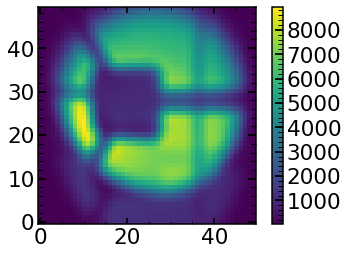

In [282]:
plt.imshow(complete_realization_renormalized)
plt.colorbar()

In [ ]:
# As a function 

In [33]:
input_img=optPsf_cut_grating_convolved
shape_of_sci_image=len(sci_image)
v_flux=1

In [39]:
def create_complete_realization(x, return_full_result=False):
    #print(x)

    ratio_secondary=x[3]

    center_position=int(np.floor(input_img.shape[0]/2))
    primary_offset_axis_1=x[0]
    primary_offset_axis_0=x[1]  

    secondary_offset_axis_1=primary_offset_axis_1
    secondary_offset_axis_0=x[2]

    primary_offset_axis_1_floor=int(np.floor(primary_offset_axis_1)+center_position-shape_of_sci_image/2*oversampling)
    primary_offset_axis_1_ceiling=int(np.ceil(primary_offset_axis_1)+center_position-shape_of_sci_image/2*oversampling)
    primary_offset_axis_1_mod_from_floor=primary_offset_axis_1-int(np.floor(primary_offset_axis_1))

    primary_offset_axis_0_floor=int(np.floor(primary_offset_axis_0)+center_position-shape_of_sci_image/2*oversampling)
    primary_offset_axis_0_ceiling=int(np.ceil(primary_offset_axis_0)+center_position-shape_of_sci_image/2*oversampling)
    primary_offset_axis_0_mod_from_floor=primary_offset_axis_0-int(np.floor(primary_offset_axis_0))

    secondary_offset_axis_1_floor=int(np.floor(secondary_offset_axis_1)+center_position-shape_of_sci_image/2*oversampling)
    secondary_offset_axis_1_ceiling=int(np.ceil(secondary_offset_axis_1)+center_position-shape_of_sci_image/2*oversampling)
    secondary_offset_axis_1_mod_from_floor=secondary_offset_axis_1-int(np.floor(secondary_offset_axis_1))

    secondary_offset_axis_0_floor=int(np.floor(secondary_offset_axis_0)+center_position-shape_of_sci_image/2*oversampling)
    secondary_offset_axis_0_ceiling=int(np.ceil(secondary_offset_axis_0)+center_position-shape_of_sci_image/2*oversampling)
    secondary_offset_axis_0_mod_from_floor=secondary_offset_axis_0-int(np.floor(secondary_offset_axis_0))
    

    if primary_offset_axis_0_floor<0 or (primary_offset_axis_0_ceiling+oversampling*shape_of_sci_image)>len(input_img)\
    or primary_offset_axis_1_floor<0 or (primary_offset_axis_1_ceiling+oversampling*shape_of_sci_image)>len(input_img):
        #print('going into crop loop')

        pos_floor_floor = np.array([primary_offset_axis_0_floor, primary_offset_axis_1_floor])
        pos_floor_ceiling = np.array([primary_offset_axis_0_floor, primary_offset_axis_1_ceiling])
        pos_ceiling_floor = np.array([primary_offset_axis_0_ceiling, primary_offset_axis_1_floor])


        input_img_single_realization_before_downsampling_primary_floor_floor = np.zeros((oversampling*shape_of_sci_image, oversampling*shape_of_sci_image))
        input_img_single_realization_before_downsampling_primary_floor_ceiling = np.zeros((oversampling*shape_of_sci_image, oversampling*shape_of_sci_image))
        input_img_single_realization_before_downsampling_primary_ceiling_floor = np.zeros((oversampling*shape_of_sci_image, oversampling*shape_of_sci_image))

        fill_crop(input_img, pos_floor_floor, input_img_single_realization_before_downsampling_primary_floor_floor)
        fill_crop(input_img, pos_floor_ceiling, input_img_single_realization_before_downsampling_primary_floor_ceiling)
        fill_crop(input_img, pos_ceiling_floor, input_img_single_realization_before_downsampling_primary_ceiling_floor)

    else:
        input_img_single_realization_before_downsampling_primary_floor_floor=input_img[primary_offset_axis_0_floor:primary_offset_axis_0_floor+oversampling*shape_of_sci_image,\
                                                                   primary_offset_axis_1_floor:primary_offset_axis_1_floor+oversampling*shape_of_sci_image]
        input_img_single_realization_before_downsampling_primary_floor_ceiling=input_img[primary_offset_axis_0_floor:primary_offset_axis_0_floor+oversampling*shape_of_sci_image,\
                                                                   primary_offset_axis_1_ceiling:primary_offset_axis_1_ceiling+oversampling*shape_of_sci_image]
        input_img_single_realization_before_downsampling_primary_ceiling_floor=input_img[primary_offset_axis_0_ceiling:primary_offset_axis_0_ceiling+oversampling*shape_of_sci_image,\
                                                                   primary_offset_axis_1_floor:primary_offset_axis_1_floor+oversampling*shape_of_sci_image]


    input_img_single_realization_before_downsampling_primary=(1-primary_offset_axis_1_mod_from_floor-primary_offset_axis_1_mod_from_floor)*input_img_single_realization_before_downsampling_primary_floor_floor+\
    primary_offset_axis_1_mod_from_floor*input_img_single_realization_before_downsampling_primary_floor_ceiling+\
    primary_offset_axis_0_mod_from_floor*input_img_single_realization_before_downsampling_primary_ceiling_floor             

    single_primary_realization=resize(input_img_single_realization_before_downsampling_primary,(shape_of_sci_image,shape_of_sci_image))

    ###################

    if secondary_offset_axis_0_floor<0 or (secondary_offset_axis_0_ceiling+oversampling*shape_of_sci_image)>len(input_img)\
    or secondary_offset_axis_1_floor<0 or (secondary_offset_axis_1_ceiling+oversampling*shape_of_sci_image)>len(input_img):
        pos_floor_floor = np.array([secondary_offset_axis_0_floor, secondary_offset_axis_1_floor])
        pos_floor_ceiling = np.array([secondary_offset_axis_0_floor, secondary_offset_axis_1_ceiling])
        pos_ceiling_floor = np.array([secondary_offset_axis_0_ceiling, secondary_offset_axis_1_floor])
        input_img_single_realization_before_downsampling_secondary_floor_floor = np.full([oversampling*shape_of_sci_image, oversampling*shape_of_sci_image], 0)
        input_img_single_realization_before_downsampling_secondary_floor_ceiling = np.full([oversampling*shape_of_sci_image, oversampling*shape_of_sci_image], 0)
        input_img_single_realization_before_downsampling_secondary_ceiling_floor = np.full([oversampling*shape_of_sci_image, oversampling*shape_of_sci_image], 0)

        fill_crop(input_img, pos_floor_floor, input_img_single_realization_before_downsampling_secondary_floor_floor)
        fill_crop(input_img, pos_floor_ceiling, input_img_single_realization_before_downsampling_secondary_floor_ceiling)
        fill_crop(input_img, pos_ceiling_floor, input_img_single_realization_before_downsampling_secondary_ceiling_floor)
    else:
        input_img_single_realization_before_downsampling_secondary_floor_floor=input_img[secondary_offset_axis_0_floor:secondary_offset_axis_0_floor+oversampling*shape_of_sci_image,\
                                                                   secondary_offset_axis_1_floor:secondary_offset_axis_1_floor+oversampling*shape_of_sci_image]
        input_img_single_realization_before_downsampling_secondary_floor_ceiling=input_img[secondary_offset_axis_0_floor:secondary_offset_axis_0_floor+oversampling*shape_of_sci_image,\
                                                                   secondary_offset_axis_1_ceiling:secondary_offset_axis_1_ceiling+oversampling*shape_of_sci_image]
        input_img_single_realization_before_downsampling_secondary_ceiling_floor=input_img[secondary_offset_axis_0_ceiling:secondary_offset_axis_0_ceiling+oversampling*shape_of_sci_image,\
                                                                   secondary_offset_axis_1_floor:secondary_offset_axis_1_floor+oversampling*shape_of_sci_image]  

    input_img_single_realization_before_downsampling_secondary=(1-secondary_offset_axis_1_mod_from_floor-secondary_offset_axis_0_mod_from_floor)*input_img_single_realization_before_downsampling_secondary_floor_floor+\
    secondary_offset_axis_1_mod_from_floor*input_img_single_realization_before_downsampling_secondary_floor_ceiling+\
    secondary_offset_axis_0_mod_from_floor*input_img_single_realization_before_downsampling_secondary_ceiling_floor             

    single_secondary_realization=resize(input_img_single_realization_before_downsampling_secondary,(shape_of_sci_image,shape_of_sci_image))    

    complete_realization=single_primary_realization+ratio_secondary*single_secondary_realization
    complete_realization_renormalized=complete_realization*(np.sum(sci_image)*v_flux/np.sum(complete_realization))
    
    if return_full_result==False:
        #print(np.mean((sci_image-complete_realization_renormalized)**2/var_image))
        return np.mean((sci_image-complete_realization_renormalized)**2/var_image)
    else:
        single_primary_realization_renormalized=single_primary_realization*(np.sum(sci_image)*v_flux/np.sum(complete_realization))
        single_secondary_realization_renormalized=ratio_secondary*single_secondary_realization*(np.sum(sci_image)*v_flux/np.sum(complete_realization))    
        
        return np.mean((sci_image-complete_realization_renormalized)**2/var_image),\
        single_primary_realization_renormalized,single_secondary_realization_renormalized,complete_realization_renormalized   
                                

In [35]:
single_secondary_realization=resize(input_img_single_realization_before_downsampling_secondary,(shape_of_sci_image,shape_of_sci_image)) 

In [38]:
%timeit Zernike_Module._resize_weights(500,50,True)

251 µs ± 8.28 µs per loop (mean ± std. dev. of 7 runs, 1000 loops each)


In [ ]:
optPsf_cut_grating_convolved

In [14]:
%timeit single_secondary_realization=resize(optPsf_cut_grating_convolved,(20,20)) 

1.52 ms ± 41.9 µs per loop (mean ± std. dev. of 7 runs, 1000 loops each)


In [138]:
resize(input_img_single_realization_before_downsampling_secondary,(shape_of_sci_image,shape_of_sci_image)) 

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [428]:
import time

start_time_all=time.time()
create_complete_realization([  8.87199129, -253.30070028, -121.00000007,    0.17398211])
end_time_all=time.time()

print(end_time_all-start_time_all)

0.011248111724853516


In [16]:
%prun single_secondary_realization=resize(input_img_single_realization_before_downsampling_secondary,(shape_of_sci_image,shape_of_sci_image)) 

NameError: name 'input_img_single_realization_before_downsampling_secondary' is not defined

In [15]:
%load_ext line_profiler
%lprun -f resize resize(input_img_single_realization_before_downsampling_secondary,(shape_of_sci_image,shape_of_sci_image)) 

NameError: name 'input_img_single_realization_before_downsampling_secondary' is not defined

In [50]:
primary_secondary_position_and_ratio=scipy.optimize.differential_evolution(create_complete_realization,bounds=[(-50,50),(40,60),(-140,-100),(0.1,0.3)],tol=1)

In [108]:
primary_secondary_position_and_ratio=scipy.optimize.differential_evolution(create_complete_realization,bounds=[(-100,100),(-200,200),(-200,200),(0.1,0.8)])

In [131]:
primary_secondary_position_and_ratio=scipy.optimize.shgo(create_complete_realization,bounds=[(-100,100),(-200,200),(-200,200),(0.1,0.8)])

In [114]:
primary_secondary_position_and_ratio=scipy.optimize.shgo(create_complete_realization,bounds=[(-50,50),(40,60),(-140,-100),(0.1,0.3)])

In [115]:
primary_secondary_position_and_ratio.x

array([   8.99999998,   52.48009394, -120.84746231,    0.19441783])

In [116]:
primary_secondary_position_and_ratio

     fun: 347.90752285222896
    funl: array([347.90752285])
 message: 'Optimization terminated successfully.'
    nfev: 567
     nit: 2
   nlfev: 550
   nlhev: 0
   nljev: 61
 success: True
       x: array([   8.99999998,   52.48009394, -120.84746231,    0.19441783])
      xl: array([[   8.99999998,   52.48009394, -120.84746231,    0.19441783]])

In [89]:
primary_secondary_position_and_ratio.x

array([   9.45211836,   53.43219994, -200.        ,    0.33086053])

In [83]:
mean_res,single_realization_1d_primary_renormalized,single_realization_1d_secondary_renormalized,complete_realization_renormalized \
=create_complete_realization(primary_secondary_position_and_ratio.x, return_full_result=True)

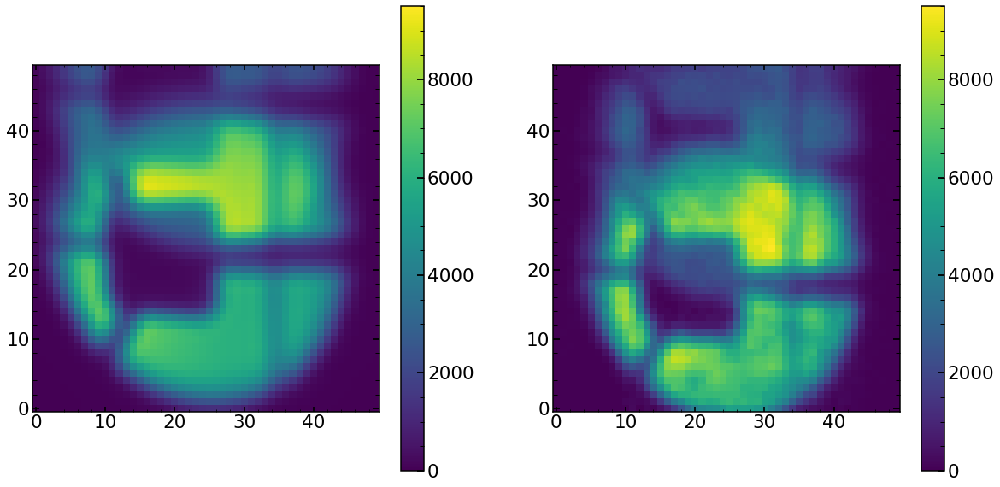

In [113]:
plt.figure(figsize=(20,10))

plt.subplot(121)
plt.imshow(complete_realization_renormalized,vmax=np.max(sci_image),vmin=0)
plt.colorbar()
plt.subplot(122)
plt.imshow(sci_image,vmax=np.max(sci_image),vmin=0)
plt.colorbar()

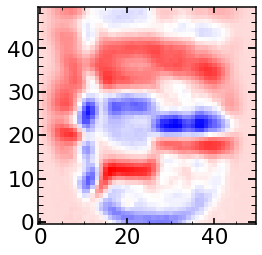

In [85]:
plt.imshow(complete_realization_renormalized-sci_image,cmap='bwr')

In [365]:
np.mean((sci_image-complete_realization_renormalized)**2/var_image)

-7118.768330735336

In [374]:
(sci_image-complete_realization_renormalized)**2/var_image


array([[   140.77617909,     42.54833829,   -681.25237795, ...,
            14.7357383 ,    108.01256136,      8.796074  ],
       [ -1038.27947979,    674.1325055 , -37437.30598316, ...,
            69.66841194,     41.11980976,     63.46512429],
       [  -954.63758976,   1757.6537087 , -14155.94689458, ...,
           188.18561909,     25.28249501,     50.84831923],
       ...,
       [   300.91666172,    154.73850387,  -5482.79600802, ...,
             0.01172979,     10.18668194,      0.03225351],
       [     1.00373802,   -865.60753126,    382.7117852 , ...,
          -174.79532371,   -140.42758913,      5.27462955],
       [    47.18724335,  -1446.18754528,    874.49115578, ...,
             2.47331342,     91.59188868,     63.40497677]])

In [375]:
var_image

array([[ 14.711201 ,  35.454014 , -22.02512  , ...,  35.840137 ,
         12.692646 ,  27.717726 ],
       [ -4.944906 ,   8.863164 ,  -0.4737836, ...,  22.364063 ,
         21.860422 ,  14.560198 ],
       [ -7.0861316,   5.636018 ,  -3.1291263, ...,  13.879082 ,
         27.551514 ,  17.072021 ],
       ...,
       [  6.7388096,  24.74133  ,  -3.7299454, ...,  24.929323 ,
         11.643525 ,  20.355097 ],
       [ 34.737537 ,  -6.0776796,  19.622143 , ...,  -4.552758 ,
         -5.3198867,  34.170906 ],
       [ 10.366924 ,  -1.8801544,   6.2136273, ...,  16.481041 ,
          3.4967895,   4.0994864]], dtype=float32)

In [274]:
print(input_img_single_realization_before_downsampling_primary_floor_floor.shape)
print(input_img_single_realization_before_downsampling_primary_floor_ceiling.shape)
print(input_img_single_realization_before_downsampling_primary_ceiling_floor.shape)

(500, 500)
(500, 500)
(500, 500)


In [207]:
if primary_offset_axis_0_floor<0 or (primary_offset_axis_0_floor+oversampling*shape_of_sci_image)>len(input_img)\
or primary_offset_axis_1_floor<0 or (primary_offset_axis_1_floor+oversampling*shape_of_sci_image)>len(input_img):
    print(1)
else:
    print(0)

0


In [210]:
    input_img_single_realization_before_downsampling_primary_floor_ceiling=input_img[primary_offset_axis_0_floor:primary_offset_axis_0_floor+oversampling*shape_of_sci_image,\
                                                               primary_offset_axis_1_ceiling:primary_offset_axis_1_ceiling+oversampling*shape_of_sci_image]

In [214]:
primary_offset_axis_1_ceiling

-1

In [187]:
primary_offset_axis_0_floor=0
primary_offset_axis_1_floor=1
input_img_single_realization_before_downsampling_primary_floor_floor=input_img[primary_offset_axis_0_floor:primary_offset_axis_0_floor+oversampling*shape_of_sci_image,\
                                                           primary_offset_axis_1_floor:primary_offset_axis_1_floor+oversampling*shape_of_sci_image]

In [192]:
pos = np.array([primary_offset_axis_0_floor, primary_offset_axis_1_floor])
input_img_single_realization_before_downsampling_primary_floor_floor_2 = np.full([oversampling*shape_of_sci_image, oversampling*shape_of_sci_image], 0)
fill_crop(input_img, pos, input_img_single_realization_before_downsampling_primary_floor_floor_2)

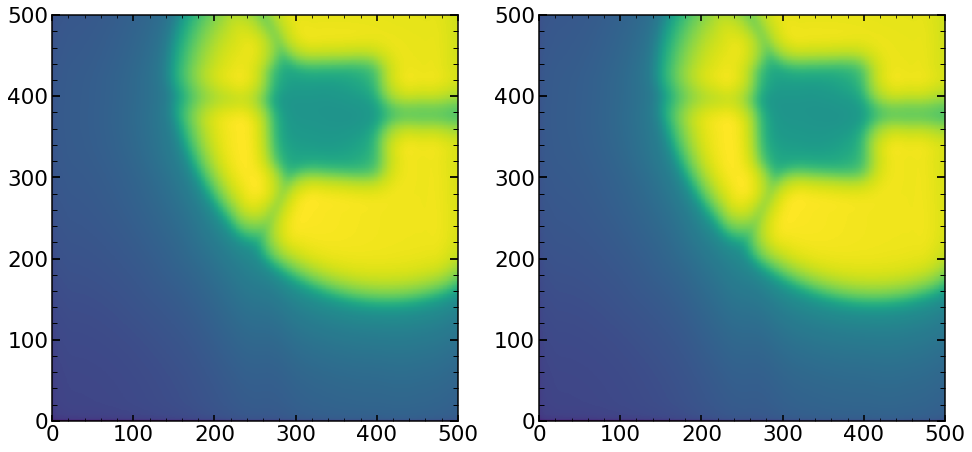

In [196]:
plt.figure(figsize=(16,8))

plt.subplot(121)
plt.imshow(input_img_single_realization_before_downsampling_primary_floor_floor,norm=LogNorm())


plt.subplot(122)
plt.imshow(input_img_single_realization_before_downsampling_primary_floor_floor_2,norm=LogNorm())

In [191]:
input_img_single_realization_before_downsampling_primary_floor_floor_2

In [150]:
img = np.arange(10, 10+10*10)\
          .reshape([10, 10])
# Off Top right
pos = np.array([-2, 8])
crop = np.full([5, 5], 0)
fill_crop(img, pos, crop)

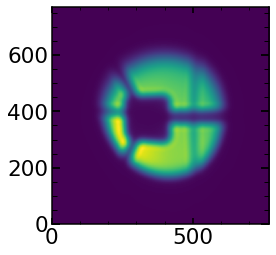

In [232]:
plt.imshow(input_img)

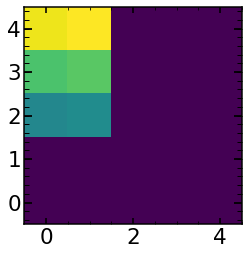

In [151]:
plt.imshow(crop)

In [167]:
img = np.arange(10, 10+10*10)\
          .reshape([10, 10])
# Off Top right
pos = np.array([300,0])
crop = np.full([500, 500], 0)
fill_crop(input_img, pos, crop)

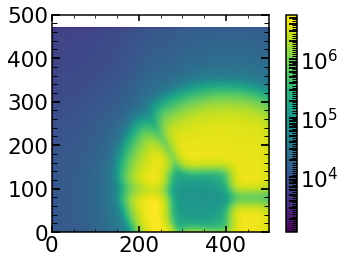

In [168]:
plt.imshow(crop,norm=LogNorm())
plt.colorbar()

In [198]:
len(input_img)

771

## Testing 

### single image testing - HgAr

In [396]:
with open('/Users/nevencaplar/Documents/PFS/ReducedData/Data_May_28/Dataframes/finalNe_May2019.pkl', 'rb') as f:
    finalNe_May2019=pickle.load(f)  
with open('/Users/nevencaplar/Documents/PFS/ReducedData/Data_May_28/Dataframes/finalHgAr_May2019.pkl', 'rb') as f:
    finalHgAr_May2019=pickle.load(f)  
with open('/Users/nevencaplar/Documents/PFS/ReducedData/Data_May_28/Dataframes/finalKr_May2019.pkl', 'rb') as f:
    finalKr_May2019=pickle.load(f)  
    
finalKr=finalKr_May2019
finalHgAr=finalHgAr_May2019
finalNe=finalNe_May2019

finalHgAr=finalHgAr_Feb2020_dataset

In [397]:
finalHgAr_Feb2020_dataset[finalHgAr_Feb2020_dataset['close']=='0']

,fiber,xc,yc,wavelength,close,lamp,xc_effective,second_offset,second_ratio,second2_offset,second2_ratio
0,2,69,808,690.9346,0,HgAr,69,-19.25,0.0034,-40.7,0.006
2,2,70,992,706.8989,0,HgAr,70,16.93,0.268,28.33,0.088
4,2,72,1358,738.6248,0,HgAr,72,-13.14,0.011,0,0
10,2,65,3517,922.7301,0,HgAr,65,22.44,0.022,-13.14,0.011
12,63,461,794,690.9346,0,HgAr,461,-19.25,0.0034,-40.7,0.006
14,63,461,977,706.8989,0,HgAr,461,16.93,0.268,28.33,0.088
16,63,463,1342,738.6248,0,HgAr,463,-13.14,0.011,0,0
22,63,458,3495,922.7301,0,HgAr,458,22.44,0.022,-13.14,0.011
24,192,845,785,690.9346,0,HgAr,845,-19.25,0.0034,-40.7,0.006
26,192,845,968,706.8989,0,HgAr,845,16.93,0.268,28.33,0.088


In [ ]:
# 50, 52, 58, 60

In [203]:
# 21346 +12 (m35); 21346 +54 (0); 21346 +96 (p35)

In [398]:
columns22=['z4','z5','z6','z7','z8','z9','z10','z11',
       'z12','z13','z14','z15','z16','z17','z18','z19','z20','z21','z22',
      'hscFrac','strutFrac','dxFocal','dyFocal','slitFrac','slitFrac_dy',
      'radiometricEffect','radiometricExponent','x_ilum','y_ilum',
      'x_fiber','y_fiber','effective_radius_illumination',
      'frd_sigma','frd_lorentz_factor','det_vert','slitHolder_frac_dx',
      'grating_lines','scattering_slope','scattering_amplitude',
      'pixel_effect','fiber_r','flux']  

columns22_analysis=columns22+['chi2','chi2max']

In [400]:
date='Dec04'
obs=21346+12
obs_int=int(obs)
single_number='60'
image_index=int(single_number)
eps=5
arc='HgAr'
dataset=4

if dataset==2:
    STAMPS_FOLDER="/Users/nevencaplar/Documents/PFS/ReducedData/Data_May_28/Stamps_cleaned/"
if dataset==3:
    STAMPS_FOLDER="/Users/nevencaplar/Documents/PFS/ReducedData/Data_Jun_25/Stamps_cleaned/"
if dataset==4 or dataset==5:
    STAMPS_FOLDER="/Users/nevencaplar/Documents/PFS/ReducedData/Data_Aug_14/Stamps_cleaned/"    

if dataset==1:
    if arc=="HgAr":
        single_number_focus=11748
    elif arc=="Ne":
        single_number_focus=11748+607    
    else:
        print("Not recognized arc-line")
        
if dataset==2:
    if arc=="HgAr":
        single_number_focus=17017+54
    elif arc=="Ne":
        single_number_focus=16292  
    elif arc=="Kr":
        single_number_focus=17364  
    else:
        print("Not recognized arc-line")
        
if dataset==3:
    if arc=="HgAr":
        single_number_focus=19238+54
    elif arc=="Ne":
        single_number_focus=19472  
    else:
        print("Not recognized arc-line")
      
if dataset==4 or dataset==5:
    if arc=="HgAr":
        single_number_focus=21346+54
    elif arc=="Ne":
        single_number_focus=21550 +54 
    elif arc=="Kr":
        single_number_focus=21754  +54 
    else:
        print("Not recognized arc-line")    
    
if dataset==1:
    if arc=='HgAr':
        obs_possibilites=np.array([11796,11790,11784,11778,11772,11766,11760,11754,11748,11748,11694,11700,11706,11712,11718,11724,11730,11736])
    elif arc=='Ne':
        obs_possibilites=np.array([12403,12397,12391,12385,12379,12373,12367,12361,12355,12355,12349,12343,12337,12331,12325,12319,12313,12307])
        
if dataset==2:
    if arc=='HgAr':
        obs_possibilites=np.array([17023,17023+6,17023+12,17023+18,17023+24,17023+30,17023+36,17023+42,17023+48,17023+48,\
                                   17023+54,17023+60,17023+66,17023+72,17023+78,17023+84,17023+90,17023+96,17023+48])
    if arc=='Ne':
        # different sequence than for HgAr
        obs_possibilites=np.array([16238+6,16238+12,16238+18,16238+24,16238+30,16238+36,16238+42,16238+48,16238+54,16238+54,\
                                   16238+60,16238+66,16238+72,16238+78,16238+84,16238+90,16238+96,16238+102,16238+54])
    if arc=='Kr':
         obs_possibilites=np.array([17310+6,17310+12,17310+18,17310+24,17310+30,17310+36,17310+42,17310+48,17310+54,17310+54,\
                                    17310+60,17310+66,17310+72,17310+78,17310+84,17310+90,17310+96,17310+102,17310+54])

if dataset==3:    
    if arc=='HgAr':
        obs_possibilites=np.array([19238,19238+6,19238+12,19238+18,19238+24,19238+30,19238+36,19238+42,19238+48,19238+48,\
                                   19238+54,19238+60,19238+66,19238+72,19238+78,19238+84,19238+90,19238+96,19238+48])
    elif arc=='Ne':
    # different sequence than for HgAr
        obs_possibilites=np.array([19472+6,19472+12,19472+18,19472+24,19472+30,19472+36,19472+42,19472+48,19472+54,19472+54,\
                                   19472+60,19472+66,19472+72,19472+78,19472+84,19472+90,19472+96,19472+102,19472+54]) 
  
if dataset==4:
    if arc=='HgAr':
        obs_possibilites=np.array([21346+6,21346+12,21346+18,21346+24,21346+30,21346+36,21346+42,21346+48,21346+54,21346+54,\
                                   21346+60,21346+66,21346+72,21346+78,21346+84,21346+90,21346+96,21346+102,21346+48])
    if arc=='Ne':
        obs_possibilites=np.array([21550+6,21550+12,21550+18,21550+24,21550+30,21550+36,21550+42,21550+48,21550+54,21550+54,\
                                   21550+60,21550+66,21550+72,21550+78,21550+84,21550+90,21550+96,21550+102,21550+54])
    if arc=='Kr':
         obs_possibilites=np.array([21754+6,21754+12,21754+18,21754+24,21754+30,21754+36,21754+42,21754+48,21754+54,21754+54,\
                                    21754+60,21754+66,21754+72,21754+78,21754+84,21754+90,21754+96,21754+102,21754+54])
 
if dataset==5:
    if arc=='HgAr':
        obs_possibilites=np.arange(21280,21280+11*6,6)
    if arc=='Ne':
        obs_possibilites=np.arange(21484,21484+11*6,6)
    if arc=='Kr':
         obs_possibilites=np.arange(21688,21688+11*6,6)



label=['m4','m35','m3','m25','m2','m15','m1','m05','0d','0','p05','p1','p15','p2','p25','p3','p35','p4','0p']
label_fine_defocus=['m05ff','m04ff','m03ff','m02ff','m01ff','0ff','p01ff','p02ff','p03ff','p04ff','p05ff']
if dataset in [0,1,2,3,4]:
    labelInput=label[list(obs_possibilites).index(obs_int)]
if dataset in [5]:
    labelInput=label_fine_defocus[list(obs_possibilites).index(obs_int)]
    
    
print(labelInput)
if obs==8600:
    print("Not implemented for December 2018 data")
else:
    sci_image =np.load(STAMPS_FOLDER+'sci'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
    mask_image =np.load(STAMPS_FOLDER+'mask'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
    var_image =np.load(STAMPS_FOLDER+'var'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
    #sci_image_focus_large =np.load(STAMPS_FOLDER+'sci'+str(single_number_focus)+str(single_number)+str(arc)+'_Stacked_large.npy')
    #var_image_focus_large =np.load(STAMPS_FOLDER+'var'+str(single_number_focus)+str(single_number)+str(arc)+'_Stacked_large.npy')

if dataset==1:
    if arc=="HgAr":
        finalArc=finalHgAr_Feb2019
    elif arc=="Ne":
        finalArc=finalNe_Feb2019    
    else:
        print("Not recognized arc-line")  
        
if dataset==2:   
    if arc=="HgAr":
        finalArc=finalHgAr_May2019
    elif arc=="Ne":
        finalArc=finalNe_May2019    
    elif arc=="Kr":
        finalArc=finalKr_May2019    
    else:
        print("Not recognized arc-line")   
        
if dataset==3:   
    if arc=="HgAr":
        finalArc=finalHgAr_May2019
    elif arc=="Ne":
        finalArc=finalNe_May2019    
    else:
        print("Not recognized arc-line")   
        
if dataset==4 or dataset==5:   
    if arc=="HgAr":
        finalArc=finalHgAr
    elif arc=="Ne":
        finalArc=finalNe  
    elif arc=="Kr":
        finalArc=finalKr 
    else:
        print("Not recognized arc-line")           
        
double_sources_positions_ratios=finalArc.loc[int(single_number)][['second_offset','second_ratio']].values
double_sources_positions_ratios

m35


array([-19.25, 0.0034], dtype=object)

In [417]:
#with open('/Users/nevencaplar/Documents/PFS/Fit_Results/Dec040119/results_of_fit_many_interpolation_HgAr_from_Dec04.pkl', 'rb') as f:
#    results_of_fit_many_interpolation_HgAr=pickle.load(f)  

In [418]:
#minchain=results_of_fit_many_interpolation_HgAr[labelInput].loc[int(single_number)].values[0:42]

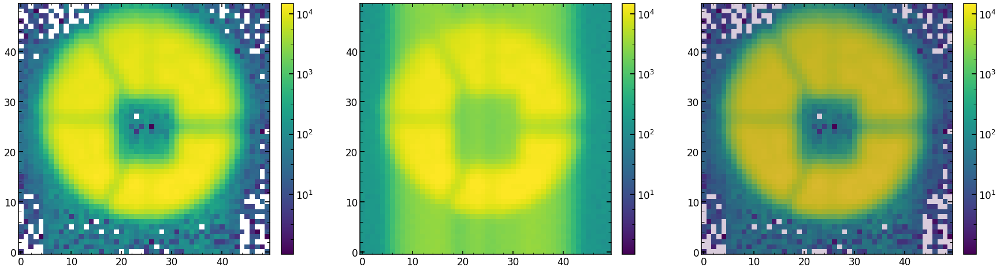

In [401]:
plt.figure(figsize=(30,8))
plt.subplot(131)
plt.imshow(sci_image,norm=LogNorm(),origin='lower',vmin=1,vmax=np.max(sci_image))
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

plt.subplot(132)
plt.imshow(var_image,norm=LogNorm(),origin='lower',vmin=1,vmax=np.max(sci_image))
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

plt.subplot(133)
plt.imshow(sci_image,norm=LogNorm(),origin='lower',vmin=1,vmax=np.max(sci_image))
cbar=plt.colorbar(fraction=0.046, pad=0.04)
plt.imshow(mask_image,origin='lower',vmin=0,vmax=np.max(mask_image),alpha=0.2)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])
#cbar.set_ticks([10,10**2,10**3,10**4,10**5])

In [402]:
single_analysis=Zernike_Analysis(date,obs,single_number,eps,arc,dataset)

chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains()

minchain,like_min=single_analysis.create_likelihood()


FileNotFoundError: [Errno 2] No such file or directory: '/Users/nevencaplar/Documents/PFS/TigerAnalysis/ResultsFromTiger/Dec04/chainDec04_Single_P_21358605HgArEmcee3.npy'

In [1326]:
print(minchain.shape)

if len(minchain)==42:
    columns=columns22
    
dfz22 = pd.DataFrame(np.array([np.array([minchain])[0][0:8]]),columns=columns[0:8])
print(dfz22)
dfglobal = pd.DataFrame(np.array([np.array([minchain])[0][8:len(columns)]]),columns=columns[8:])

dfglobal1 = pd.DataFrame(np.array([np.array([minchain])[0][8:18]]),columns=columns[8:18])
print(dfglobal1)

dfglobal2 = pd.DataFrame(np.array([np.array([minchain])[0][18:len(columns)]]),columns=columns[18:])
print(dfglobal2)

(42,)
          z4        z5        z6       z7        z8        z9       z10  \
0  11.242011 -0.188807 -0.510486  0.48854 -0.066504 -0.029264 -0.305734   

        z11  
0 -0.437655  
       z12      z13       z14       z15       z16      z17       z18  \
0 -0.03332 -0.02113  0.002525  0.030814 -0.016037  0.03049  0.014624   

        z19       z20       z21  
0  0.004862 -0.029371  0.020868  
        z22   hscFrac  strutFrac   dxFocal   dyFocal  slitFrac  slitFrac_dy  \
0  0.027822  0.657953   0.077704 -0.039881 -0.035965   0.05738     0.019607   

   radiometricEffect  radiometricExponent    x_ilum  ...  frd_sigma  \
0           0.000006             0.000006  0.974192  ...   0.046342   

   frd_lorentz_factor  det_vert  slitHolder_frac_dx  grating_lines  \
0            0.848911  1.021602            0.163393       100000.0   

   scattering_slope  scattering_amplitude  pixel_effect   fiber_r      flux  
0          2.375761              0.002273      0.372625  1.833346  0.998369  

[1

In [422]:
"""
size=chain0_Emcee3.shape[1]
matplotlib.rcParams.update({'font.size': 18})
plt.figure(figsize=(18,10))
plt.subplot(211)
plt.plot(np.linspace(1,len(like_min),len(like_min)),like_min,'blue',ls='-',marker='o')
plt.ylabel('likelihood')
plt.xlabel('steps')
plt.axvline(size+0.5,ls='--')
plt.axvline(size*2+0.5,ls='--')
plt.axvline(size*5+0.5,ls='--')
plt.subplot(212)
plt.plot(np.linspace(1,len(like_min),len(like_min)),np.log10(like_min),'blue',ls='-',marker='o')
plt.ylabel('log10(likelihood)')
plt.xlabel('steps')
plt.axvline(size+0.5,ls='--')
plt.axvline(2*size+0.5,ls='--')
plt.axvline(5*size+0.5,ls='--')
"""

"\nsize=chain0_Emcee3.shape[1]\nmatplotlib.rcParams.update({'font.size': 18})\nplt.figure(figsize=(18,10))\nplt.subplot(211)\nplt.plot(np.linspace(1,len(like_min),len(like_min)),like_min,'blue',ls='-',marker='o')\nplt.ylabel('likelihood')\nplt.xlabel('steps')\nplt.axvline(size+0.5,ls='--')\nplt.axvline(size*2+0.5,ls='--')\nplt.axvline(size*5+0.5,ls='--')\nplt.subplot(212)\nplt.plot(np.linspace(1,len(like_min),len(like_min)),np.log10(like_min),'blue',ls='-',marker='o')\nplt.ylabel('log10(likelihood)')\nplt.xlabel('steps')\nplt.axvline(size+0.5,ls='--')\nplt.axvline(2*size+0.5,ls='--')\nplt.axvline(5*size+0.5,ls='--')\n"

In [423]:
double_sources_positions_ratios

array([-19.25, 0.0034], dtype=object)

In [1327]:
model = LN_PFS_single(sci_image,var_image,dithering=1,save=1,zmax=22,verbosity=1,double_sources=1,double_sources_positions_ratios=double_sources_positions_ratios)   

#model = LN_PFS_single(sci_image,var_image,dithering=1,save=1,zmax=22,verbosity=1)   
#minchain_new=np.copy(minchain)   
#minchain_new[0]=10
#minchain_new[1]=5

model(minchain)

Science image shape is: (24, 24)
Top left pixel value of the science image is: 20.054771
Variance image shape is: (24, 24)
Top left pixel value of the variance image is: 136.57828
Mask image shape is: (24, 24)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 22

Entering lnlike_Neven
allparameters [    11.24201054     -0.18880727     -0.51048555      0.48854044
     -0.06650393     -0.02926417     -0.30573449     -0.43765508
     -0.03332047     -0.02112988      0.00252501      0.03081372
     -0.01603718      0.03049034      0.01462416      0.00486247
     -0.02937053      0.02086785      0.02782176      0.65795276
      0.07770441     -0.0398807      -0.03596498      0.05737953
      0.01960748      0.00000571      0.00000571      0.97419189
      0.94833741      0.01763395     -0.04024357      0.9234304
      0.04634167      0.8489109

Finished with optPsf_postprocessing
 
Finished with constructModelImage_PFS_naturalResolution
 
Finished with lnlike_Neven
 


-22751.019141297562

chi**2 reduced is: 69.76512232167931
Abs of residual divided by total flux is: 0.05922559496254589
Abs of residual divided by largest value of a flux in the image is: 0.11303076706815843


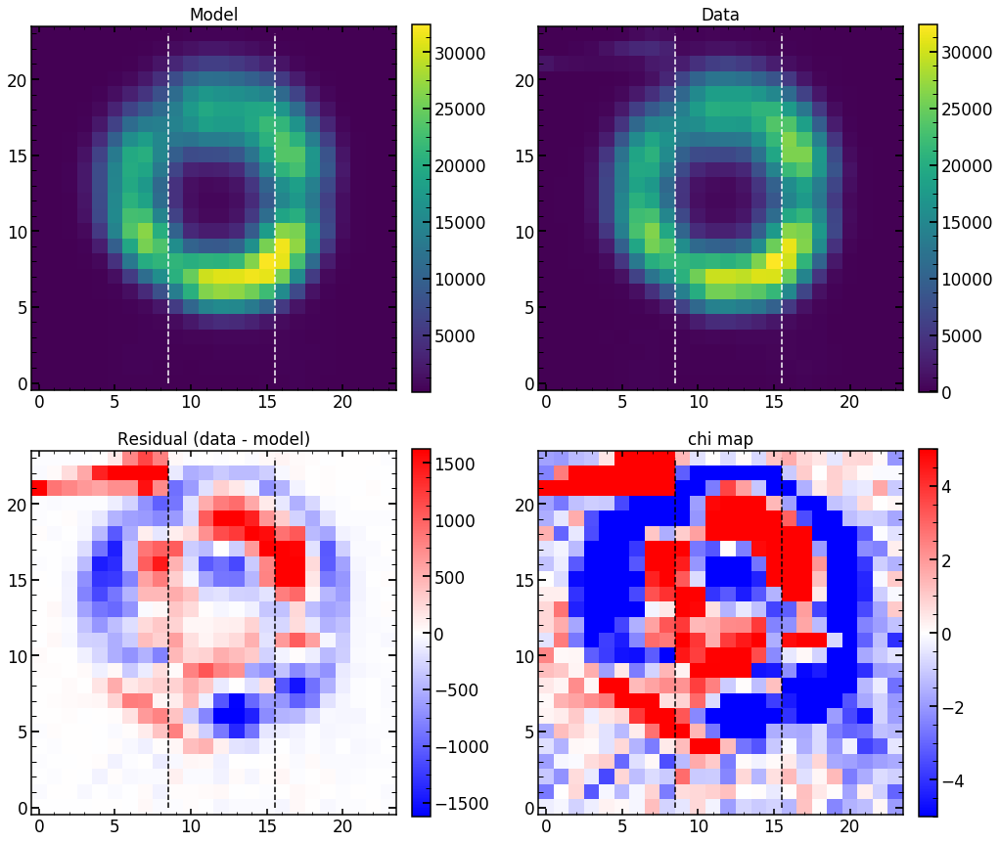

In [1330]:
matplotlib.rcParams.update({'font.size': 14})
single_analysis.create_basic_comparison_plot()

69.76512232167931
chi**2 reduced is: 69.76512232167931
Abs of residual divided by total flux is: 0.05922559496254589
Abs of residual divided by largest value of a flux in the image is: 0.11303076706815843


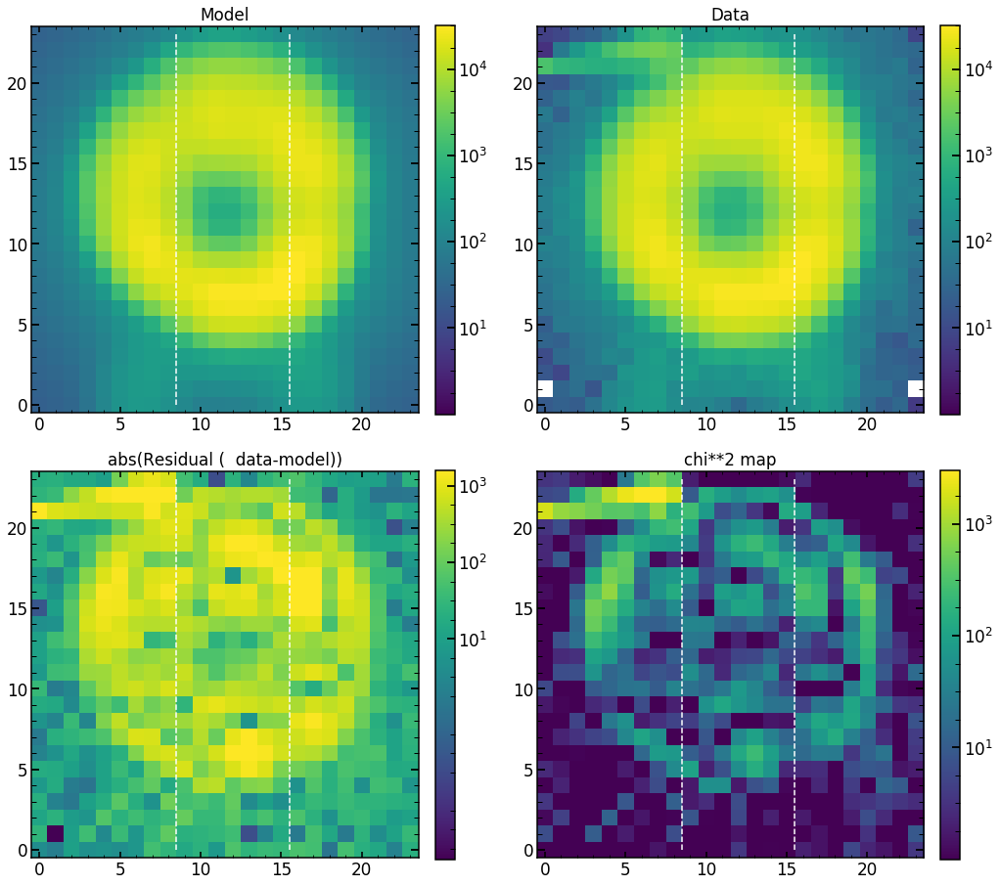

In [1334]:
matplotlib.rcParams.update({'font.size': 14})
single_analysis.create_basic_comparison_plot_log()

In [427]:
image=np.load(TESTING_FINAL_IMAGES_FOLDER+'image.npy')

single_realization_primary_renormalized=np.load(TESTING_FINAL_IMAGES_FOLDER+'single_realization_primary_renormalized.npy')
single_realization_secondary_renormalized=np.load(TESTING_FINAL_IMAGES_FOLDER+'single_realization_secondary_renormalized.npy')
complete_realization_renormalized=np.load(TESTING_FINAL_IMAGES_FOLDER+'complete_realization_renormalized.npy')

input_img_single_realization_before_downsampling_primary_floor_floor=np.load(TESTING_FINAL_IMAGES_FOLDER+'input_img_single_realization_before_downsampling_primary_floor_floor.npy')
input_img_single_realization_before_downsampling_primary_floor_ceiling=np.load(TESTING_FINAL_IMAGES_FOLDER+'input_img_single_realization_before_downsampling_primary_floor_ceiling.npy')
input_img_single_realization_before_downsampling_primary_ceiling_floor=np.load(TESTING_FINAL_IMAGES_FOLDER+'input_img_single_realization_before_downsampling_primary_ceiling_floor.npy')
input_img_single_realization_before_downsampling_primary_ceiling_ceiling=np.load(TESTING_FINAL_IMAGES_FOLDER+'input_img_single_realization_before_downsampling_primary_ceiling_ceiling.npy')


input_img_single_realization_before_downsampling_primary=np.load(TESTING_FINAL_IMAGES_FOLDER+'input_img_single_realization_before_downsampling_primary.npy')
single_primary_realization=np.load(TESTING_FINAL_IMAGES_FOLDER+'single_primary_realization.npy')
single_secondary_realization=np.load(TESTING_FINAL_IMAGES_FOLDER+'single_secondary_realization.npy')
single_primary_realization_renormalized_within_create_complete_realization=np.load(TESTING_FINAL_IMAGES_FOLDER+'single_primary_realization_renormalized_within_create_complete_realization.npy')
single_secondary_realization_renormalized_within_create_complete_realization=np.load(TESTING_FINAL_IMAGES_FOLDER+'single_secondary_realization_renormalized_within_create_complete_realization.npy')
complete_realization_renormalized_within_create_complete_realization=np.load(TESTING_FINAL_IMAGES_FOLDER+'complete_realization_renormalized_within_create_complete_realization.npy')


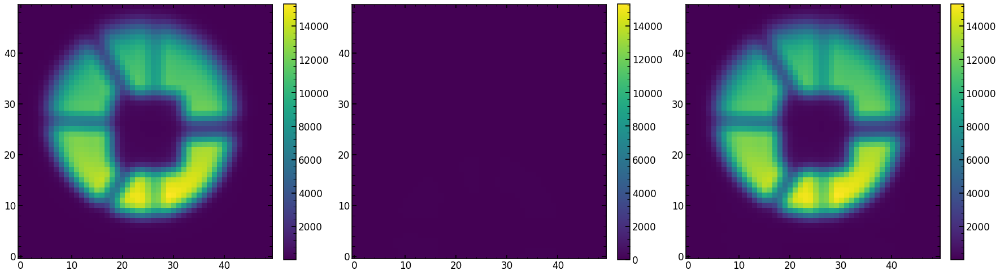

In [428]:
plt.figure(figsize=(30,10))

plt.subplot(131)
plt.imshow(single_realization_primary_renormalized,vmax=np.max(complete_realization_renormalized))
plt.colorbar(fraction=0.046, pad=0.04)
    
plt.subplot(132)
plt.imshow(single_realization_secondary_renormalized,vmax=np.max(complete_realization_renormalized))
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(133)
plt.imshow(complete_realization_renormalized,vmax=np.max(complete_realization_renormalized))
plt.colorbar(fraction=0.046, pad=0.04)

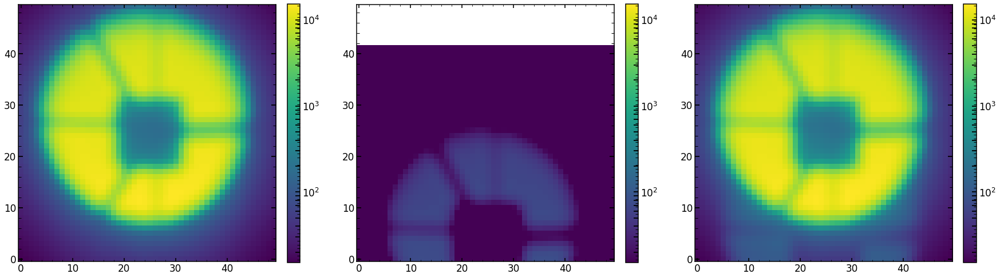

In [429]:
plt.figure(figsize=(30,10))

plt.subplot(131)
plt.imshow(single_realization_primary_renormalized,norm=LogNorm(),vmax=np.max(complete_realization_renormalized),vmin=np.min(complete_realization_renormalized))
plt.colorbar(fraction=0.046, pad=0.04)
    
plt.subplot(132)
plt.imshow(single_realization_secondary_renormalized,norm=LogNorm(),vmax=np.max(complete_realization_renormalized),vmin=np.min(complete_realization_renormalized))
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(133)
plt.imshow(complete_realization_renormalized,norm=LogNorm(),vmax=np.max(complete_realization_renormalized),vmin=np.min(complete_realization_renormalized))
plt.colorbar(fraction=0.046, pad=0.04)

In [430]:
sci_image=np.load(TESTING_FINAL_IMAGES_FOLDER+'sci_image.npy')
initial_complete_realization=np.load(TESTING_FINAL_IMAGES_FOLDER+'initial_complete_realization.npy')

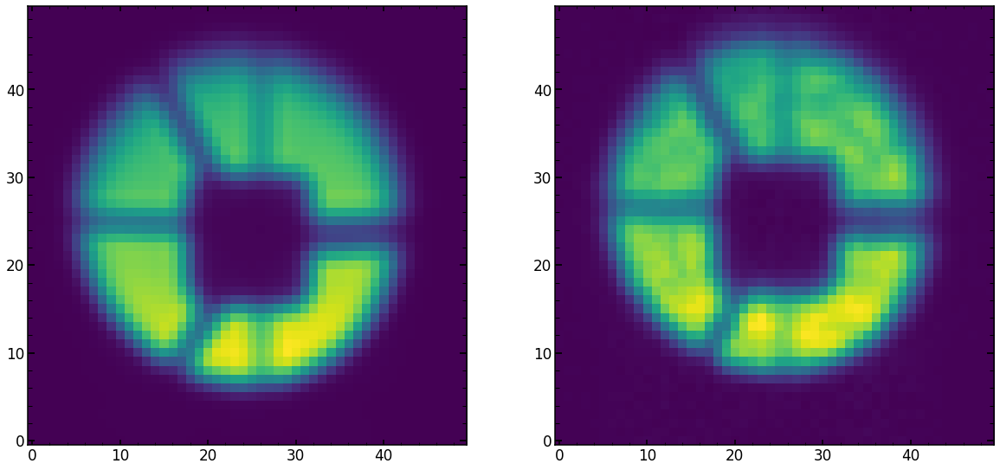

In [431]:
plt.figure(figsize=(20,12))

plt.subplot(121)
plt.imshow(initial_complete_realization)

plt.subplot(122)
plt.imshow(sci_image)

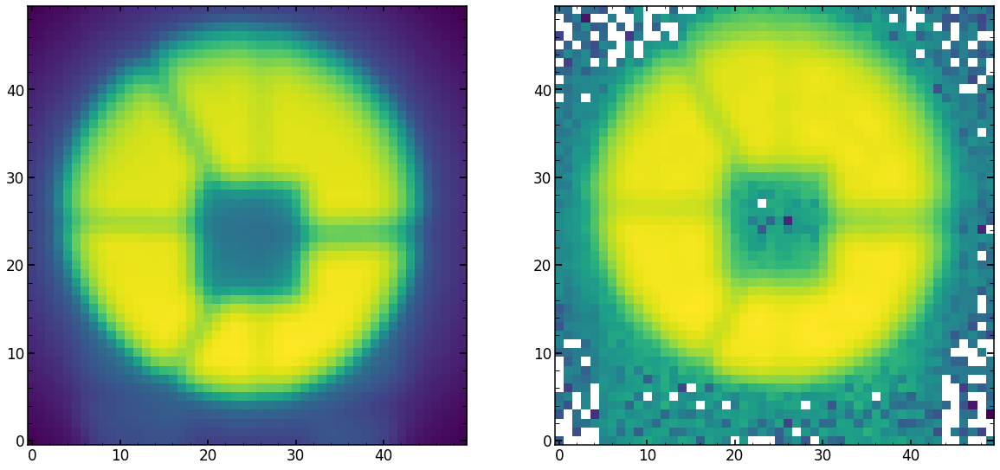

In [432]:
plt.figure(figsize=(20,12))

plt.subplot(121)
plt.imshow(initial_complete_realization,norm=LogNorm())

plt.subplot(122)
plt.imshow(sci_image,norm=LogNorm())

### single image testing - Neon

In [524]:
with open('/Users/nevencaplar/Documents/PFS/ReducedData/Data_May_28/Dataframes/finalNe_May2019.pkl', 'rb') as f:
    finalNe_May2019=pickle.load(f)  
with open('/Users/nevencaplar/Documents/PFS/ReducedData/Data_May_28/Dataframes/finalHgAr_May2019.pkl', 'rb') as f:
    finalHgAr_May2019=pickle.load(f)  
with open('/Users/nevencaplar/Documents/PFS/ReducedData/Data_May_28/Dataframes/finalKr_May2019.pkl', 'rb') as f:
    finalKr_May2019=pickle.load(f)  
    
finalKr=finalKr_May2019
finalHgAr=finalHgAr_May2019
finalNe=finalNe_May2019

finalHgAr=finalHgAr_Feb2020_dataset
finalNe=finalNe_Feb2020_dataset

In [525]:
finalNe_Feb2020_dataset[(finalNe_Feb2020_dataset['close']=='0')&(finalNe_Feb2020_dataset['fiber']==401)]

,fiber,xc,yc,wavelength,close,lamp,xc_effective,second_offset,second_ratio,second2_offset,second2_ratio
45,401,1995,315,650.84186,0,Ne,1995,30.12,0.406,0,0
48,401,1995,511,668.01764,0,Ne,1995,44.24,0.67,-29.97,0.003
53,401,1995,1377,744.1276,0,Ne,1995,38.57,0.012,57.44,0.162


In [203]:
# 45,48,53 
# 21550 +12 (m35); 21550 +54 (0); 21550 +96 (p35)

In [526]:
columns22=['z4','z5','z6','z7','z8','z9','z10','z11',
       'z12','z13','z14','z15','z16','z17','z18','z19','z20','z21','z22',
      'hscFrac','strutFrac','dxFocal','dyFocal','slitFrac','slitFrac_dy',
      'radiometricEffect','radiometricExponent','x_ilum','y_ilum',
      'x_fiber','y_fiber','effective_radius_illumination',
      'frd_sigma','frd_lorentz_factor','det_vert','slitHolder_frac_dx',
      'grating_lines','scattering_slope','scattering_amplitude',
      'pixel_effect','fiber_r','flux']  

columns22_analysis=columns22+['chi2','chi2max']

In [858]:
date='Dec04'
obs=21550+54
obs_int=int(obs)
single_number='45'
image_index=int(single_number)
eps=5
arc='Ne'
dataset=4

if dataset==2:
    STAMPS_FOLDER="/Users/nevencaplar/Documents/PFS/ReducedData/Data_May_28/Stamps_cleaned/"
if dataset==3:
    STAMPS_FOLDER="/Users/nevencaplar/Documents/PFS/ReducedData/Data_Jun_25/Stamps_cleaned/"
if dataset==4 or dataset==5:
    STAMPS_FOLDER="/Users/nevencaplar/Documents/PFS/ReducedData/Data_Aug_14/Stamps_cleaned/"    

if dataset==1:
    if arc=="HgAr":
        single_number_focus=11748
    elif arc=="Ne":
        single_number_focus=11748+607    
    else:
        print("Not recognized arc-line")
        
if dataset==2:
    if arc=="HgAr":
        single_number_focus=17017+54
    elif arc=="Ne":
        single_number_focus=16292  
    elif arc=="Kr":
        single_number_focus=17364  
    else:
        print("Not recognized arc-line")
        
if dataset==3:
    if arc=="HgAr":
        single_number_focus=19238+54
    elif arc=="Ne":
        single_number_focus=19472  
    else:
        print("Not recognized arc-line")
      
if dataset==4 or dataset==5:
    if arc=="HgAr":
        single_number_focus=21346+54
    elif arc=="Ne":
        single_number_focus=21550 +54 
    elif arc=="Kr":
        single_number_focus=21754  +54 
    else:
        print("Not recognized arc-line")    
    
if dataset==1:
    if arc=='HgAr':
        obs_possibilites=np.array([11796,11790,11784,11778,11772,11766,11760,11754,11748,11748,11694,11700,11706,11712,11718,11724,11730,11736])
    elif arc=='Ne':
        obs_possibilites=np.array([12403,12397,12391,12385,12379,12373,12367,12361,12355,12355,12349,12343,12337,12331,12325,12319,12313,12307])
        
if dataset==2:
    if arc=='HgAr':
        obs_possibilites=np.array([17023,17023+6,17023+12,17023+18,17023+24,17023+30,17023+36,17023+42,17023+48,17023+48,\
                                   17023+54,17023+60,17023+66,17023+72,17023+78,17023+84,17023+90,17023+96,17023+48])
    if arc=='Ne':
        # different sequence than for HgAr
        obs_possibilites=np.array([16238+6,16238+12,16238+18,16238+24,16238+30,16238+36,16238+42,16238+48,16238+54,16238+54,\
                                   16238+60,16238+66,16238+72,16238+78,16238+84,16238+90,16238+96,16238+102,16238+54])
    if arc=='Kr':
         obs_possibilites=np.array([17310+6,17310+12,17310+18,17310+24,17310+30,17310+36,17310+42,17310+48,17310+54,17310+54,\
                                    17310+60,17310+66,17310+72,17310+78,17310+84,17310+90,17310+96,17310+102,17310+54])

if dataset==3:    
    if arc=='HgAr':
        obs_possibilites=np.array([19238,19238+6,19238+12,19238+18,19238+24,19238+30,19238+36,19238+42,19238+48,19238+48,\
                                   19238+54,19238+60,19238+66,19238+72,19238+78,19238+84,19238+90,19238+96,19238+48])
    elif arc=='Ne':
    # different sequence than for HgAr
        obs_possibilites=np.array([19472+6,19472+12,19472+18,19472+24,19472+30,19472+36,19472+42,19472+48,19472+54,19472+54,\
                                   19472+60,19472+66,19472+72,19472+78,19472+84,19472+90,19472+96,19472+102,19472+54]) 
  
if dataset==4:
    if arc=='HgAr':
        obs_possibilites=np.array([21346+6,21346+12,21346+18,21346+24,21346+30,21346+36,21346+42,21346+48,21346+54,21346+54,\
                                   21346+60,21346+66,21346+72,21346+78,21346+84,21346+90,21346+96,21346+102,21346+48])
    if arc=='Ne':
        obs_possibilites=np.array([21550+6,21550+12,21550+18,21550+24,21550+30,21550+36,21550+42,21550+48,21550+54,21550+54,\
                                   21550+60,21550+66,21550+72,21550+78,21550+84,21550+90,21550+96,21550+102,21550+54])
    if arc=='Kr':
         obs_possibilites=np.array([21754+6,21754+12,21754+18,21754+24,21754+30,21754+36,21754+42,21754+48,21754+54,21754+54,\
                                    21754+60,21754+66,21754+72,21754+78,21754+84,21754+90,21754+96,21754+102,21754+54])
 
if dataset==5:
    if arc=='HgAr':
        obs_possibilites=np.arange(21280,21280+11*6,6)
    if arc=='Ne':
        obs_possibilites=np.arange(21484,21484+11*6,6)
    if arc=='Kr':
         obs_possibilites=np.arange(21688,21688+11*6,6)



label=['m4','m35','m3','m25','m2','m15','m1','m05','0d','0','p05','p1','p15','p2','p25','p3','p35','p4','0p']
label_fine_defocus=['m05ff','m04ff','m03ff','m02ff','m01ff','0ff','p01ff','p02ff','p03ff','p04ff','p05ff']
if dataset in [0,1,2,3,4]:
    labelInput=label[list(obs_possibilites).index(obs_int)]
if dataset in [5]:
    labelInput=label_fine_defocus[list(obs_possibilites).index(obs_int)]
    
    
print(labelInput)
if obs==8600:
    print("Not implemented for December 2018 data")
else:
    sci_image =np.load(STAMPS_FOLDER+'sci'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
    mask_image =np.load(STAMPS_FOLDER+'mask'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
    var_image =np.load(STAMPS_FOLDER+'var'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
    #sci_image_focus_large =np.load(STAMPS_FOLDER+'sci'+str(single_number_focus)+str(single_number)+str(arc)+'_Stacked_large.npy')
    #var_image_focus_large =np.load(STAMPS_FOLDER+'var'+str(single_number_focus)+str(single_number)+str(arc)+'_Stacked_large.npy')

if dataset==1:
    if arc=="HgAr":
        finalArc=finalHgAr_Feb2019
    elif arc=="Ne":
        finalArc=finalNe_Feb2019    
    else:
        print("Not recognized arc-line")  
        
if dataset==2:   
    if arc=="HgAr":
        finalArc=finalHgAr_May2019
    elif arc=="Ne":
        finalArc=finalNe_May2019    
    elif arc=="Kr":
        finalArc=finalKr_May2019    
    else:
        print("Not recognized arc-line")   
        
if dataset==3:   
    if arc=="HgAr":
        finalArc=finalHgAr_May2019
    elif arc=="Ne":
        finalArc=finalNe_May2019    
    else:
        print("Not recognized arc-line")   
        
if dataset==4 or dataset==5:   
    if arc=="HgAr":
        finalArc=finalHgAr
    elif arc=="Ne":
        finalArc=finalNe  
    elif arc=="Kr":
        finalArc=finalKr 
    else:
        print("Not recognized arc-line")           
        
double_sources_positions_ratios=finalArc.loc[int(single_number)][['second_offset','second_ratio']].values
double_sources_positions_ratios

0d


array([30.12, 0.406], dtype=object)

In [859]:
with open('/Users/nevencaplar/Documents/PFS/Fit_Results/Dec040119/results_of_fit_many_interpolation_Ne_from_Dec04.pkl', 'rb') as f:
    results_of_fit_many_interpolation_Ne=pickle.load(f)  

In [860]:
minchain=results_of_fit_many_interpolation_Ne[labelInput].loc[int(single_number)].values[0:42]

In [861]:
np.max(sci_image)

305831.56

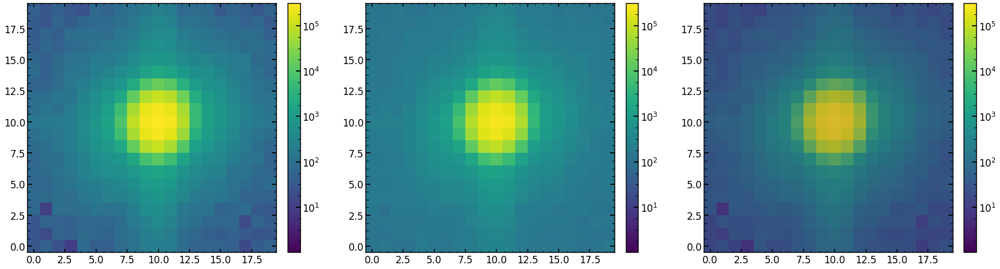

In [862]:
plt.figure(figsize=(30,8))
plt.subplot(131)
plt.imshow(sci_image,norm=LogNorm(),origin='lower',vmin=1,vmax=np.max(sci_image))
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

plt.subplot(132)
plt.imshow(var_image,norm=LogNorm(),origin='lower',vmin=1,vmax=np.max(sci_image))
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

plt.subplot(133)
plt.imshow(sci_image,norm=LogNorm(),origin='lower',vmin=1,vmax=np.max(sci_image))
cbar=plt.colorbar(fraction=0.046, pad=0.04)
plt.imshow(mask_image,origin='lower',vmin=0,vmax=np.max(mask_image),alpha=0.2)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])
#cbar.set_ticks([10,10**2,10**3,10**4,10**5])

In [863]:

single_analysis=Zernike_Analysis(date,obs,single_number,eps,arc,dataset)
"""
chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains()

minchain,like_min=single_analysis.create_likelihood()
"""

'\nchain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains()\n\nminchain,like_min=single_analysis.create_likelihood()\n'

In [864]:
print(minchain.shape)

if len(minchain)==42:
    columns=columns22
    
dfz22 = pd.DataFrame(np.array([np.array([minchain])[0][0:8]]),columns=columns[0:8])
print(dfz22)
dfglobal = pd.DataFrame(np.array([np.array([minchain])[0][8:len(columns)]]),columns=columns[8:])

dfglobal1 = pd.DataFrame(np.array([np.array([minchain])[0][8:18]]),columns=columns[8:18])
print(dfglobal1)

dfglobal2 = pd.DataFrame(np.array([np.array([minchain])[0][18:len(columns)]]),columns=columns[18:])
print(dfglobal2)

(42,)
         z4        z5       z6        z7        z8        z9       z10  \
0  0.155054 -0.014955 -0.78641  0.761733 -0.154298  0.051445 -0.210381   

       z11  
0 -0.22911  
       z12       z13       z14       z15      z16       z17       z18  \
0  0.09089 -0.023043  0.004635  0.029569 -0.02183 -0.024622  0.010859   

        z19       z20       z21  
0  0.023726 -0.023766  0.009245  
        z22   hscFrac  strutFrac   dxFocal   dyFocal  slitFrac  slitFrac_dy  \
0  0.016703  0.643214   0.083014  0.011217 -0.108091  0.056768     0.025473   

   radiometricEffect  radiometricExponent    x_ilum  ...  frd_sigma  \
0           0.000016             0.000016  0.973581  ...   0.060306   

   frd_lorentz_factor  det_vert  slitHolder_frac_dx  grating_lines  \
0            0.831265  1.051314            0.083565       100000.0   

   scattering_slope  scattering_amplitude  pixel_effect   fiber_r      flux  
0          2.304647              0.002789      0.372655  1.795743  0.998562  

[1 r

In [865]:
"""
size=chain0_Emcee3.shape[1]
matplotlib.rcParams.update({'font.size': 18})
plt.figure(figsize=(18,10))
plt.subplot(211)
plt.plot(np.linspace(1,len(like_min),len(like_min)),like_min,'blue',ls='-',marker='o')
plt.ylabel('likelihood')
plt.xlabel('steps')
plt.axvline(size+0.5,ls='--')
plt.axvline(size*2+0.5,ls='--')
plt.axvline(size*5+0.5,ls='--')
plt.subplot(212)
plt.plot(np.linspace(1,len(like_min),len(like_min)),np.log10(like_min),'blue',ls='-',marker='o')
plt.ylabel('log10(likelihood)')
plt.xlabel('steps')
plt.axvline(size+0.5,ls='--')
plt.axvline(2*size+0.5,ls='--')
plt.axvline(5*size+0.5,ls='--')
"""

"\nsize=chain0_Emcee3.shape[1]\nmatplotlib.rcParams.update({'font.size': 18})\nplt.figure(figsize=(18,10))\nplt.subplot(211)\nplt.plot(np.linspace(1,len(like_min),len(like_min)),like_min,'blue',ls='-',marker='o')\nplt.ylabel('likelihood')\nplt.xlabel('steps')\nplt.axvline(size+0.5,ls='--')\nplt.axvline(size*2+0.5,ls='--')\nplt.axvline(size*5+0.5,ls='--')\nplt.subplot(212)\nplt.plot(np.linspace(1,len(like_min),len(like_min)),np.log10(like_min),'blue',ls='-',marker='o')\nplt.ylabel('log10(likelihood)')\nplt.xlabel('steps')\nplt.axvline(size+0.5,ls='--')\nplt.axvline(2*size+0.5,ls='--')\nplt.axvline(5*size+0.5,ls='--')\n"

In [873]:
double_sources_positions_ratios

array([30.12, 0.406], dtype=object)

In [868]:
model = LN_PFS_single(sci_image,var_image,dithering=1,save=1,zmax=22,verbosity=1,double_sources=1,double_sources_positions_ratios=double_sources_positions_ratios)   

#model = LN_PFS_single(sci_image,var_image,dithering=1,save=1,zmax=22,verbosity=1)   
#minchain_new=np.copy(minchain)   
#minchain_new[0]=10
#minchain_new[1]=5

model(minchain)

Science image shape is: (20, 20)
Top left pixel value of the science image is: 30.287378
Variance image shape is: (20, 20)
Top left pixel value of the variance image is: 129.78061
Mask image shape is: (20, 20)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 22

Entering lnlike_Neven
allparameters [     0.15505448     -0.01495458     -0.78641031      0.76173311
     -0.15429764      0.05144524     -0.2103807      -0.22911017
      0.09088991     -0.0230431       0.00463456      0.0295691
     -0.02183036     -0.0246218       0.01085888      0.02372588
     -0.02376631      0.00924506      0.01670291      0.64321377
      0.08301389      0.01121715     -0.10809109      0.05676822
      0.02547316      0.00001611      0.00001611      0.97358116
      0.94833845     -0.03847311     -0.04676427      0.92340064
      0.06030558      0.8312654

chi2 within shgo optimization routine: 4965.9273727440195
chi2 within shgo optimization routine: 94570.22289586213
chi2 within shgo optimization routine: 27884.39301767544
chi2 within shgo optimization routine: 9881.679143287838
chi2 within shgo optimization routine: 36387.35155156304
chi2 within shgo optimization routine: 5183.256742173756
chi2 within shgo optimization routine: 2195.0975764742375
chi2 within shgo optimization routine: 78958.05687921193
chi2 within shgo optimization routine: 79353.90931502369
chi2 within shgo optimization routine: 626.5401272978092
chi2 within shgo optimization routine: 10178.141748131824
chi2 within shgo optimization routine: 26592.899527032496
chi2 within shgo optimization routine: 511.83780368064635
chi2 within shgo optimization routine: 103864.87892213489
chi2 within shgo optimization routine: 20298.949929830454
chi2 within shgo optimization routine: 13473.372289837174
chi2 within shgo optimization routine: 12055.581567049509
chi2 within shgo optim

chi2 within shgo optimization routine: 2287.2836297270715
chi2 within shgo optimization routine: 23596.36751535134
chi2 within shgo optimization routine: 18186.313204813854
chi2 within shgo optimization routine: 1246.7527304221467
chi2 within shgo optimization routine: 80759.90227057958
chi2 within shgo optimization routine: 20022.338129651238
chi2 within shgo optimization routine: 17404.698258149565
chi2 within shgo optimization routine: 44178.69433653941
chi2 within shgo optimization routine: 2866.3873856361274
chi2 within shgo optimization routine: 6199.380115814899
chi2 within shgo optimization routine: 50585.7479011351
chi2 within shgo optimization routine: 6943.061608335897
chi2 within shgo optimization routine: 33359.10320872281
chi2 within shgo optimization routine: 84072.77103073556
chi2 within shgo optimization routine: 4093.1012424268874
chi2 within shgo optimization routine: 6196.875055977073
chi2 within shgo optimization routine: 74056.79483380762
chi2 within shgo optimiza

chi2 within shgo optimization routine: 21279.863771590586
chi2 within shgo optimization routine: 154.5321498392675
chi2 within shgo optimization routine: 51.50590542897593
chi2 within shgo optimization routine: 51.50590542897593
chi2 within shgo optimization routine: 51.5059055159598
chi2 within shgo optimization routine: 51.50590537452636
chi2 within shgo optimization routine: 51.50590542897593
chi2 within shgo optimization routine: 51.50590542897593
chi2 within shgo optimization routine: 141.19471548938282
chi2 within shgo optimization routine: 52.26668143856982
chi2 within shgo optimization routine: 51.49857151520323
chi2 within shgo optimization routine: 51.49857151520323
chi2 within shgo optimization routine: 51.498571584162384
chi2 within shgo optimization routine: 51.49857144544965
chi2 within shgo optimization routine: 51.49857151520323
chi2 within shgo optimization routine: 51.49857151520323
chi2 within shgo optimization routine: 51.36367347510657
chi2 within shgo optimization

Finished with optPsf_postprocessing
 
Finished with constructModelImage_PFS_naturalResolution
 
Finished with lnlike_Neven
 


-11849.233365738324

chi**2 reduced is: 51.3577014155659
Abs of residual divided by total flux is: 0.05508245510690082
Abs of residual divided by largest value of a flux in the image is: 0.050683029999787826


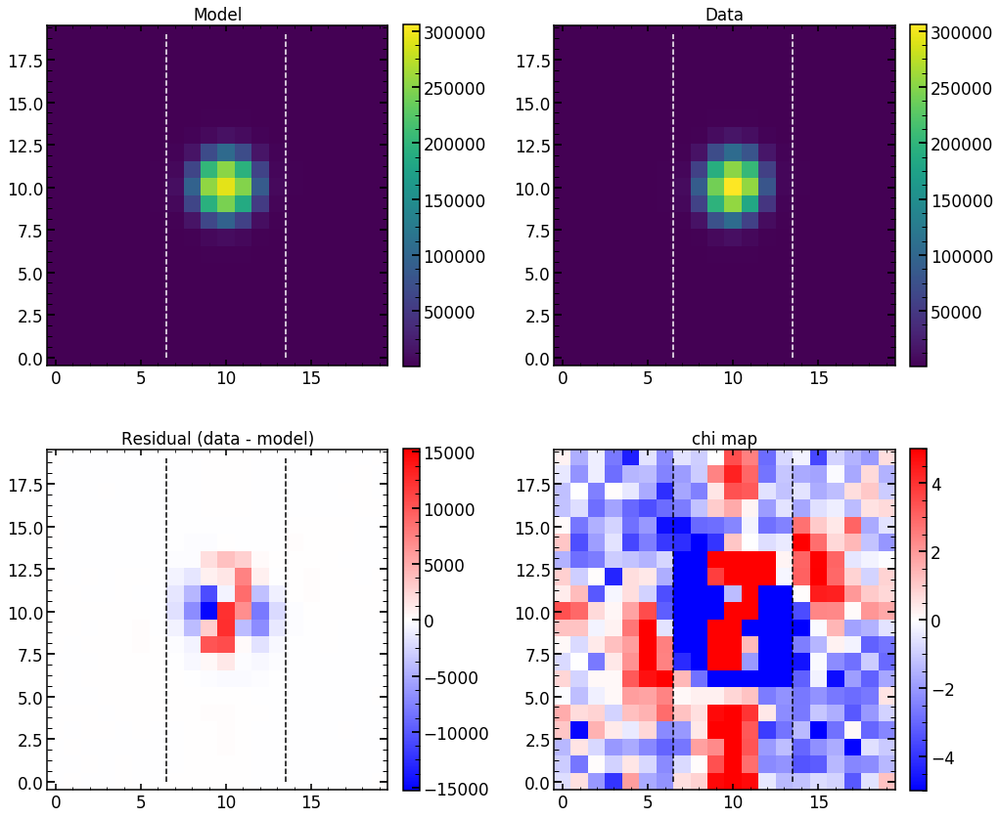

In [869]:
matplotlib.rcParams.update({'font.size': 14})
single_analysis.create_basic_comparison_plot()

51.3577014155659
chi**2 reduced is: 51.3577014155659
Abs of residual divided by total flux is: 0.05508245510690082
Abs of residual divided by largest value of a flux in the image is: 0.050683029999787826


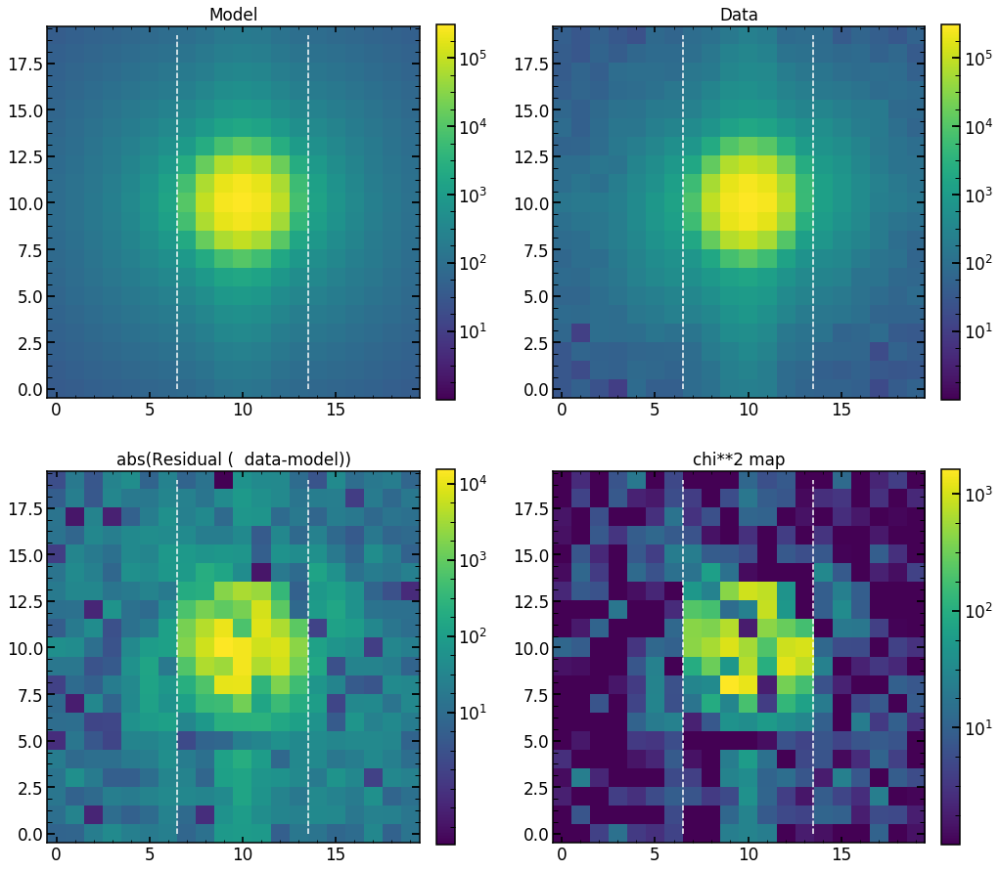

In [870]:
matplotlib.rcParams.update({'font.size': 14})
single_analysis.create_basic_comparison_plot_log()

In [871]:
image=np.load(TESTING_FINAL_IMAGES_FOLDER+'image.npy')

single_realization_primary_renormalized=np.load(TESTING_FINAL_IMAGES_FOLDER+'single_realization_primary_renormalized.npy')
single_realization_secondary_renormalized=np.load(TESTING_FINAL_IMAGES_FOLDER+'single_realization_secondary_renormalized.npy')
complete_realization_renormalized=np.load(TESTING_FINAL_IMAGES_FOLDER+'complete_realization_renormalized.npy')

input_img_single_realization_before_downsampling_primary_floor_floor=np.load(TESTING_FINAL_IMAGES_FOLDER+'input_img_single_realization_before_downsampling_primary_floor_floor.npy')
input_img_single_realization_before_downsampling_primary_floor_ceiling=np.load(TESTING_FINAL_IMAGES_FOLDER+'input_img_single_realization_before_downsampling_primary_floor_ceiling.npy')
input_img_single_realization_before_downsampling_primary_ceiling_floor=np.load(TESTING_FINAL_IMAGES_FOLDER+'input_img_single_realization_before_downsampling_primary_ceiling_floor.npy')
input_img_single_realization_before_downsampling_primary_ceiling_ceiling=np.load(TESTING_FINAL_IMAGES_FOLDER+'input_img_single_realization_before_downsampling_primary_ceiling_ceiling.npy')


input_img_single_realization_before_downsampling_primary=np.load(TESTING_FINAL_IMAGES_FOLDER+'input_img_single_realization_before_downsampling_primary.npy')
single_primary_realization=np.load(TESTING_FINAL_IMAGES_FOLDER+'single_primary_realization.npy')
single_secondary_realization=np.load(TESTING_FINAL_IMAGES_FOLDER+'single_secondary_realization.npy')
single_primary_realization_renormalized_within_create_complete_realization=np.load(TESTING_FINAL_IMAGES_FOLDER+'single_primary_realization_renormalized_within_create_complete_realization.npy')
single_secondary_realization_renormalized_within_create_complete_realization=np.load(TESTING_FINAL_IMAGES_FOLDER+'single_secondary_realization_renormalized_within_create_complete_realization.npy')
complete_realization_renormalized_within_create_complete_realization=np.load(TESTING_FINAL_IMAGES_FOLDER+'complete_realization_renormalized_within_create_complete_realization.npy')


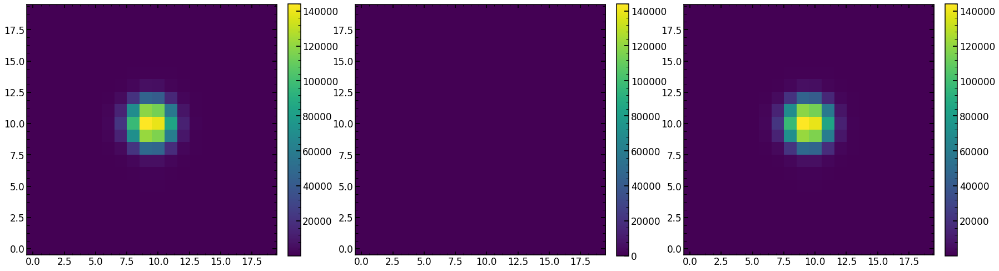

In [872]:
plt.figure(figsize=(30,10))

plt.subplot(131)
plt.imshow(single_realization_primary_renormalized,vmax=np.max(complete_realization_renormalized))
plt.colorbar(fraction=0.046, pad=0.04)
    
plt.subplot(132)
plt.imshow(single_realization_secondary_renormalized,vmax=np.max(complete_realization_renormalized))
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(133)
plt.imshow(complete_realization_renormalized,vmax=np.max(complete_realization_renormalized))
plt.colorbar(fraction=0.046, pad=0.04)

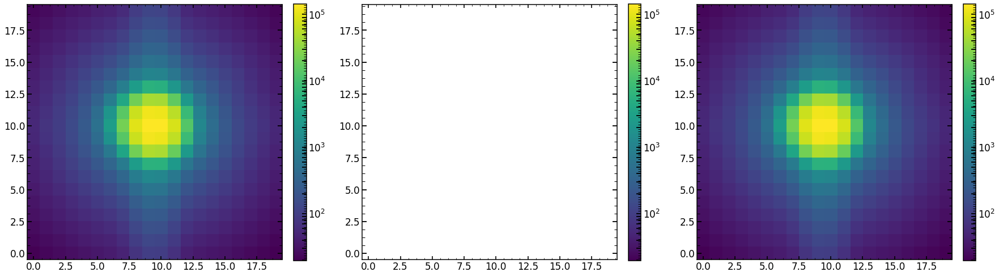

In [854]:
plt.figure(figsize=(30,10))

plt.subplot(131)
plt.imshow(single_realization_primary_renormalized,norm=LogNorm(),vmax=np.max(complete_realization_renormalized),vmin=np.min(complete_realization_renormalized))
plt.colorbar(fraction=0.046, pad=0.04)
    
plt.subplot(132)
plt.imshow(single_realization_secondary_renormalized,norm=LogNorm(),vmax=np.max(complete_realization_renormalized),vmin=np.min(complete_realization_renormalized))
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(133)
plt.imshow(complete_realization_renormalized,norm=LogNorm(),vmax=np.max(complete_realization_renormalized),vmin=np.min(complete_realization_renormalized))
plt.colorbar(fraction=0.046, pad=0.04)

In [855]:
sci_image=np.load(TESTING_FINAL_IMAGES_FOLDER+'sci_image.npy')
initial_complete_realization=np.load(TESTING_FINAL_IMAGES_FOLDER+'initial_complete_realization.npy')

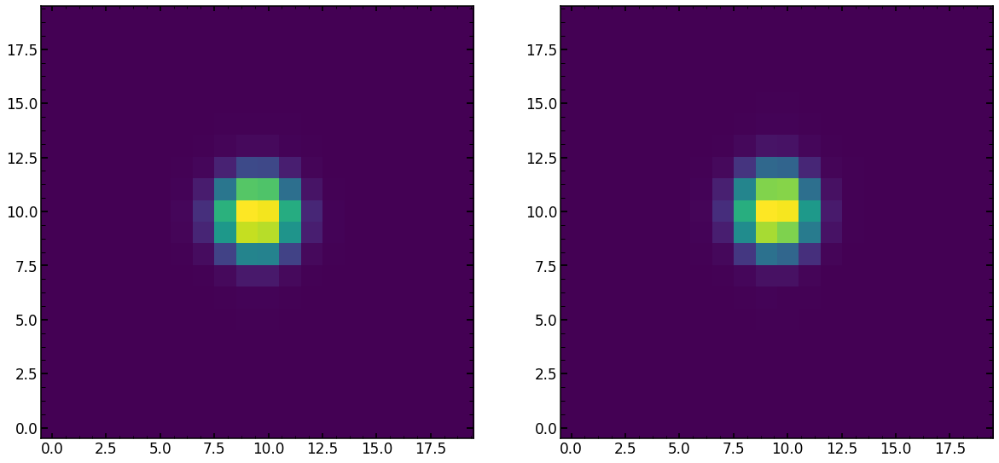

In [856]:
plt.figure(figsize=(20,12))

plt.subplot(121)
plt.imshow(initial_complete_realization)

plt.subplot(122)
plt.imshow(sci_image)

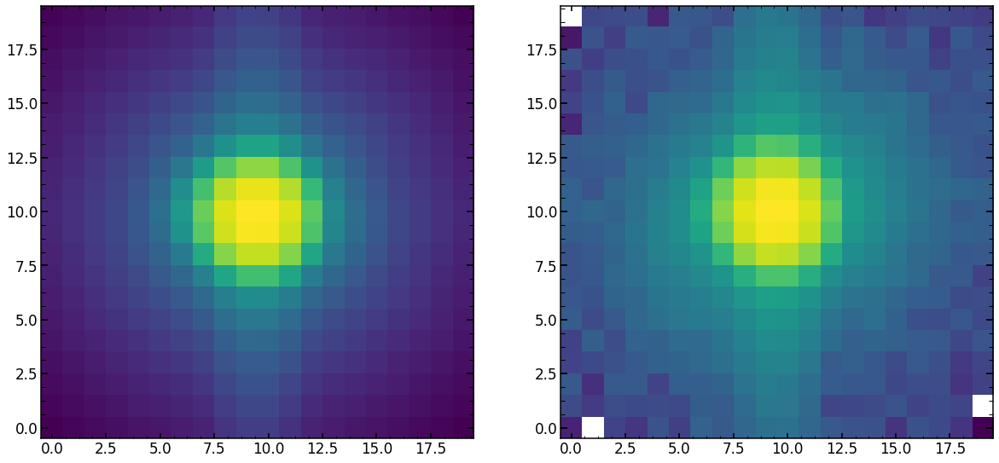

In [857]:
plt.figure(figsize=(20,12))

plt.subplot(121)
plt.imshow(initial_complete_realization,norm=LogNorm())

plt.subplot(122)
plt.imshow(sci_image,norm=LogNorm())

### single image testing - Krypton

In [563]:
with open('/Users/nevencaplar/Documents/PFS/ReducedData/Data_May_28/Dataframes/finalNe_May2019.pkl', 'rb') as f:
    finalNe_May2019=pickle.load(f)  
with open('/Users/nevencaplar/Documents/PFS/ReducedData/Data_May_28/Dataframes/finalHgAr_May2019.pkl', 'rb') as f:
    finalHgAr_May2019=pickle.load(f)  
with open('/Users/nevencaplar/Documents/PFS/ReducedData/Data_May_28/Dataframes/finalKr_May2019.pkl', 'rb') as f:
    finalKr_May2019=pickle.load(f)  
    
finalKr=finalKr_May2019
finalHgAr=finalHgAr_May2019
finalNe=finalNe_May2019

finalHgAr=finalHgAr_Feb2020_dataset
finalNe=finalNe_Feb2020_dataset
finalKr=finalKr_Feb2020_dataset

In [565]:
finalKr[(finalKr['close']==0)&(finalKr['fiber']==401)]

,fiber,xc,yc,wavelength,close,lamp,xc_effective,second_offset,second_ratio,second2_offset,second2_ratio
20,401,1993,1856,785.48,0,Kr,1993,8,0.01,0,0
21,401,1993,2244,819,0,Kr,1993,20,0.004,0,0
22,401,1993,2929,877.68,0,Kr,1993,-15,0.004,10,0.003


In [203]:
# 20,21,22 
# 21754 +12 (m35); 21754 +54 (0); 21754 +96 (p35)

In [526]:
columns22=['z4','z5','z6','z7','z8','z9','z10','z11',
       'z12','z13','z14','z15','z16','z17','z18','z19','z20','z21','z22',
      'hscFrac','strutFrac','dxFocal','dyFocal','slitFrac','slitFrac_dy',
      'radiometricEffect','radiometricExponent','x_ilum','y_ilum',
      'x_fiber','y_fiber','effective_radius_illumination',
      'frd_sigma','frd_lorentz_factor','det_vert','slitHolder_frac_dx',
      'grating_lines','scattering_slope','scattering_amplitude',
      'pixel_effect','fiber_r','flux']  

columns22_analysis=columns22+['chi2','chi2max']

In [703]:
date='Dec04'
obs=21754+12
obs_int=int(obs)
single_number='22'
image_index=int(single_number)
eps=5
arc='Kr'
dataset=4

if dataset==2:
    STAMPS_FOLDER="/Users/nevencaplar/Documents/PFS/ReducedData/Data_May_28/Stamps_cleaned/"
if dataset==3:
    STAMPS_FOLDER="/Users/nevencaplar/Documents/PFS/ReducedData/Data_Jun_25/Stamps_cleaned/"
if dataset==4 or dataset==5:
    STAMPS_FOLDER="/Users/nevencaplar/Documents/PFS/ReducedData/Data_Aug_14/Stamps_cleaned/"    

if dataset==1:
    if arc=="HgAr":
        single_number_focus=11748
    elif arc=="Ne":
        single_number_focus=11748+607    
    else:
        print("Not recognized arc-line")
        
if dataset==2:
    if arc=="HgAr":
        single_number_focus=17017+54
    elif arc=="Ne":
        single_number_focus=16292  
    elif arc=="Kr":
        single_number_focus=17364  
    else:
        print("Not recognized arc-line")
        
if dataset==3:
    if arc=="HgAr":
        single_number_focus=19238+54
    elif arc=="Ne":
        single_number_focus=19472  
    else:
        print("Not recognized arc-line")
      
if dataset==4 or dataset==5:
    if arc=="HgAr":
        single_number_focus=21346+54
    elif arc=="Ne":
        single_number_focus=21550 +54 
    elif arc=="Kr":
        single_number_focus=21754  +54 
    else:
        print("Not recognized arc-line")    
    
if dataset==1:
    if arc=='HgAr':
        obs_possibilites=np.array([11796,11790,11784,11778,11772,11766,11760,11754,11748,11748,11694,11700,11706,11712,11718,11724,11730,11736])
    elif arc=='Ne':
        obs_possibilites=np.array([12403,12397,12391,12385,12379,12373,12367,12361,12355,12355,12349,12343,12337,12331,12325,12319,12313,12307])
        
if dataset==2:
    if arc=='HgAr':
        obs_possibilites=np.array([17023,17023+6,17023+12,17023+18,17023+24,17023+30,17023+36,17023+42,17023+48,17023+48,\
                                   17023+54,17023+60,17023+66,17023+72,17023+78,17023+84,17023+90,17023+96,17023+48])
    if arc=='Ne':
        # different sequence than for HgAr
        obs_possibilites=np.array([16238+6,16238+12,16238+18,16238+24,16238+30,16238+36,16238+42,16238+48,16238+54,16238+54,\
                                   16238+60,16238+66,16238+72,16238+78,16238+84,16238+90,16238+96,16238+102,16238+54])
    if arc=='Kr':
         obs_possibilites=np.array([17310+6,17310+12,17310+18,17310+24,17310+30,17310+36,17310+42,17310+48,17310+54,17310+54,\
                                    17310+60,17310+66,17310+72,17310+78,17310+84,17310+90,17310+96,17310+102,17310+54])

if dataset==3:    
    if arc=='HgAr':
        obs_possibilites=np.array([19238,19238+6,19238+12,19238+18,19238+24,19238+30,19238+36,19238+42,19238+48,19238+48,\
                                   19238+54,19238+60,19238+66,19238+72,19238+78,19238+84,19238+90,19238+96,19238+48])
    elif arc=='Ne':
    # different sequence than for HgAr
        obs_possibilites=np.array([19472+6,19472+12,19472+18,19472+24,19472+30,19472+36,19472+42,19472+48,19472+54,19472+54,\
                                   19472+60,19472+66,19472+72,19472+78,19472+84,19472+90,19472+96,19472+102,19472+54]) 
  
if dataset==4:
    if arc=='HgAr':
        obs_possibilites=np.array([21346+6,21346+12,21346+18,21346+24,21346+30,21346+36,21346+42,21346+48,21346+54,21346+54,\
                                   21346+60,21346+66,21346+72,21346+78,21346+84,21346+90,21346+96,21346+102,21346+48])
    if arc=='Ne':
        obs_possibilites=np.array([21550+6,21550+12,21550+18,21550+24,21550+30,21550+36,21550+42,21550+48,21550+54,21550+54,\
                                   21550+60,21550+66,21550+72,21550+78,21550+84,21550+90,21550+96,21550+102,21550+54])
    if arc=='Kr':
         obs_possibilites=np.array([21754+6,21754+12,21754+18,21754+24,21754+30,21754+36,21754+42,21754+48,21754+54,21754+54,\
                                    21754+60,21754+66,21754+72,21754+78,21754+84,21754+90,21754+96,21754+102,21754+54])
 
if dataset==5:
    if arc=='HgAr':
        obs_possibilites=np.arange(21280,21280+11*6,6)
    if arc=='Ne':
        obs_possibilites=np.arange(21484,21484+11*6,6)
    if arc=='Kr':
         obs_possibilites=np.arange(21688,21688+11*6,6)



label=['m4','m35','m3','m25','m2','m15','m1','m05','0d','0','p05','p1','p15','p2','p25','p3','p35','p4','0p']
label_fine_defocus=['m05ff','m04ff','m03ff','m02ff','m01ff','0ff','p01ff','p02ff','p03ff','p04ff','p05ff']
if dataset in [0,1,2,3,4]:
    labelInput=label[list(obs_possibilites).index(obs_int)]
if dataset in [5]:
    labelInput=label_fine_defocus[list(obs_possibilites).index(obs_int)]
    
    
print(labelInput)
if obs==8600:
    print("Not implemented for December 2018 data")
else:
    sci_image =np.load(STAMPS_FOLDER+'sci'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
    mask_image =np.load(STAMPS_FOLDER+'mask'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
    var_image =np.load(STAMPS_FOLDER+'var'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
    #sci_image_focus_large =np.load(STAMPS_FOLDER+'sci'+str(single_number_focus)+str(single_number)+str(arc)+'_Stacked_large.npy')
    #var_image_focus_large =np.load(STAMPS_FOLDER+'var'+str(single_number_focus)+str(single_number)+str(arc)+'_Stacked_large.npy')

if dataset==1:
    if arc=="HgAr":
        finalArc=finalHgAr_Feb2019
    elif arc=="Ne":
        finalArc=finalNe_Feb2019    
    else:
        print("Not recognized arc-line")  
        
if dataset==2:   
    if arc=="HgAr":
        finalArc=finalHgAr_May2019
    elif arc=="Ne":
        finalArc=finalNe_May2019    
    elif arc=="Kr":
        finalArc=finalKr_May2019    
    else:
        print("Not recognized arc-line")   
        
if dataset==3:   
    if arc=="HgAr":
        finalArc=finalHgAr_May2019
    elif arc=="Ne":
        finalArc=finalNe_May2019    
    else:
        print("Not recognized arc-line")   
        
if dataset==4 or dataset==5:   
    if arc=="HgAr":
        finalArc=finalHgAr
    elif arc=="Ne":
        finalArc=finalNe  
    elif arc=="Kr":
        finalArc=finalKr 
    else:
        print("Not recognized arc-line")           
        
double_sources_positions_ratios=finalArc.loc[int(single_number)][['second_offset','second_ratio']].values
double_sources_positions_ratios

m35


array([-15, 0.004], dtype=object)

In [704]:
with open('/Users/nevencaplar/Documents/PFS/Fit_Results/Dec040119/results_of_fit_many_interpolation_Kr_from_Dec04.pkl', 'rb') as f:
    results_of_fit_many_interpolation_Kr=pickle.load(f)  

In [721]:
minchain=results_of_fit_many_interpolation_Kr[labelInput].loc[int(single_number)].values[0:42]

In [722]:
np.max(sci_image)

251440.06

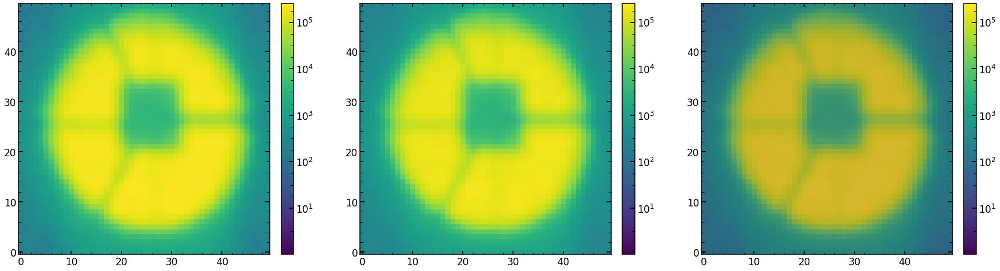

In [723]:
plt.figure(figsize=(30,8))
plt.subplot(131)
plt.imshow(sci_image,norm=LogNorm(),origin='lower',vmin=1,vmax=np.max(sci_image))
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

plt.subplot(132)
plt.imshow(var_image,norm=LogNorm(),origin='lower',vmin=1,vmax=np.max(sci_image))
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

plt.subplot(133)
plt.imshow(sci_image,norm=LogNorm(),origin='lower',vmin=1,vmax=np.max(sci_image))
cbar=plt.colorbar(fraction=0.046, pad=0.04)
plt.imshow(mask_image,origin='lower',vmin=0,vmax=np.max(mask_image),alpha=0.2)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])
#cbar.set_ticks([10,10**2,10**3,10**4,10**5])

In [724]:

single_analysis=Zernike_Analysis(date,obs,single_number,eps,arc,dataset)
"""
chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains()

minchain,like_min=single_analysis.create_likelihood()
"""

'\nchain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains()\n\nminchain,like_min=single_analysis.create_likelihood()\n'

In [725]:
print(minchain.shape)

if len(minchain)==42:
    columns=columns22
    
dfz22 = pd.DataFrame(np.array([np.array([minchain])[0][0:8]]),columns=columns[0:8])
print(dfz22)
dfglobal = pd.DataFrame(np.array([np.array([minchain])[0][8:len(columns)]]),columns=columns[8:])

dfglobal1 = pd.DataFrame(np.array([np.array([minchain])[0][8:18]]),columns=columns[8:18])
print(dfglobal1)

dfglobal2 = pd.DataFrame(np.array([np.array([minchain])[0][18:len(columns)]]),columns=columns[18:])
print(dfglobal2)

(42,)
          z4        z5        z6        z7        z8        z9       z10  \
0  26.890413 -0.273877 -1.298644  0.143554 -0.218325 -0.157297 -0.387596   

        z11  
0 -0.286395  
        z12       z13       z14       z15       z16       z17       z18  \
0 -0.005862  0.003766 -0.008601  0.031827  0.003075  0.056433  0.011079   

        z19       z20       z21  
0 -0.001932 -0.042474  0.023838  
        z22   hscFrac  strutFrac   dxFocal   dyFocal  slitFrac  slitFrac_dy  \
0  0.047504  0.661838   0.078537 -0.011992  0.103332  0.060239     0.022448   

   radiometricEffect  radiometricExponent    x_ilum  ...  frd_sigma  \
0           0.000003             0.000003  0.973562  ...   0.060306   

   frd_lorentz_factor  det_vert  slitHolder_frac_dx  grating_lines  \
0            0.831265  1.037616            0.083958       100000.0   

   scattering_slope  scattering_amplitude  pixel_effect   fiber_r      flux  
0           2.47029              0.003254      0.372633  1.795743  0.9975

In [726]:
"""
size=chain0_Emcee3.shape[1]
matplotlib.rcParams.update({'font.size': 18})
plt.figure(figsize=(18,10))
plt.subplot(211)
plt.plot(np.linspace(1,len(like_min),len(like_min)),like_min,'blue',ls='-',marker='o')
plt.ylabel('likelihood')
plt.xlabel('steps')
plt.axvline(size+0.5,ls='--')
plt.axvline(size*2+0.5,ls='--')
plt.axvline(size*5+0.5,ls='--')
plt.subplot(212)
plt.plot(np.linspace(1,len(like_min),len(like_min)),np.log10(like_min),'blue',ls='-',marker='o')
plt.ylabel('log10(likelihood)')
plt.xlabel('steps')
plt.axvline(size+0.5,ls='--')
plt.axvline(2*size+0.5,ls='--')
plt.axvline(5*size+0.5,ls='--')
"""

"\nsize=chain0_Emcee3.shape[1]\nmatplotlib.rcParams.update({'font.size': 18})\nplt.figure(figsize=(18,10))\nplt.subplot(211)\nplt.plot(np.linspace(1,len(like_min),len(like_min)),like_min,'blue',ls='-',marker='o')\nplt.ylabel('likelihood')\nplt.xlabel('steps')\nplt.axvline(size+0.5,ls='--')\nplt.axvline(size*2+0.5,ls='--')\nplt.axvline(size*5+0.5,ls='--')\nplt.subplot(212)\nplt.plot(np.linspace(1,len(like_min),len(like_min)),np.log10(like_min),'blue',ls='-',marker='o')\nplt.ylabel('log10(likelihood)')\nplt.xlabel('steps')\nplt.axvline(size+0.5,ls='--')\nplt.axvline(2*size+0.5,ls='--')\nplt.axvline(5*size+0.5,ls='--')\n"

In [727]:
double_sources_positions_ratios

array([-15, 0.004], dtype=object)

In [728]:
model = LN_PFS_single(sci_image,var_image,dithering=1,save=1,zmax=22,verbosity=1,double_sources=1,double_sources_positions_ratios=double_sources_positions_ratios)   

#model = LN_PFS_single(sci_image,var_image,dithering=1,save=1,zmax=22,verbosity=1)   
#minchain_new=np.copy(minchain)   
#minchain_new[0]=10
#minchain_new[1]=5

model(minchain)

Science image shape is: (50, 50)
Top left pixel value of the science image is: 227.03278
Variance image shape is: (50, 50)
Top left pixel value of the variance image is: 296.65833
Mask image shape is: (50, 50)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 22

Entering lnlike_Neven
allparameters [    26.890413       -0.27387727     -1.29864446      0.1435543
     -0.21832545     -0.15729712     -0.38759583     -0.28639528
     -0.00586247      0.00376593     -0.0086012       0.03182657
      0.00307516      0.05643312      0.01107919     -0.00193226
     -0.04247426      0.02383772      0.04750449      0.66183843
      0.078537       -0.01199235      0.10333205      0.06023906
      0.02244766      0.00000313      0.00000313      0.97356243
      0.94833883     -0.03847311     -0.04676427      0.92342267
      0.06030558      0.8312654

chi2: 1053.382229754748
primary_offset_axis_1: -25.545976591388225
primary_offset_axis_0: 13.861820393045203
secondary_offset_axis_0: 187.1118203930452
ratio_secondary: 0.003875
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.8618203930452033, 0.4540234086117749]
chi2: 27142.197379316665
primary_offset_axis_1: -24.858476591388225
primary_offset_axis_0: -6.763179606954797
secondary_offset_axis_0: 173.3618203930452
ratio_secondary: 0.0044375000000000005
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2368203930452033, 0.14152340861177493]
chi2: 4387.0984464986195
primary_offset_axis_1: -13.858476591388225
primary_offset_axis_0: 15.236820393045203
secondary_offset_axis_0: 173.3618203930452
ratio_secondary: 0.0074375000000000005
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2368203930452033, 0.14152340861177493]
chi2: 26303.981688028525
primary_offset_axis_1: -8.358476591388225
primary_offset_axis_0

chi2: 11712.203663903754
primary_offset_axis_1: -19.014726591388225
primary_offset_axis_0: -7.450679606954797
secondary_offset_axis_0: 154.1118203930452
ratio_secondary: 0.00209375
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.5493203930452033, 0.9852734086117749]
chi2: 1149.787086587135
primary_offset_axis_1: -8.014726591388225
primary_offset_axis_0: 14.549320393045203
secondary_offset_axis_0: 198.1118203930452
ratio_secondary: 0.00509375
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.5493203930452033, 0.9852734086117749]
chi2: 29349.558623939993
primary_offset_axis_1: -13.514726591388225
primary_offset_axis_0: -18.450679606954797
secondary_offset_axis_0: 154.1118203930452
ratio_secondary: 0.00359375
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.5493203930452033, 0.4852734086117749]
chi2: 7676.992548856625
primary_offset_axis_1: -24.514726591388225
primary_offset_axis_0: 3.5493203930452033
s

ratio_secondary: 0.004953125
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.8930703930452033, 0.7196484086117749]
chi2: 8838.299346136022
primary_offset_axis_1: -11.280351591388225
primary_offset_axis_0: 3.8930703930452033
secondary_offset_axis_0: 174.7368203930452
ratio_secondary: 0.007953125
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.8930703930452033, 0.7196484086117749]
chi2: 6558.10669453481
primary_offset_axis_1: -5.780351591388225
primary_offset_axis_0: -7.106929606954797
secondary_offset_axis_0: 174.7368203930452
ratio_secondary: 0.003453125
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.8930703930452033, 0.21964840861177493]
chi2: 6228.853766641737
primary_offset_axis_1: -16.780351591388225
primary_offset_axis_0: 14.893070393045203
secondary_offset_axis_0: 174.7368203930452
ratio_secondary: 0.0064531250000000005
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_flo

chi2: 17062.651379240735
primary_offset_axis_1: -17.811601591388225
primary_offset_axis_0: -16.044429606954797
secondary_offset_axis_0: 140.3618203930452
ratio_secondary: 0.004859375
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.9555703930452033, 0.18839840861177493]
chi2: 5108.532301293642
primary_offset_axis_1: -6.811601591388225
primary_offset_axis_0: 5.955570393045203
secondary_offset_axis_0: 184.3618203930452
ratio_secondary: 0.007859375
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.9555703930452033, 0.18839840861177493]
chi2: 12981.707859471066
primary_offset_axis_1: -12.311601591388225
primary_offset_axis_0: -27.044429606954797
secondary_offset_axis_0: 140.3618203930452
ratio_secondary: 0.0033593750000000004
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.9555703930452033, 0.6883984086117749]
chi2: 21284.374710008262
primary_offset_axis_1: -23.311601591388225
primary_offset_axis_0: -5.0

chi2: 2012.334293327805
primary_offset_axis_1: -8.788164091388225
primary_offset_axis_0: 11.971195393045203
secondary_offset_axis_0: 186.7680703930452
ratio_secondary: 0.0072734375
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.9711953930452033, 0.21183590861177493]
chi2: 21712.411554099235
primary_offset_axis_1: -14.288164091388225
primary_offset_axis_0: -21.028804606954797
secondary_offset_axis_0: 164.7680703930452
ratio_secondary: 0.0027734375
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.9711953930452033, 0.7118359086117749]
chi2: 10640.310977520296
primary_offset_axis_1: -25.288164091388225
primary_offset_axis_0: 0.9711953930452033
secondary_offset_axis_0: 164.7680703930452
ratio_secondary: 0.0057734375
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.9711953930452033, 0.7118359086117749]
chi2: 6990.338856792752
primary_offset_axis_1: -24.600664091388225
primary_offset_axis_0: -19.653804606

chi2: 6636.592833284966
primary_offset_axis_1: -11.194414091388225
primary_offset_axis_0: -14.841304606954797
secondary_offset_axis_0: 168.8930703930452
ratio_secondary: 0.0045546875
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.1586953930452033, 0.8055859086117749]
chi2: 5260.779377814715
primary_offset_axis_1: -22.194414091388225
primary_offset_axis_0: 7.158695393045203
secondary_offset_axis_0: 168.8930703930452
ratio_secondary: 0.0075546875
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.1586953930452033, 0.8055859086117749]
chi2: 10755.6074839459
primary_offset_axis_1: -23.569414091388225
primary_offset_axis_0: -17.591304606954797
secondary_offset_axis_0: 163.3930703930452
ratio_secondary: 0.0064296875000000005
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.4086953930452033, 0.4305859086117749]
chi2: 9279.655942756315
primary_offset_axis_1: -12.569414091388225
primary_offset_axis_0: 4.40869

chi2: 9846.057052309277
primary_offset_axis_1: -7.928789091388225
primary_offset_axis_0: -25.497554606954797
secondary_offset_axis_0: 145.5180703930452
ratio_secondary: 0.0025390625
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.5024453930452033, 0.07121090861177493]
chi2: 21357.681319304113
primary_offset_axis_1: -18.928789091388225
primary_offset_axis_0: -3.4975546069547967
secondary_offset_axis_0: 145.5180703930452
ratio_secondary: 0.005539062500000001
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.5024453930452033, 0.07121090861177493]
chi2: 1244.7338573391921
primary_offset_axis_1: -16.178789091388225
primary_offset_axis_0: -19.997554606954797
secondary_offset_axis_0: 156.5180703930452
ratio_secondary: 0.0047890625
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.0024453930452033035, 0.8212109086117749]
chi2: 9100.905194046753
primary_offset_axis_1: -5.178789091388225
primary_offset_axis_0: 

chi2: 4875.091151084312
primary_offset_axis_1: -13.085039091388225
primary_offset_axis_0: 10.939945393045203
secondary_offset_axis_0: 162.0180703930452
ratio_secondary: 0.0076953125
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.9399453930452033, 0.9149609086117749]
chi2: 16165.907764339656
primary_offset_axis_1: -7.585039091388225
primary_offset_axis_0: -22.060054606954797
secondary_offset_axis_0: 140.0180703930452
ratio_secondary: 0.0031953125000000002
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.9399453930452033, 0.4149609086117749]
chi2: 15801.418372365508
primary_offset_axis_1: -18.585039091388225
primary_offset_axis_0: -0.060054606954796697
secondary_offset_axis_0: 184.0180703930452
ratio_secondary: 0.0061953125
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.9399453930452033, 0.4149609086117749]
chi2: 2357.090225015154
primary_offset_axis_1: -21.335039091388225
primary_offset_axis_0: -1

chi2: 31528.586950659883
primary_offset_axis_1: -25.760820341388225
primary_offset_axis_0: -17.161617106954797
secondary_offset_axis_0: 136.0649453930452
ratio_secondary: 0.00716796875
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.8383828930452033, 0.23917965861177493]
chi2: 10799.77774277227
primary_offset_axis_1: -14.760820341388225
primary_offset_axis_0: 4.838382893045203
secondary_offset_axis_0: 180.0649453930452
ratio_secondary: 0.004167968750000001
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.8383828930452033, 0.23917965861177493]
chi2: 6040.279103628327
primary_offset_axis_1: -9.260820341388225
primary_offset_axis_0: -6.161617106954797
secondary_offset_axis_0: 180.0649453930452
ratio_secondary: 0.00566796875
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.8383828930452033, 0.7391796586117749]
chi2: 3082.075176481008
primary_offset_axis_1: -20.260820341388225
primary_offset_axis_0: 15.8

chi2: 5754.384623223416
primary_offset_axis_1: -11.151445341388225
primary_offset_axis_0: 7.244632893045203
secondary_offset_axis_0: 151.1899453930452
ratio_secondary: 0.00627734375
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2446328930452033, 0.8485546586117749]
chi2: 10768.612090762372
primary_offset_axis_1: -5.651445341388225
primary_offset_axis_0: -25.755367106954797
secondary_offset_axis_0: 129.1899453930452
ratio_secondary: 0.0047773437499999995
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2446328930452033, 0.3485546586117749]
chi2: 24301.72367264152
primary_offset_axis_1: -16.651445341388225
primary_offset_axis_0: -3.7553671069547967
secondary_offset_axis_0: 173.1899453930452
ratio_secondary: 0.00777734375
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2446328930452033, 0.3485546586117749]
chi2: 906.1477058726946
primary_offset_axis_1: -19.401445341388225
primary_offset_axis_0: -20.

chi2: 5837.287046185027
primary_offset_axis_1: -6.682695341388225
primary_offset_axis_0: 5.182132893045203
secondary_offset_axis_0: 166.3149453930452
ratio_secondary: 0.00618359375
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.1821328930452033, 0.3173046586117749]
chi2: 12093.949135034753
primary_offset_axis_1: -12.182695341388225
primary_offset_axis_0: -5.817867106954797
secondary_offset_axis_0: 144.3149453930452
ratio_secondary: 0.00468359375
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.1821328930452033, 0.8173046586117749]
chi2: 1471.808109070114
primary_offset_axis_1: -23.182695341388225
primary_offset_axis_0: 16.182132893045203
secondary_offset_axis_0: 188.3149453930452
ratio_secondary: 0.00768359375
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.1821328930452033, 0.8173046586117749]
chi2: 31236.34983123965
primary_offset_axis_1: -21.807695341388225
primary_offset_axis_0: -25.0678671069

primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.9165078930452033, 0.2938671586117749]
chi2: 15345.171211102366
primary_offset_axis_1: -15.706132841388225
primary_offset_axis_0: 1.9165078930452033
secondary_offset_axis_0: 185.9086953930452
ratio_secondary: 0.00334765625
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.9165078930452033, 0.2938671586117749]
chi2: 3293.8248673093967
primary_offset_axis_1: -10.206132841388225
primary_offset_axis_0: -9.083492106954797
secondary_offset_axis_0: 163.9086953930452
ratio_secondary: 0.007847656250000001
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.9165078930452033, 0.7938671586117749]
chi2: 2904.1553130721277
primary_offset_axis_1: -21.206132841388225
primary_offset_axis_0: 12.916507893045203
secondary_offset_axis_0: 163.9086953930452
ratio_secondary: 0.00484765625
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.916507893045203

chi2: 7384.051866987026
primary_offset_axis_1: -20.518632841388225
primary_offset_axis_0: -10.458492106954797
secondary_offset_axis_0: 144.6586953930452
ratio_secondary: 0.00353515625
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.5415078930452033, 0.4813671586117749]
chi2: 2452.8448285976515
primary_offset_axis_1: -9.518632841388225
primary_offset_axis_0: 11.541507893045203
secondary_offset_axis_0: 188.6586953930452
ratio_secondary: 0.00653515625
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.5415078930452033, 0.4813671586117749]
chi2: 19888.000122917
primary_offset_axis_1: -15.018632841388225
primary_offset_axis_0: -21.458492106954797
secondary_offset_axis_0: 144.6586953930452
ratio_secondary: 0.00203515625
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.5415078930452033, 0.9813671586117749]
chi2: 11105.176985231969
primary_offset_axis_1: -26.018632841388225
primary_offset_axis_0: 0.5415078930

chi2: 6896.747925264865
primary_offset_axis_1: -23.612382841388225
primary_offset_axis_0: -15.270992106954797
secondary_offset_axis_0: 148.7836953930452
ratio_secondary: 0.00775390625
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.7290078930452033, 0.3876171586117749]
chi2: 7132.012125153318
primary_offset_axis_1: -12.612382841388225
primary_offset_axis_0: 6.729007893045203
secondary_offset_axis_0: 192.7836953930452
ratio_secondary: 0.00475390625
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.7290078930452033, 0.3876171586117749]
chi2: 9029.952575331256
primary_offset_axis_1: -7.112382841388225
primary_offset_axis_0: -26.270992106954797
secondary_offset_axis_0: 148.7836953930452
ratio_secondary: 0.00625390625
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.7290078930452033, 0.8876171586117749]
chi2: 23623.247699951255
primary_offset_axis_1: -18.112382841388225
primary_offset_axis_0: -4.270992106

chi2: 24135.34625689589
primary_offset_axis_1: -16.221757841388225
primary_offset_axis_0: -12.864742106954797
secondary_offset_axis_0: 147.4086953930452
ratio_secondary: 0.00348828125
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.1352578930452033, 0.7782421586117749]
chi2: 2730.477186678025
primary_offset_axis_1: -5.221757841388225
primary_offset_axis_0: 9.135257893045203
secondary_offset_axis_0: 191.4086953930452
ratio_secondary: 0.00648828125
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.1352578930452033, 0.7782421586117749]
chi2: 20470.332264683555
primary_offset_axis_1: -10.721757841388225
primary_offset_axis_0: -23.864742106954797
secondary_offset_axis_0: 147.4086953930452
ratio_secondary: 0.0049882812500000005
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.1352578930452033, 0.2782421586117749]
chi2: 16184.678970056808
primary_offset_axis_1: -21.721757841388225
primary_offset_axis_0: -1.

chi2: 30566.611355877947
primary_offset_axis_1: -25.503007841388225
primary_offset_axis_0: -8.052242106954797
secondary_offset_axis_0: 150.1586953930452
ratio_secondary: 0.00526953125
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.9477578930452033, 0.4969921586117749]
chi2: 5165.854441392552
primary_offset_axis_1: -14.503007841388225
primary_offset_axis_0: 13.947757893045203
secondary_offset_axis_0: 194.1586953930452
ratio_secondary: 0.00226953125
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.9477578930452033, 0.4969921586117749]
chi2: 22133.123265349055
primary_offset_axis_1: -9.003007841388225
primary_offset_axis_0: -19.052242106954797
secondary_offset_axis_0: 150.1586953930452
ratio_secondary: 0.00676953125
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.9477578930452033, 0.9969921586117749]
chi2: 10566.869520825097
primary_offset_axis_1: -20.003007841388225
primary_offset_axis_0: 2.94775789

chi2: 661.2516934373779
primary_offset_axis_1: -16.254159452605442
primary_offset_axis_0: -5.688436828874914
secondary_offset_axis_0: 172.78274353564652
ratio_secondary: 0.0022934779526047875
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.31156317112508614, 0.7458405473945575]
chi2: 661.2516935381688
primary_offset_axis_1: -16.254174656775415
primary_offset_axis_0: -5.688458524369885
secondary_offset_axis_0: 172.68038914072832
ratio_secondary: 0.002293761031676135
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.3115414756301149, 0.7458253432245847]
chi2: 661.2459081451146
primary_offset_axis_1: -16.254174656775415
primary_offset_axis_0: -5.688458524369885
secondary_offset_axis_0: 172.68038914072832
ratio_secondary: 0.002293761031676135
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.3115414756301149, 0.7458253432245847]
chi2: 661.2459081451146
primary_offset_axis_1: -16.254174641874254
primary_of

chi2: 660.7121051366706
primary_offset_axis_1: -16.251861615112954
primary_offset_axis_0: -5.702993001543321
secondary_offset_axis_0: 156.02304756638225
ratio_secondary: 0.0023717576775050425
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2970069984566788, 0.7481383848870458]
chi2: 660.7121051413473
primary_offset_axis_1: -16.251861630014115
primary_offset_axis_0: -5.70299298664216
secondary_offset_axis_0: 156.0230475812834
ratio_secondary: 0.0023717576775050425
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.29700701335783997, 0.7481383699858846]
chi2: 660.7121051454162
primary_offset_axis_1: -16.251861630014115
primary_offset_axis_0: -5.702993001543321
secondary_offset_axis_0: 156.0230475812834
ratio_secondary: 0.0023717576775050425
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2970069984566788, 0.7481383699858846]
chi2: 660.7121051376178
primary_offset_axis_1: -16.251861630014115
primary_off

chi2: 660.7106594658417
primary_offset_axis_1: -16.251861529992293
primary_offset_axis_0: -5.703013720034017
secondary_offset_axis_0: 156.00027904173024
ratio_secondary: 0.0023718467522744896
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.29698627996598326, 0.7481384700077065]
chi2: 660.7106594658417
primary_offset_axis_1: -16.251861515091132
primary_offset_axis_0: -5.703013720034017
secondary_offset_axis_0: 156.00027904173024
ratio_secondary: 0.0023718467522744896
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.29698627996598326, 0.7481384849088677]
chi2: 660.710659470503
primary_offset_axis_1: -16.251861529992293
primary_offset_axis_0: -5.7030137051328555
secondary_offset_axis_0: 156.0002790566314
ratio_secondary: 0.0023718467522744896
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.29698629486714445, 0.7481384700077065]
chi2: 660.7106594745587
primary_offset_axis_1: -16.251861529992293
primary

chi2: 660.7510107786924
primary_offset_axis_1: -16.25220717161331
primary_offset_axis_0: -5.703443431960646
secondary_offset_axis_0: 155.9115850198033
ratio_secondary: 0.0023704029606647615
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.29655656803935404, 0.7477928283866895]
chi2: 660.7760067000327
primary_offset_axis_1: -16.25189705492554
primary_offset_axis_0: -5.703057993107995
secondary_offset_axis_0: 155.99123747989142
ratio_secondary: 0.0023716979143139447
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2969420068920048, 0.7481029450744607]
chi2: 660.7822157014514
primary_offset_axis_1: -16.25186604325676
primary_offset_axis_0: -5.70301944922273
secondary_offset_axis_0: 155.99920272590023
ratio_secondary: 0.002371827409678863
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2969805507772696, 0.7481339567432386]
chi2: 660.7828418650683
primary_offset_axis_1: -16.251862942089883
primary_offset

chi2: 660.7572354628327
primary_offset_axis_1: -16.25303787572995
primary_offset_axis_0: -5.705093962184089
secondary_offset_axis_0: 155.93739860497155
ratio_secondary: 0.0023662213745057636
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2949060378159114, 0.7469621242700484]
chi2: 660.776296696637
primary_offset_axis_1: -16.251981849011326
primary_offset_axis_0: -5.703225017075061
secondary_offset_axis_0: 155.9937542315534
ratio_secondary: 0.0023712743970313653
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.29677498292493887, 0.7480181509886741]
chi2: 660.7822088291031
primary_offset_axis_1: -16.251876246339464
primary_offset_axis_0: -5.703038122564158
secondary_offset_axis_0: 155.99938979421157
ratio_secondary: 0.0023717796992839255
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2969618774358418, 0.7481237536605363]
chi2: 660.782833672276
primary_offset_axis_1: -16.25186568607228
primary_offse

chi2: 660.7106379007624
primary_offset_axis_1: -16.251864680337697
primary_offset_axis_0: -5.703017605038089
secondary_offset_axis_0: 156.00000680438004
ratio_secondary: 0.0023718349603729866
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.29698239496191103, 0.7481353196623033]
chi2: 660.7106379048172
primary_offset_axis_1: -16.251864680337697
primary_offset_axis_0: -5.70301761993925
secondary_offset_axis_0: 156.00000680438004
ratio_secondary: 0.0023718349603729866
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.29698238006074984, 0.7481353196623033]
chi2: 660.7106378970499
primary_offset_axis_1: -16.251864680337697
primary_offset_axis_0: -5.70301761993925
secondary_offset_axis_0: 156.00000678947887
ratio_secondary: 0.0023718498615341805
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.29698238006074984, 0.7481353196623033]
chi2: 660.7106395418814
primary_offset_axis_1: -16.251850111654498
primary_

chi2: 660.7106370616009
primary_offset_axis_1: -16.25186473974264
primary_offset_axis_0: -5.703018032814846
secondary_offset_axis_0: 156.00000206709123
ratio_secondary: 0.002371832158804385
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2969819671851539, 0.7481352602573601]
chi2: 660.710637053834
primary_offset_axis_1: -16.25186473974264
primary_offset_axis_0: -5.703018032814846
secondary_offset_axis_0: 156.00000205219007
ratio_secondary: 0.002371847059965579
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2969819671851539, 0.7481352602573601]
chi2: 660.7106386984689
primary_offset_axis_1: -16.288743199176388
primary_offset_axis_0: -5.742851614927695
secondary_offset_axis_0: 155.53789584878447
ratio_secondary: 0.002166402467650732
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.25714838507230464, 0.7112568008236124]
chi2: 660.9299592392632
primary_offset_axis_1: -16.25698231233309
primary_offset_

chi2: 660.7106366434454
primary_offset_axis_1: -16.251864795311498
primary_offset_axis_0: -5.70301838918996
secondary_offset_axis_0: 156.00000038033818
ratio_secondary: 0.002371831291428828
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2969816108100396, 0.7481352046885021]
chi2: 660.710636648102
primary_offset_axis_1: -16.25186481021266
primary_offset_axis_0: -5.703018374288799
secondary_offset_axis_0: 156.00000039523934
ratio_secondary: 0.002371831291428828
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2969816257112008, 0.748135189787341]
chi2: 660.7106366521559
primary_offset_axis_1: -16.25186481021266
primary_offset_axis_0: -5.70301838918996
secondary_offset_axis_0: 156.00000039523934
ratio_secondary: 0.002371831291428828
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2969816108100396, 0.748135189787341]
chi2: 660.7106366443893
primary_offset_axis_1: -16.25186481021266
primary_offset_axis_

chi2: 660.7827220470487
primary_offset_axis_1: -16.251868264861706
primary_offset_axis_0: -5.703032060444088
secondary_offset_axis_0: 155.99995516022494
ratio_secondary: 0.0023717939346179586
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2969679395559117, 0.7481317351382941]
chi2: 660.7828829029748
primary_offset_axis_1: -16.25186516664231
primary_offset_axis_0: -5.703019809506228
secondary_offset_axis_0: 155.9999956962701
ratio_secondary: 0.0023718273994185546
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.29698019049377233, 0.7481348333576889]
chi2: 660.7828991015259
primary_offset_axis_1: -16.251864856820372
primary_offset_axis_0: -5.703018584412441
secondary_offset_axis_0: 155.99999974987463
ratio_secondary: 0.0023718307458986143
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.29698141558755875, 0.7481351431796277]
chi2: 660.7829007225107
primary_offset_axis_1: -16.25186482583818
primary_of

chi2: 660.7106381548434
primary_offset_axis_1: -16.239521474460478
primary_offset_axis_0: -5.706869916524414
secondary_offset_axis_0: 155.95805521376772
ratio_secondary: 0.002
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2931300834755861, 0.7604785255395221]
chi2: 661.0415979437748
primary_offset_axis_1: -16.250630484552733
primary_offset_axis_0: -5.703403612797606
secondary_offset_axis_0: 155.995805585589
ratio_secondary: 0.002334647585888129
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2965963872023938, 0.7493695154472668]
chi2: 660.7807520590678
primary_offset_axis_1: -16.25174138556196
primary_offset_axis_0: -5.7030569824249255
secondary_offset_axis_0: 155.99958062277113
ratio_secondary: 0.0023681123444769417
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.29694301757507446, 0.7482586144380399]
chi2: 660.7824059056292
primary_offset_axis_1: -16.251852475662883
primary_offset_axis_0: -5.7

chi2: 660.7106364490844
primary_offset_axis_1: -16.251864804572897
primary_offset_axis_0: -5.703018475101596
secondary_offset_axis_0: 156.00000000712635
ratio_secondary: 0.0023718301346331606
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.29698152489840357, 0.7481351954271034]
chi2: 660.7106364490844
primary_offset_axis_1: -16.251864789671735
primary_offset_axis_0: -5.703018475101596
secondary_offset_axis_0: 156.00000000712635
ratio_secondary: 0.0023718301346331606
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.29698152489840357, 0.7481352103282646]
chi2: 660.7106364537409
primary_offset_axis_1: -16.251864804572897
primary_offset_axis_0: -5.703018460200435
secondary_offset_axis_0: 156.0000000220275
ratio_secondary: 0.0023718301346331606
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.29698153979956476, 0.7481351954271034]
chi2: 660.7106364577947
primary_offset_axis_1: -16.251864804572897
primary

chi2: 660.7828536519984
primary_offset_axis_1: -16.25186516729325
primary_offset_axis_0: -5.703018641849056
secondary_offset_axis_0: 155.99999918514538
ratio_secondary: 0.002371797999440626
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2969813581509442, 0.7481348327067501]
chi2: 660.7828960053633
primary_offset_axis_1: -16.251864840742794
primary_offset_axis_0: -5.703018491803868
secondary_offset_axis_0: 155.99999992212517
ratio_secondary: 0.002371826868572069
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.296981508196132, 0.7481351592572061]
chi2: 660.7829002608405
primary_offset_axis_1: -16.251864808087745
primary_offset_axis_0: -5.7030184767993495
secondary_offset_axis_0: 155.99999999582315
ratio_secondary: 0.0023718297554852132
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2969815232006505, 0.7481351919122545]
chi2: 660.7829006865896
primary_offset_axis_1: -16.251864804822244
primary_offs

chi2: 660.7106364412562
primary_offset_axis_1: -16.251864805016414
primary_offset_axis_0: -5.703018475254042
secondary_offset_axis_0: 156.00000001694224
ratio_secondary: 0.0023718299897064806
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2969815247459584, 0.7481351949835862]
chi2: 660.7106364334896
primary_offset_axis_1: -16.251864805016414
primary_offset_axis_0: -5.703018475254042
secondary_offset_axis_0: 156.00000000204108
ratio_secondary: 0.0023718448908676745
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2969815247459584, 0.7481351949835862]
chi2: 660.7106380779695
primary_offset_axis_1: -16.253045028240297
primary_offset_axis_0: -5.703467230434636
secondary_offset_axis_0: 155.9915772145695
ratio_secondary: 0.002
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.29653276956536434, 0.7469549717597026]
chi2: 661.031775731673
primary_offset_axis_1: -16.251982827338804
primary_offset_axis_0: -5.

chi2: 660.7828865706699
primary_offset_axis_1: -16.25186479745831
primary_offset_axis_0: -5.703018602970314
secondary_offset_axis_0: 155.99999983943377
ratio_secondary: 0.0023718203366307872
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2969813970296862, 0.7481352025416896]
chi2: 660.7828992967887
primary_offset_axis_1: -16.251864804316345
primary_offset_axis_0: -5.703018488433148
secondary_offset_axis_0: 155.99999998471017
ratio_secondary: 0.002371828970618094
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2969815115668517, 0.7481351956836555]
chi2: 660.7829005712139
primary_offset_axis_1: -16.25186480500215
primary_offset_axis_0: -5.703018476979432
secondary_offset_axis_0: 155.99999999923782
ratio_secondary: 0.0023718298340168246
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2969815230205679, 0.7481351949978503]
chi2: 660.7829006986747
primary_offset_axis_1: -16.251864805070728
primary_offs

chi2: 660.7106364245685
primary_offset_axis_1: -16.251864805029346
primary_offset_axis_0: -5.7030184614483455
secondary_offset_axis_0: 156.00000001492717
ratio_secondary: 0.0023718298816256143
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.29698153855165454, 0.7481351949706543]
chi2: 660.7106364286224
primary_offset_axis_1: -16.251864805029346
primary_offset_axis_0: -5.703018476349507
secondary_offset_axis_0: 156.00000001492717
ratio_secondary: 0.0023718298816256143
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.29698152365049335, 0.7481351949706543]
chi2: 660.7106364208561
primary_offset_axis_1: -16.251864805029346
primary_offset_axis_0: -5.703018476349507
secondary_offset_axis_0: 156.000000000026
ratio_secondary: 0.002371844782786808
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.29698152365049335, 0.7481351949706543]
chi2: 660.7106380653288
primary_offset_axis_1: -16.251743442367285
primary_

chi2: 660.782837577571
primary_offset_axis_1: -16.25186469411079
primary_offset_axis_0: -5.703018575507074
secondary_offset_axis_0: 155.99999988326758
ratio_secondary: 0.0023717841928560567
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.29698142449292586, 0.7481353058892104]
chi2: 660.7828943517399
primary_offset_axis_1: -16.251864793936697
primary_offset_axis_0: -5.703018486279275
secondary_offset_axis_0: 155.9999999883307
ratio_secondary: 0.0023718253115152734
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.29698151372072523, 0.7481352060633029]
chi2: 660.782900069718
primary_offset_axis_1: -16.25186480391929
primary_offset_axis_0: -5.703018477356495
secondary_offset_axis_0: 155.99999999883698
ratio_secondary: 0.002371829423381195
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2969815226435051, 0.7481351960807103]
chi2: 660.7829006419215
primary_offset_axis_1: -16.251864804917545
primary_offse

chi2: 660.7829007042714
primary_offset_axis_1: -16.25186480502566
primary_offset_axis_0: -5.703018476366576
secondary_offset_axis_0: 156.0000000000013
ratio_secondary: 0.0023718298785651293
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.29698152363342434, 0.7481351949743384]
chi2: 660.7106364195649
primary_offset_axis_1: -16.25186480502566
primary_offset_axis_0: -5.703018476366576
secondary_offset_axis_0: 156.0000000000013
ratio_secondary: 0.0023718298785651293
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.29698152363342434, 0.7481351949743384]
chi2: 660.7106364195649
primary_offset_axis_1: -16.2518647901245
primary_offset_axis_0: -5.703018476366576
secondary_offset_axis_0: 156.0000000000013
ratio_secondary: 0.0023718298785651293
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.29698152363342434, 0.7481352098754996]
chi2: 660.7106364242215
primary_offset_axis_1: -16.25186480502566
primary_offset

chi2: 673.5835462116119
primary_offset_axis_1: -16.37312961372606
primary_offset_axis_0: -5.665708593637186
secondary_offset_axis_0: 139.0312247995556
ratio_secondary: 0.004780722902741009
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.33429140636281396, 0.6268703862739393]
chi2: 673.5835462116119
primary_offset_axis_1: -16.3731295988249
primary_offset_axis_0: -5.665708593637186
secondary_offset_axis_0: 139.0312247995556
ratio_secondary: 0.004780722902741009
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.33429140636281396, 0.6268704011751005]
chi2: 673.5835460577811
primary_offset_axis_1: -16.37312961372606
primary_offset_axis_0: -5.665708578736025
secondary_offset_axis_0: 139.03122481445675
ratio_secondary: 0.004780722902741009
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.33429142126397515, 0.6268703862739393]
chi2: 673.583546381114
primary_offset_axis_1: -16.37312961372606
primary_offset_ax

chi2: 660.9111015442815
primary_offset_axis_1: -16.253588758621817
primary_offset_axis_0: -5.727788211433449
secondary_offset_axis_0: 138.62362378215082
ratio_secondary: 0.0023909693643404035
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.27221178856655115, 0.7464112413781834]
chi2: 660.9111015442815
primary_offset_axis_1: -16.253588743720655
primary_offset_axis_0: -5.727788211433449
secondary_offset_axis_0: 138.62362378215082
ratio_secondary: 0.0023909693643404035
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.27221178856655115, 0.7464112562793446]
chi2: 660.9111015451372
primary_offset_axis_1: -16.253588758621817
primary_offset_axis_0: -5.727788196532288
secondary_offset_axis_0: 138.62362379705198
ratio_secondary: 0.0023909693643404035
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.27221180346771234, 0.7464112413781834]
chi2: 660.9111015440985
primary_offset_axis_1: -16.253588758621817
primar

chi2: 660.8718445331145
primary_offset_axis_1: -16.252028635187248
primary_offset_axis_0: -5.726289487371632
secondary_offset_axis_0: 138.00869761127234
ratio_secondary: 0.0023971962532351745
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.27371051262836765, 0.7479713648127522]
chi2: 660.871844532565
primary_offset_axis_1: -16.252028635187248
primary_offset_axis_0: -5.7262895022727935
secondary_offset_axis_0: 138.00869761127234
ratio_secondary: 0.0023971962532351745
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.27371049772720646, 0.7479713648127522]
chi2: 660.8718445315858
primary_offset_axis_1: -16.252028635187248
primary_offset_axis_0: -5.7262895022727935
secondary_offset_axis_0: 138.00869759637118
ratio_secondary: 0.0023972111543963683
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.27371049772720646, 0.7479713648127522]
chi2: 660.8718436178334
primary_offset_axis_1: -16.253345483474146
prima

chi2: 660.8855656528507
primary_offset_axis_1: -16.252471794548363
primary_offset_axis_0: -5.727071300563269
secondary_offset_axis_0: 137.7221158015661
ratio_secondary: 0.0024056233639446877
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.27292869943673104, 0.747528205451637]
chi2: 660.9152447389323
primary_offset_axis_1: -16.252104977831564
primary_offset_axis_0: -5.726421592028538
secondary_offset_axis_0: 137.96040108259237
ratio_secondary: 0.0023986155764429288
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2735784079714616, 0.7478950221684357]
chi2: 660.9318196362652
primary_offset_axis_1: -16.252050037214655
primary_offset_axis_0: -5.7263242807935955
secondary_offset_axis_0: 137.99609067835087
ratio_secondary: 0.0023975659727828867
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.27367571920640454, 0.747949962785345]
chi2: 660.9343535022632
primary_offset_axis_1: -16.252044543152962
primary_o

chi2: 660.8712951517581
primary_offset_axis_1: -16.252044053028683
primary_offset_axis_0: -5.726313659826353
secondary_offset_axis_0: 138.00000676671118
ratio_secondary: 0.002397465994911706
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2736863401736471, 0.7479559469713166]
chi2: 660.8712942488022
primary_offset_axis_1: -16.25282181155439
primary_offset_axis_0: -5.72915847078967
secondary_offset_axis_0: 137.95891242120558
ratio_secondary: 0.0024139096792904044
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.27084152921032967, 0.7471781884456092]
chi2: 660.9311602915396
primary_offset_axis_1: -16.252121828881254
primary_offset_axis_0: -5.726598140922684
secondary_offset_axis_0: 137.99589733216064
ratio_secondary: 0.0023990969523045016
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.27340185907731573, 0.7478781711187459]
chi2: 660.9342141912767
primary_offset_axis_1: -16.25205183061394
primary_off

chi2: 660.8712946127489
primary_offset_axis_1: -16.252044127813498
primary_offset_axis_0: -5.726313992856141
secondary_offset_axis_0: 138.00000059667056
ratio_secondary: 0.002397453234719915
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2736860071438594, 0.7479558721865018]
chi2: 660.8712946117913
primary_offset_axis_1: -16.252044127813498
primary_offset_axis_0: -5.726313992856141
secondary_offset_axis_0: 138.0000005817694
ratio_secondary: 0.0023974681358811087
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2736860071438594, 0.7479558721865018]
chi2: 660.8712937089502
primary_offset_axis_1: -16.252251813125703
primary_offset_axis_0: -5.7263428508062875
secondary_offset_axis_0: 137.98476221003216
ratio_secondary: 0.002410110618962475
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.27365714919371253, 0.747748186874297]
chi2: 660.93318437695
primary_offset_axis_1: -16.25206489634472
primary_offset

chi2: 660.8712945532719
primary_offset_axis_1: -16.25204411790457
primary_offset_axis_0: -5.726313997080743
secondary_offset_axis_0: 138.00000003720373
ratio_secondary: 0.002397453620397378
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2736860029192574, 0.7479558820954288]
chi2: 660.8712945556805
primary_offset_axis_1: -16.252044132805732
primary_offset_axis_0: -5.726313982179581
secondary_offset_axis_0: 138.0000000521049
ratio_secondary: 0.002397453620397378
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.27368601782041857, 0.7479558671942677]
chi2: 660.8712945551373
primary_offset_axis_1: -16.252044132805732
primary_offset_axis_0: -5.726313997080743
secondary_offset_axis_0: 138.0000000521049
ratio_secondary: 0.002397453620397378
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2736860029192574, 0.7479558671942677]
chi2: 660.8712945541797
primary_offset_axis_1: -16.252044132805732
primary_offset

chi2: 660.9344432629758
primary_offset_axis_1: -16.252034692553664
primary_offset_axis_0: -5.726294628499987
secondary_offset_axis_0: 137.99995091382812
ratio_secondary: 0.002397931533034839
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2737053715000126, 0.7479653074463357]
chi2: 660.9346081996159
primary_offset_axis_1: -16.252043190299247
primary_offset_axis_0: -5.72631205870155
secondary_offset_axis_0: 137.99999510900895
ratio_secondary: 0.0023975014785851045
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.27368794129844964, 0.747956809700753]
chi2: 660.9346292544553
primary_offset_axis_1: -16.252044040073805
primary_offset_axis_0: -5.726313801721706
secondary_offset_axis_0: 137.999999528527
ratio_secondary: 0.002397458473140131
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2736861982782939, 0.7479559599261947]
chi2: 660.9346314055513
primary_offset_axis_1: -16.25204412505126
primary_offset_

chi2: 660.8712945423185
primary_offset_axis_1: -16.252044132696756
primary_offset_axis_0: -5.7263139911189285
secondary_offset_axis_0: 138.00000002155642
ratio_secondary: 0.002397453807963071
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.27368600888107153, 0.7479558673032436]
chi2: 660.871294541361
primary_offset_axis_1: -16.252044132696756
primary_offset_axis_0: -5.7263139911189285
secondary_offset_axis_0: 138.00000000665526
ratio_secondary: 0.0023974687091242648
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.27368600888107153, 0.7479558673032436]
chi2: 660.8712936385546
primary_offset_axis_1: -16.251819600601323
primary_offset_axis_0: -5.726327382733831
secondary_offset_axis_0: 137.99966012104048
ratio_secondary: 0.0024018456889907257
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2736726172661692, 0.7481803993986773]
chi2: 660.9344653122481
primary_offset_axis_1: -16.252021679487214
primary

chi2: 660.9346316277973
primary_offset_axis_1: -16.25204412899805
primary_offset_axis_0: -5.7263139909630585
secondary_offset_axis_0: 138.00000000007904
ratio_secondary: 0.0023974538935619
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2736860090369415, 0.7479558710019489]
chi2: 660.8712945354769
primary_offset_axis_1: -16.25204412899805
primary_offset_axis_0: -5.7263139909630585
secondary_offset_axis_0: 138.00000000007904
ratio_secondary: 0.0023974538935619
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2736860090369415, 0.7479558710019489]
chi2: 660.8712945354769
primary_offset_axis_1: -16.25204411409689
primary_offset_axis_0: -5.7263139909630585
secondary_offset_axis_0: 138.00000000007904
ratio_secondary: 0.0023974538935619
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2736860090369415, 0.7479558859031101]
chi2: 660.8712945378855
primary_offset_axis_1: -16.25204412899805
primary_offset_axis

chi2: 660.8712945378428
primary_offset_axis_1: -16.252044128967256
primary_offset_axis_0: -5.7263139760691315
secondary_offset_axis_0: 138.00000001492035
ratio_secondary: 0.0023974538942879388
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2736860239308685, 0.7479558710327439]
chi2: 660.8712945372991
primary_offset_axis_1: -16.252044128967256
primary_offset_axis_0: -5.726313990970293
secondary_offset_axis_0: 138.00000001492035
ratio_secondary: 0.0023974538942879388
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2736860090297073, 0.7479558710327439]
chi2: 660.8712945363417
primary_offset_axis_1: -16.252044128967256
primary_offset_axis_0: -5.726313990970293
secondary_offset_axis_0: 138.00000000001918
ratio_secondary: 0.0023974687954491326
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2736860090297073, 0.7479558710327439]
chi2: 660.8712936335406
primary_offset_axis_1: -16.252050249335475
primary_

chi2: 660.8708598154914
primary_offset_axis_1: -16.25212251850917
primary_offset_axis_0: -5.726143987834256
secondary_offset_axis_0: 138.00008774575102
ratio_secondary: 0.002411848545944126
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2738560121657443, 0.7478774814908284]
chi2: 660.870859799239
primary_offset_axis_1: -16.25214296423491
primary_offset_axis_0: -5.726153904749974
secondary_offset_axis_0: 138.0000065180827
ratio_secondary: 0.002411841287984151
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.27384609525002634, 0.7478570357650902]
chi2: 660.8708504886006
primary_offset_axis_1: -16.25214296423491
primary_offset_axis_0: -5.726153904749974
secondary_offset_axis_0: 138.0000065180827
ratio_secondary: 0.002411841287984151
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.27384609525002634, 0.7478570357650902]
chi2: 660.8708504886006
primary_offset_axis_1: -16.25214294933375
primary_offset_ax

chi2: 660.8708497853391
primary_offset_axis_1: -16.25214451517061
primary_offset_axis_0: -5.726154642190819
secondary_offset_axis_0: 138.00000037115038
ratio_secondary: 0.002411841880976227
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.27384535780918107, 0.7478554848293903]
chi2: 660.8708497856774
primary_offset_axis_1: -16.25214451517061
primary_offset_axis_0: -5.72615465709198
secondary_offset_axis_0: 138.00000037115038
ratio_secondary: 0.002411841880976227
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2738453429080199, 0.7478554848293903]
chi2: 660.8708497839508
primary_offset_axis_1: -16.25214451517061
primary_offset_axis_0: -5.72615465709198
secondary_offset_axis_0: 138.00000035624922
ratio_secondary: 0.002411856782137421
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2738453429080199, 0.7478554848293903]
chi2: 660.8708497677028
primary_offset_axis_1: -16.2536604652015
primary_offset_axi

chi2: 660.9342988933942
primary_offset_axis_1: -16.2521449249194
primary_offset_axis_0: -5.726154859010156
secondary_offset_axis_0: 137.99999872217654
ratio_secondary: 0.002411841868943
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.27384514098984436, 0.7478550750806008]
chi2: 660.934300923751
primary_offset_axis_1: -16.252144576620868
primary_offset_axis_0: -5.72615468732117
secondary_offset_axis_0: 138.0000001112881
ratio_secondary: 0.0024118418824425995
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.27384531267883006, 0.7478554233791321]
chi2: 660.8708497550109
primary_offset_axis_1: -16.252144576620868
primary_offset_axis_0: -5.72615468732117
secondary_offset_axis_0: 138.0000001112881
ratio_secondary: 0.0024118418824425995
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.27384531267883006, 0.7478554233791321]
chi2: 660.8708497550109
primary_offset_axis_1: -16.252144561719707
primary_offset_ax

chi2: 660.9343006592767
primary_offset_axis_1: -16.252144693989354
primary_offset_axis_0: -5.726154722070906
secondary_offset_axis_0: 137.9999996877287
ratio_secondary: 0.002411843230201494
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.27384527792909363, 0.7478553060106456]
chi2: 660.9343010744869
primary_offset_axis_1: -16.252144601029666
primary_offset_axis_0: -5.7261546945280895
secondary_offset_axis_0: 138.00000002323355
ratio_secondary: 0.0024118421723643576
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.27384530547191055, 0.7478553989703336]
chi2: 660.8708497446962
primary_offset_axis_1: -16.252144601029666
primary_offset_axis_0: -5.7261546945280895
secondary_offset_axis_0: 138.00000002323355
ratio_secondary: 0.0024118421723643576
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.27384530547191055, 0.7478553989703336]
chi2: 660.8708497446962
primary_offset_axis_1: -16.252144586128505
primar

chi2: 660.8708497268625
primary_offset_axis_1: -16.2547437712724
primary_offset_axis_0: -5.726927242108837
secondary_offset_axis_0: 137.99062224873367
ratio_secondary: 0.0024371445847561285
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.27307275789116314, 0.7452562287276017]
chi2: 660.9346856049438
primary_offset_axis_1: -16.252404523428247
primary_offset_axis_0: -5.726231950915177
secondary_offset_axis_0: 137.99906222633024
ratio_secondary: 0.0024143724654506434
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2737680490848229, 0.7475954765717532]
chi2: 660.9341979129922
primary_offset_axis_1: -16.25217059864383
primary_offset_axis_0: -5.726162421795811
secondary_offset_axis_0: 137.9999062240899
ratio_secondary: 0.0024120952535200946
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.27383757820418886, 0.7478294013561708]
chi2: 660.9342893766927
primary_offset_axis_1: -16.25214720616539
primary_offs

chi2: 660.8708497419999
primary_offset_axis_1: -16.252144607393294
primary_offset_axis_0: -5.726154696521054
secondary_offset_axis_0: 138.00000000007574
ratio_secondary: 0.0024118422305147973
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.27384530347894565, 0.7478553926067057]
chi2: 660.8708497419999
primary_offset_axis_1: -16.252144592492133
primary_offset_axis_0: -5.726154696521054
secondary_offset_axis_0: 138.00000000007574
ratio_secondary: 0.0024118422305147973
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.27384530347894565, 0.7478554075078669]
chi2: 660.8708497443021
primary_offset_axis_1: -16.252144607393294
primary_offset_axis_0: -5.726154681619893
secondary_offset_axis_0: 138.0000000149769
ratio_secondary: 0.0024118422305147973
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.27384531838010684, 0.7478553926067057]
chi2: 660.8708497446404
primary_offset_axis_1: -16.252144607393294
primary

chi2: 660.9343010018694
primary_offset_axis_1: -16.25214459533748
primary_offset_axis_0: -5.726154744341085
secondary_offset_axis_0: 137.9999999413807
ratio_secondary: 0.0024118421244719345
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.27384525565891504, 0.7478554046625199]
chi2: 660.9343011019408
primary_offset_axis_1: -16.252144606178096
primary_offset_axis_0: -5.726154701347107
secondary_offset_axis_0: 137.99999999414618
ratio_secondary: 0.0024118422206624453
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2738452986528932, 0.7478553938219044]
chi2: 660.934301111949
primary_offset_axis_1: -16.252144607262156
primary_offset_axis_0: -5.7261546970477095
secondary_offset_axis_0: 137.99999999942273
ratio_secondary: 0.0024118422302814965
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2738453029522905, 0.7478553927378435]
chi2: 660.93430111295
primary_offset_axis_1: -16.252144607370564
primary_offs

chi2: 660.789086039049
primary_offset_axis_1: -16.22164059643893
primary_offset_axis_0: -5.708187949858738
secondary_offset_axis_0: 159.12662175663021
ratio_secondary: 0.0022597795569840695
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.291812050141262, 0.778359403561069]
chi2: 660.7890860446417
primary_offset_axis_1: -16.22164059643893
primary_offset_axis_0: -5.708187949858738
secondary_offset_axis_0: 159.12662174172905
ratio_secondary: 0.0022597944581452633
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.291812050141262, 0.778359403561069]
chi2: 660.7890806814921
primary_offset_axis_1: -18.25368384910914
primary_offset_axis_0: -6.185751386745432
secondary_offset_axis_0: 166.85054726636662
ratio_secondary: 0.0020000000000689566
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.8142486132545681, 0.7463161508908591]
chi2: 859.8989312092602
primary_offset_axis_1: -16.42484492170595
primary_offset_axi

chi2: 660.7383169067018
primary_offset_axis_1: -16.255139908529365
primary_offset_axis_0: -5.6960193851102225
secondary_offset_axis_0: 158.75560896854364
ratio_secondary: 0.002344813960248355
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.30398061488977746, 0.7448600914706347]
chi2: 660.7619866948252
primary_offset_axis_1: -16.254286228156765
primary_offset_axis_0: -5.69978343910773
secondary_offset_axis_0: 158.9829625279418
ratio_secondary: 0.002344310086875565
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.3002165608922702, 0.745713771843235]
chi2: 660.7750608763982
primary_offset_axis_1: -16.254183672632436
primary_offset_axis_0: -5.700235627706309
secondary_offset_axis_0: 159.01027528367652
ratio_secondary: 0.0023442495548549156
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2997643722936907, 0.7458163273675638]
chi2: 660.7157413304187
primary_offset_axis_1: -16.254183672632436
primary_offs

chi2: 660.8246839496466
primary_offset_axis_1: -16.255762427023427
primary_offset_axis_0: -5.68938754426871
secondary_offset_axis_0: 156.8894571086713
ratio_secondary: 0.0023558467806706752
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.3106124557312899, 0.7442375729765729]
chi2: 660.7826200740174
primary_offset_axis_1: -16.25470418553866
primary_offset_axis_0: -5.6966744745120135
secondary_offset_axis_0: 158.3162006297903
ratio_secondary: 0.002348040907727347
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.3033255254879865, 0.7452958144613397]
chi2: 660.7324101438423
primary_offset_axis_1: -16.25437356790649
primary_offset_axis_0: -5.698951069842563
secondary_offset_axis_0: 158.7619463045285
ratio_secondary: 0.0023456021834222835
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.30104893015743706, 0.7456264320935091]
chi2: 660.7603067510668
primary_offset_axis_1: -16.254214585684455
primary_offset

chi2: 660.7151905808691
primary_offset_axis_1: -16.254196635138115
primary_offset_axis_0: -5.700175569538507
secondary_offset_axis_0: 159.000925333119
ratio_secondary: 0.002344294881409962
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2998244304614932, 0.7458033648618851]
chi2: 660.7151905744159
primary_offset_axis_1: -16.254196635138115
primary_offset_axis_0: -5.700175569538507
secondary_offset_axis_0: 159.00092531821784
ratio_secondary: 0.002344309782571156
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2998244304614932, 0.7458033648618851]
chi2: 660.7151908104712
primary_offset_axis_1: -16.255912396806785
primary_offset_axis_0: -5.697817305694484
secondary_offset_axis_0: 157.28710988783322
ratio_secondary: 0.0023528929143622566
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.30218269430551636, 0.7440876031932149]
chi2: 660.7286389409079
primary_offset_axis_1: -16.254956683599076
primary_offs

chi2: 660.7645062773327
primary_offset_axis_1: -16.254200800246046
primary_offset_axis_0: -5.700149564410357
secondary_offset_axis_0: 158.98333753529744
ratio_secondary: 0.0023444074524944436
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.29985043558964275, 0.7457991997539537]
chi2: 660.7749043787344
primary_offset_axis_1: -16.254197574427906
primary_offset_axis_0: -5.700172079787745
secondary_offset_axis_0: 158.9985278359135
ratio_secondary: 0.0023443095866672154
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.29982792021225535, 0.7458024255720943]
chi2: 660.7759547265634
primary_offset_axis_1: -16.25419725184609
primary_offset_axis_0: -5.700174331325483
secondary_offset_axis_0: 159.0000468659751
ratio_secondary: 0.002344299800084493
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2998256686745169, 0.7458027481539098]
chi2: 660.7151370624905
primary_offset_axis_1: -16.25419725184609
primary_offs

chi2: 660.7151356433056
primary_offset_axis_1: -16.25419746395246
primary_offset_axis_0: -5.700174462613825
secondary_offset_axis_0: 159.00002517430863
ratio_secondary: 0.0023443146256689027
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2998255373861749, 0.7458025360475418]
chi2: 660.7151358792987
primary_offset_axis_1: -16.26757490812787
primary_offset_axis_0: -5.710529300421264
secondary_offset_axis_0: 158.45297807809266
ratio_secondary: 0.0023337682422083865
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.28947069957873595, 0.7324250918721305]
chi2: 660.7446419445081
primary_offset_axis_1: -16.258049028512314
primary_offset_axis_0: -5.703155773976386
secondary_offset_axis_0: 158.8425222028345
ratio_secondary: 0.0023412675545763733
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.29684422602361415, 0.741950971487686]
chi2: 660.7639147244346
primary_offset_axis_1: -16.254582620408442
primary_off

chi2: 660.7151336777382
primary_offset_axis_1: -16.260457797050726
primary_offset_axis_0: -5.707270272938348
secondary_offset_axis_0: 158.9538592334989
ratio_secondary: 0.0023394329541343243
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.29272972706165223, 0.7395422029492735]
chi2: 660.7719679213412
primary_offset_axis_1: -16.254825032156845
primary_offset_axis_0: -5.700885226830332
secondary_offset_axis_0: 158.9953881977949
ratio_secondary: 0.002343812067547609
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.29911477316966817, 0.7451749678431554]
chi2: 660.7752749685723
primary_offset_axis_1: -16.254261755667457
primary_offset_axis_0: -5.70024672221953
secondary_offset_axis_0: 158.99954109422453
ratio_secondary: 0.002344249978888937
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2997532777804697, 0.7457382443325429]
chi2: 660.7759738409873
primary_offset_axis_1: -16.25420542801852
primary_offse

chi2: 660.7151333676067
primary_offset_axis_1: -16.299377263682857
primary_offset_axis_0: -5.775859034918524
secondary_offset_axis_0: 158.77394736760843
ratio_secondary: 0.0023227225084300794
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2241409650814763, 0.7006227363171433]
chi2: 661.058455126057
primary_offset_axis_1: -16.258717233874336
primary_offset_axis_0: -5.707744488247527
secondary_offset_axis_0: 158.97739577642034
ratio_secondary: 0.0023421408205771205
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2922555117524732, 0.7412827661256642]
chi2: 660.7731025993486
primary_offset_axis_1: -16.254651230893487
primary_offset_axis_0: -5.700933033580427
secondary_offset_axis_0: 158.99774061730153
ratio_secondary: 0.002344082651791825
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.29906696641957264, 0.7453487691065135]
chi2: 660.7754480148091
primary_offset_axis_1: -16.254244630595398
primary_of

chi2: 660.7151328726874
primary_offset_axis_1: -16.2541995908998
primary_offset_axis_0: -5.700176619690202
secondary_offset_axis_0: 159.00000020066943
ratio_secondary: 0.002344313123016803
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2998233803097978, 0.7458004091002017]
chi2: 660.7151331085048
primary_offset_axis_1: -16.254109222592398
primary_offset_axis_0: -5.702162209647369
secondary_offset_axis_0: 158.9963185207735
ratio_secondary: 0.0023426246527253865
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2978377903526308, 0.7458907774076025]
chi2: 660.7748697989133
primary_offset_axis_1: -16.25419055406906
primary_offset_axis_0: -5.700375178685919
secondary_offset_axis_0: 158.99963203267984
ratio_secondary: 0.002344130864942587
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2996248213140813, 0.7458094459309415]
chi2: 660.7759200611392
primary_offset_axis_1: -16.254198687216725
primary_offset_

chi2: 660.7151328385451
primary_offset_axis_1: -16.254199599663213
primary_offset_axis_0: -5.700176667971237
secondary_offset_axis_0: 159.00000010650035
ratio_secondary: 0.0023442982246010915
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.29982333202876266, 0.7458004003367869]
chi2: 660.7151328439794
primary_offset_axis_1: -16.254199599663213
primary_offset_axis_0: -5.7001766828723985
secondary_offset_axis_0: 159.00000010650035
ratio_secondary: 0.0023442982246010915
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.29982331712760146, 0.7458004003367869]
chi2: 660.7151328375276
primary_offset_axis_1: -16.254199599663213
primary_offset_axis_0: -5.7001766828723985
secondary_offset_axis_0: 159.0000000915992
ratio_secondary: 0.0023443131257622853
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.29982331712760146, 0.7458004003367869]
chi2: 660.7151330733432
primary_offset_axis_1: -16.26493768800207
primar

chi2: 660.7760548282611
primary_offset_axis_1: -16.25419961269096
primary_offset_axis_0: -5.70017671703016
secondary_offset_axis_0: 159.00000003698273
ratio_secondary: 0.00234429820270069
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2998232829698404, 0.7458003873090391]
chi2: 660.7151328164239
primary_offset_axis_1: -16.25419961269096
primary_offset_axis_0: -5.70017671703016
secondary_offset_axis_0: 159.00000003698273
ratio_secondary: 0.00234429820270069
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2998232829698404, 0.7458003873090391]
chi2: 660.7151328164239
primary_offset_axis_1: -16.2541995977898
primary_offset_axis_0: -5.70017671703016
secondary_offset_axis_0: 159.00000003698273
ratio_secondary: 0.00234429820270069
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2998232829698404, 0.7458004022102003]
chi2: 660.7151328183578
primary_offset_axis_1: -16.25419961269096
primary_offset_axis_0: 

chi2: 660.7760497666341
primary_offset_axis_1: -16.2541990832223
primary_offset_axis_0: -5.7001775508874095
secondary_offset_axis_0: 158.9999987350605
ratio_secondary: 0.0023442964360250247
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2998224491125905, 0.7458009167777]
chi2: 660.7760543400868
primary_offset_axis_1: -16.254199547810074
primary_offset_axis_0: -5.700176818397046
secondary_offset_axis_0: 158.99999987492566
ratio_secondary: 0.0023442979587724204
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.29982318160295396, 0.7458004521899255]
chi2: 660.7760547978664
primary_offset_axis_1: -16.25419959426885
primary_offset_axis_0: -5.70017674514801
secondary_offset_axis_0: 158.99999998891218
ratio_secondary: 0.00234429811104716
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.29982325485199013, 0.7458004057311491]
chi2: 660.7760548436489
primary_offset_axis_1: -16.254199598914727
primary_offset_a

chi2: 660.7151328056549
primary_offset_axis_1: -16.25419959878456
primary_offset_axis_0: -5.700176738004316
secondary_offset_axis_0: 159.00000000000796
ratio_secondary: 0.002344298125856365
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.29982326199568377, 0.7458004012154404]
chi2: 660.7151328056549
primary_offset_axis_1: -16.2541995838834
primary_offset_axis_0: -5.700176738004316
secondary_offset_axis_0: 159.00000000000796
ratio_secondary: 0.002344298125856365
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.29982326199568377, 0.7458004161166016]
chi2: 660.7151328075888
primary_offset_axis_1: -16.25419959878456
primary_offset_axis_0: -5.700176723103155
secondary_offset_axis_0: 159.00000001490912
ratio_secondary: 0.002344298125856365
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.29982327689684496, 0.7458004012154404]
chi2: 660.715132813023
primary_offset_axis_1: -16.25419959878456
primary_offset_

chi2: 674.6289114911906
primary_offset_axis_1: -16.006914091388225
primary_offset_axis_0: -5.2163045920536355
secondary_offset_axis_0: 149.64307040794637
ratio_secondary: 0.0024921875
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.7836954079463645, 0.9930859086117749]
chi2: 674.6289117947626
primary_offset_axis_1: -16.006914091388225
primary_offset_axis_0: -5.216304606954797
secondary_offset_axis_0: 149.64307040794637
ratio_secondary: 0.0024921875
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.7836953930452033, 0.9930859086117749]
chi2: 674.6289111484398
primary_offset_axis_1: -16.006914091388225
primary_offset_axis_0: -5.216304606954797
secondary_offset_axis_0: 149.6430703930452
ratio_secondary: 0.002492202401161194
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.7836953930452033, 0.9930859086117749]
chi2: 674.6289368850712
primary_offset_axis_1: -26.92097658352823
primary_offset_axis_0: -27.38

chi2: 660.7790186140306
primary_offset_axis_1: -16.25245331074279
primary_offset_axis_0: -5.712960417392339
secondary_offset_axis_0: 149.0517119982589
ratio_secondary: 0.002364969599454651
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2870395826076608, 0.7475466892572094]
chi2: 660.7790186168952
primary_offset_axis_1: -16.252453325643952
primary_offset_axis_0: -5.712960402491178
secondary_offset_axis_0: 149.05171201316006
ratio_secondary: 0.002364969599454651
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.287039597508822, 0.7475466743560482]
chi2: 660.7790186191492
primary_offset_axis_1: -16.252453325643952
primary_offset_axis_0: -5.712960417392339
secondary_offset_axis_0: 149.05171201316006
ratio_secondary: 0.002364969599454651
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2870395826076608, 0.7475466743560482]
chi2: 660.7790186149796
primary_offset_axis_1: -16.252453325643952
primary_offset_

chi2: 660.8407593895608
primary_offset_axis_1: -16.25241255491216
primary_offset_axis_0: -5.712989794814814
secondary_offset_axis_0: 148.98345242856217
ratio_secondary: 0.002365339123984187
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2870102051851857, 0.7475874450878415]
chi2: 660.8557776031239
primary_offset_axis_1: -16.252418391840628
primary_offset_axis_0: -5.712978130880674
secondary_offset_axis_0: 149.0047881087879
ratio_secondary: 0.002365186567327299
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.28702186911932603, 0.747581608159372]
chi2: 660.7760433469263
primary_offset_axis_1: -16.252418391840628
primary_offset_axis_0: -5.712978130880674
secondary_offset_axis_0: 149.0047881087879
ratio_secondary: 0.002365186567327299
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.28702186911932603, 0.747581608159372]
chi2: 660.7760433469263
primary_offset_axis_1: -16.252418376939467
primary_offset_

chi2: 660.8461383815758
primary_offset_axis_1: -16.252624214972116
primary_offset_axis_0: -5.713360454094631
secondary_offset_axis_0: 148.98637744839326
ratio_secondary: 0.0023652803733336795
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.286639545905369, 0.7473757850278844]
chi2: 660.8558058447039
primary_offset_axis_1: -16.252438001999256
primary_offset_axis_0: -5.713019273774749
secondary_offset_axis_0: 148.9988045726458
ratio_secondary: 0.002365225558930346
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2869807262252513, 0.7475619980007444]
chi2: 660.8568534019782
primary_offset_axis_1: -16.25241938070197
primary_offset_axis_0: -5.712985155742761
secondary_offset_axis_0: 149.00004728507108
ratio_secondary: 0.0023652200774900126
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.28701484425723933, 0.7475806192980308]
chi2: 660.7757415517926
primary_offset_axis_1: -16.25241938070197
primary_offse

chi2: 660.7757386010228
primary_offset_axis_1: -16.25241965976361
primary_offset_axis_0: -5.712985711945654
secondary_offset_axis_0: 149.0000038806184
ratio_secondary: 0.0023652352191429736
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2870142880543458, 0.7475803402363894]
chi2: 660.7757387622336
primary_offset_axis_1: -16.317640805952525
primary_offset_axis_0: -5.840378203447417
secondary_offset_axis_0: 137.15962179655259
ratio_secondary: 0.0024390642896172897
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.15962179655258257, 0.6823591940474749]
chi2: 661.6002608926261
primary_offset_axis_1: -16.26844223507355
primary_offset_axis_0: -5.7442816321844035
secondary_offset_axis_0: 146.09123234368596
ratio_secondary: 0.0023833612226706984
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.25571836781559654, 0.7315577649264497]
chi2: 660.8566017377372
primary_offset_axis_1: -16.25808815532389
primary_of

chi2: 660.775738298394
primary_offset_axis_1: -16.252419775621558
primary_offset_axis_0: -5.712985945307207
secondary_offset_axis_0: 149.00000054552436
ratio_secondary: 0.0023652202599505436
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2870140546927926, 0.7475802243784422]
chi2: 660.7757383012653
primary_offset_axis_1: -16.25241979052272
primary_offset_axis_0: -5.712985930406046
secondary_offset_axis_0: 149.00000056042552
ratio_secondary: 0.0023652202599505436
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2870140695939538, 0.747580209477281]
chi2: 660.7757383034788
primary_offset_axis_1: -16.25241979052272
primary_offset_axis_0: -5.712985945307207
secondary_offset_axis_0: 149.00000056042552
ratio_secondary: 0.0023652202599505436
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2870140546927926, 0.747580209477281]
chi2: 660.7757382993367
primary_offset_axis_1: -16.25241979052272
primary_offset_

chi2: 660.8567072071486
primary_offset_axis_1: -16.25242132996719
primary_offset_axis_0: -5.713015191345247
secondary_offset_axis_0: 148.9997995677571
ratio_secondary: 0.002365227911881469
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2869848086547533, 0.7475786700328086]
chi2: 660.8569300544231
primary_offset_axis_1: -16.252419955356014
primary_offset_axis_0: -5.712988926912351
secondary_offset_axis_0: 148.9999799776643
ratio_secondary: 0.002365221019579658
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2870110730876494, 0.7475800446439855]
chi2: 660.8569526629853
primary_offset_axis_1: -16.252419817894896
primary_offset_axis_0: -5.712986300469061
secondary_offset_axis_0: 148.99999801865505
ratio_secondary: 0.002365220330349477
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2870136995309389, 0.7475801821051036]
chi2: 660.8569549270801
primary_offset_axis_1: -16.252419804148786
primary_offset_

chi2: 660.775238276957
primary_offset_axis_1: -16.25417374406703
primary_offset_axis_0: -5.715967815775372
secondary_offset_axis_0: 149.00224575633868
ratio_secondary: 0.002365075484706903
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2840321842246283, 0.7458262559329683]
chi2: 660.7752382766512
primary_offset_axis_1: -16.25417374406703
primary_offset_axis_0: -5.715967815775372
secondary_offset_axis_0: 149.00224574143752
ratio_secondary: 0.002365090385868097
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2840321842246283, 0.7458262559329683]
chi2: 660.7752383242085
primary_offset_axis_1: -16.254574437579542
primary_offset_axis_0: -5.715977009520024
secondary_offset_axis_0: 149.00159959105918
ratio_secondary: 0.00236594509180967
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2840229904799756, 0.7454255624204578]
chi2: 660.7751965829648
primary_offset_axis_1: -16.254574437579542
primary_offset_a

chi2: 660.8557101740834
primary_offset_axis_1: -16.25490236202219
primary_offset_axis_0: -5.715978159624477
secondary_offset_axis_0: 148.99965801601562
ratio_secondary: 0.0023666226799739748
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.284021840375523, 0.7450976379778105]
chi2: 660.8559556082846
primary_offset_axis_1: -16.25486354200789
primary_offset_axis_0: -5.715978125912373
secondary_offset_axis_0: 149.0000472650134
ratio_secondary: 0.002366541305161354
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.28402187408762725, 0.7451364579921105]
chi2: 660.7751086727905
primary_offset_axis_1: -16.25486354200789
primary_offset_axis_0: -5.715978125912373
secondary_offset_axis_0: 149.0000472650134
ratio_secondary: 0.002366541305161354
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.28402187408762725, 0.7451364579921105]
chi2: 660.7751086727905
primary_offset_axis_1: -16.25486352710673
primary_offset_a

chi2: 660.7751062294334
primary_offset_axis_1: -16.254866769062755
primary_offset_axis_0: -5.715978309776817
secondary_offset_axis_0: 149.00000611146808
ratio_secondary: 0.0023665474983398044
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2840216902231827, 0.7451332309372454]
chi2: 660.7751062294334
primary_offset_axis_1: -16.254866754161593
primary_offset_axis_0: -5.715978309776817
secondary_offset_axis_0: 149.00000611146808
ratio_secondary: 0.0023665474983398044
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2840216902231827, 0.7451332458384066]
chi2: 660.7751062289586
primary_offset_axis_1: -16.254866769062755
primary_offset_axis_0: -5.715978294875656
secondary_offset_axis_0: 149.00000612636924
ratio_secondary: 0.0023665474983398044
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2840217051243439, 0.7451332309372454]
chi2: 660.775106230705
primary_offset_axis_1: -16.254866769062755
primary_of

chi2: 660.7751059560647
primary_offset_axis_1: -16.254867007830008
primary_offset_axis_0: -5.7159783827213335
secondary_offset_axis_0: 149.00000162528656
ratio_secondary: 0.0023665479268384425
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2840216172786665, 0.7451329921699923]
chi2: 660.7751059560647
primary_offset_axis_1: -16.254866992928847
primary_offset_axis_0: -5.7159783827213335
secondary_offset_axis_0: 149.00000162528656
ratio_secondary: 0.0023665479268384425
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2840216172786665, 0.7451330070711535]
chi2: 660.7751059555892
primary_offset_axis_1: -16.254867007830008
primary_offset_axis_0: -5.715978367820172
secondary_offset_axis_0: 149.00000164018772
ratio_secondary: 0.0023665479268384425
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2840216321798277, 0.7451329921699923]
chi2: 660.775105957336
primary_offset_axis_1: -16.254867007830008
primary_

chi2: 660.8559776376906
primary_offset_axis_1: -16.25486706828262
primary_offset_axis_0: -5.715978439525513
secondary_offset_axis_0: 148.9999998083437
ratio_secondary: 0.002366548047834702
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.28402156047448734, 0.7451329317173787]
chi2: 660.855977814743
primary_offset_axis_1: -16.25486705923562
primary_offset_axis_0: -5.715978426392642
secondary_offset_axis_0: 149.00000003364312
ratio_secondary: 0.002366548048695262
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.28402157360735814, 0.7451329407643783]
chi2: 660.7751058573393
primary_offset_axis_1: -16.25486705923562
primary_offset_axis_0: -5.715978426392642
secondary_offset_axis_0: 149.00000003364312
ratio_secondary: 0.002366548048695262
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.28402157360735814, 0.7451329407643783]
chi2: 660.7751058573393
primary_offset_axis_1: -16.25486704433446
primary_offset_

chi2: 660.8559776712757
primary_offset_axis_1: -16.254866986291805
primary_offset_axis_0: -5.715978434805882
secondary_offset_axis_0: 148.99999995788585
ratio_secondary: 0.0023665476174494033
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.28402156519411825, 0.7451330137081946]
chi2: 660.8559778123108
primary_offset_axis_1: -16.25486704765044
primary_offset_axis_0: -5.715978442103936
secondary_offset_axis_0: 149.00000001246707
ratio_secondary: 0.0023665479636179355
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.28402155789606365, 0.7451329523495609]
chi2: 660.7751058544887
primary_offset_axis_1: -16.25486704765044
primary_offset_axis_0: -5.715978442103936
secondary_offset_axis_0: 149.00000001246707
ratio_secondary: 0.0023665479636179355
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.28402155789606365, 0.7451329523495609]
chi2: 660.7751058544887
primary_offset_axis_1: -16.254867032749278
primary_

chi2: 660.8559737141879
primary_offset_axis_1: -16.254866116071625
primary_offset_axis_0: -5.715978556970919
secondary_offset_axis_0: 148.9999992005847
ratio_secondary: 0.0023665374561632397
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.28402144302908106, 0.745133883928375]
chi2: 660.8559774094566
primary_offset_axis_1: -16.25486694896414
primary_offset_axis_0: -5.715978454138935
secondary_offset_axis_0: 148.9999999257263
ratio_secondary: 0.0023665468278927337
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2840215458610649, 0.7451330510358609]
chi2: 660.8559777814138
primary_offset_axis_1: -16.25486703225339
primary_offset_axis_0: -5.715978443855737
secondary_offset_axis_0: 148.99999999824047
ratio_secondary: 0.002366547765065683
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.28402155614426317, 0.7451329677466099]
chi2: 660.8559778186338
primary_offset_axis_1: -16.254867040582315
primary_offse

chi2: 660.8559610163347
primary_offset_axis_1: -16.25486564288113
primary_offset_axis_0: -5.7159787473241535
secondary_offset_axis_0: 148.9999985541025
ratio_secondary: 0.0023665005054803044
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.28402125267584655, 0.7451343571188715]
chi2: 660.855976093657
primary_offset_axis_1: -16.254866897462172
primary_offset_axis_0: -5.715978473750626
secondary_offset_axis_0: 148.9999998570367
ratio_secondary: 0.0023665430108761364
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.28402152624937393, 0.745133102537828]
chi2: 660.8559776449628
primary_offset_axis_1: -16.254867022920276
primary_offset_axis_0: -5.715978446393274
secondary_offset_axis_0: 148.99999998733009
ratio_secondary: 0.0023665472614157195
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2840215536067259, 0.7451329770797237]
chi2: 660.8559778005289
primary_offset_axis_1: -16.254867035466088
primary_off

chi2: 660.7751058515688
primary_offset_axis_1: -16.25486703536228
primary_offset_axis_0: -5.715978443727052
secondary_offset_axis_0: 149.00000000027566
ratio_secondary: 0.0023665625799412318
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2840215562729478, 0.7451329646377189]
chi2: 660.7751059904188
primary_offset_axis_1: -16.25428064014442
primary_offset_axis_0: -5.716351693557376
secondary_offset_axis_0: 148.99962328552073
ratio_secondary: 0.0023183828778455423
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2836483064426236, 0.7457193598555811]
chi2: 660.859299889157
primary_offset_axis_1: -16.254808395840495
primary_offset_axis_0: -5.7160157687100845
secondary_offset_axis_0: 148.99996232880014
ratio_secondary: 0.002361731198686588
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.28398423128991546, 0.7451916041595048]
chi2: 660.8558578271903
primary_offset_axis_1: -16.254861171410102
primary_off

chi2: 660.7751058502502
primary_offset_axis_1: -16.254867020097517
primary_offset_axis_0: -5.715978443851438
secondary_offset_axis_0: 149.0000000000789
ratio_secondary: 0.0023665476412807877
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.28402155614856195, 0.7451329799024826]
chi2: 660.775105849775
primary_offset_axis_1: -16.25486703499868
primary_offset_axis_0: -5.715978428950277
secondary_offset_axis_0: 149.00000001498006
ratio_secondary: 0.0023665476412807877
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.28402157104972314, 0.7451329650013214]
chi2: 660.7751058515214
primary_offset_axis_1: -16.25486703499868
primary_offset_axis_0: -5.715978443851438
secondary_offset_axis_0: 149.00000001498006
ratio_secondary: 0.0023665476412807877
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.28402155614856195, 0.7451329650013214]
chi2: 660.7751058511913
primary_offset_axis_1: -16.25486703499868
primary_off

chi2: 660.7751058450178
primary_offset_axis_1: -16.25486703481002
primary_offset_axis_0: -5.715978425884626
secondary_offset_axis_0: 149.00000001490756
ratio_secondary: 0.002366547126261424
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.284021574115374, 0.7451329651899812]
chi2: 660.7751058467643
primary_offset_axis_1: -16.25486703481002
primary_offset_axis_0: -5.715978440785787
secondary_offset_axis_0: 149.00000001490756
ratio_secondary: 0.002366547126261424
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2840215592142128, 0.7451329651899812]
chi2: 660.7751058464343
primary_offset_axis_1: -16.25486703481002
primary_offset_axis_0: -5.715978440785787
secondary_offset_axis_0: 149.0000000000064
ratio_secondary: 0.002366562027422618
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2840215592142128, 0.7451329651899812]
chi2: 660.7751059852491
primary_offset_axis_1: -16.254855453126055
primary_offset_ax

chi2: 660.8559770235028
primary_offset_axis_1: -16.25486703216098
primary_offset_axis_0: -5.715978430077312
secondary_offset_axis_0: 148.9999999981365
ratio_secondary: 0.002366544795691194
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2840215699226878, 0.7451329678390195]
chi2: 660.8559777190354
primary_offset_axis_1: -16.254867034534705
primary_offset_axis_0: -5.715978439566745
secondary_offset_axis_0: 148.99999999981495
ratio_secondary: 0.0023665468694282457
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.28402156043325544, 0.7451329654652952]
chi2: 660.8559777886894
primary_offset_axis_1: -16.254867034772076
primary_offset_axis_0: -5.715978440515688
secondary_offset_axis_0: 148.99999999998278
ratio_secondary: 0.002366547076801951
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2840215594843123, 0.7451329652279242]
chi2: 660.8559777956557
primary_offset_axis_1: -16.254867034795815
primary_offs

chi2: 660.8559777963691
primary_offset_axis_1: -16.254867034796778
primary_offset_axis_0: -5.715978440614114
secondary_offset_axis_0: 149.00000000000023
ratio_secondary: 0.0023665470983318584
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.28402155938588614, 0.7451329652032221]
chi2: 660.7751058452349
primary_offset_axis_1: -16.251864805025388
primary_offset_axis_0: -5.703018476366755
secondary_offset_axis_0: 156.00000000000097
ratio_secondary: 0.002371829878338192
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.2969815236332449, 0.748135194974612]
We are fitting for two sources
Two source fitting result is [-16.25186481  -5.70301848 161.70301848   0.00237183]
Sucesfully created optPsf_cut_fiber_convolved_downsampled
Finished with optPsf_postprocessing
 
Finished with constructModelImage_PFS_naturalResolution
 
Finished with lnlike_Neven
 


-839694.2986781648

chi**2 reduced is: 660.7106363539126
Abs of residual divided by total flux is: 0.06436749659838467
Abs of residual divided by largest value of a flux in the image is: 0.14692588992531874


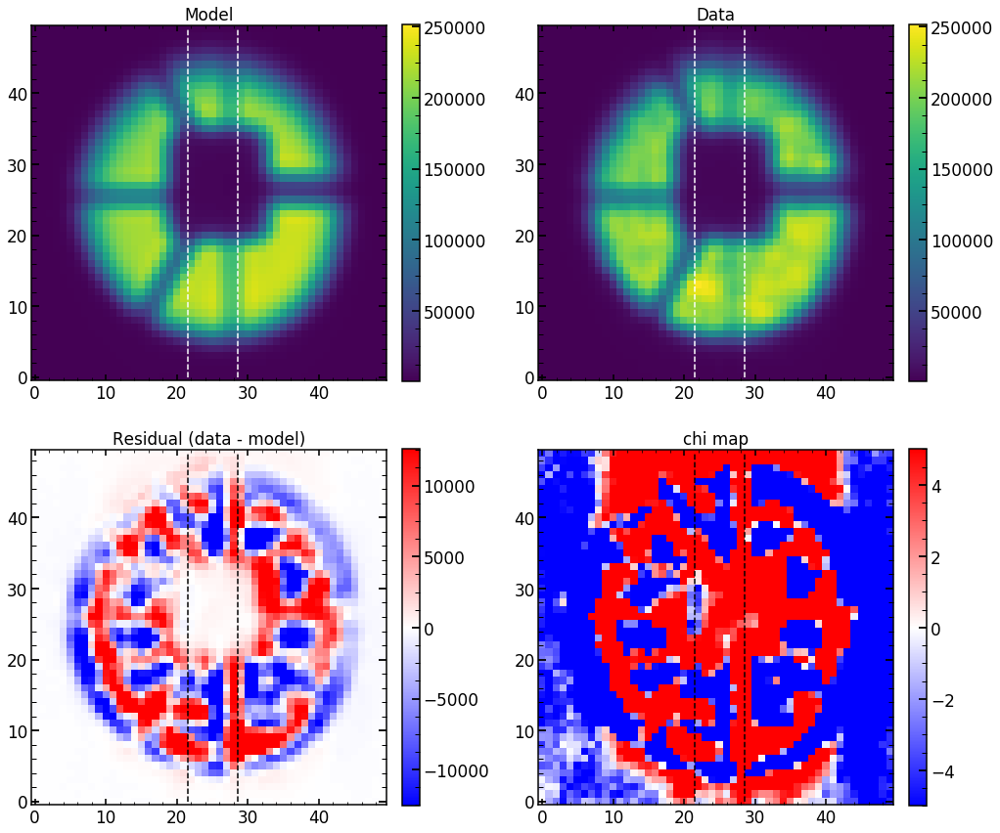

In [729]:
matplotlib.rcParams.update({'font.size': 14})
single_analysis.create_basic_comparison_plot()

660.7106363539126
chi**2 reduced is: 660.7106363539126
Abs of residual divided by total flux is: 0.06436749659838467
Abs of residual divided by largest value of a flux in the image is: 0.14692588992531874


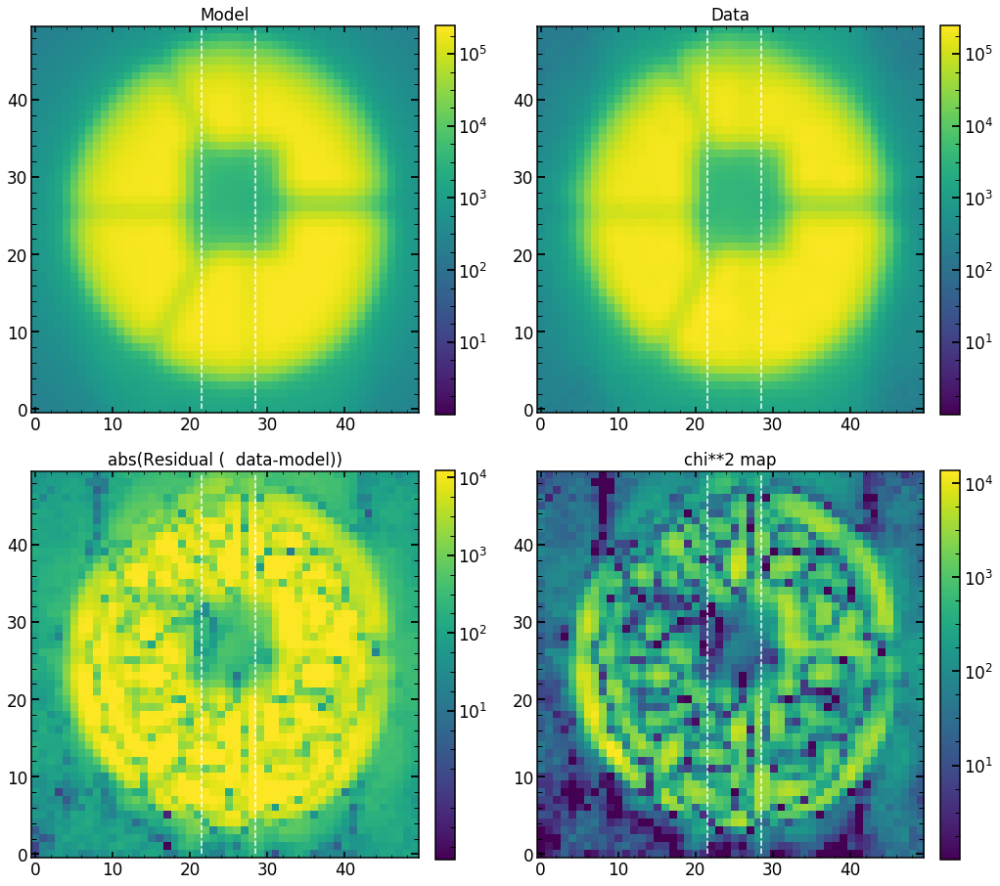

In [730]:
matplotlib.rcParams.update({'font.size': 14})
single_analysis.create_basic_comparison_plot_log()

In [731]:
image=np.load(TESTING_FINAL_IMAGES_FOLDER+'image.npy')

single_realization_primary_renormalized=np.load(TESTING_FINAL_IMAGES_FOLDER+'single_realization_primary_renormalized.npy')
single_realization_secondary_renormalized=np.load(TESTING_FINAL_IMAGES_FOLDER+'single_realization_secondary_renormalized.npy')
complete_realization_renormalized=np.load(TESTING_FINAL_IMAGES_FOLDER+'complete_realization_renormalized.npy')

input_img_single_realization_before_downsampling_primary_floor_floor=np.load(TESTING_FINAL_IMAGES_FOLDER+'input_img_single_realization_before_downsampling_primary_floor_floor.npy')
input_img_single_realization_before_downsampling_primary_floor_ceiling=np.load(TESTING_FINAL_IMAGES_FOLDER+'input_img_single_realization_before_downsampling_primary_floor_ceiling.npy')
input_img_single_realization_before_downsampling_primary_ceiling_floor=np.load(TESTING_FINAL_IMAGES_FOLDER+'input_img_single_realization_before_downsampling_primary_ceiling_floor.npy')
input_img_single_realization_before_downsampling_primary_ceiling_ceiling=np.load(TESTING_FINAL_IMAGES_FOLDER+'input_img_single_realization_before_downsampling_primary_ceiling_ceiling.npy')


input_img_single_realization_before_downsampling_primary=np.load(TESTING_FINAL_IMAGES_FOLDER+'input_img_single_realization_before_downsampling_primary.npy')
single_primary_realization=np.load(TESTING_FINAL_IMAGES_FOLDER+'single_primary_realization.npy')
single_secondary_realization=np.load(TESTING_FINAL_IMAGES_FOLDER+'single_secondary_realization.npy')
single_primary_realization_renormalized_within_create_complete_realization=np.load(TESTING_FINAL_IMAGES_FOLDER+'single_primary_realization_renormalized_within_create_complete_realization.npy')
single_secondary_realization_renormalized_within_create_complete_realization=np.load(TESTING_FINAL_IMAGES_FOLDER+'single_secondary_realization_renormalized_within_create_complete_realization.npy')
complete_realization_renormalized_within_create_complete_realization=np.load(TESTING_FINAL_IMAGES_FOLDER+'complete_realization_renormalized_within_create_complete_realization.npy')


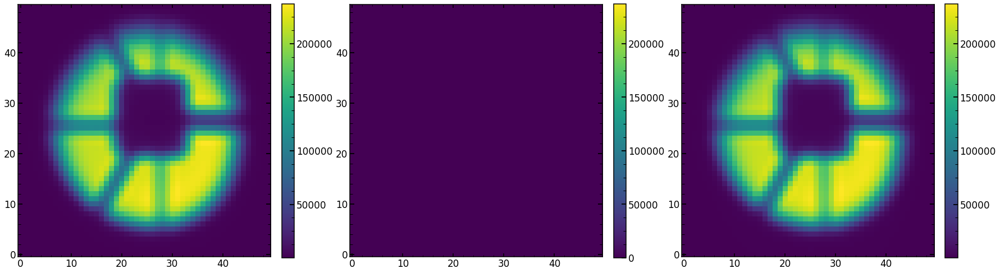

In [732]:
plt.figure(figsize=(30,10))

plt.subplot(131)
plt.imshow(single_realization_primary_renormalized,vmax=np.max(complete_realization_renormalized))
plt.colorbar(fraction=0.046, pad=0.04)
    
plt.subplot(132)
plt.imshow(single_realization_secondary_renormalized,vmax=np.max(complete_realization_renormalized))
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(133)
plt.imshow(complete_realization_renormalized,vmax=np.max(complete_realization_renormalized))
plt.colorbar(fraction=0.046, pad=0.04)

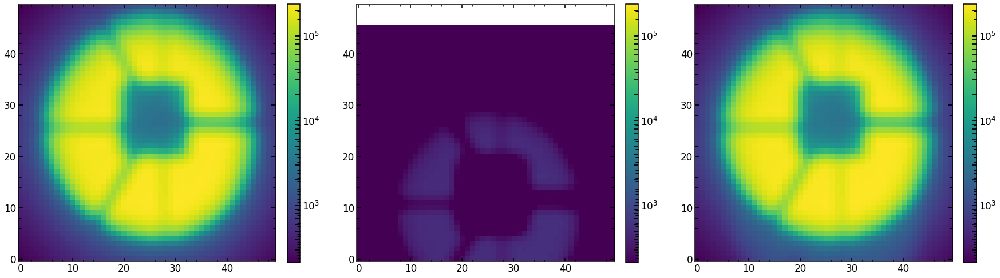

In [733]:
plt.figure(figsize=(30,10))

plt.subplot(131)
plt.imshow(single_realization_primary_renormalized,norm=LogNorm(),vmax=np.max(complete_realization_renormalized),vmin=np.min(complete_realization_renormalized))
plt.colorbar(fraction=0.046, pad=0.04)
    
plt.subplot(132)
plt.imshow(single_realization_secondary_renormalized,norm=LogNorm(),vmax=np.max(complete_realization_renormalized),vmin=np.min(complete_realization_renormalized))
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(133)
plt.imshow(complete_realization_renormalized,norm=LogNorm(),vmax=np.max(complete_realization_renormalized),vmin=np.min(complete_realization_renormalized))
plt.colorbar(fraction=0.046, pad=0.04)

In [734]:
sci_image=np.load(TESTING_FINAL_IMAGES_FOLDER+'sci_image.npy')
initial_complete_realization=np.load(TESTING_FINAL_IMAGES_FOLDER+'initial_complete_realization.npy')

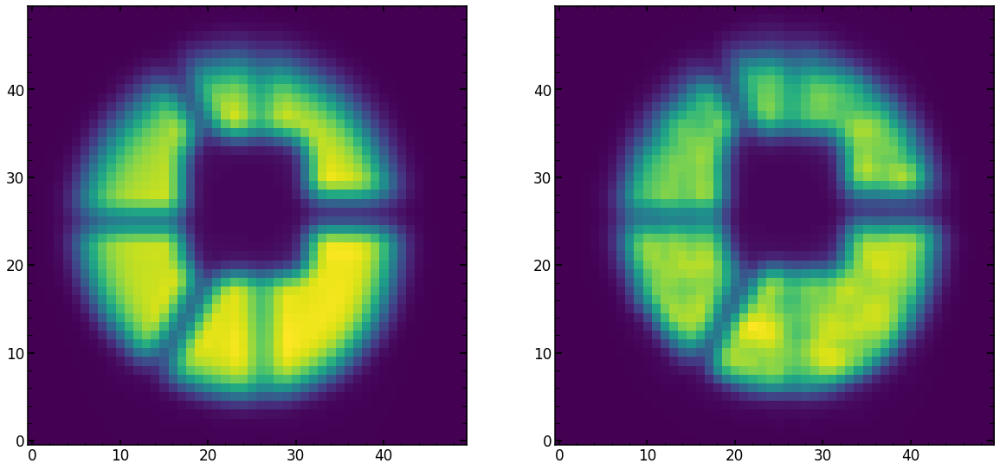

In [735]:
plt.figure(figsize=(20,12))

plt.subplot(121)
plt.imshow(initial_complete_realization)

plt.subplot(122)
plt.imshow(sci_image)

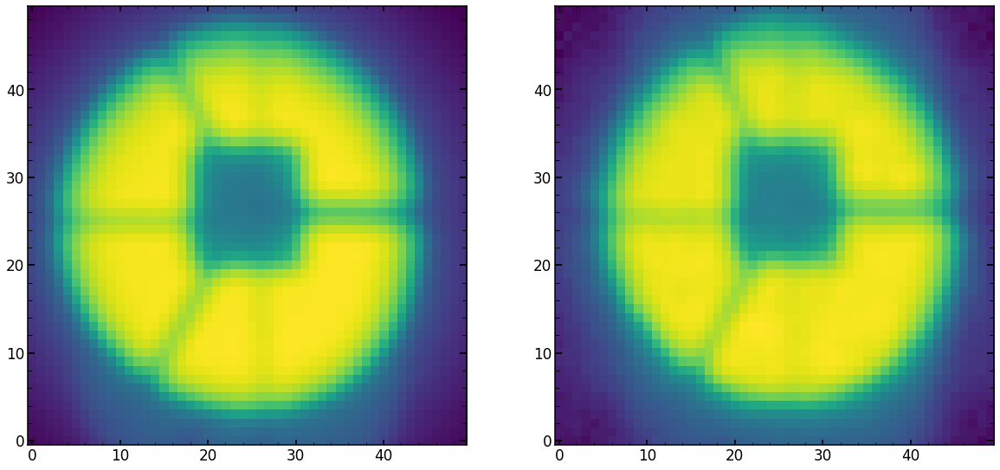

In [736]:
plt.figure(figsize=(20,12))

plt.subplot(121)
plt.imshow(initial_complete_realization,norm=LogNorm())

plt.subplot(122)
plt.imshow(sci_image,norm=LogNorm())

## archiving previous work 

In [373]:
find_centroid_of_flux(initial_complete_realization)

(24.997599032086764, 24.900674622973373)

In [345]:
np.array(find_centroid_of_flux(initial_complete_realization))-np.array(find_centroid_of_flux(sci_image))

array([-1.45397652,  2.62865225])

In [ ]:
centroid_of_sci_image: (25.761952072033278, 27.46011612616426)
centroid_of_initial_complete_realization: (25.071673056821155, 24.05557123537987)

In [349]:
    def bilinear_interpolation(x,y,img_floor_floor,img_floor_ceiling,img_ceiling_floor,img_ceiling_ceiling):     
        # have to check if floor and ceiling definciton are ok 
        # https://en.wikipedia.org/wiki/Bilinear_interpolation
        # x2=1
        # x1=0
        # y2=1
        # y1=0
        return img_floor_floor*(1-x)*(1-y)+img_floor_ceiling*(x)*(1-y)+img_ceiling_floor*(1-x)*(y)+img_ceiling_ceiling*(x)*(y)

In [ ]:
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.0452866417232336, 0.964262317457866]

In [380]:
input_img_single_realization_before_downsampling_primary=bilinear_interpolation(0,1,\
                                                                                input_img_single_realization_before_downsampling_primary_floor_floor,input_img_single_realization_before_downsampling_primary_floor_ceiling,\
                                                                                input_img_single_realization_before_downsampling_primary_ceiling_floor,input_img_single_realization_before_downsampling_primary_ceiling_ceiling)

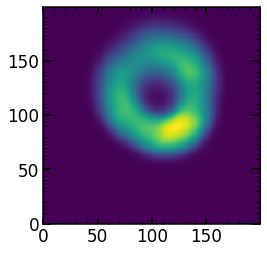

In [381]:
plt.imshow(input_img_single_realization_before_downsampling_primary)

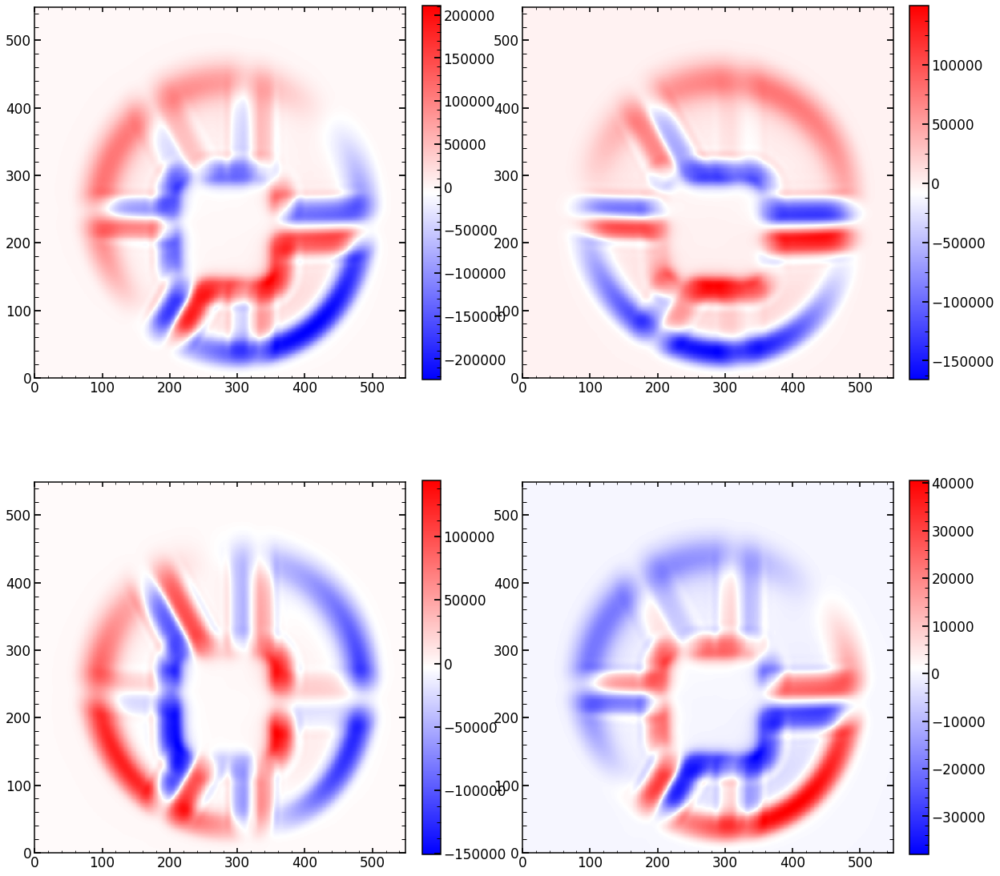

In [177]:
plt.figure(figsize=(20,20))
plt.subplot(2,2,1)
plt.imshow(input_img_single_realization_before_downsampling_primary-input_img_single_realization_before_downsampling_primary_ceiling_floor,cmap='bwr')
plt.colorbar(fraction=0.046, pad=0.04)
plt.subplot(2,2,2)
plt.imshow(input_img_single_realization_before_downsampling_primary-input_img_single_realization_before_downsampling_primary_ceiling_ceiling,cmap='bwr')
plt.colorbar(fraction=0.046, pad=0.04)
plt.subplot(2,2,3)
plt.imshow(input_img_single_realization_before_downsampling_primary-input_img_single_realization_before_downsampling_primary_floor_floor,cmap='bwr')
plt.colorbar(fraction=0.046, pad=0.04)
plt.subplot(2,2,4)
plt.imshow(input_img_single_realization_before_downsampling_primary-input_img_single_realization_before_downsampling_primary_floor_ceiling,cmap='bwr')
plt.colorbar(fraction=0.046, pad=0.04)

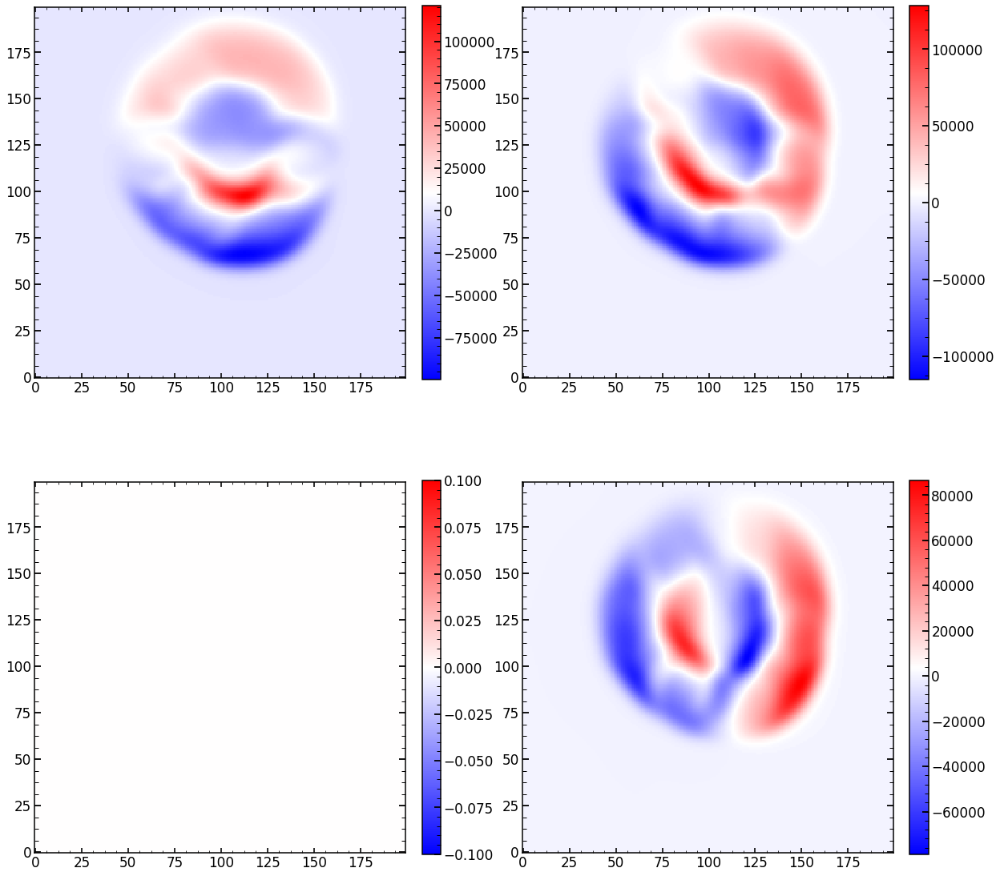

In [367]:
plt.figure(figsize=(20,20))
plt.subplot(2,2,1)
plt.imshow(input_img_single_realization_before_downsampling_primary_floor_floor-input_img_single_realization_before_downsampling_primary_ceiling_floor,cmap='bwr')
plt.colorbar(fraction=0.046, pad=0.04)
plt.subplot(2,2,2)
plt.imshow(input_img_single_realization_before_downsampling_primary_floor_floor-input_img_single_realization_before_downsampling_primary_ceiling_ceiling,cmap='bwr')
plt.colorbar(fraction=0.046, pad=0.04)
plt.subplot(2,2,3)
plt.imshow(input_img_single_realization_before_downsampling_primary_floor_floor-input_img_single_realization_before_downsampling_primary_floor_floor,cmap='bwr')
plt.colorbar(fraction=0.046, pad=0.04)
plt.subplot(2,2,4)
plt.imshow(input_img_single_realization_before_downsampling_primary_floor_floor-input_img_single_realization_before_downsampling_primary_floor_ceiling,cmap='bwr')
plt.colorbar(fraction=0.046, pad=0.04)

In [390]:
test=Zernike_Module.Psf_position(image,10,20,False,True,[0,0])

In [460]:

chi_2,single_primary_realization_renormalized_050,single_secondary_realization_renormalized,complete_realization_renormalized=test.create_complete_realization([0.5,0,0,0],return_full_result=True)
chi_2,single_primary_realization_renormalized_10,single_secondary_realization_renormalized,complete_realization_renormalized=test.create_complete_realization([1,0,0,0],return_full_result=True)
chi_2,single_primary_realization_renormalized_01,single_secondary_realization_renormalized,complete_realization_renormalized=test.create_complete_realization([0,1,0,0],return_full_result=True)

#chi_2,single_primary_realization_renormalized_00,single_secondary_realization_renormalized,complete_realization_renormalized=test.create_complete_realization([0,0,0,0],return_full_result=True)
chi_2,single_primary_realization_renormalized_005,single_secondary_realization_renormalized,complete_realization_renormalized=test.create_complete_realization([0,0.5,0,0],return_full_result=True)
chi_2,single_primary_realization_renormalized_0025,single_secondary_realization_renormalized,complete_realization_renormalized=test.create_complete_realization([0,0.25,0,0],return_full_result=True)
chi_2,single_primary_realization_renormalized_0m05,single_secondary_realization_renormalized,complete_realization_renormalized=test.create_complete_realization([0,-0.5,0,0],return_full_result=True)
chi_2,single_primary_realization_renormalized_0075,single_secondary_realization_renormalized,complete_realization_renormalized=test.create_complete_realization([0,0.75,0,0],return_full_result=True)
chi_2,single_primary_realization_renormalized_00,single_secondary_realization_renormalized,complete_realization_renormalized=test.create_complete_realization([0,0,0,0],return_full_result=True)

primary_offset_axis_1: 0.5
primary_offset_axis_0: 0
secondary_offset_axis_0: 0
ratio_secondary: 0
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0, 0.5]
primary_offset_axis_1: 1
primary_offset_axis_0: 0
secondary_offset_axis_0: 0
ratio_secondary: 0
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0, 0]
primary_offset_axis_1: 0
primary_offset_axis_0: 1
secondary_offset_axis_0: 1
ratio_secondary: 0
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0, 0]
primary_offset_axis_1: 0
primary_offset_axis_0: 0.5
secondary_offset_axis_0: 0.5
ratio_secondary: 0
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.5, 0]
primary_offset_axis_1: 0
primary_offset_axis_0: 0.25
secondary_offset_axis_0: 0.25
ratio_secondary: 0
primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor: [0.25, 0]
primary_offset_axis_1: 0
primary_offset_axis_0: -0.5
secondary_offset_axis_0: -0.5
ratio_se

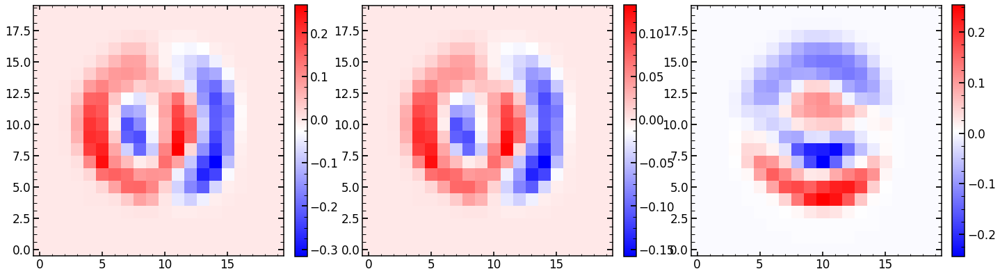

In [468]:
plt.figure(figsize=(24,10))
plt.subplot(131)
plt.imshow(single_primary_realization_renormalized_10-single_primary_realization_renormalized_00,cmap='bwr')
plt.colorbar(fraction=0.046, pad=0.04)
plt.subplot(132)
plt.imshow(single_primary_realization_renormalized_050-single_primary_realization_renormalized_00,cmap='bwr')
plt.colorbar(fraction=0.046, pad=0.04)
plt.subplot(133)
plt.imshow(single_primary_realization_renormalized_0075-single_primary_realization_renormalized_00,cmap='bwr')
plt.colorbar(fraction=0.046, pad=0.04)

In [449]:
input_img_single_realization_before_downsampling_primary00_floor_floor=np.load(TESTING_FINAL_IMAGES_FOLDER+'input_img_single_realization_before_downsampling_primary_floor_floor.npy')
input_img_single_realization_before_downsampling_primary00_floor_ceiling=np.load(TESTING_FINAL_IMAGES_FOLDER+'input_img_single_realization_before_downsampling_primary_floor_ceiling.npy')
input_img_single_realization_before_downsampling_primary00_ceiling_floor=np.load(TESTING_FINAL_IMAGES_FOLDER+'input_img_single_realization_before_downsampling_primary_ceiling_floor.npy')
input_img_single_realization_before_downsampling_primary00_ceiling_ceiling=np.load(TESTING_FINAL_IMAGES_FOLDER+'input_img_single_realization_before_downsampling_primary_ceiling_ceiling.npy')
input_img_single_realization_before_downsampling_primary00=np.load(TESTING_FINAL_IMAGES_FOLDER+'input_img_single_realization_before_downsampling_primary.npy')

In [446]:
input_img_single_realization_before_downsampling_primary005_floor_floor=np.load(TESTING_FINAL_IMAGES_FOLDER+'input_img_single_realization_before_downsampling_primary_floor_floor.npy')
input_img_single_realization_before_downsampling_primary005_floor_ceiling=np.load(TESTING_FINAL_IMAGES_FOLDER+'input_img_single_realization_before_downsampling_primary_floor_ceiling.npy')
input_img_single_realization_before_downsampling_primary005_ceiling_floor=np.load(TESTING_FINAL_IMAGES_FOLDER+'input_img_single_realization_before_downsampling_primary_ceiling_floor.npy')
input_img_single_realization_before_downsampling_primary005_ceiling_ceiling=np.load(TESTING_FINAL_IMAGES_FOLDER+'input_img_single_realization_before_downsampling_primary_ceiling_ceiling.npy')
input_img_single_realization_before_downsampling_primary005=np.load(TESTING_FINAL_IMAGES_FOLDER+'input_img_single_realization_before_downsampling_primary.npy')

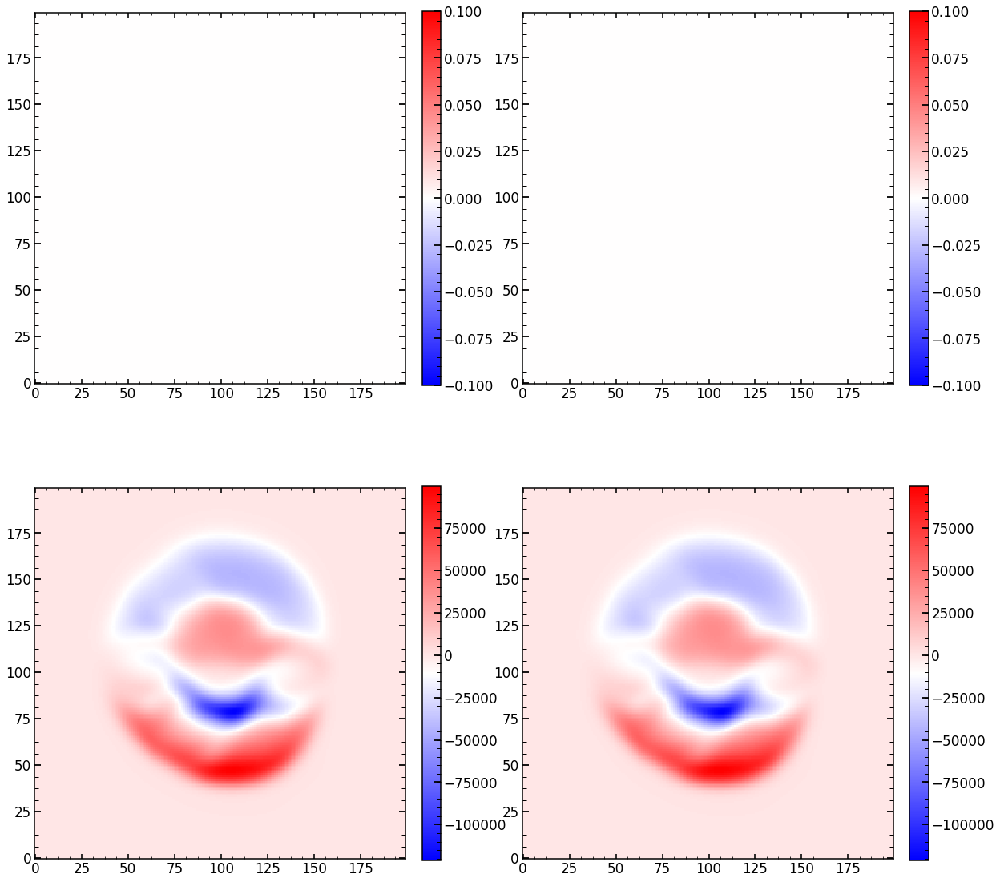

In [450]:
plt.figure(figsize=(20,20))
plt.subplot(2,2,1)
plt.imshow(input_img_single_realization_before_downsampling_primary005_floor_ceiling-input_img_single_realization_before_downsampling_primary00_floor_ceiling,cmap='bwr')
plt.colorbar(fraction=0.046, pad=0.04)
plt.subplot(2,2,2)
plt.imshow(input_img_single_realization_before_downsampling_primary005_floor_floor-input_img_single_realization_before_downsampling_primary00_floor_floor,cmap='bwr')
plt.colorbar(fraction=0.046, pad=0.04)
plt.subplot(2,2,3)
plt.imshow(input_img_single_realization_before_downsampling_primary005_ceiling_ceiling-input_img_single_realization_before_downsampling_primary00_ceiling_ceiling,cmap='bwr')
plt.colorbar(fraction=0.046, pad=0.04)
plt.subplot(2,2,4)
plt.imshow(input_img_single_realization_before_downsampling_primary005_ceiling_floor-input_img_single_realization_before_downsampling_primary00_ceiling_floor,cmap='bwr')
plt.colorbar(fraction=0.046, pad=0.04)

In [454]:
input_img_single_realization_before_downsampling_primary005_manual=0.5*input_img_single_realization_before_downsampling_primary005_floor_floor+0.5*input_img_single_realization_before_downsampling_primary005_ceiling_floor

In [455]:
input_img_single_realization_before_downsampling_primary005_manual-input_img_single_realization_before_downsampling_primary005_floor_floor

array([[ 4.7789395 ,  4.90172588,  5.02897726, ...,  5.77492442,
         5.60653867,  5.44632583],
       [ 4.89268268,  5.01938287,  5.15063791, ...,  5.91328424,
         5.73862015,  5.57215478],
       [ 5.00529264,  5.13603117,  5.27140764, ...,  6.04918836,
         5.86869621,  5.69631658],
       ...,
       [-5.34368838, -5.48551171, -5.63234529, ..., -6.12157998,
        -5.9541099 , -5.79366534],
       [-5.22400731, -5.36140748, -5.50358268, ..., -5.98250766,
        -5.82063211, -5.66532155],
       [-5.10258212, -5.23557238, -5.37310665, ..., -5.84139972,
        -5.68498369, -5.53465337]])

In [452]:
np.sum(input_img_single_realization_before_downsampling_primary005-input_img_single_realization_before_downsampling_primary00)

0.0

In [435]:
input_img_single_realization_before_downsampling_primary00=input_img_single_realization_before_downsampling_primary

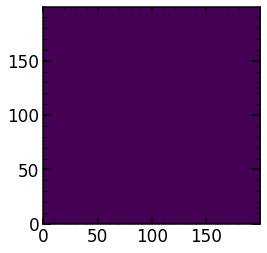

In [442]:
plt.imshow(input_img_single_realization_before_downsampling_primary005-input_img_single_realization_before_downsampling_primary00)

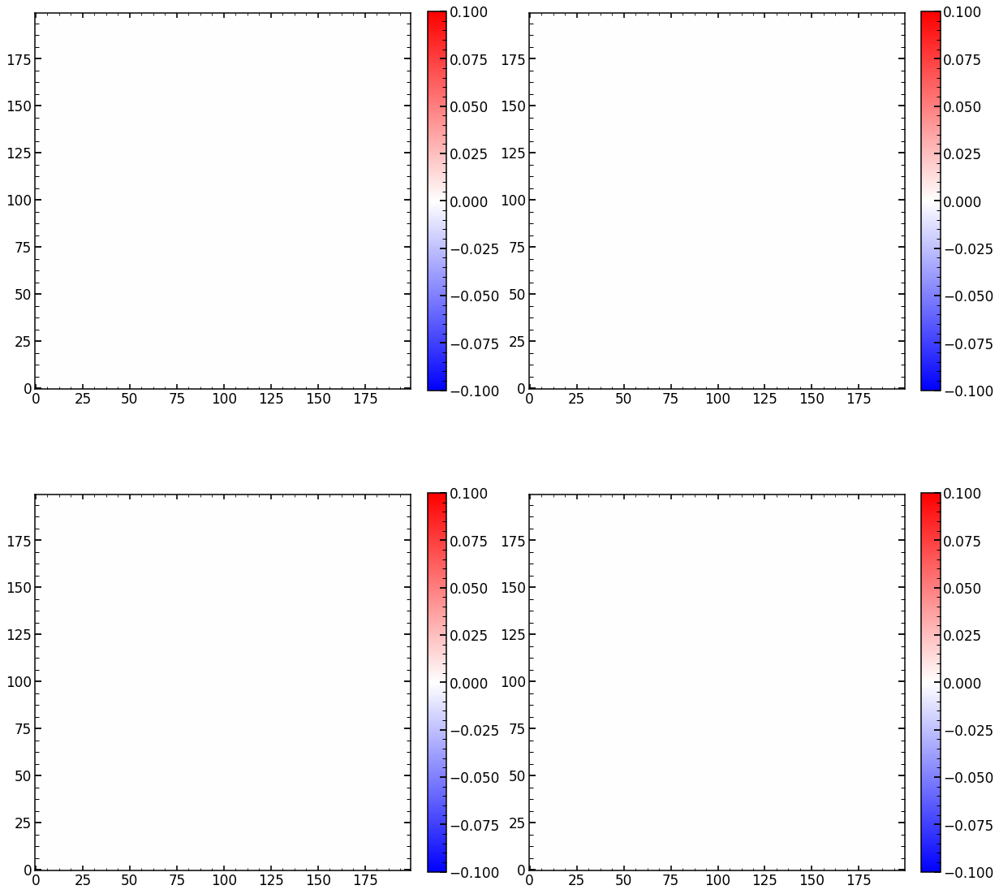

In [430]:
plt.figure(figsize=(20,20))
plt.subplot(2,2,1)
plt.imshow(input_img_single_realization_before_downsampling_primary-input_img_single_realization_before_downsampling_primary_floor_floor,cmap='bwr')
plt.colorbar(fraction=0.046, pad=0.04)
plt.subplot(2,2,2)
plt.imshow(input_img_single_realization_before_downsampling_primary-input_img_single_realization_before_downsampling_primary_floor_ceiling,cmap='bwr')
plt.colorbar(fraction=0.046, pad=0.04)
plt.subplot(2,2,3)
plt.imshow(input_img_single_realization_before_downsampling_primary-input_img_single_realization_before_downsampling_primary_ceiling_floor,cmap='bwr')
plt.colorbar(fraction=0.046, pad=0.04)
plt.subplot(2,2,4)
plt.imshow(input_img_single_realization_before_downsampling_primary-input_img_single_realization_before_downsampling_primary_ceiling_ceiling,cmap='bwr')
plt.colorbar(fraction=0.046, pad=0.04)

In [431]:
single_primary_realization00=resize(input_img_single_realization_before_downsampling_primary,(20,20))

/Users/nevencaplar/anaconda2/envs/py36/lib/python3.6/site-packages/matplotlib/image.py:405: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
/Users/nevencaplar/anaconda2/envs/py36/lib/python3.6/site-packages/matplotlib/image.py:406: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
/Users/nevencaplar/anaconda2/envs/py36/lib/python3.6/site-packages/matplotlib/image.py:412: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
/Users/nevencaplar/anaconda2/envs/py36/lib/python3.6/site-packages/matplotlib/image.py:417: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)


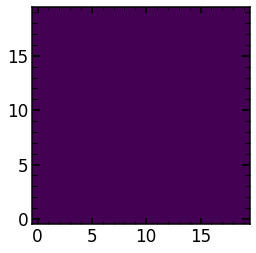

In [194]:
shape_of_sci_image=20

input_img_single_realization_before_downsampling_primary_floor_floor=image[primary_offset_axis_0_floor:primary_offset_axis_0_floor+oversampling*shape_of_sci_image,\
                                                           primary_offset_axis_1_floor:primary_offset_axis_1_floor+oversampling*shape_of_sci_image]
input_img_single_realization_before_downsampling_primary_floor_ceiling=image[primary_offset_axis_0_floor:primary_offset_axis_0_floor+oversampling*shape_of_sci_image,\
                                                           primary_offset_axis_1_ceiling:primary_offset_axis_1_ceiling+oversampling*shape_of_sci_image]
input_img_single_realization_before_downsampling_primary_ceiling_floor=image[primary_offset_axis_0_ceiling:primary_offset_axis_0_ceiling+oversampling*shape_of_sci_image,\
                                                           primary_offset_axis_1_floor:primary_offset_axis_1_floor+oversampling*shape_of_sci_image]
input_img_single_realization_before_downsampling_primary_ceiling_ceiling=image[primary_offset_axis_0_ceiling:primary_offset_axis_0_ceiling+oversampling*shape_of_sci_image,\
                                                           primary_offset_axis_1_ceiling:primary_offset_axis_1_ceiling+oversampling*shape_of_sci_image]

In [195]:
input_img_single_realization_before_downsampling_primary_floor_floor=image[primary_offset_axis_0_floor:primary_offset_axis_0_floor+oversampling*shape_of_sci_image,\
                                                           primary_offset_axis_1_floor:primary_offset_axis_1_floor+oversampling*shape_of_sci_image]
input_img_single_realization_before_downsampling_primary_floor_floor.shape

(200, 200)

In [196]:
image.shape

(281, 281)

In [197]:
np.max(input_img_single_realization_before_downsampling_primary_floor_floor-input_img_single_realization_before_downsampling_primary_ceiling_ceiling)

579518.9517630646

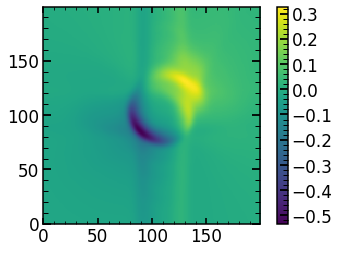

In [205]:
plt.imshow((input_img_single_realization_before_downsampling_primary_floor_floor-input_img_single_realization_before_downsampling_primary_ceiling_ceiling)\
           /((input_img_single_realization_before_downsampling_primary_floor_floor+input_img_single_realization_before_downsampling_primary_ceiling_ceiling)/2))
plt.colorbar()

In [358]:
x=[0,40.956,-110.5,0.4]

center_position=int(np.floor(image.shape[0]/2))
primary_offset_axis_1=x[0]
primary_offset_axis_0=x[1]  

secondary_offset_axis_1=primary_offset_axis_1
secondary_offset_axis_0=x[2]

print('primary_offset_axis_1: '+str(primary_offset_axis_1))

primary_offset_axis_1_floor=int(np.floor(primary_offset_axis_1)+center_position-shape_of_sci_image/2*oversampling)
primary_offset_axis_1_ceiling=int(np.ceil(primary_offset_axis_1)+center_position-shape_of_sci_image/2*oversampling)
primary_offset_axis_1_mod_from_floor=primary_offset_axis_1-int(np.floor(primary_offset_axis_1))
print('primary_offset_axis_1_floor:' +str(primary_offset_axis_1_floor))
print('primary_offset_axis_1_ceiling:' +str(primary_offset_axis_1_ceiling))
print('primary_offset_axis_1_mod_from_floor: '+str(primary_offset_axis_1_mod_from_floor))

primary_offset_axis_0_floor=int(np.floor(primary_offset_axis_0)+center_position-shape_of_sci_image/2*oversampling)
primary_offset_axis_0_ceiling=int(np.ceil(primary_offset_axis_0)+center_position-shape_of_sci_image/2*oversampling)
primary_offset_axis_0_mod_from_floor=primary_offset_axis_0-int(np.floor(primary_offset_axis_0))

print('primary_offset_axis_0_floor:' +str(primary_offset_axis_0_floor))
print('primary_offset_axis_0_ceiling:' +str(primary_offset_axis_0_ceiling))
print('primary_offset_axis_0_mod_from_floor: '+str(primary_offset_axis_0_mod_from_floor))

secondary_offset_axis_1_floor=int(np.floor(secondary_offset_axis_1)+center_position-shape_of_sci_image/2*oversampling)
secondary_offset_axis_1_ceiling=int(np.ceil(secondary_offset_axis_1)+center_position-shape_of_sci_image/2*oversampling)
secondary_offset_axis_1_mod_from_floor=secondary_offset_axis_1-int(np.floor(secondary_offset_axis_1))

secondary_offset_axis_0_floor=int(np.floor(secondary_offset_axis_0)+center_position-shape_of_sci_image/2*oversampling)
secondary_offset_axis_0_ceiling=int(np.ceil(secondary_offset_axis_0)+center_position-shape_of_sci_image/2*oversampling)
secondary_offset_axis_0_mod_from_floor=secondary_offset_axis_0-int(np.floor(secondary_offset_axis_0))

primary_offset_axis_1: 0
primary_offset_axis_1_floor:40
primary_offset_axis_1_ceiling:40
primary_offset_axis_1_mod_from_floor: 0
primary_offset_axis_0_floor:80
primary_offset_axis_0_ceiling:81
primary_offset_axis_0_mod_from_floor: 0.9560000000000031


In [359]:
        if primary_offset_axis_0_floor<0 or (primary_offset_axis_0_ceiling+oversampling*shape_of_sci_image)>len(image)\
        or primary_offset_axis_1_floor<0 or (primary_offset_axis_1_ceiling+oversampling*shape_of_sci_image)>len(image):
            #print('going into crop loop')
    
            pos_floor_floor = np.array([primary_offset_axis_0_floor, primary_offset_axis_1_floor])
            pos_floor_ceiling = np.array([primary_offset_axis_0_floor, primary_offset_axis_1_ceiling])
            pos_ceiling_floor = np.array([primary_offset_axis_0_ceiling, primary_offset_axis_1_floor])
            pos_ceiling_ceiling = np.array([primary_offset_axis_0_ceiling, primary_offset_axis_1_ceiling])    

            
    
            input_img_single_realization_before_downsampling_primary_floor_floor = np.zeros((oversampling*shape_of_sci_image, oversampling*shape_of_sci_image))
            input_img_single_realization_before_downsampling_primary_floor_ceiling = np.zeros((oversampling*shape_of_sci_image, oversampling*shape_of_sci_image))
            input_img_single_realization_before_downsampling_primary_ceiling_floor = np.zeros((oversampling*shape_of_sci_image, oversampling*shape_of_sci_image))
            input_img_single_realization_before_downsampling_primary_ceiling_ceiling = np.zeros((oversampling*shape_of_sci_image, oversampling*shape_of_sci_image))

            fill_crop(image, pos_floor_floor, input_img_single_realization_before_downsampling_primary_floor_floor)
            fill_crop(image, pos_floor_ceiling, input_img_single_realization_before_downsampling_primary_floor_ceiling)
            fill_crop(image, pos_ceiling_floor, input_img_single_realization_before_downsampling_primary_ceiling_floor)
            fill_crop(image, pos_ceiling_ceiling, input_img_single_realization_before_downsampling_primary_ceiling_ceiling)
    
        else:
            input_img_single_realization_before_downsampling_primary_floor_floor=image[primary_offset_axis_0_floor:primary_offset_axis_0_floor+oversampling*shape_of_sci_image,\
                                                                       primary_offset_axis_1_floor:primary_offset_axis_1_floor+oversampling*shape_of_sci_image]
            input_img_single_realization_before_downsampling_primary_floor_ceiling=image[primary_offset_axis_0_floor:primary_offset_axis_0_floor+oversampling*shape_of_sci_image,\
                                                                       primary_offset_axis_1_ceiling:primary_offset_axis_1_ceiling+oversampling*shape_of_sci_image]
            input_img_single_realization_before_downsampling_primary_ceiling_floor=image[primary_offset_axis_0_ceiling:primary_offset_axis_0_ceiling+oversampling*shape_of_sci_image,\
                                                                       primary_offset_axis_1_floor:primary_offset_axis_1_floor+oversampling*shape_of_sci_image]
            input_img_single_realization_before_downsampling_primary_ceiling_ceiling=image[primary_offset_axis_0_ceiling:primary_offset_axis_0_ceiling+oversampling*shape_of_sci_image,\
                                                                       primary_offset_axis_1_ceiling:primary_offset_axis_1_ceiling+oversampling*shape_of_sci_image]

In [360]:
    def bilinear_interpolation(x,y,img_floor_floor,img_floor_ceiling,img_ceiling_floor,img_ceiling_ceiling):     
        # have to check if floor and ceiling definciton are ok 
        # https://en.wikipedia.org/wiki/Bilinear_interpolation
        # x2=1
        # x1=0
        # y2=1
        # y1=0
        return img_floor_floor*(1-x)*(1-y)+img_floor_ceiling*(x)*(1-y)+img_ceiling_floor*(1-x)*(y)+img_ceiling_ceiling*(x)*(y)

In [361]:
secondary_offset_axis_0_mod_from_floor

0.5

In [362]:
input_img_single_realization_before_downsampling_primary=bilinear_interpolation(primary_offset_axis_0_mod_from_floor,primary_offset_axis_1_mod_from_floor,\
                                                                                        input_img_single_realization_before_downsampling_primary_floor_floor,input_img_single_realization_before_downsampling_primary_floor_ceiling,\
                                                                                        input_img_single_realization_before_downsampling_primary_ceiling_floor,input_img_single_realization_before_downsampling_primary_ceiling_ceiling)

single_primary_realization=resize(input_img_single_realization_before_downsampling_primary,(shape_of_sci_image,shape_of_sci_image))

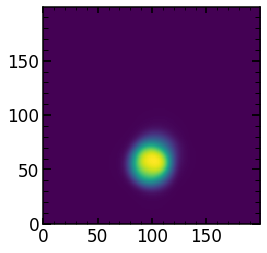

In [363]:
plt.imshow(input_img_single_realization_before_downsampling_primary)

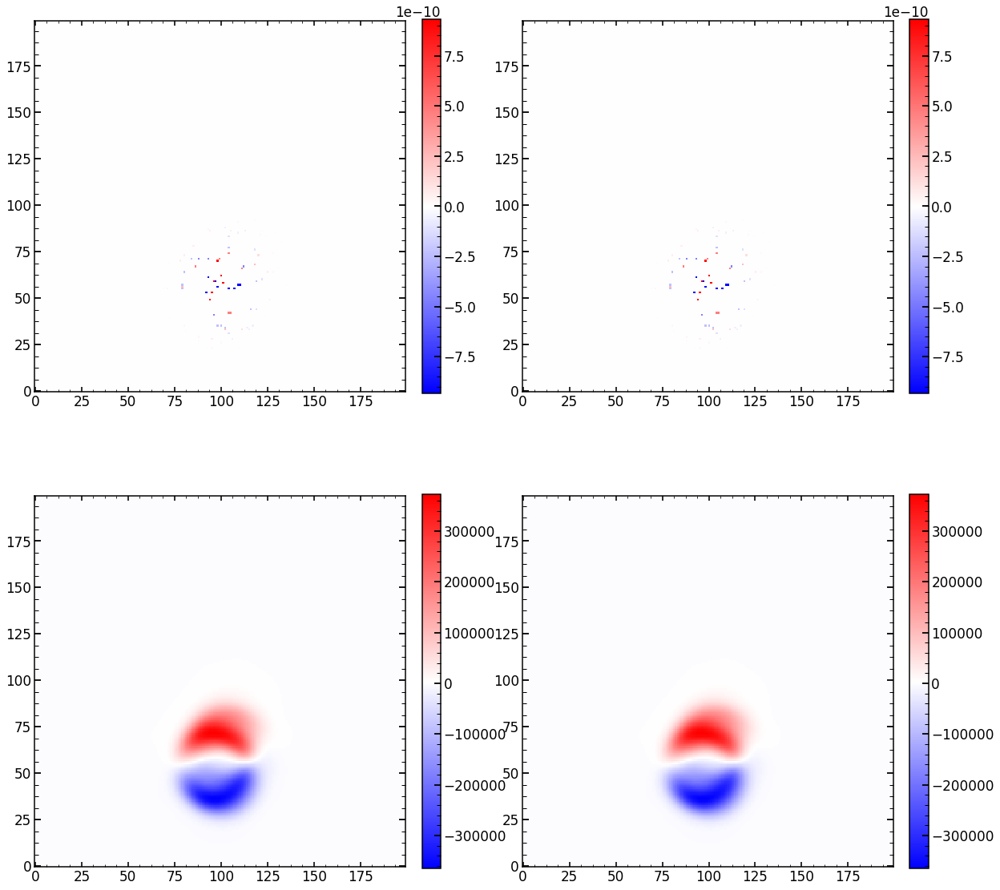

In [364]:
plt.figure(figsize=(20,20))
plt.subplot(2,2,1)
plt.imshow(input_img_single_realization_before_downsampling_primary-input_img_single_realization_before_downsampling_primary_floor_floor,cmap='bwr')
plt.colorbar(fraction=0.046, pad=0.04)
plt.subplot(2,2,2)
plt.imshow(input_img_single_realization_before_downsampling_primary-input_img_single_realization_before_downsampling_primary_floor_ceiling,cmap='bwr')
plt.colorbar(fraction=0.046, pad=0.04)
plt.subplot(2,2,3)
plt.imshow(input_img_single_realization_before_downsampling_primary-input_img_single_realization_before_downsampling_primary_ceiling_floor,cmap='bwr')
plt.colorbar(fraction=0.046, pad=0.04)
plt.subplot(2,2,4)
plt.imshow(input_img_single_realization_before_downsampling_primary-input_img_single_realization_before_downsampling_primary_ceiling_ceiling,cmap='bwr')
plt.colorbar(fraction=0.046, pad=0.04)

In [365]:
        if secondary_offset_axis_0_floor<0 or (secondary_offset_axis_0_ceiling+oversampling*shape_of_sci_image)>len(image)\
        or secondary_offset_axis_1_floor<0 or (secondary_offset_axis_1_ceiling+oversampling*shape_of_sci_image)>len(image):
            pos_floor_floor = np.array([secondary_offset_axis_0_floor, secondary_offset_axis_1_floor])
            pos_floor_ceiling = np.array([secondary_offset_axis_0_floor, secondary_offset_axis_1_ceiling])
            pos_ceiling_floor = np.array([secondary_offset_axis_0_ceiling, secondary_offset_axis_1_floor])
            pos_ceiling_ceiling = np.array([secondary_offset_axis_0_ceiling, secondary_offset_axis_1_ceiling])    
            
            input_img_single_realization_before_downsampling_secondary_floor_floor = np.full([oversampling*shape_of_sci_image, oversampling*shape_of_sci_image], 0)
            input_img_single_realization_before_downsampling_secondary_floor_ceiling = np.full([oversampling*shape_of_sci_image, oversampling*shape_of_sci_image], 0)
            input_img_single_realization_before_downsampling_secondary_ceiling_floor = np.full([oversampling*shape_of_sci_image, oversampling*shape_of_sci_image], 0)
            input_img_single_realization_before_downsampling_secondary_ceiling_ceiling= np.full([oversampling*shape_of_sci_image, oversampling*shape_of_sci_image], 0)
    
            fill_crop(image, pos_floor_floor, input_img_single_realization_before_downsampling_secondary_floor_floor)
            fill_crop(image, pos_floor_ceiling, input_img_single_realization_before_downsampling_secondary_floor_ceiling)
            fill_crop(image, pos_ceiling_floor, input_img_single_realization_before_downsampling_secondary_ceiling_floor)
            fill_crop(image, pos_ceiling_ceiling, input_img_single_realization_before_downsampling_secondary_ceiling_ceiling)
            
        else:
            input_img_single_realization_before_downsampling_secondary_floor_floor=image[secondary_offset_axis_0_floor:secondary_offset_axis_0_floor+oversampling*shape_of_sci_image,\
                                                                       secondary_offset_axis_1_floor:secondary_offset_axis_1_floor+oversampling*shape_of_sci_image]
            input_img_single_realization_before_downsampling_secondary_floor_ceiling=image[secondary_offset_axis_0_floor:secondary_offset_axis_0_floor+oversampling*shape_of_sci_image,\
                                                                       secondary_offset_axis_1_ceiling:secondary_offset_axis_1_ceiling+oversampling*shape_of_sci_image]
            input_img_single_realization_before_downsampling_secondary_ceiling_floor=image[secondary_offset_axis_0_ceiling:secondary_offset_axis_0_ceiling+oversampling*shape_of_sci_image,\
                                                                       secondary_offset_axis_1_floor:secondary_offset_axis_1_floor+oversampling*shape_of_sci_image]  
            input_img_single_realization_before_downsampling_secondary_ceiling_ceiling=image[secondary_offset_axis_0_ceiling:secondary_offset_axis_0_ceiling+oversampling*shape_of_sci_image,\
                                                                       secondary_offset_axis_1_ceiling:secondary_offset_axis_1_ceiling+oversampling*shape_of_sci_image]
    
    
        input_img_single_realization_before_downsampling_secondary=bilinear_interpolation(secondary_offset_axis_0_mod_from_floor,secondary_offset_axis_1_mod_from_floor,\
                                                                                    input_img_single_realization_before_downsampling_secondary_floor_floor,input_img_single_realization_before_downsampling_secondary_floor_ceiling,\
                                                                                    input_img_single_realization_before_downsampling_secondary_ceiling_floor,input_img_single_realization_before_downsampling_secondary_ceiling_ceiling)
                
        single_secondary_realization=resize(input_img_single_realization_before_downsampling_secondary,(shape_of_sci_image,shape_of_sci_image))   

In [366]:
        complete_realization=single_primary_realization+ratio_secondary*single_secondary_realization
        complete_realization_renormalized=complete_realization*(np.sum(sci_image)*v_flux/np.sum(complete_realization))
 

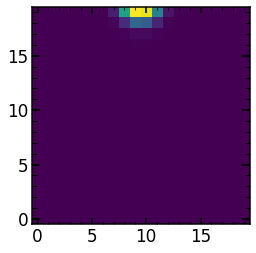

In [367]:
plt.imshow(single_secondary_realization)

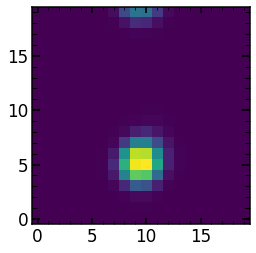

In [368]:
plt.imshow(complete_realization_renormalized)

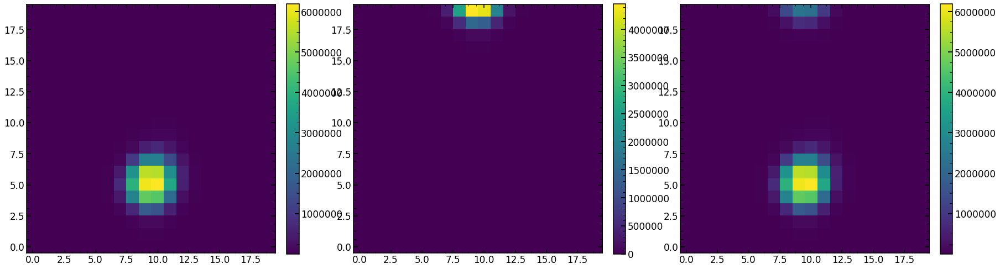

In [369]:
plt.figure(figsize=(30,10))

plt.subplot(131)
plt.imshow(single_primary_realization)
plt.colorbar(fraction=0.046, pad=0.04)
    
plt.subplot(132)
plt.imshow(single_secondary_realization)
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(133)
plt.imshow(complete_realization)
plt.colorbar(fraction=0.046, pad=0.04)

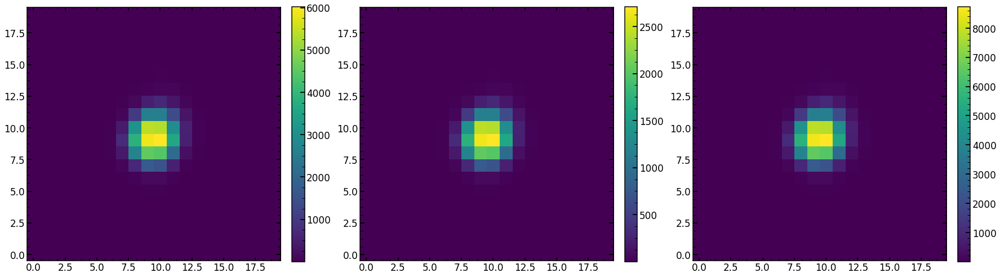

In [356]:
plt.figure(figsize=(30,10))

plt.subplot(131)
plt.imshow(single_primary_realization_renormalized_within_create_complete_realization)
plt.colorbar(fraction=0.046, pad=0.04)
    
plt.subplot(132)
plt.imshow(single_secondary_realization_renormalized_within_create_complete_realization)
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(133)
plt.imshow(complete_realization_renormalized_within_create_complete_realization)
plt.colorbar(fraction=0.046, pad=0.04)

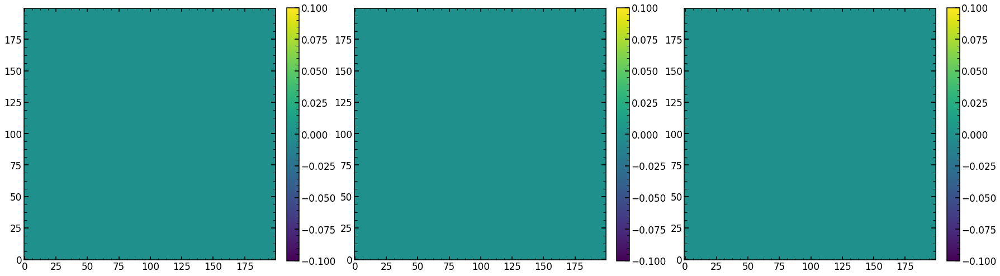

In [342]:
plt.figure(figsize=(30,10))

plt.subplot(131)
plt.imshow(input_img_single_realization_before_downsampling_primary_floor_floor)
plt.colorbar(fraction=0.046, pad=0.04)
    
plt.subplot(132)
plt.imshow(input_img_single_realization_before_downsampling_primary_floor_ceiling)
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(133)
plt.imshow(input_img_single_realization_before_downsampling_primary_ceiling_floor)
plt.colorbar(fraction=0.046, pad=0.04)

In [146]:
int(np.floor( -6.000000021024964))

-7

In [ ]:
scipy.bilinear 

# Bilinear when only one source 

In [737]:
columns22=['z4','z5','z6','z7','z8','z9','z10','z11',
       'z12','z13','z14','z15','z16','z17','z18','z19','z20','z21','z22',
      'hscFrac','strutFrac','dxFocal','dyFocal','slitFrac','slitFrac_dy',
      'radiometricEffect','radiometricExponent','x_ilum','y_ilum',
      'x_fiber','y_fiber','effective_radius_illumination',
      'frd_sigma','frd_lorentz_factor','det_vert','slitHolder_frac_dx',
      'grating_lines','scattering_slope','scattering_amplitude',
      'pixel_effect','fiber_r','flux']  

columns22_analysis=columns22+['chi2','chi2max']

In [770]:
date='Dec04'
obs=21550+54
obs_int=int(obs)
single_number='56'
image_index=int(single_number)
eps=5
arc='Ne'
dataset=4

if dataset==2:
    STAMPS_FOLDER="/Users/nevencaplar/Documents/PFS/ReducedData/Data_May_28/Stamps_cleaned/"
if dataset==3:
    STAMPS_FOLDER="/Users/nevencaplar/Documents/PFS/ReducedData/Data_Jun_25/Stamps_cleaned/"
if dataset==4 or dataset==5:
    STAMPS_FOLDER="/Users/nevencaplar/Documents/PFS/ReducedData/Data_Aug_14/Stamps_cleaned/"    

if dataset==1:
    if arc=="HgAr":
        single_number_focus=11748
    elif arc=="Ne":
        single_number_focus=11748+607    
    else:
        print("Not recognized arc-line")
        
if dataset==2:
    if arc=="HgAr":
        single_number_focus=17017+54
    elif arc=="Ne":
        single_number_focus=16292  
    elif arc=="Kr":
        single_number_focus=17364  
    else:
        print("Not recognized arc-line")
        
if dataset==3:
    if arc=="HgAr":
        single_number_focus=19238+54
    elif arc=="Ne":
        single_number_focus=19472  
    else:
        print("Not recognized arc-line")
      
if dataset==4 or dataset==5:
    if arc=="HgAr":
        single_number_focus=21346+54
    elif arc=="Ne":
        single_number_focus=21550 +54 
    elif arc=="Kr":
        single_number_focus=21754  +54 
    else:
        print("Not recognized arc-line")    
    
if dataset==1:
    if arc=='HgAr':
        obs_possibilites=np.array([11796,11790,11784,11778,11772,11766,11760,11754,11748,11748,11694,11700,11706,11712,11718,11724,11730,11736])
    elif arc=='Ne':
        obs_possibilites=np.array([12403,12397,12391,12385,12379,12373,12367,12361,12355,12355,12349,12343,12337,12331,12325,12319,12313,12307])
        
if dataset==2:
    if arc=='HgAr':
        obs_possibilites=np.array([17023,17023+6,17023+12,17023+18,17023+24,17023+30,17023+36,17023+42,17023+48,17023+48,\
                                   17023+54,17023+60,17023+66,17023+72,17023+78,17023+84,17023+90,17023+96,17023+48])
    if arc=='Ne':
        # different sequence than for HgAr
        obs_possibilites=np.array([16238+6,16238+12,16238+18,16238+24,16238+30,16238+36,16238+42,16238+48,16238+54,16238+54,\
                                   16238+60,16238+66,16238+72,16238+78,16238+84,16238+90,16238+96,16238+102,16238+54])
    if arc=='Kr':
         obs_possibilites=np.array([17310+6,17310+12,17310+18,17310+24,17310+30,17310+36,17310+42,17310+48,17310+54,17310+54,\
                                    17310+60,17310+66,17310+72,17310+78,17310+84,17310+90,17310+96,17310+102,17310+54])

if dataset==3:    
    if arc=='HgAr':
        obs_possibilites=np.array([19238,19238+6,19238+12,19238+18,19238+24,19238+30,19238+36,19238+42,19238+48,19238+48,\
                                   19238+54,19238+60,19238+66,19238+72,19238+78,19238+84,19238+90,19238+96,19238+48])
    elif arc=='Ne':
    # different sequence than for HgAr
        obs_possibilites=np.array([19472+6,19472+12,19472+18,19472+24,19472+30,19472+36,19472+42,19472+48,19472+54,19472+54,\
                                   19472+60,19472+66,19472+72,19472+78,19472+84,19472+90,19472+96,19472+102,19472+54]) 
  
if dataset==4:
    if arc=='HgAr':
        obs_possibilites=np.array([21346+6,21346+12,21346+18,21346+24,21346+30,21346+36,21346+42,21346+48,21346+54,21346+54,\
                                   21346+60,21346+66,21346+72,21346+78,21346+84,21346+90,21346+96,21346+102,21346+48])
    if arc=='Ne':
        obs_possibilites=np.array([21550+6,21550+12,21550+18,21550+24,21550+30,21550+36,21550+42,21550+48,21550+54,21550+54,\
                                   21550+60,21550+66,21550+72,21550+78,21550+84,21550+90,21550+96,21550+102,21550+54])
    if arc=='Kr':
         obs_possibilites=np.array([21754+6,21754+12,21754+18,21754+24,21754+30,21754+36,21754+42,21754+48,21754+54,21754+54,\
                                    21754+60,21754+66,21754+72,21754+78,21754+84,21754+90,21754+96,21754+102,21754+54])
 
if dataset==5:
    if arc=='HgAr':
        obs_possibilites=np.arange(21280,21280+11*6,6)
    if arc=='Ne':
        obs_possibilites=np.arange(21484,21484+11*6,6)
    if arc=='Kr':
         obs_possibilites=np.arange(21688,21688+11*6,6)



label=['m4','m35','m3','m25','m2','m15','m1','m05','0d','0','p05','p1','p15','p2','p25','p3','p35','p4','0p']
label_fine_defocus=['m05ff','m04ff','m03ff','m02ff','m01ff','0ff','p01ff','p02ff','p03ff','p04ff','p05ff']
if dataset in [0,1,2,3,4]:
    labelInput=label[list(obs_possibilites).index(obs_int)]
if dataset in [5]:
    labelInput=label_fine_defocus[list(obs_possibilites).index(obs_int)]
    
    
print(labelInput)
if obs==8600:
    print("Not implemented for December 2018 data")
else:
    sci_image =np.load(STAMPS_FOLDER+'sci'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
    mask_image =np.load(STAMPS_FOLDER+'mask'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
    var_image =np.load(STAMPS_FOLDER+'var'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
    #sci_image_focus_large =np.load(STAMPS_FOLDER+'sci'+str(single_number_focus)+str(single_number)+str(arc)+'_Stacked_large.npy')
    #var_image_focus_large =np.load(STAMPS_FOLDER+'var'+str(single_number_focus)+str(single_number)+str(arc)+'_Stacked_large.npy')

if dataset==1:
    if arc=="HgAr":
        finalArc=finalHgAr_Feb2019
    elif arc=="Ne":
        finalArc=finalNe_Feb2019    
    else:
        print("Not recognized arc-line")  
        
if dataset==2:   
    if arc=="HgAr":
        finalArc=finalHgAr_May2019
    elif arc=="Ne":
        finalArc=finalNe_May2019    
    elif arc=="Kr":
        finalArc=finalKr_May2019    
    else:
        print("Not recognized arc-line")   
        
if dataset==3:   
    if arc=="HgAr":
        finalArc=finalHgAr_May2019
    elif arc=="Ne":
        finalArc=finalNe_May2019    
    else:
        print("Not recognized arc-line")   
        
if dataset==4 or dataset==5:   
    if arc=="HgAr":
        finalArc=finalHgAr
    elif arc=="Ne":
        finalArc=finalNe  
    elif arc=="Kr":
        finalArc=finalKr 
    else:
        print("Not recognized arc-line")           
        
double_sources_positions_ratios=finalArc.loc[int(single_number)][['second_offset','second_ratio']].values
double_sources_positions_ratios

0d


array([0, 0], dtype=object)

In [771]:
with open('/Users/nevencaplar/Documents/PFS/Fit_Results/Dec040119/results_of_fit_many_interpolation_Ne_from_Dec04.pkl', 'rb') as f:
    results_of_fit_many_interpolation_Ne=pickle.load(f)  

In [772]:
minchain=results_of_fit_many_interpolation_Ne[labelInput].loc[int(single_number)].values[0:42]

In [773]:
np.max(sci_image)

145767.3

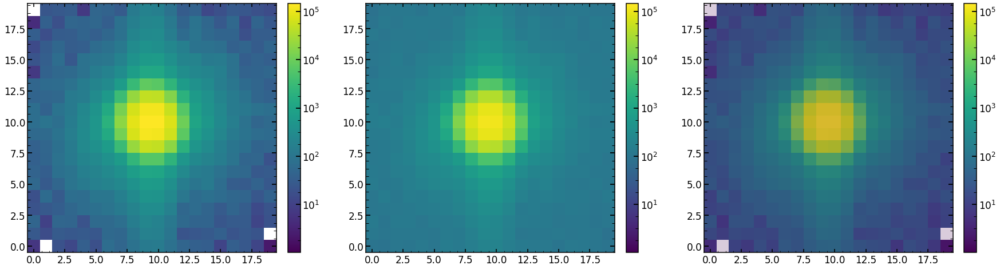

In [774]:
plt.figure(figsize=(30,8))
plt.subplot(131)
plt.imshow(sci_image,norm=LogNorm(),origin='lower',vmin=1,vmax=np.max(sci_image))
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

plt.subplot(132)
plt.imshow(var_image,norm=LogNorm(),origin='lower',vmin=1,vmax=np.max(sci_image))
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

plt.subplot(133)
plt.imshow(sci_image,norm=LogNorm(),origin='lower',vmin=1,vmax=np.max(sci_image))
cbar=plt.colorbar(fraction=0.046, pad=0.04)
plt.imshow(mask_image,origin='lower',vmin=0,vmax=np.max(mask_image),alpha=0.2)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])
#cbar.set_ticks([10,10**2,10**3,10**4,10**5])

In [775]:
single_analysis=Zernike_Analysis(date,obs,single_number,eps,arc,dataset)
"""
chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains()

minchain,like_min=single_analysis.create_likelihood()
"""

'\nchain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains()\n\nminchain,like_min=single_analysis.create_likelihood()\n'

In [776]:
print(minchain.shape)

if len(minchain)==42:
    columns=columns22
    
dfz22 = pd.DataFrame(np.array([np.array([minchain])[0][0:8]]),columns=columns[0:8])
print(dfz22)
dfglobal = pd.DataFrame(np.array([np.array([minchain])[0][8:len(columns)]]),columns=columns[8:])

dfglobal1 = pd.DataFrame(np.array([np.array([minchain])[0][8:18]]),columns=columns[8:18])
print(dfglobal1)

dfglobal2 = pd.DataFrame(np.array([np.array([minchain])[0][18:len(columns)]]),columns=columns[18:])
print(dfglobal2)

(42,)
         z4       z5        z6        z7      z8       z9       z10       z11
0  0.167572 -0.24749 -0.718165  0.729223 -0.3801  0.04535 -0.225184 -0.248394
        z12       z13       z14       z15       z16       z17       z18  \
0  0.071819  0.031742  0.006071  0.033018 -0.012738 -0.020813  0.005234   

        z19       z20       z21  
0  0.020711 -0.023631  0.009072  
       z22   hscFrac  strutFrac   dxFocal   dyFocal  slitFrac  slitFrac_dy  \
0  0.01395  0.643166   0.079758  0.051958 -0.099916  0.057921      0.02285   

   radiometricEffect  radiometricExponent    x_ilum  ...  frd_sigma  \
0           0.000011             0.000011  0.972729  ...   0.073762   

   frd_lorentz_factor  det_vert  slitHolder_frac_dx  grating_lines  \
0            0.805098   1.04632           -0.023665   59633.905319   

   scattering_slope  scattering_amplitude  pixel_effect   fiber_r     flux  
0          2.304281              0.002727      0.372658  1.806927  0.99848  

[1 rows x 24 columns]


In [777]:
"""
size=chain0_Emcee3.shape[1]
matplotlib.rcParams.update({'font.size': 18})
plt.figure(figsize=(18,10))
plt.subplot(211)
plt.plot(np.linspace(1,len(like_min),len(like_min)),like_min,'blue',ls='-',marker='o')
plt.ylabel('likelihood')
plt.xlabel('steps')
plt.axvline(size+0.5,ls='--')
plt.axvline(size*2+0.5,ls='--')
plt.axvline(size*5+0.5,ls='--')
plt.subplot(212)
plt.plot(np.linspace(1,len(like_min),len(like_min)),np.log10(like_min),'blue',ls='-',marker='o')
plt.ylabel('log10(likelihood)')
plt.xlabel('steps')
plt.axvline(size+0.5,ls='--')
plt.axvline(2*size+0.5,ls='--')
plt.axvline(5*size+0.5,ls='--')
"""

"\nsize=chain0_Emcee3.shape[1]\nmatplotlib.rcParams.update({'font.size': 18})\nplt.figure(figsize=(18,10))\nplt.subplot(211)\nplt.plot(np.linspace(1,len(like_min),len(like_min)),like_min,'blue',ls='-',marker='o')\nplt.ylabel('likelihood')\nplt.xlabel('steps')\nplt.axvline(size+0.5,ls='--')\nplt.axvline(size*2+0.5,ls='--')\nplt.axvline(size*5+0.5,ls='--')\nplt.subplot(212)\nplt.plot(np.linspace(1,len(like_min),len(like_min)),np.log10(like_min),'blue',ls='-',marker='o')\nplt.ylabel('log10(likelihood)')\nplt.xlabel('steps')\nplt.axvline(size+0.5,ls='--')\nplt.axvline(2*size+0.5,ls='--')\nplt.axvline(5*size+0.5,ls='--')\n"

In [778]:
double_sources_positions_ratios

array([0, 0], dtype=object)

In [812]:
model = LN_PFS_single(sci_image,var_image,dithering=1,save=0,zmax=22,verbosity=0,double_sources=None,double_sources_positions_ratios=double_sources_positions_ratios)   

#model = LN_PFS_single(sci_image,var_image,dithering=1,save=1,zmax=22,verbosity=1)   
#minchain_new=np.copy(minchain)   
#minchain_new[0]=10
#minchain_new[1]=5

model(minchain)

-7360.678154951706

chi**2 reduced is: 29.32129957254395
Abs of residual divided by total flux is: 0.0549697544358004
Abs of residual divided by largest value of a flux in the image is: 0.040945231877173735


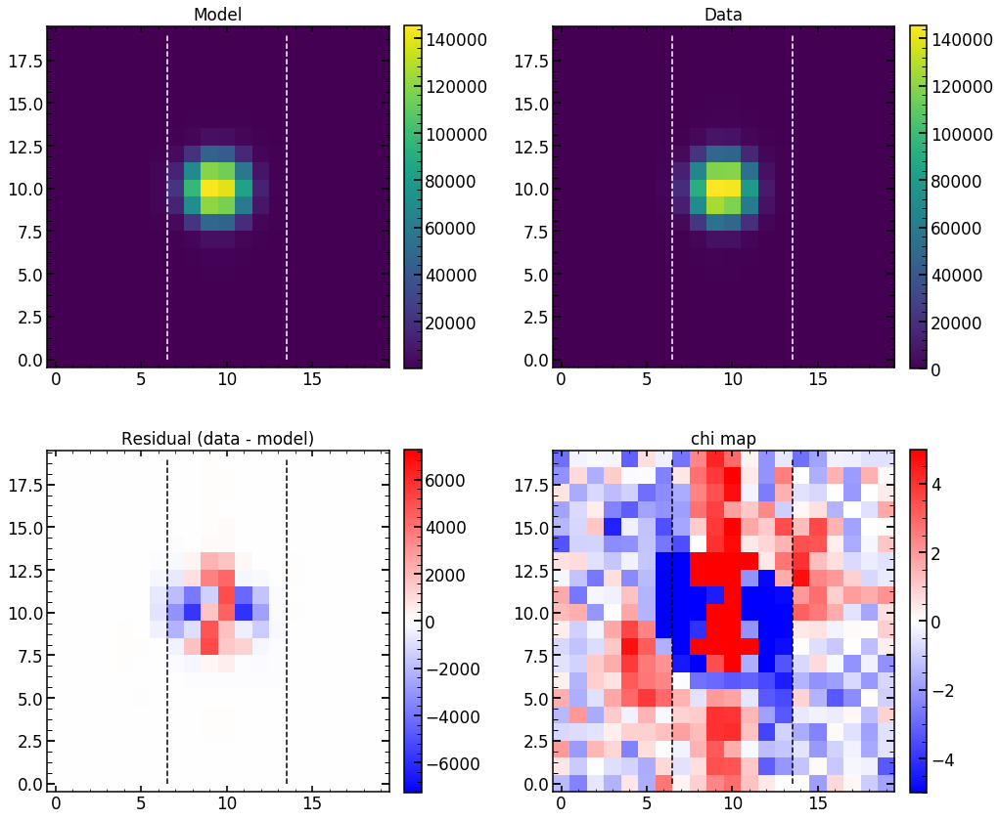

In [783]:
matplotlib.rcParams.update({'font.size': 14})
single_analysis.create_basic_comparison_plot()

29.32129957254395
chi**2 reduced is: 29.32129957254395
Abs of residual divided by total flux is: 0.0549697544358004
Abs of residual divided by largest value of a flux in the image is: 0.040945231877173735


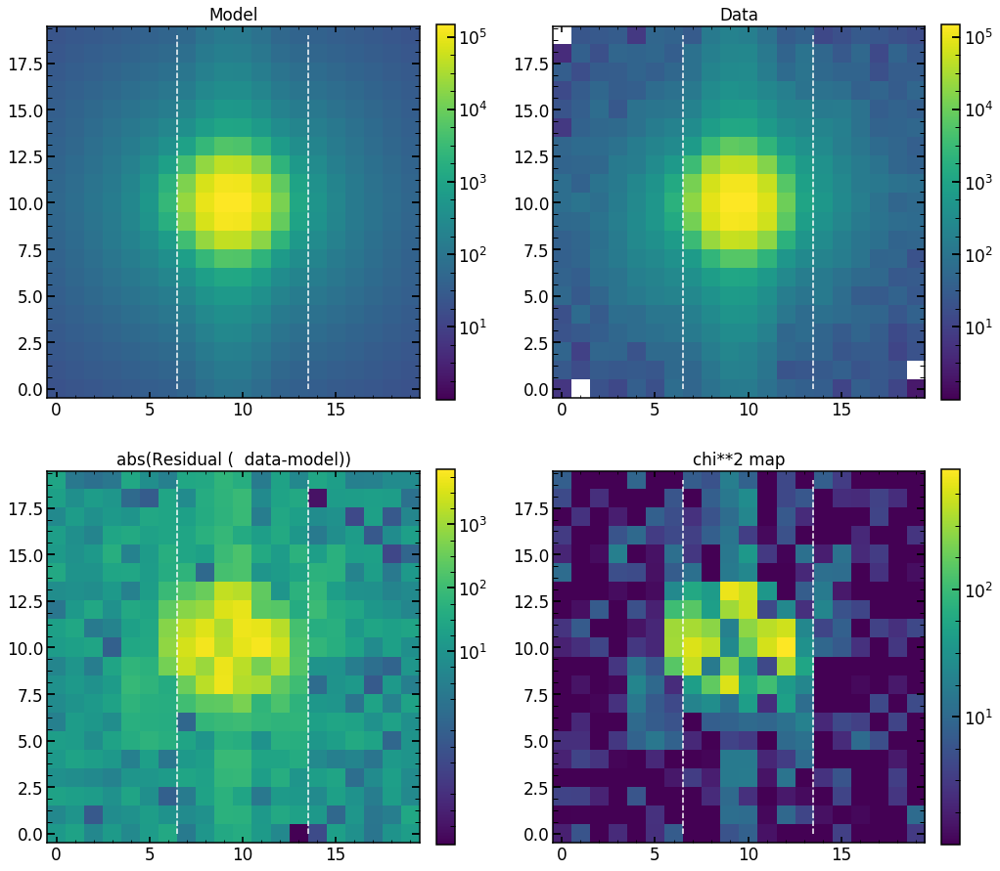

In [784]:
matplotlib.rcParams.update({'font.size': 14})
single_analysis.create_basic_comparison_plot_log()

In [557]:
image=np.load(TESTING_FINAL_IMAGES_FOLDER+'image.npy')

single_realization_primary_renormalized=np.load(TESTING_FINAL_IMAGES_FOLDER+'single_realization_primary_renormalized.npy')
single_realization_secondary_renormalized=np.load(TESTING_FINAL_IMAGES_FOLDER+'single_realization_secondary_renormalized.npy')
complete_realization_renormalized=np.load(TESTING_FINAL_IMAGES_FOLDER+'complete_realization_renormalized.npy')

input_img_single_realization_before_downsampling_primary_floor_floor=np.load(TESTING_FINAL_IMAGES_FOLDER+'input_img_single_realization_before_downsampling_primary_floor_floor.npy')
input_img_single_realization_before_downsampling_primary_floor_ceiling=np.load(TESTING_FINAL_IMAGES_FOLDER+'input_img_single_realization_before_downsampling_primary_floor_ceiling.npy')
input_img_single_realization_before_downsampling_primary_ceiling_floor=np.load(TESTING_FINAL_IMAGES_FOLDER+'input_img_single_realization_before_downsampling_primary_ceiling_floor.npy')
input_img_single_realization_before_downsampling_primary_ceiling_ceiling=np.load(TESTING_FINAL_IMAGES_FOLDER+'input_img_single_realization_before_downsampling_primary_ceiling_ceiling.npy')


input_img_single_realization_before_downsampling_primary=np.load(TESTING_FINAL_IMAGES_FOLDER+'input_img_single_realization_before_downsampling_primary.npy')
single_primary_realization=np.load(TESTING_FINAL_IMAGES_FOLDER+'single_primary_realization.npy')
single_secondary_realization=np.load(TESTING_FINAL_IMAGES_FOLDER+'single_secondary_realization.npy')
single_primary_realization_renormalized_within_create_complete_realization=np.load(TESTING_FINAL_IMAGES_FOLDER+'single_primary_realization_renormalized_within_create_complete_realization.npy')
single_secondary_realization_renormalized_within_create_complete_realization=np.load(TESTING_FINAL_IMAGES_FOLDER+'single_secondary_realization_renormalized_within_create_complete_realization.npy')
complete_realization_renormalized_within_create_complete_realization=np.load(TESTING_FINAL_IMAGES_FOLDER+'complete_realization_renormalized_within_create_complete_realization.npy')


In [759]:
ratio_secondary=1

In [760]:
if ratio_secondary !=0:
    print('not zero')

not zero


In [761]:
x=[1,1]

In [763]:
def test_fun(x):
    if len(x)==2:
        x[2]
    print(x[2])
    

In [809]:
        save=0
        if save in (None,0):
            save=0
        else:
            save=1
        print(save)

0


In [827]:
arc='Ne'
if str(arc)=="HgAr":
    single_number_focus=21346+54
elif str(arc)=="Ne":
    single_number_focus=21550+54 
elif str(arc)=="Kr":
    single_number_focus=21754+54
else:
    print("Not recognized arc-line")  

        
single_number_focus

21604

In [830]:
test='[0,0,0.323,0]'
eval(test)

[0, 0, 0.323, 0]

# Feb 14 - reruning with bilinear implementation  - first only a test of few spots 

In [900]:
finalHgAr_Feb2020_dataset.loc[52].values

array([339, 1610, 1318, '738.6248', '0', 'HgAr', 1610, -13.14, 0.011, 0,
       0], dtype=object)

In [897]:
finalHgAr_Feb2020_dataset.loc[57].values

array([339, 1609, 3343, '912.5693', '1', 'HgAr', 1609, 0, 0, 0, 0],
      dtype=object)

In [907]:
finalNe_Feb2020_dataset.loc[36].values

array([339, 1612, 315, '650.84186', '0', 'Ne', 1612, 30.12, 0.406, 0, 0],
      dtype=object)

In [908]:
finalNe_Feb2020_dataset.loc[34].values

array([255, 1225, 1164, '724.72437', '1', 'Ne', 1225, 0, 0, 0, 0],
      dtype=object)

In [911]:
finalKr_Feb2020_dataset.loc[27].values

array([464, 2440, 3109, 892.87, 1, 'Kr', 2509, 0, 0, 0, 0], dtype=object)

In [912]:
finalKr_Feb2020_dataset.loc[28].values

array([525, 2828, 1863, 785.48, 0, 'Kr', 2897, 8, 0.01, 0, 0],
      dtype=object)

In [915]:
finalHgAr_Feb2020_dataset.loc[52]

fiber                  339
xc                    1610
yc                    1318
wavelength        738.6248
close                    0
lamp                  HgAr
xc_effective          1610
second_offset       -13.14
second_ratio         0.011
second2_offset           0
second2_ratio            0
Name: 52, dtype: object

In [918]:
list(finalHgAr_Feb2020_dataset.loc[52][['second_offset','second_ratio']].values)

[-13.14, 0.011]

## scripts 

In [296]:
def remove(string): 
    return string.replace(" ", "")

remove(str(list(finalHgAr_Feb2020_dataset.loc[single_spot][['second_offset','second_ratio']].values)))

'[-13.14,0.011]'

In [1]:
#MPI

list_of_HgAr_to_analyze=[51,53,54,55,56]

for single_spot in list_of_HgAr_to_analyze:
    if str(finalHgAr_Feb2020_dataset.loc[single_spot]['close'])=='0':
        double_source=1
    else:
        double_source=0    
        
    file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/T01S'+str(single_spot)+'Feb20.sh','w') 
    file.write("#!/bin/bash \n")
    file.write("#SBATCH --nodes=4 # node count \n")
    file.write("#SBATCH --ntasks-per-node=40 \n") 
    file.write("#SBATCH --time 17:59:59 \n")
    file.write("#SBATCH --mail-type=begin  \n")
    file.write("#SBATCH --mail-type=end   \n") 
    file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n") 

    file.write("\n")
    file.write("#1. Observation (e.g., 8567) \n") 
    file.write("#2. Threads \n") 
    file.write("#3. Steps \n") 
    file.write("\n")
    # m4, p4, 0, m35, p35, m05, p05,m3,p3,m15,p15
    for obs in [21346+6,21346+102,21346+54,21346+12,21346+96,21346+48,21346+60,21346+18,21346+90,21346+36,21346+72]:
        file.write("mpirun python /home/ncaplar/Code/ZernikeSingle_Feb2020_MPI01.py "+str(obs)+" "+str(single_spot)+\
                   " 40 5 4 HgAr "+str(double_source)+\
                   " "+remove(str(list(finalHgAr_Feb2020_dataset.loc[single_spot][['second_offset','second_ratio']].values)))+"\n")
    file.close()    
    
file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/Feb20ScriptToSubmitScriptsTiger01'+'.sh','w')
file.write("#!/bin/bash \n")
file.write("\n")
#for obs in [1,2,3,4]:
#    for single_spot in [35,45,55,75,85,95]:
#        file.write('sbatch /home/ncaplar/Scripts/T'+str(obs)+'S'+str(single_spot)+'Sep_P.sh \n')

for single_spot in list_of_HgAr_to_analyze:
    file.write('sbatch /home/ncaplar/Scripts/T01S'+str(single_spot)+'Feb20.sh \n')

file.close()
##################
##################
##################


list_of_Ne_to_analyze=[26,29]

for single_spot in list_of_Ne_to_analyze:
    if str(finalNe_Feb2020_dataset.loc[single_spot]['close'])=='0':
        double_source=1
    else:
        double_source=0        

    file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/T02S'+str(single_spot)+'Feb20.sh','w') 
    file.write("#!/bin/bash \n")
    file.write("#SBATCH --nodes=4 # node count \n")
    file.write("#SBATCH --ntasks-per-node=40 \n") 
    file.write("#SBATCH --time 17:59:59 \n")
    file.write("#SBATCH --mail-type=begin  \n")
    file.write("#SBATCH --mail-type=end   \n") 
    file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n") 

    file.write("\n")
    file.write("#1. Observation (e.g., 8567) \n") 
    file.write("#2. Threads \n") 
    file.write("#3. Steps \n") 
    file.write("\n")
    # m4, p4, 0, m35, p35, m05, p05,m3,p3,m15,p15
    for obs in [21550+6,21550+102,21550+54,21550+12,21550+96,21550+48,21550+60,21550+18,21550+90,21550+36,21550+72]:
        file.write("mpirun python /home/ncaplar/Code/ZernikeSingle_Feb2020_MPI01.py "+str(obs)+" "+str(single_spot)+\
                   " 40 5 4 Ne "+str(double_source)+\
                   " "+remove(str(list(finalNe_Feb2020_dataset.loc[single_spot][['second_offset','second_ratio']].values)))+"\n")
    file.close()    
    
file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/Feb20ScriptToSubmitScriptsTiger02'+'.sh','w')
file.write("#!/bin/bash \n")
file.write("\n")
#for obs in [1,2,3,4]:
#    for single_spot in [35,45,55,75,85,95]:
#        file.write('sbatch /home/ncaplar/Scripts/T'+str(obs)+'S'+str(single_spot)+'Sep_P.sh \n')

for single_spot in list_of_Ne_to_analyze:
    file.write('sbatch /home/ncaplar/Scripts/T02S'+str(single_spot)+'Feb20.sh \n')

file.close()
##################
##################
##################

list_of_Kr_to_analyze=[27,28]

for single_spot in list_of_Kr_to_analyze:
    if str(finalKr_Feb2020_dataset.loc[single_spot]['close'])=='0':
        double_source=1
    else:
        double_source=0  
    
    file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/T03S'+str(single_spot)+'Feb20.sh','w') 
    file.write("#!/bin/bash \n")
    file.write("#SBATCH --nodes=4 # node count \n")
    file.write("#SBATCH --ntasks-per-node=40 \n") 
    file.write("#SBATCH --time 17:59:59 \n")
    file.write("#SBATCH --mail-type=begin  \n")
    file.write("#SBATCH --mail-type=end   \n") 
    file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n") 

    file.write("\n")
    file.write("#1. Observation (e.g., 8567) \n") 
    file.write("#2. Threads \n") 
    file.write("#3. Steps \n") 
    file.write("\n")
    # m4, p4, 0, m35, p35, m05, p05,m3,p3,m15,p15
    for obs in [21754+6,21754+102,21754+54,21754+12,21754+96,21754+48,21754+60,21754+18,21754+90,21754+36,21754+72]:
        file.write("mpirun python /home/ncaplar/Code/ZernikeSingle_Feb2020_MPI01.py "+str(obs)+" "+str(single_spot)+\
                   " 40 5 4 Kr "+str(double_source)+\
                   " "+remove(str(list(finalKr_Feb2020_dataset.loc[single_spot][['second_offset','second_ratio']].values)))+"\n")
    file.close()    
    
file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/Feb20ScriptToSubmitScriptsTiger03'+'.sh','w')
file.write("#!/bin/bash \n")
file.write("\n")
#for obs in [1,2,3,4]:
#    for single_spot in [35,45,55,75,85,95]:
#        file.write('sbatch /home/ncaplar/Scripts/T'+str(obs)+'S'+str(single_spot)+'Sep_P.sh \n')

for single_spot in list_of_Kr_to_analyze:
    file.write('sbatch /home/ncaplar/Scripts/T03S'+str(single_spot)+'Feb20.sh \n')

file.close()

NameError: name 'finalHgAr_Feb2020_dataset' is not defined

In [926]:
finalHgAr_Feb2020_dataset

,fiber,xc,yc,wavelength,close,lamp,xc_effective,second_offset,second_ratio,second2_offset,second2_ratio
0,2,69,808,690.9346,0,HgAr,69,-19.25,0.0034,-40.7,0.006
1,2,69,875,696.7261,1,HgAr,69,0,0,0,0
2,2,70,992,706.8989,0,HgAr,70,16.93,0.268,28.33,0.088
3,2,71,1229,727.47876,1,HgAr,71,0,0,0,0
4,2,72,1358,738.6248,0,HgAr,72,-13.14,0.011,0,0
...,...,...,...,...,...,...,...,...,...,...,...
115,650,4002,2379,826.6699,0.5,HgAr,4071,0,0,0,0
116,650,4003,2681,852.4029,0.5,HgAr,4072,0,0,0,0
117,650,4008,3393,912.5693,1,HgAr,4077,0,0,0,0
118,650,4009,3515,922.7301,0,HgAr,4078,22.44,0.022,-13.14,0.011


In [932]:
    single_spot=27
    if finalKr_Feb2020_dataset.loc[single_spot]['close']=='0':
        double_source=1
    else:
        double_source=0  
        
    double_source

0

In [940]:
import string
string.replace(str(list(finalHgAr_Feb2020_dataset.loc[single_spot][['second_offset','second_ratio']].values)),' ','')

AttributeError: module 'string' has no attribute 'replace'

In [943]:
def remove(string): 
    return string.replace(" ", "")

remove(str(list(finalHgAr_Feb2020_dataset.loc[single_spot][['second_offset','second_ratio']].values)))

'[-13.14,0.011]'

## which images are avaliable - Feb14

In [403]:
date='Feb1420'
Emcee3_Ne=glob.glob('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ResultsFromTiger/'+date+'/chain'+date+'_Single_P_*5NeEmcee3.npy', recursive=True)
Emcee3_HgAr=glob.glob('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ResultsFromTiger/'+date+'/chain'+date+'_Single_P_*5HgArEmcee3.npy', recursive=True)
Emcee3_Kr=glob.glob('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ResultsFromTiger/'+date+'/chain'+date+'_Single_P_*5KrEmcee3.npy', recursive=True)

In [404]:
analyzed_Neon_images=[]
for i in range(len(Emcee3_Ne)):
    single_string=Emcee3_Ne[i][94:len(Emcee3_Ne[i])-13]
    analyzed_Neon_images.append([int(single_string[:5]),int(single_string[5:])])
   
analyzed_Neon_images=np.array(analyzed_Neon_images)
###########
analyzed_HgAr_images=[]
for i in range(len(Emcee3_HgAr)):
    single_string=Emcee3_HgAr[i][94:len(Emcee3_HgAr[i])-15]
    analyzed_HgAr_images.append([int(single_string[:5]),int(single_string[5:])])
 

analyzed_HgAr_images=np.array(analyzed_HgAr_images)
###########
analyzed_Kr_images=[]
for i in range(len(Emcee3_Kr)):
    single_string=Emcee3_Kr[i][94:len(Emcee3_Kr[i])-13]
    analyzed_Kr_images.append([int(single_string[:5]),int(single_string[5:])])
    
analyzed_Kr_images=np.array(analyzed_Kr_images)

In [405]:
arranged_by_defocus_Ne=analyzed_Neon_images[analyzed_Neon_images[:,0].argsort()]
arranged_by_spot_number_Ne=analyzed_Neon_images[analyzed_Neon_images[:,1].argsort()]

arranged_by_defocus_HgAr=analyzed_HgAr_images[analyzed_HgAr_images[:,0].argsort()]
arranged_by_spot_number_HgAr=analyzed_HgAr_images[analyzed_HgAr_images[:,1].argsort()]

arranged_by_defocus_Kr=analyzed_Kr_images[analyzed_Kr_images[:,0].argsort()]
arranged_by_spot_number_Kr=analyzed_Kr_images[analyzed_Kr_images[:,1].argsort()]

In [406]:
analyzed_Kr_images

array([[21808,    27],
       [21814,    27],
       [21766,    27],
       [21844,    28],
       [21856,    28],
       [21826,    28],
       [21802,    27],
       [21760,    27],
       [21850,    28],
       [21790,    27],
       [21772,    27],
       [21808,    28],
       [21814,    28],
       [21856,    27],
       [21844,    27],
       [21766,    28],
       [21772,    28],
       [21790,    28],
       [21850,    27],
       [21760,    28],
       [21802,    28],
       [21826,    27]])

In [407]:
arranged_by_spot_number_Ne

array([[21562,    26],
       [21556,    26],
       [21604,    26],
       [21610,    26],
       [21640,    26],
       [21652,    26],
       [21598,    26],
       [21646,    26],
       [21622,    26],
       [21586,    26],
       [21568,    26],
       [21556,    29],
       [21652,    29],
       [21562,    29],
       [21586,    29],
       [21604,    29],
       [21646,    29],
       [21622,    29],
       [21598,    29],
       [21610,    29],
       [21640,    29],
       [21568,    29]])

In [408]:
arranged_by_spot_number_HgAr

array([[21352,    52],
       [21436,    52],
       [21382,    52],
       [21364,    52],
       [21418,    52],
       [21448,    52],
       [21400,    52],
       [21442,    52],
       [21406,    52],
       [21394,    52],
       [21358,    52],
       [21442,    57],
       [21352,    57],
       [21400,    57],
       [21436,    57],
       [21364,    57],
       [21358,    57],
       [21448,    57],
       [21418,    57],
       [21406,    57],
       [21382,    57],
       [21394,    57]])

## single image analysis 

In [430]:
with open('/Users/nevencaplar/Documents/PFS/ReducedData/Data_May_28/Dataframes/finalHgAr_Feb2020', 'rb') as f:
    finalHgAr_Feb2020_dataset=pickle.load(f)  
with open('/Users/nevencaplar/Documents/PFS/ReducedData/Data_May_28/Dataframes/finalNe_Feb2020', 'rb') as f:
    finalNe_Feb2020_dataset=pickle.load(f)  
with open('/Users/nevencaplar/Documents/PFS/ReducedData/Data_May_28/Dataframes/finalKr_Feb2020', 'rb') as f:
    finalKr_Feb2020_dataset=pickle.load(f)  

finalHgAr=finalHgAr_Feb2020_dataset
finalNe=finalNe_Feb2020_dataset
finalKr=finalKr_Feb2020_dataset

In [431]:
columns22=['z4','z5','z6','z7','z8','z9','z10','z11',
       'z12','z13','z14','z15','z16','z17','z18','z19','z20','z21','z22',
      'hscFrac','strutFrac','dxFocal','dyFocal','slitFrac','slitFrac_dy',
      'radiometricEffect','radiometricExponent','x_ilum','y_ilum',
      'x_fiber','y_fiber','effective_radius_illumination',
      'frd_sigma','frd_lorentz_factor','det_vert','slitHolder_frac_dx',
      'grating_lines','scattering_slope','scattering_amplitude',
      'pixel_effect','fiber_r','flux']  

columns22_analysis=columns22+['chi2','chi2max']

In [557]:

date='Feb1420'
obs=21346+54
obs_int=int(obs)
single_number='57'
image_index=int(single_number)
eps=5
arc='HgAr'
dataset=4

if dataset==2:
    STAMPS_FOLDER="/Users/nevencaplar/Documents/PFS/ReducedData/Data_May_28/Stamps_cleaned/"
if dataset==3:
    STAMPS_FOLDER="/Users/nevencaplar/Documents/PFS/ReducedData/Data_Jun_25/Stamps_cleaned/"
if dataset==4 or dataset==5:
    STAMPS_FOLDER="/Users/nevencaplar/Documents/PFS/ReducedData/Data_Aug_14/Stamps_cleaned/"    

if dataset==1:
    if arc=="HgAr":
        single_number_focus=11748
    elif arc=="Ne":
        single_number_focus=11748+607    
    else:
        print("Not recognized arc-line")
        
if dataset==2:
    if arc=="HgAr":
        single_number_focus=17017+54
    elif arc=="Ne":
        single_number_focus=16292  
    elif arc=="Kr":
        single_number_focus=17364  
    else:
        print("Not recognized arc-line")
        
if dataset==3:
    if arc=="HgAr":
        single_number_focus=19238+54
    elif arc=="Ne":
        single_number_focus=19472  
    else:
        print("Not recognized arc-line")
      
if dataset==4 or dataset==5:
    if arc=="HgAr":
        single_number_focus=21346+54
    elif arc=="Ne":
        single_number_focus=21550 +54 
    elif arc=="Kr":
        single_number_focus=21754  +54 
    else:
        print("Not recognized arc-line")    
    
if dataset==1:
    if arc=='HgAr':
        obs_possibilites=np.array([11796,11790,11784,11778,11772,11766,11760,11754,11748,11748,11694,11700,11706,11712,11718,11724,11730,11736])
    elif arc=='Ne':
        obs_possibilites=np.array([12403,12397,12391,12385,12379,12373,12367,12361,12355,12355,12349,12343,12337,12331,12325,12319,12313,12307])
        
if dataset==2:
    if arc=='HgAr':
        obs_possibilites=np.array([17023,17023+6,17023+12,17023+18,17023+24,17023+30,17023+36,17023+42,17023+48,17023+48,\
                                   17023+54,17023+60,17023+66,17023+72,17023+78,17023+84,17023+90,17023+96,17023+48])
    if arc=='Ne':
        # different sequence than for HgAr
        obs_possibilites=np.array([16238+6,16238+12,16238+18,16238+24,16238+30,16238+36,16238+42,16238+48,16238+54,16238+54,\
                                   16238+60,16238+66,16238+72,16238+78,16238+84,16238+90,16238+96,16238+102,16238+54])
    if arc=='Kr':
         obs_possibilites=np.array([17310+6,17310+12,17310+18,17310+24,17310+30,17310+36,17310+42,17310+48,17310+54,17310+54,\
                                    17310+60,17310+66,17310+72,17310+78,17310+84,17310+90,17310+96,17310+102,17310+54])

if dataset==3:    
    if arc=='HgAr':
        obs_possibilites=np.array([19238,19238+6,19238+12,19238+18,19238+24,19238+30,19238+36,19238+42,19238+48,19238+48,\
                                   19238+54,19238+60,19238+66,19238+72,19238+78,19238+84,19238+90,19238+96,19238+48])
    elif arc=='Ne':
    # different sequence than for HgAr
        obs_possibilites=np.array([19472+6,19472+12,19472+18,19472+24,19472+30,19472+36,19472+42,19472+48,19472+54,19472+54,\
                                   19472+60,19472+66,19472+72,19472+78,19472+84,19472+90,19472+96,19472+102,19472+54]) 
  
if dataset==4:
    if arc=='HgAr':
        obs_possibilites=np.array([21346+6,21346+12,21346+18,21346+24,21346+30,21346+36,21346+42,21346+48,21346+54,21346+54,\
                                   21346+60,21346+66,21346+72,21346+78,21346+84,21346+90,21346+96,21346+102,21346+48])
    if arc=='Ne':
        obs_possibilites=np.array([21550+6,21550+12,21550+18,21550+24,21550+30,21550+36,21550+42,21550+48,21550+54,21550+54,\
                                   21550+60,21550+66,21550+72,21550+78,21550+84,21550+90,21550+96,21550+102,21550+54])
    if arc=='Kr':
         obs_possibilites=np.array([21754+6,21754+12,21754+18,21754+24,21754+30,21754+36,21754+42,21754+48,21754+54,21754+54,\
                                    21754+60,21754+66,21754+72,21754+78,21754+84,21754+90,21754+96,21754+102,21754+54])
 
if dataset==5:
    if arc=='HgAr':
        obs_possibilites=np.arange(21280,21280+11*6,6)
    if arc=='Ne':
        obs_possibilites=np.arange(21484,21484+11*6,6)
    if arc=='Kr':
         obs_possibilites=np.arange(21688,21688+11*6,6)



label=['m4','m35','m3','m25','m2','m15','m1','m05','0d','0','p05','p1','p15','p2','p25','p3','p35','p4','0p']
label_fine_defocus=['m05ff','m04ff','m03ff','m02ff','m01ff','0ff','p01ff','p02ff','p03ff','p04ff','p05ff']
if dataset in [0,1,2,3,4]:
    labelInput=label[list(obs_possibilites).index(obs_int)]
if dataset in [5]:
    labelInput=label_fine_defocus[list(obs_possibilites).index(obs_int)]
    
    
print(labelInput)
if obs==8600:
    print("Not implemented for December 2018 data")
else:
    sci_image =np.load(STAMPS_FOLDER+'sci'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
    mask_image =np.load(STAMPS_FOLDER+'mask'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
    var_image =np.load(STAMPS_FOLDER+'var'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
    #sci_image_focus_large =np.load(STAMPS_FOLDER+'sci'+str(single_number_focus)+str(single_number)+str(arc)+'_Stacked_large.npy')
    #var_image_focus_large =np.load(STAMPS_FOLDER+'var'+str(single_number_focus)+str(single_number)+str(arc)+'_Stacked_large.npy')
    

sci_image_focus_like_defocus=np.zeros((50,50))
var_image_focus_like_defocus=np.zeros((50,50))
mask_image_focus_like_defocus=np.zeros((50,50))

sci_image_focus_like_defocus[15:35,15:35]=sci_image
var_image_focus_like_defocus[15:35,15:35]=var_image
mask_image_focus_like_defocus[15:35,15:35]=mask_image

sci_image=sci_image_focus_like_defocus
var_image=var_image_focus_like_defocus
mask_image=mask_image_focus_like_defocus


if dataset==1:
    if arc=="HgAr":
        finalArc=finalHgAr_Feb2019
    elif arc=="Ne":
        finalArc=finalNe_Feb2019    
    else:
        print("Not recognized arc-line")  
        
if dataset==2:   
    if arc=="HgAr":
        finalArc=finalHgAr_May2019
    elif arc=="Ne":
        finalArc=finalNe_May2019    
    elif arc=="Kr":
        finalArc=finalKr_May2019    
    else:
        print("Not recognized arc-line")   
        
if dataset==3:   
    if arc=="HgAr":
        finalArc=finalHgAr_May2019
    elif arc=="Ne":
        finalArc=finalNe_May2019    
    else:
        print("Not recognized arc-line")   
        
if dataset==4 or dataset==5:   
    if arc=="HgAr":
        finalArc=finalHgAr_Feb2020_dataset
    elif arc=="Ne":
        finalArc=finalNe_Feb2020_dataset    
    elif arc=="Kr":
        finalArc=finalKr_Feb2020_dataset    
    else:
        print("Not recognized arc-line")           
        
finalArc.loc[int(single_number)]
double_sources=0
double_sources_positions_ratios=finalArc.loc[int(single_number)][['second_offset','second_ratio']].values
double_sources_positions_ratios

0d


array([0, 0], dtype=object)

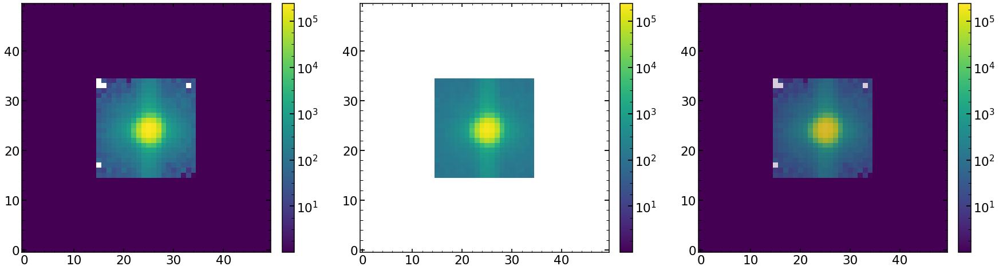

In [558]:
plt.figure(figsize=(30,8))
plt.subplot(131)
plt.imshow(sci_image,norm=LogNorm(),origin='lower',vmin=1,vmax=np.max(sci_image))
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

plt.subplot(132)
plt.imshow(var_image,norm=LogNorm(),origin='lower',vmin=1,vmax=np.max(sci_image))
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

plt.subplot(133)
plt.imshow(sci_image,norm=LogNorm(),origin='lower',vmin=1,vmax=np.max(sci_image))
cbar=plt.colorbar(fraction=0.046, pad=0.04)
plt.imshow(mask_image,origin='lower',vmin=0,vmax=np.max(mask_image),alpha=0.2)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])
#cbar.set_ticks([10,10**2,10**3,10**4,10**5])

In [559]:
single_analysis=Zernike_Analysis(date,obs,single_number,eps,arc,dataset)
chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains()

minchain,like_min=single_analysis.create_likelihood()

(number of walkers, number of steps, number of parameters): (252, 20, 42)
minimal likelihood is: 5380.929438215129
minimal chi2 reduced is: 19.06665524771627


In [560]:
print(minchain.shape)

if len(minchain)==42:
    columns=columns22
    
dfz22 = pd.DataFrame(np.array([np.array([minchain])[0][0:8]]),columns=columns[0:8])
print(dfz22)
dfglobal = pd.DataFrame(np.array([np.array([minchain])[0][8:len(columns)]]),columns=columns[8:])

dfglobal1 = pd.DataFrame(np.array([np.array([minchain])[0][8:18]]),columns=columns[8:18])
print(dfglobal1)

dfglobal2 = pd.DataFrame(np.array([np.array([minchain])[0][18:len(columns)]]),columns=columns[18:])
print(dfglobal2)

(42,)
         z4        z5        z6        z7        z8       z9      z10  \
0  0.198063 -0.246948 -0.136533  0.390851 -0.010955  0.05507 -0.50631   

        z11  
0 -0.260167  
        z12       z13       z14       z15       z16       z17      z18  \
0  0.026785  0.112407 -0.042278  0.139261 -0.065596  0.014258  0.03857   

        z19       z20       z21  
0  0.113743 -0.077986  0.106792  
        z22   hscFrac  strutFrac   dxFocal   dyFocal  slitFrac  slitFrac_dy  \
0  0.230548  0.743236   0.089066 -0.290287  0.159334  0.054692     0.041953   

   radiometricEffect  radiometricExponent    x_ilum  ...  frd_sigma  \
0           0.000006             0.000006  0.974213  ...   0.011511   

   frd_lorentz_factor  det_vert  slitHolder_frac_dx  grating_lines  \
0            0.743609  1.041906            0.123037   60094.550952   

   scattering_slope  scattering_amplitude  pixel_effect   fiber_r      flux  
0          2.482364              0.003884      0.372644  1.833346  0.998746  

[1

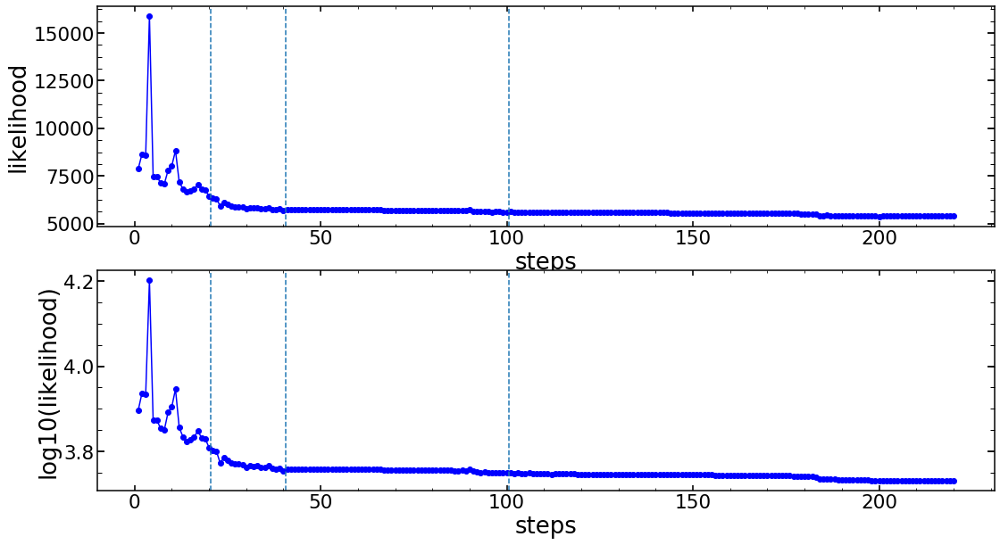

In [561]:
size=chain0_Emcee3.shape[1]
matplotlib.rcParams.update({'font.size': 18})
plt.figure(figsize=(18,10))
plt.subplot(211)
plt.plot(np.linspace(1,len(like_min),len(like_min)),like_min,'blue',ls='-',marker='o')
plt.ylabel('likelihood')
plt.xlabel('steps')
plt.axvline(size+0.5,ls='--')
plt.axvline(size*2+0.5,ls='--')
plt.axvline(size*5+0.5,ls='--')
plt.subplot(212)
plt.plot(np.linspace(1,len(like_min),len(like_min)),np.log10(like_min),'blue',ls='-',marker='o')
plt.ylabel('log10(likelihood)')
plt.xlabel('steps')
plt.axvline(size+0.5,ls='--')
plt.axvline(2*size+0.5,ls='--')
plt.axvline(5*size+0.5,ls='--')

In [563]:
model = LN_PFS_single(sci_image,var_image,mask_image=mask_image,dithering=1,save=0,zmax=22,verbosity=1,\
                      double_sources=None,double_sources_positions_ratios=double_sources_positions_ratios)   
#minchain_new=np.copy(minchain)   
#minchain_new[0]=10
#minchain_new[1]=5

model(minchain)

Science image shape is: (50, 50)
Top left pixel value of the science image is: 0.0
Variance image shape is: (50, 50)
Top left pixel value of the variance image is: 0.0
Mask image shape is: (50, 50)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 22

Entering lnlike_Neven
allparameters [    0.19806336    -0.24694844    -0.13653308     0.39085092
    -0.01095516     0.05506952    -0.50631035    -0.26016694
     0.02678486     0.11240715    -0.04227812     0.13926078
    -0.06559608     0.01425848     0.03857009     0.11374348
    -0.07798599     0.10679211     0.23054775     0.7432363
     0.08906604    -0.29028661     0.1593336      0.05469169
     0.04195337     0.0000059      0.0000059      0.97421296
     0.94834465     0.09896747    -0.03767091     0.89762369
     0.0115111      0.74360877     1.04190588     0.12303676
 60094.5509520

nan

In [471]:
pupililluminated=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')
ilum=np.load(TESTING_PUPIL_IMAGES_FOLDER+'ilum.npy')
r_ilum=np.load(TESTING_PUPIL_IMAGES_FOLDER+'r_ilum.npy')
radiometricEffectArray=np.load(TESTING_PUPIL_IMAGES_FOLDER+'radiometricEffectArray.npy')
ilum_radiometric=np.load(TESTING_PUPIL_IMAGES_FOLDER+'ilum_radiometric.npy')

wf=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'wf.npy') 
wf_full=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'wf_full.npy') 
u_manual=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'u_manual.npy')
wf_grid=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'wf_grid.npy')   
expwf_grid=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'expwf_grid.npy')      

optPsf=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf.npy')
optPsf_cut=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut.npy')
optPsf_cut_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_downsampled.npy')
scattered_light=np.load(TESTING_FINAL_IMAGES_FOLDER+'scattered_light.npy')
optPsf_cut_downsampled_scattered=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_downsampled_scattered.npy')
optPsf_cut_fiber_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved.npy')
optPsf_cut_pixel_response_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_pixel_response_convolved.npy')
optPsf_cut_grating_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_grating_convolved.npy')
optPsf_cut_fiber_convolved_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
res_iapetus=optPsf_cut_fiber_convolved_downsampled


optPsf_cut_grating_convolved_simulation_cut=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_grating_convolved_simulation_cut.npy')


In [472]:
"""
optPsf_cut_grating_convolved_simulation_cut_small=np.copy(optPsf_cut_grating_convolved_simulation_cut)
res_iapetus_small=np.copy(res_iapetus)
optPsf_cut_small=np.copy(optPsf_cut)
optPsf_cut_downsampled_small=np.copy(optPsf_cut_downsampled)
optPsf_cut_downsampled_scattered_small=np.copy(optPsf_cut_downsampled_scattered)
scattered_light_small=np.copy(scattered_light)
ilum_radiometric_small=np.copy(ilum_radiometric)
optPsf_cut_grating_convolved_simulation_cut_small=np.copy(optPsf_cut_grating_convolved_simulation_cut)
"""

optPsf_cut_grating_convolved_simulation_cut_large=np.copy(optPsf_cut_grating_convolved_simulation_cut)
res_iapetus_large=np.copy(res_iapetus)
optPsf_cut_large=np.copy(optPsf_cut)
optPsf_cut_downsampled_large=np.copy(optPsf_cut_downsampled)
optPsf_cut_downsampled_scattered_large=np.copy(optPsf_cut_downsampled_scattered)
scattered_light_large=np.copy(scattered_light)
ilum_radiometric_large=np.copy(ilum_radiometric)
optPsf_cut_grating_convolved_simulation_cut_large=np.copy(optPsf_cut_grating_convolved_simulation_cut)


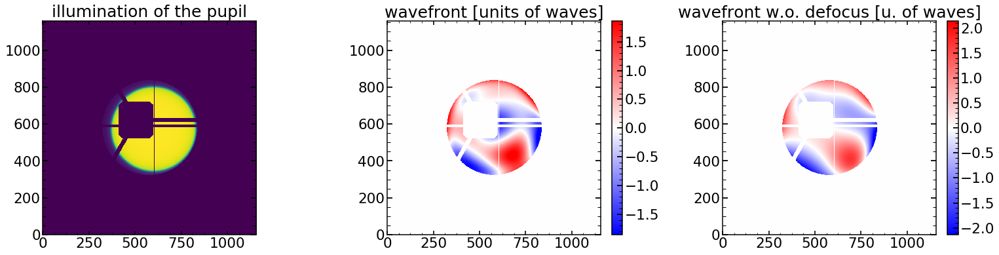

In [464]:
single_analysis.illumination_wavefront_plot()

ValueError: operands could not be broadcast together with shapes (20,20) (50,50) 

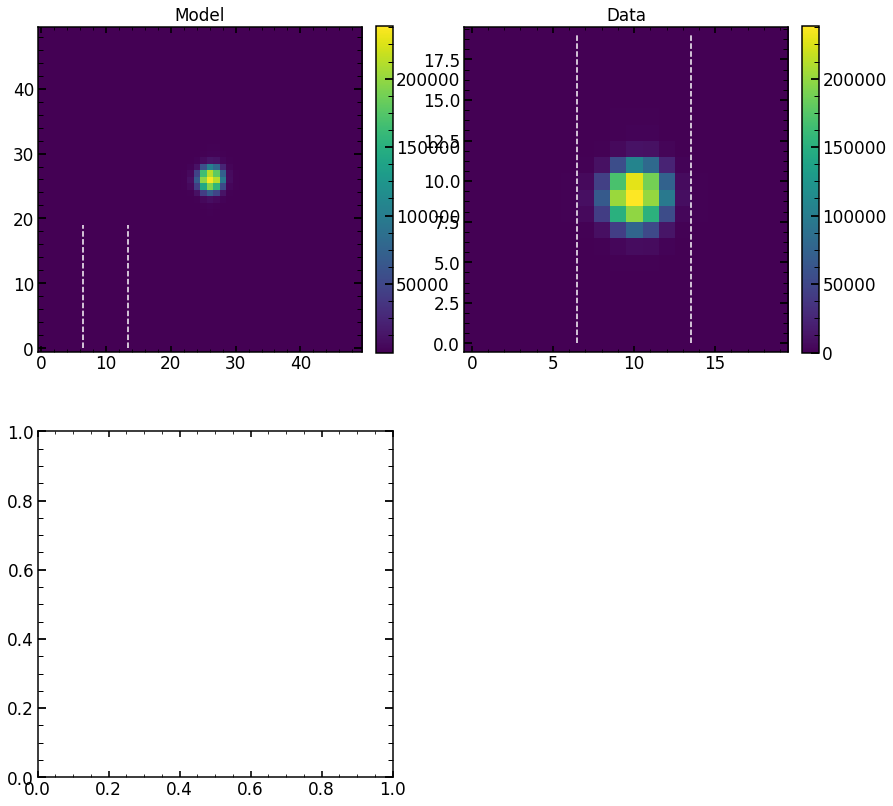

In [374]:
matplotlib.rcParams.update({'font.size': 14})
single_analysis.create_basic_comparison_plot()

In [ ]:
single_analysis.create_basic_comparison_plot_log()

19.081166679890586
chi**2 reduced is: 19.081166679890586
Abs of residual divided by total flux is: 0.03640399312736215
Abs of residual divided by largest value of a flux in the image is: 0.0691991510633945


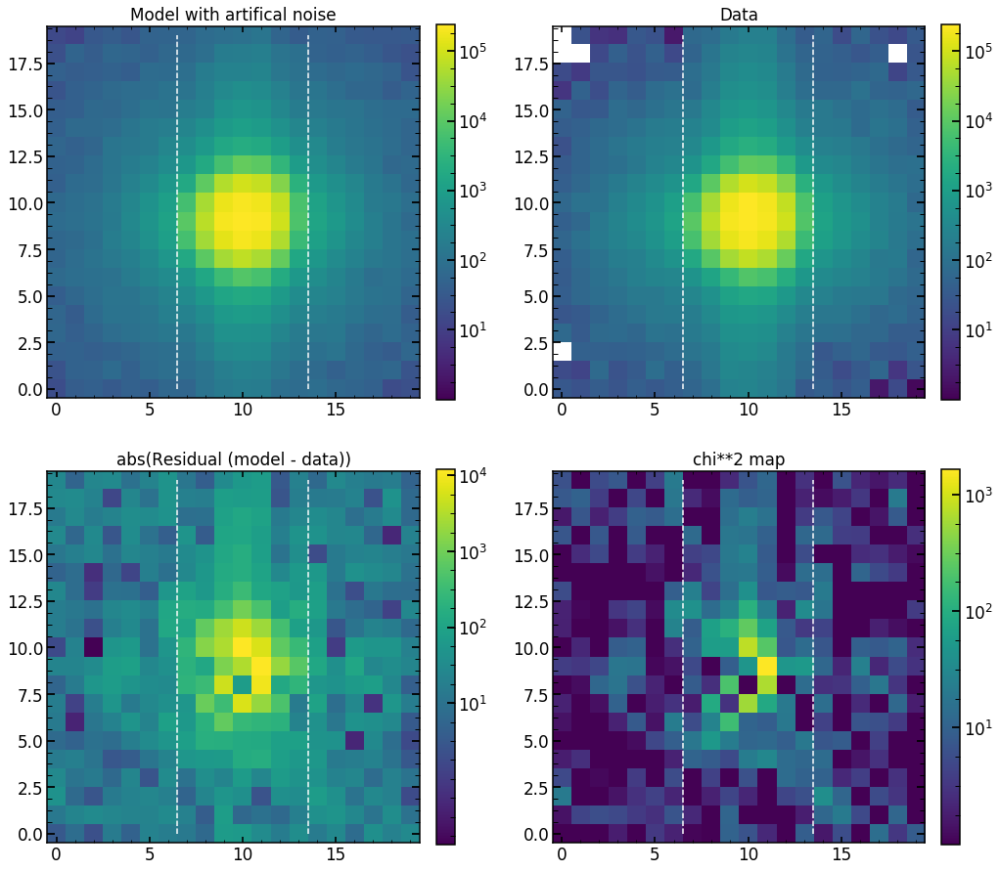

In [606]:
single_analysis.create_basic_comparison_plot_log_artifical()

# Scattering problem in defocused images.... 

## the scatter amplitude was fixed in the analysis 

In [780]:
# a lot of blue in the chi images of defocused images 

In [458]:
def split(a, n):
    k, m = divmod(len(a), n)
    return (a[i * k + min(i, m):(i + 1) * k + min(i + 1, m)] for i in range(n))

def find_min(arr):
    res=[]
    for i in range(len(arr)):
        res.append(arr[i][abs(arr[i][:,2])==np.min(abs(arr[i][:,2]))])
        
    return res

def create_stack():

    chain0_Emcee1,likechain0_Emcee1=single_analysis.create_chains_Emcee_1()
    chain0_Swarm1,likechain0_Swarm1=single_analysis.create_chains_swarm_1()

    chain0_Emcee2,likechain0_Emcee2=single_analysis.create_chains_Emcee_2()
    chain0_Swarm2,likechain0_Swarm2=single_analysis.create_chains_swarm_2()

    for i in range(chain0_Emcee1.shape[1]):
        if i==0:
            chain0_Emcee1_reshaped=chain0_Emcee1[:,0]
            likechain0_Emcee1_reshaped=likechain0_Emcee1[:,0]
        else:
            chain0_Emcee1_reshaped=np.vstack((chain0_Emcee1_reshaped,chain0_Emcee1[:,i]))
            likechain0_Emcee1_reshaped=np.vstack((likechain0_Emcee1_reshaped,likechain0_Emcee1[:,i]))

    for i in range(chain0_Emcee2.shape[1]):
        if i==0:
            chain0_Emcee2_reshaped=chain0_Emcee2[:,0]
            likechain0_Emcee2_reshaped=likechain0_Emcee2[:,0]
        else:
            chain0_Emcee2_reshaped=np.vstack((chain0_Emcee2_reshaped,chain0_Emcee2[:,i]))
            likechain0_Emcee2_reshaped=np.vstack((likechain0_Emcee2_reshaped,likechain0_Emcee2[:,i]))

    for i in range(chain0_Swarm1.shape[1]):
        if i==0:
            chain0_Swarm1_reshaped=chain0_Swarm1[:,0]
            likechain0_Swarm1_reshaped=likechain0_Swarm1[:,0]
        else:
            chain0_Swarm1_reshaped=np.vstack((chain0_Swarm1_reshaped,chain0_Swarm1[:,i]))
            likechain0_Swarm1_reshaped=np.vstack((likechain0_Swarm1_reshaped,likechain0_Swarm1[:,i]))

    for i in range(chain0_Swarm2.shape[1]):
        if i==0:
            chain0_Swarm2_reshaped=chain0_Swarm2[:,0]
            likechain0_Swarm2_reshaped=likechain0_Swarm2[:,0]
        else:
            chain0_Swarm2_reshaped=np.vstack((chain0_Swarm2_reshaped,chain0_Swarm2[:,i]))
            likechain0_Swarm2_reshaped=np.vstack((likechain0_Swarm2_reshaped,likechain0_Swarm2[:,i]))

    chain0_stack=np.vstack((chain0_Emcee1_reshaped,chain0_Emcee2_reshaped,chain0_Swarm1_reshaped,chain0_Swarm2_reshaped))
    likechain0_stack=np.concatenate((likechain0_Emcee1_reshaped.ravel(),likechain0_Emcee2_reshaped.ravel(),likechain0_Swarm1_reshaped.ravel(),likechain0_Swarm2_reshaped.ravel()))
    
    return chain0_stack,likechain0_stack

def create_Emcee_stack():

    chain0_Emcee1,likechain0_Emcee1=single_analysis.create_chains_Emcee_1()
    chain0_Emcee2,likechain0_Emcee2=single_analysis.create_chains_Emcee_2()


    for i in range(chain0_Emcee1.shape[1]):
        if i==0:
            chain0_Emcee1_reshaped=chain0_Emcee1[:,0]
            likechain0_Emcee1_reshaped=likechain0_Emcee1[:,0]
        else:
            chain0_Emcee1_reshaped=np.vstack((chain0_Emcee1_reshaped,chain0_Emcee1[:,i]))
            likechain0_Emcee1_reshaped=np.vstack((likechain0_Emcee1_reshaped,likechain0_Emcee1[:,i]))

    for i in range(chain0_Emcee2.shape[1]):
        if i==0:
            chain0_Emcee2_reshaped=chain0_Emcee2[:,0]
            likechain0_Emcee2_reshaped=likechain0_Emcee2[:,0]
        else:
            chain0_Emcee2_reshaped=np.vstack((chain0_Emcee2_reshaped,chain0_Emcee2[:,i]))
            likechain0_Emcee2_reshaped=np.vstack((likechain0_Emcee2_reshaped,likechain0_Emcee2[:,i]))


    chain0_stack=np.vstack((chain0_Emcee1_reshaped,chain0_Emcee2_reshaped))
    likechain0_stack=np.concatenate((likechain0_Emcee1_reshaped.ravel(),likechain0_Emcee2_reshaped.ravel()))
    likechain0_stack=likechain0_stack-np.max(likechain0_stack)
    
    return chain0_stack,likechain0_stack

def create_Emcee1():

    chain0_Emcee1,likechain0_Emcee1=single_analysis.create_chains_Emcee_1()

    return chain0_Emcee1,likechain0_Emcee1

def create_Emcee2_stack():

    chain0_Emcee2,likechain0_Emcee2=single_analysis.create_chains_Emcee_2()
    
    for i in range(chain0_Emcee2.shape[1]):
        if i==0:
            chain0_Emcee2_reshaped=chain0_Emcee2[:,0]
            likechain0_Emcee2_reshaped=likechain0_Emcee2[:,0]
        else:
            chain0_Emcee2_reshaped=np.vstack((chain0_Emcee2_reshaped,chain0_Emcee2[:,i]))
            likechain0_Emcee2_reshaped=np.vstack((likechain0_Emcee2_reshaped,likechain0_Emcee2[:,i]))


    chain0_stack=chain0_Emcee2_reshaped
    likechain0_stack=likechain0_Emcee2_reshaped.ravel()
    likechain0_stack=likechain0_stack-np.max(likechain0_stack)
    
    
    return chain0_stack,likechain0_stack


def create_min_min_res_split(chain0,likechain0,column1,column2):
   

    # select the columns you want and remove duplicates
    array_stack=np.unique(np.transpose(np.array([chain0[:,column1].ravel(),chain0[:,column2].ravel(),likechain0.ravel()])),axis=0)
    array_stack=np.unique(np.transpose(np.array([array_stack[:,0].ravel(),array_stack[:,1].ravel(),array_stack[:,2].ravel()])),axis=0)
    array_stack=array_stack[array_stack[:,2]!=-np.inf]
    # split size 1 determined so that each bin has 100 measurments
    split_size_1=int(np.round(array_stack.shape[0]/100)   )
    # sort by first parameter
    array_stack_sorted_by_0=array_stack[np.argsort(array_stack[:, 0])]
    # split in split_size_1 arrays with same number of objects
    array_stack_sorted_by_0_split=np.array(list(split(array_stack_sorted_by_0,split_size_1)))
    res=[]
    # when doing finer split, each bin will have around 10 objects
    split_size_2=10 
    for j in range(len(array_stack_sorted_by_0_split)):
        # within these arrays do one more split
        array_stack_sorted_by_0_split_sorted_by_1_split=np.array(list(split(array_stack_sorted_by_0_split[j][np.argsort(array_stack_sorted_by_0_split[j][:, 1])],split_size_2)))
        # find best value
        res.append(find_min(array_stack_sorted_by_0_split_sorted_by_1_split))
    

    # get everthing in one array

    res=np.array(np.split(np.array(res).ravel(),len(np.array(res).ravel())/3))
    # normalize
    res[:,2]=res[:,2]/np.max(res[:,2])


    #best results, arrange in a split_size x split_size array
    min_res_split_stack=np.array(list(split(res,split_size_1)))
    min_min_res_split_stack=np.array(find_min(min_res_split_stack)).ravel().reshape(split_size_1,3)
    
    poly_fit_res_1=np.polyfit(min_min_res_split_stack[:,0],min_min_res_split_stack[:,1],1)
    p1 = np.poly1d(poly_fit_res_1)

    poly_fit_res_2=np.polyfit(min_min_res_split_stack[:,0],min_min_res_split_stack[:,1],2)
    p2 = np.poly1d(poly_fit_res_2)

    poly_fit_res_3=np.polyfit(min_min_res_split_stack[:,0],min_min_res_split_stack[:,1],3)
    p3= np.poly1d(poly_fit_res_3)
    
    return min_min_res_split_stack,res,p1,p2,p3

In [450]:
minchain_copy=np.copy(minchain)
minchain_copy[-4]=minchain[-4]*0.8

In [451]:
model = LN_PFS_single(sci_image,var_image,mask_image=mask_image,dithering=1,save=1,zmax=22,verbosity=0,double_sources=None,double_sources_positions_ratios=double_sources_positions_ratios)   
#minchain_new=np.copy(minchain)   
#minchain_new[0]=10
#minchain_new[1]=5

model(minchain_copy)

-237658.45934878467

In [452]:
print(minchain_copy.shape)

if len(minchain_copy)==42:
    columns=columns22
    
dfz22 = pd.DataFrame(np.array([np.array([minchain_copy])[0][0:8]]),columns=columns[0:8])
print(dfz22)
dfglobal = pd.DataFrame(np.array([np.array([minchain_copy])[0][8:len(columns)]]),columns=columns[8:])

dfglobal1 = pd.DataFrame(np.array([np.array([minchain_copy])[0][8:18]]),columns=columns[8:18])
print(dfglobal1)

dfglobal2 = pd.DataFrame(np.array([np.array([minchain_copy])[0][18:len(columns)]]),columns=columns[18:])
print(dfglobal2)

(42,)
          z4        z5        z6        z7        z8        z9       z10  \
0 -23.277335 -0.191369  0.204573  0.067086 -0.092083 -0.127125 -0.345801   

        z11  
0 -0.242652  
        z12       z13       z14      z15       z16       z17       z18  \
0  0.014102  0.007729  0.019446  0.04567 -0.030714 -0.025711  0.020147   

        z19       z20       z21  
0  0.004184 -0.020259  0.026915  
        z22   hscFrac  strutFrac   dxFocal   dyFocal  slitFrac  slitFrac_dy  \
0  0.013773  0.681094    0.08794 -0.032254  0.146916  0.058706     0.027724   

   radiometricEffect  radiometricExponent    x_ilum  ...  frd_sigma  \
0           0.000006             0.000006  0.974213  ...   0.069274   

   frd_lorentz_factor  det_vert  slitHolder_frac_dx  grating_lines  \
0            0.758969  1.043749               0.153   60094.550952   

   scattering_slope  scattering_amplitude  pixel_effect   fiber_r      flux  
0          2.482364              0.003107      0.372644  1.833346  0.996884

chi**2 reduced is: 179.5375955808455
Abs of residual divided by total flux is: 0.04417606622423624
Abs of residual divided by largest value of a flux in the image is: 0.0958279280552352


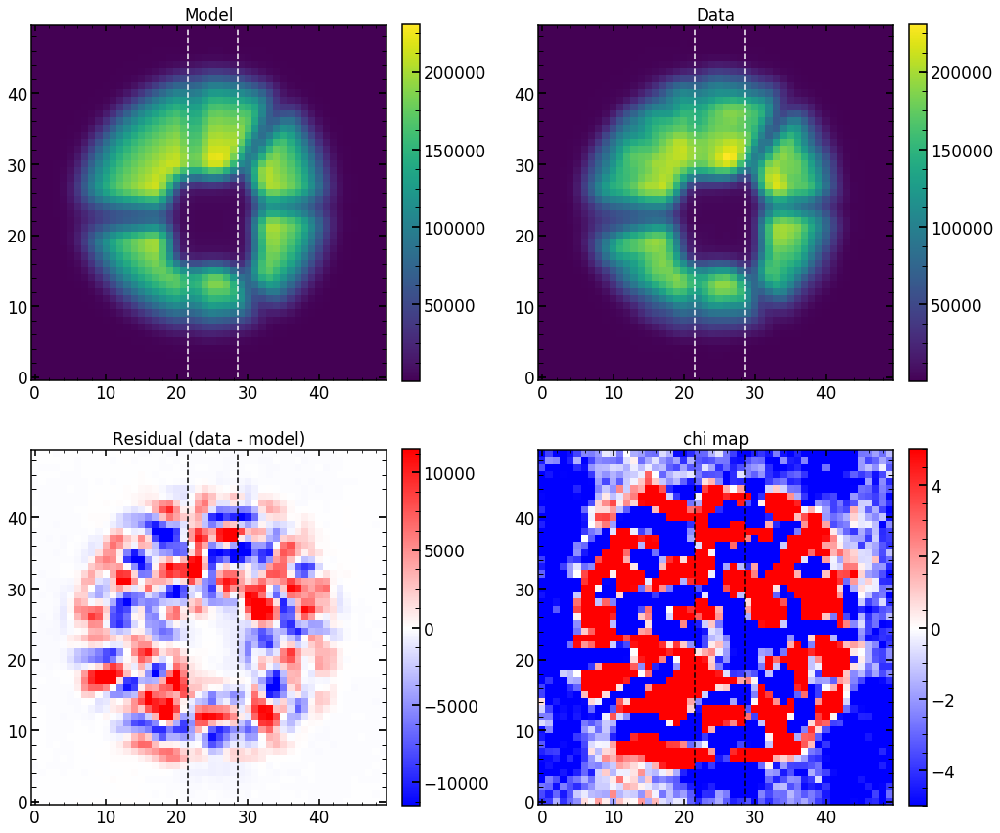

In [453]:
matplotlib.rcParams.update({'font.size': 14})
single_analysis.create_basic_comparison_plot()

In [ ]:
# is this real or consequence of my definition 

In [455]:
def create_min_min_res_split(chain0,likechain0,column1,column2):
   

    # select the columns you want and remove duplicates
    array_stack=np.unique(np.transpose(np.array([chain0[:,column1].ravel(),chain0[:,column2].ravel(),likechain0.ravel()])),axis=0)
    array_stack=np.unique(np.transpose(np.array([array_stack[:,0].ravel(),array_stack[:,1].ravel(),array_stack[:,2].ravel()])),axis=0)
    array_stack=array_stack[array_stack[:,2]!=-np.inf]
    # split size 1 determined so that each bin has 100 measurments
    split_size_1=int(np.round(array_stack.shape[0]/100)   )
    # sort by first parameter
    array_stack_sorted_by_0=array_stack[np.argsort(array_stack[:, 0])]
    # split in split_size_1 arrays with same number of objects
    array_stack_sorted_by_0_split=np.array(list(split(array_stack_sorted_by_0,split_size_1)))
    res=[]
    # when doing finer split, each bin will have around 10 objects
    split_size_2=10 
    for j in range(len(array_stack_sorted_by_0_split)):
        # within these arrays do one more split
        array_stack_sorted_by_0_split_sorted_by_1_split=np.array(list(split(array_stack_sorted_by_0_split[j][np.argsort(array_stack_sorted_by_0_split[j][:, 1])],split_size_2)))
        # find best value
        res.append(find_min(array_stack_sorted_by_0_split_sorted_by_1_split))
    

    # get everthing in one array

    res=np.array(np.split(np.array(res).ravel(),len(np.array(res).ravel())/3))
    # normalize
    res[:,2]=res[:,2]/np.max(res[:,2])


    #best results, arrange in a split_size x split_size array
    min_res_split_stack=np.array(list(split(res,split_size_1)))
    min_min_res_split_stack=np.array(find_min(min_res_split_stack)).ravel().reshape(split_size_1,3)
    
    poly_fit_res_1=np.polyfit(min_min_res_split_stack[:,0],min_min_res_split_stack[:,1],1)
    p1 = np.poly1d(poly_fit_res_1)

    poly_fit_res_2=np.polyfit(min_min_res_split_stack[:,0],min_min_res_split_stack[:,1],2)
    p2 = np.poly1d(poly_fit_res_2)

    poly_fit_res_3=np.polyfit(min_min_res_split_stack[:,0],min_min_res_split_stack[:,1],3)
    p3= np.poly1d(poly_fit_res_3)
    
    return min_min_res_split_stack,res,p1,p2,p3

/Users/nevencaplar/anaconda2/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:4: RankWarning: Polyfit may be poorly conditioned
  after removing the cwd from sys.path.
/Users/nevencaplar/anaconda2/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:4: RankWarning: Polyfit may be poorly conditioned
  after removing the cwd from sys.path.
/Users/nevencaplar/anaconda2/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:4: RankWarning: Polyfit may be poorly conditioned
  after removing the cwd from sys.path.


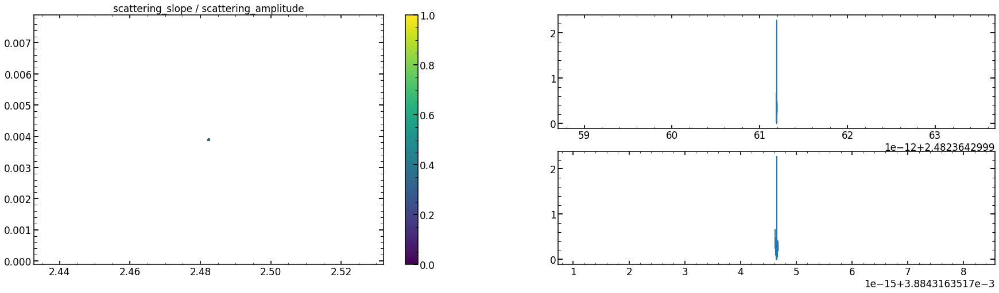

In [459]:
single_analysis=Zernike_Analysis(date,obs,single_number,eps,arc,dataset)
chain0_stack,likechain0_stack=create_stack()

min_min_res_split_stack_test,res_stack,p1,p2,p3=create_min_min_res_split(chain0_stack,likechain0_stack,37,38)

plt.figure(figsize=(30,8))

plt.subplot(1,2,1)

surf = plt.scatter(res_stack[:,0], res_stack[:,1],c=np.log10(res_stack[:,2]),s=10,vmax=1)
plt.plot(min_min_res_split_stack_test[:,0],min_min_res_split_stack_test[:,1],lw=2,alpha=0.5,color='black',ls='-')
#plt.plot(min_min_res_split_stack_test[:,0],p1(min_min_res_split_stack_test[:,0]),lw=1,alpha=1,color='black',ls=':')
plt.plot(min_min_res_split_stack_test[:,0],p2(min_min_res_split_stack_test[:,0]),lw=1,alpha=1,color='black',ls=':')
#plt.plot(min_min_res_split_stack_test[:,0],p3(min_min_res_split_stack_test[:,0]),lw=1,alpha=1,color='black',ls=':')
plt.xlim(0.98*np.min(min_min_res_split_stack_test[:,0]),np.max(min_min_res_split_stack_test[:,0]*1.02))
plt.title(str(columns[37]) +' / '+ str(columns[38]))
plt.colorbar()

plt.subplot(2,2,2)
plt.plot(res_stack[:,0][np.argsort(res_stack[:,0])],np.log10(res_stack[:,2][np.argsort(res_stack[:,0])]))

plt.subplot(2,2,4)
plt.plot(res_stack[:,1][np.argsort(res_stack[:,1])],np.log10(res_stack[:,2][np.argsort(res_stack[:,1])]))

In [460]:
stronger_array_01=np.array([1,1,1,1,1,1,1,1,
                        1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0, 
                        0.2,0.2,0.2,0.2,0.2,0.2,
                        0.0,0.0,0.0,0.0,
                        0.2,0.2,0.2,
                        0.2,0.2,0.2,0.2,
                        0,0,0,
                        0,0,1])

In [472]:
stronger_array_01[19]

0.2

In [466]:
columns[36:]

['grating_lines',
 'scattering_slope',
 'scattering_amplitude',
 'pixel_effect',
 'fiber_r',
 'flux']

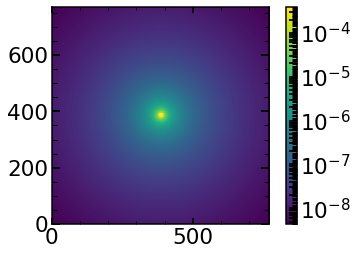

In [649]:
optPsf_cut_downsampled_defocus=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_downsampled.npy')
scattered_light_kernel_defocus=np.load(TESTING_FINAL_IMAGES_FOLDER+'scattered_light_kernel.npy')
plt.imshow(scattered_light_kernel_defocus,norm=LogNorm())
plt.colorbar()

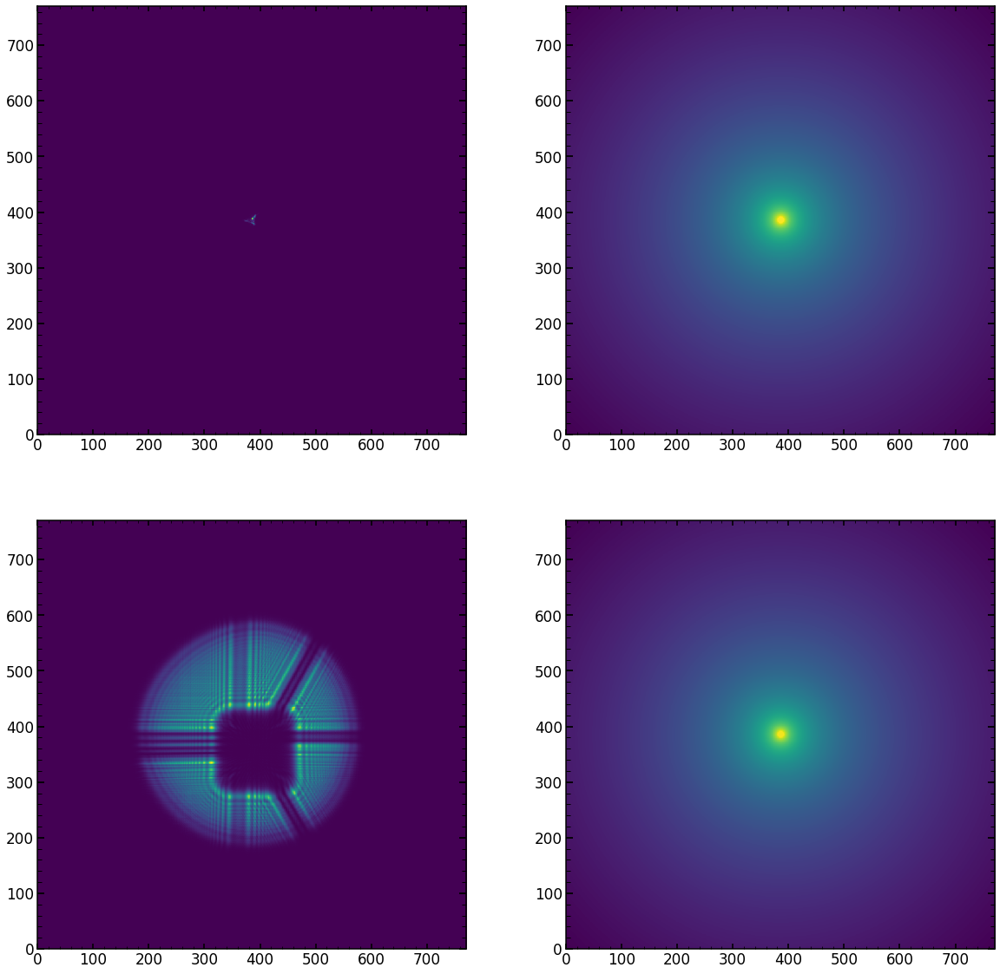

In [629]:
plt.figure(figsize=(20,20))
plt.subplot(221)
plt.imshow(optPsf_cut_downsampled_focus)

plt.subplot(222)
plt.imshow(scattered_light_kernel_focus,norm=LogNorm(),vmax=np.max(scattered_light_kernel_focus))

plt.subplot(223)
plt.imshow(optPsf_cut_downsampled_defocus)

plt.subplot(224)
plt.imshow(scattered_light_kernel_defocus,norm=LogNorm(),vmax=np.max(scattered_light_kernel_focus))


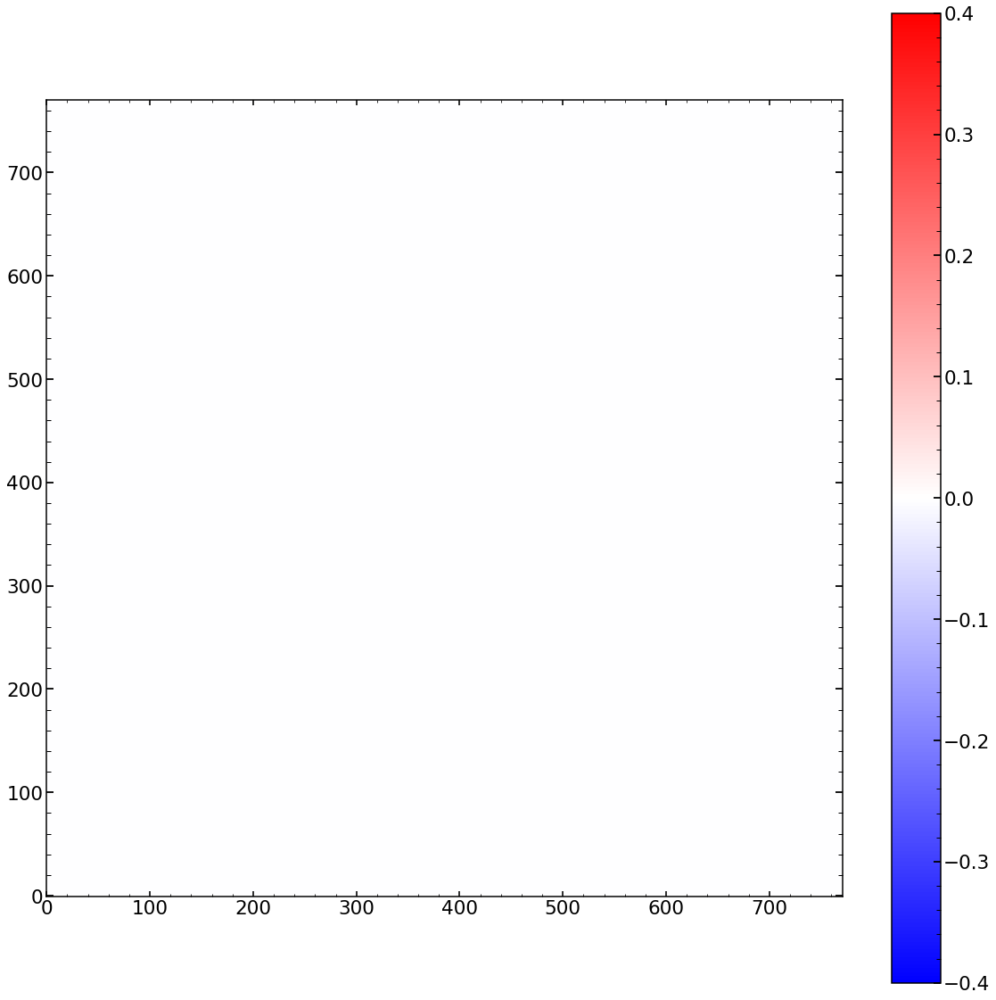

In [653]:
plt.figure(figsize=(20,20))
plt.imshow((scattered_light_kernel_defocus-scattered_light_kernel_focus)/scattered_light_kernel_focus,vmin=-0.4,vmax=0.4,cmap='bwr')
plt.colorbar()

In [650]:
(scattered_light_kernel_defocus-scattered_light_kernel_focus)/scattered_light_kernel_focus

array([[-0.00000997, -0.00000997, -0.00000997, ..., -0.00000997,
        -0.00000997, -0.00000997],
       [-0.00000997, -0.00000997, -0.00000997, ..., -0.00000997,
        -0.00000997, -0.00000997],
       [-0.00000997, -0.00000997, -0.00000997, ..., -0.00000997,
        -0.00000997, -0.00000997],
       ...,
       [-0.00000997, -0.00000997, -0.00000997, ..., -0.00000997,
        -0.00000997, -0.00000997],
       [-0.00000997, -0.00000997, -0.00000997, ..., -0.00000997,
        -0.00000997, -0.00000997],
       [-0.00000997, -0.00000997, -0.00000997, ..., -0.00000997,
        -0.00000997, -0.00000997]])

In [651]:
(scattered_light_kernel_defocus-scattered_light_kernel_focus)[0][0]

-4.3083281560321906e-14

In [641]:
scattered_light_kernel_focus[0][0]

4.319741895549492e-09

In [524]:
scattered_light_kernel_defocus_like_focus

array([[0.00000004, 0.00000004, 0.00000004, ..., 0.00000004, 0.00000004,
        0.00000004],
       [0.00000004, 0.00000004, 0.00000004, ..., 0.00000004, 0.00000004,
        0.00000004],
       [0.00000004, 0.00000004, 0.00000004, ..., 0.00000004, 0.00000004,
        0.00000004],
       ...,
       [0.00000004, 0.00000004, 0.00000004, ..., 0.00000004, 0.00000004,
        0.00000004],
       [0.00000004, 0.00000004, 0.00000004, ..., 0.00000004, 0.00000004,
        0.00000004],
       [0.00000004, 0.00000004, 0.00000004, ..., 0.00000004, 0.00000004,
        0.00000004]])

In [525]:
scattered_light_kernel_focus

array([[0.00000004, 0.00000004, 0.00000004, ..., 0.00000004, 0.00000004,
        0.00000004],
       [0.00000004, 0.00000004, 0.00000004, ..., 0.00000004, 0.00000004,
        0.00000004],
       [0.00000004, 0.00000004, 0.00000004, ..., 0.00000004, 0.00000004,
        0.00000004],
       ...,
       [0.00000004, 0.00000004, 0.00000004, ..., 0.00000004, 0.00000004,
        0.00000004],
       [0.00000004, 0.00000004, 0.00000004, ..., 0.00000004, 0.00000004,
        0.00000004],
       [0.00000004, 0.00000004, 0.00000004, ..., 0.00000004, 0.00000004,
        0.00000004]])

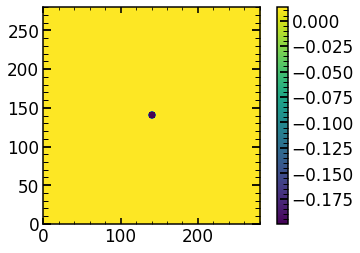

In [538]:
plt.imshow((scattered_light_kernel_defocus_like_focus-scattered_light_kernel_focus)/scattered_light_kernel_focus)
plt.colorbar()

In [654]:
scattered_light_focus=custom_fftconvolve(optPsf_cut_downsampled_focus,scattered_light_kernel_focus)
scattered_light_defocus=custom_fftconvolve(optPsf_cut_downsampled_focus,scattered_light_kernel_defocus_like_focus)

AssertionError: 

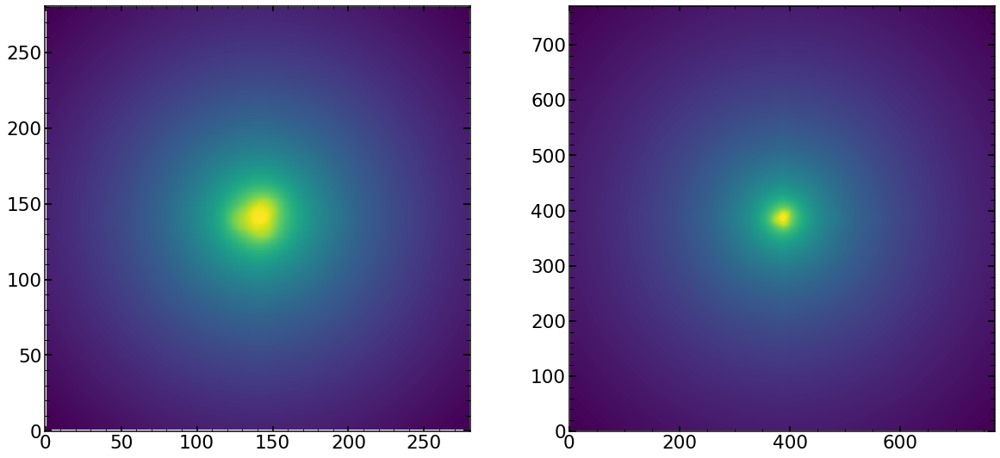

In [655]:
plt.figure(figsize=(20,20))
plt.subplot(221)
plt.imshow(scattered_light_defocus,norm=LogNorm())

plt.subplot(222)
plt.imshow(scattered_light_focus,norm=LogNorm())


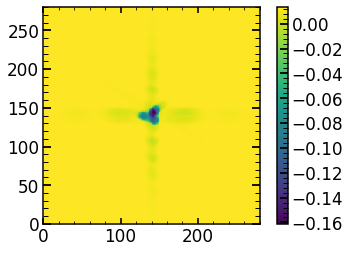

In [534]:
plt.imshow((scattered_light_defocus-scattered_light_focus)/scattered_light_focus)
plt.colorbar()

In [607]:
sci_image.shape

(20, 20)

In [615]:
sci_image_focus_like_defocus=np.zeros((50,50))
var_image_focus_like_defocus=np.zeros((50,50))
mask_image_focus_like_defocus=np.zeros((50,50))

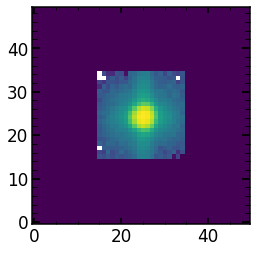

In [616]:
sci_image_focus_like_defocus[15:35,15:35]=sci_image
var_image_focus_like_defocus[15:35,15:35]=var_image
mask_image_focus_like_defocus[15:35,15:35]=mask_image

plt.imshow(sci_image_focus_like_defocus,norm=LogNorm())

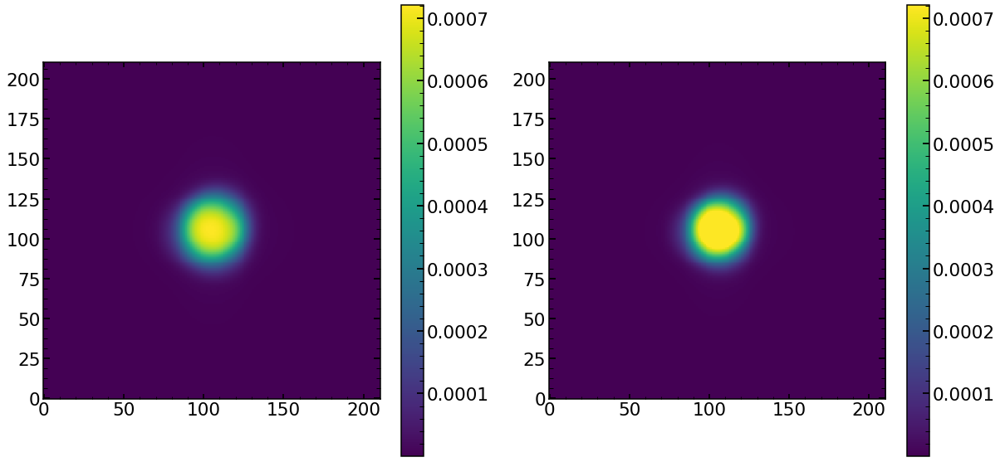

In [707]:
plt.figure(figsize=(20,10))

plt.subplot(121)
plt.imshow(res_iapetus_focus_large,vmax=np.max(res_iapetus_focus_large))
plt.colorbar()

plt.subplot(122)
plt.imshow(res_iapetus_focus_small,vmax=np.max(res_iapetus_focus_large))
plt.colorbar()

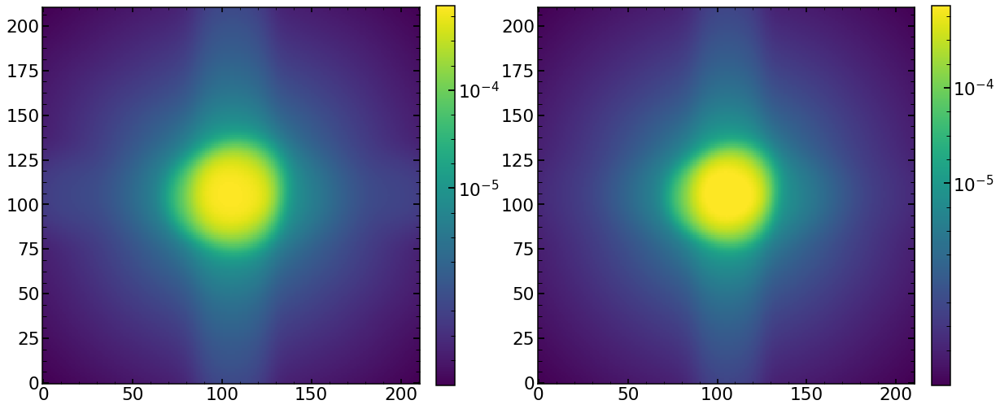

In [713]:
plt.figure(figsize=(20,10))

plt.subplot(121)
plt.imshow(res_iapetus_focus_large,vmax=np.max(res_iapetus_focus_large),norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10**(-5),10**(-4)])

plt.subplot(122)
plt.imshow(res_iapetus_focus_small,vmax=np.max(res_iapetus_focus_large),norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10**(-5),10**(-4)])

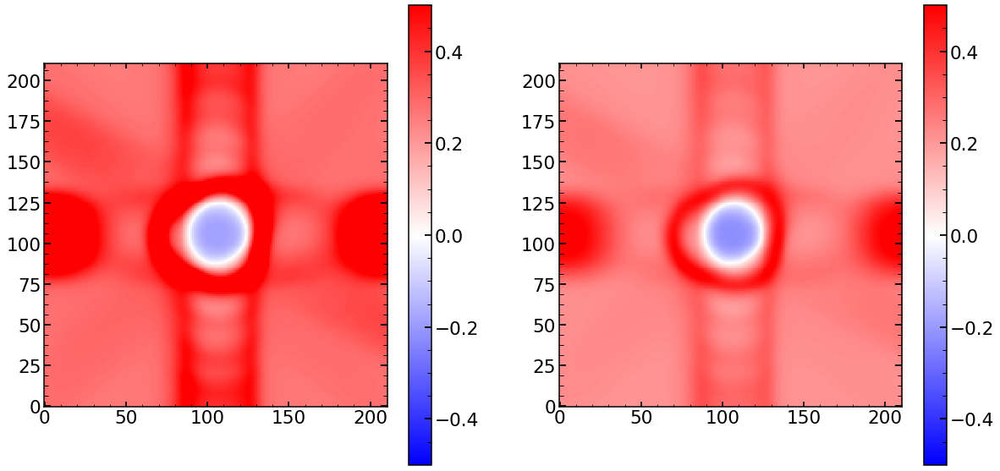

In [703]:
plt.figure(figsize=(20,10))

plt.subplot(121)
plt.imshow((res_iapetus_focus_large-res_iapetus_focus_small)/res_iapetus_focus_small,cmap='bwr',vmin=-0.5,vmax=0.5)
plt.colorbar()

plt.subplot(122)
plt.imshow((res_iapetus_focus_large-res_iapetus_focus_small)/res_iapetus_focus_large,cmap='bwr',vmin=-0.5,vmax=0.5)
plt.colorbar()

In [700]:
np.sum(res_iapetus_focus_large)

1.0

In [701]:
np.sum(res_iapetus_focus_small)

0.9999999999999999

## comparing images created from 50x50 and 20x20

### intro

In [49]:
res_iapetus_large_cut=res_iapetus_large[17:37,16:36]
res_iapetus_large_cut=res_iapetus_large_cut*np.sum(res_iapetus)/np.sum(res_iapetus_large_cut)


plt.figure(figsize=(24,20))

plt.subplot(221)
plt.imshow(res_iapetus_large_cut,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])
plt.title('cut from 50x50 image')

plt.subplot(222)
plt.imshow(res_iapetus_small,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])
plt.title('20x20 image')



plt.subplot(223)
plt.imshow(res_iapetus_large,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])
plt.title('original 50x50 image')


plt.subplot(224)
plt.imshow((res_iapetus_large_cut-res_iapetus_small)/res_iapetus_small,cmap='bwr',vmax=0.2,vmin=-0.2)
cbar=plt.colorbar(fraction=0.046, pad=0.04)
plt.title('fractional difference, cut from 50x50 - 20x20')


NameError: name 'res_iapetus_large' is not defined

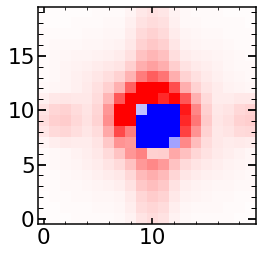

In [868]:
plt.imshow((res_iapetus_large_cut-res_iapetus_small),cmap='bwr',vmax=500,vmin=-500)

In [871]:
np.min(res_iapetus_large_cut-res_iapetus_small)

-4213.865952499851

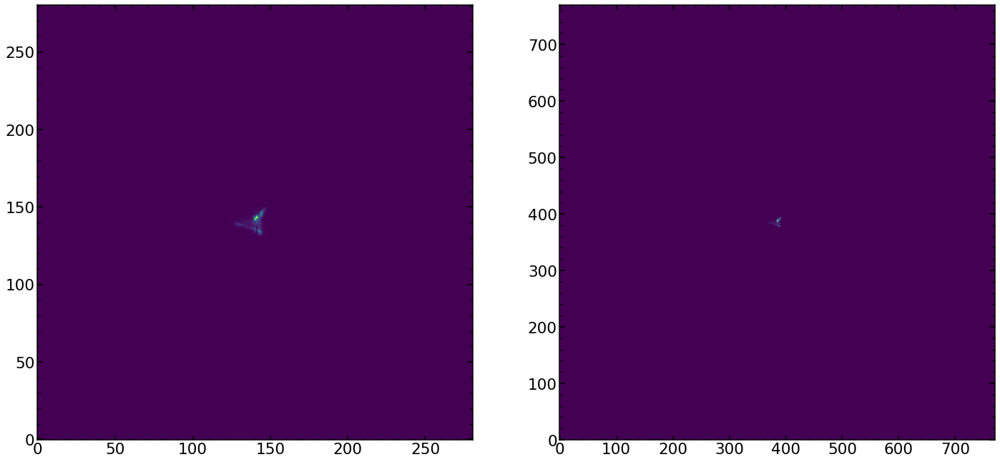

In [807]:

plt.figure(figsize=(24,20))

plt.subplot(121)
plt.imshow(optPsf_cut_downsampled_small)

plt.subplot(122)
plt.imshow(optPsf_cut_downsampled_large)

In [808]:
optPsf_cut_downsampled_small.shape

(281, 281)

In [849]:
optPsf_cut_downsampled_large_to_shape_of_optPsf_cut_downsampled_small=resize(optPsf_cut_downsampled_large[385-154:385+155,385-154:385+155],(281,281))
optPsf_cut_downsampled_large_to_shape_of_optPsf_cut_downsampled_small=optPsf_cut_downsampled_large_to_shape_of_optPsf_cut_downsampled_small*np.sum(optPsf_cut_downsampled_small)/np.sum(optPsf_cut_downsampled_large_to_shape_of_optPsf_cut_downsampled_small)

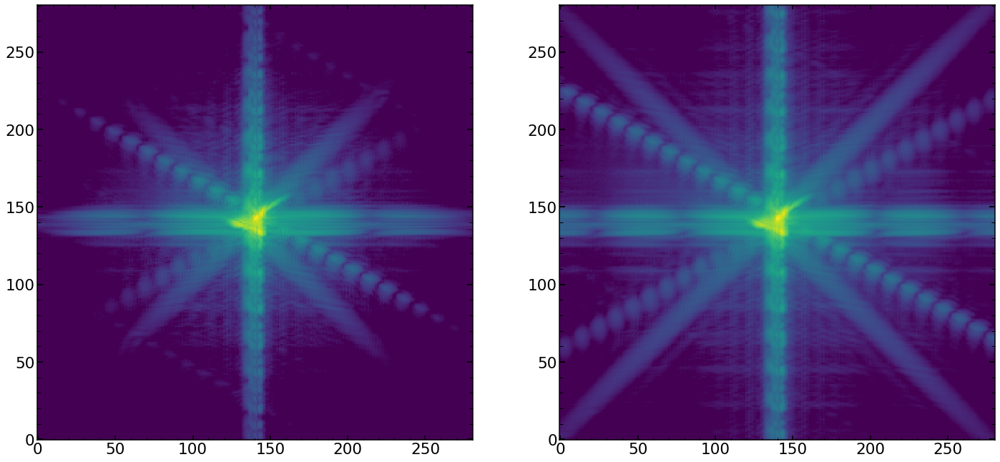

In [874]:

plt.figure(figsize=(24,20))

plt.subplot(121)
plt.imshow(optPsf_cut_downsampled_small,norm=LogNorm(),vmax=np.max(optPsf_cut_downsampled_small),vmin=np.max(optPsf_cut_downsampled_small)/(10**8))

plt.subplot(122)
plt.imshow(optPsf_cut_downsampled_large_to_shape_of_optPsf_cut_downsampled_small,norm=LogNorm(),vmax=np.max(optPsf_cut_downsampled_small),vmin=np.max(optPsf_cut_downsampled_small)/(10**8))

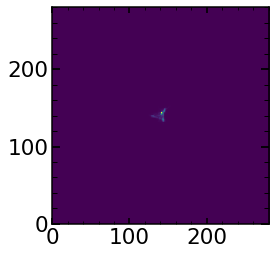

In [847]:
plt.imshow(optPsf_cut_downsampled_large_to_shape_of_optPsf_cut_downsampled_small)

### continue

In [390]:
# oversampld by 10
optPsf_cut_downsampled_small_resized=resize(optPsf_cut_downsampled_small[41:241,41:241],(20,20))

# oversampld by 11
optPsf_cut_downsampled_large_resized=resize(optPsf_cut_downsampled_large[275:496,275:496],(20,20))
optPsf_cut_downsampled_large_resized=optPsf_cut_downsampled_large_resized*np.sum(optPsf_cut_downsampled_small_resized)/np.sum(optPsf_cut_downsampled_large_resized)

Text(0.5,1,'cut from 50x50 simulated image')

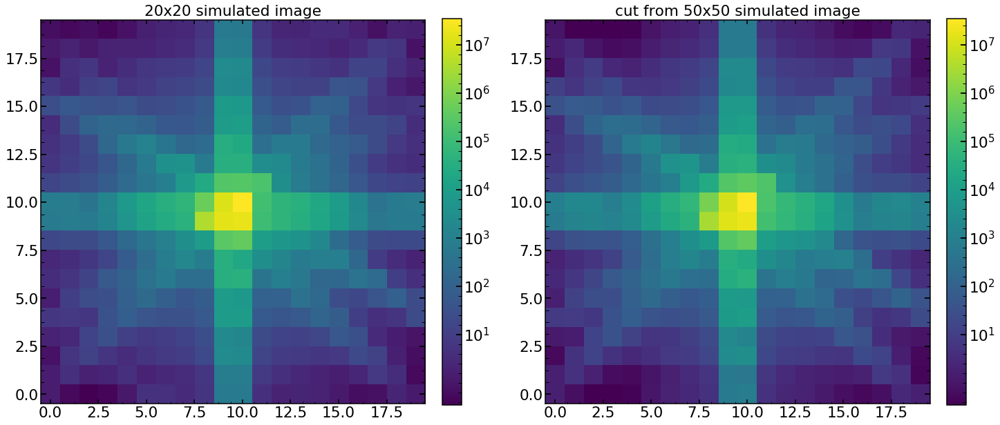

In [391]:

plt.figure(figsize=(24,20))

plt.subplot(121)
plt.imshow(optPsf_cut_downsampled_small_resized,norm=LogNorm(),vmax=np.max(optPsf_cut_downsampled_small_resized),vmin=np.max(optPsf_cut_downsampled_small_resized)/(10**8))
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5,10**6,10**7])
plt.title('20x20 simulated image')

plt.subplot(122)
plt.imshow(optPsf_cut_downsampled_large_resized,norm=LogNorm(),vmax=np.max(optPsf_cut_downsampled_small_resized),vmin=np.max(optPsf_cut_downsampled_small_resized)/(10**8))
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5,10**6,10**7])
plt.title('cut from 50x50 simulated image')

Text(0.5,1,'cut from 50x50 simulated image')

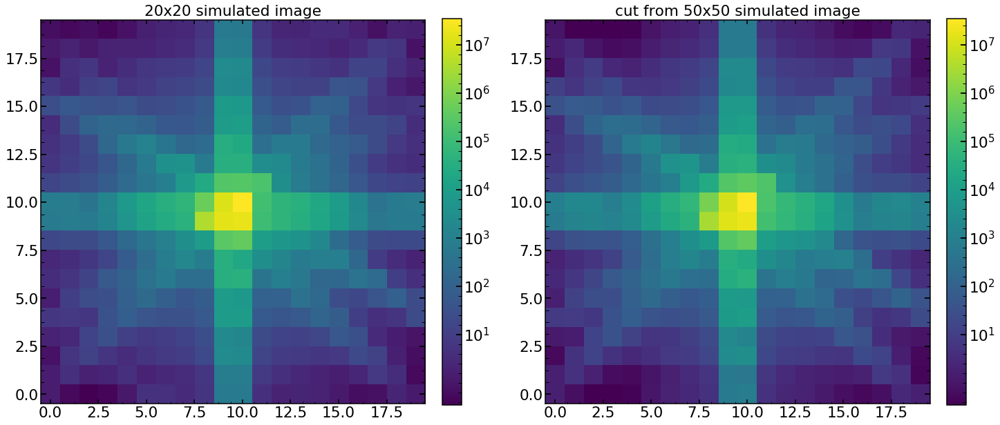

In [392]:

plt.figure(figsize=(24,20))

plt.subplot(121)
plt.imshow(optPsf_cut_downsampled_small_resized,norm=LogNorm(),vmax=np.max(optPsf_cut_downsampled_small_resized),vmin=np.max(optPsf_cut_downsampled_small_resized)/(10**8))
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5,10**6,10**7])
plt.title('20x20 simulated image')

plt.subplot(122)
plt.imshow(optPsf_cut_downsampled_large_resized,norm=LogNorm(),vmax=np.max(optPsf_cut_downsampled_small_resized),vmin=np.max(optPsf_cut_downsampled_small_resized)/(10**8))
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5,10**6,10**7])
plt.title('cut from 50x50 simulated image')

In [378]:
#optPsf_cut_downsampled_large_resized_v026=np.copy(optPsf_cut_downsampled_large_resized)

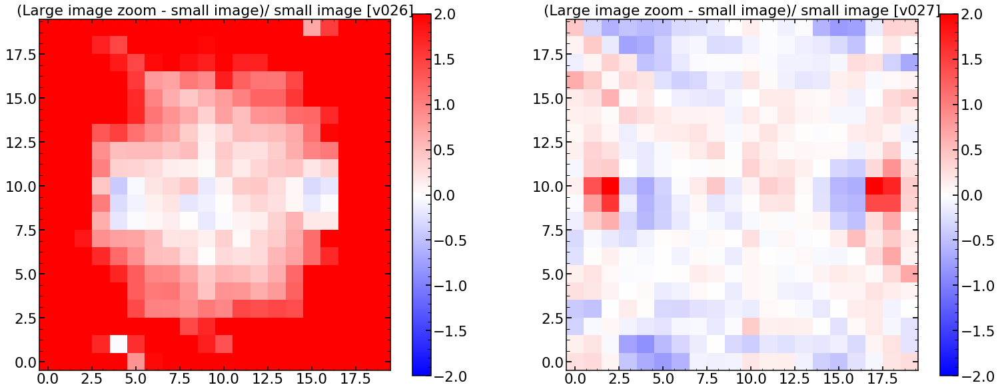

In [396]:
plt.figure(figsize=(26,10))
plt.subplot(121)

plt.imshow((optPsf_cut_downsampled_large_resized_v026-optPsf_cut_downsampled_small_resized)/optPsf_cut_downsampled_small_resized,cmap='bwr',vmax=2,vmin=-2)
plt.title('(Large image zoom - small image)/ small image [v026]')
plt.colorbar()

plt.subplot(122)

plt.imshow((optPsf_cut_downsampled_large_resized-optPsf_cut_downsampled_small_resized)/optPsf_cut_downsampled_small_resized,cmap='bwr',vmax=2,vmin=-2)
plt.title('(Large image zoom - small image)/ small image [v027]')
plt.colorbar()

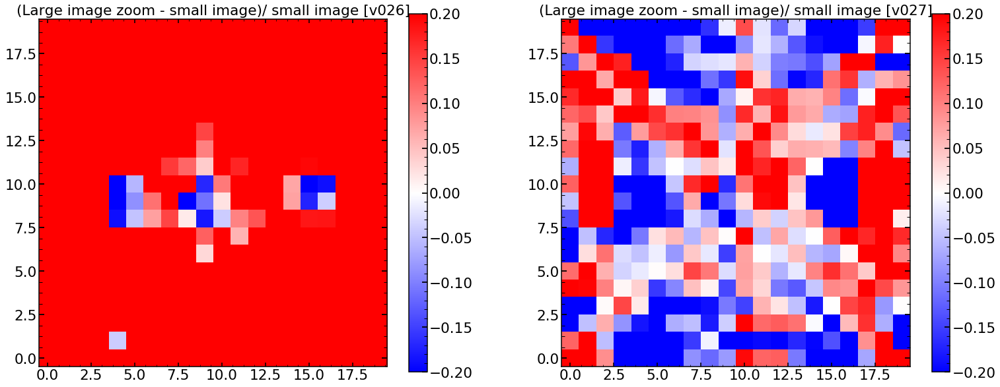

In [456]:
plt.figure(figsize=(26,10))
plt.subplot(121)

plt.imshow((optPsf_cut_downsampled_large_resized_v026-optPsf_cut_downsampled_small_resized)/optPsf_cut_downsampled_small_resized,cmap='bwr',vmax=0.2,vmin=-0.2)
plt.title('(Large image zoom - small image)/ small image [v026]')
plt.colorbar()

plt.subplot(122)

plt.imshow((optPsf_cut_downsampled_large_resized-optPsf_cut_downsampled_small_resized)/optPsf_cut_downsampled_small_resized,cmap='bwr',vmax=0.2,vmin=-0.2)
plt.title('(Large image zoom - small image)/ small image [v027]')
plt.colorbar()

In [397]:
np.median((optPsf_cut_downsampled_large_resized-optPsf_cut_downsampled_small_resized)/optPsf_cut_downsampled_small_resized)

0.001808350778123488

In [398]:
np.mean((optPsf_cut_downsampled_large_resized-optPsf_cut_downsampled_small_resized)/optPsf_cut_downsampled_small_resized)

0.017327688790435974

In [400]:
((len(ilum_radiometric))/1158)**1

2.6528497409326426

In [402]:
(len(ilum_radiometric))

3072

In [409]:
(2719/1158)**1

2.348013816925734

In [399]:
((len(ilum_radiometric))/1158)**0.875

2.3482729230833357

Text(0.5,1,'fractional difference, cut from 50x50 - 20x20')

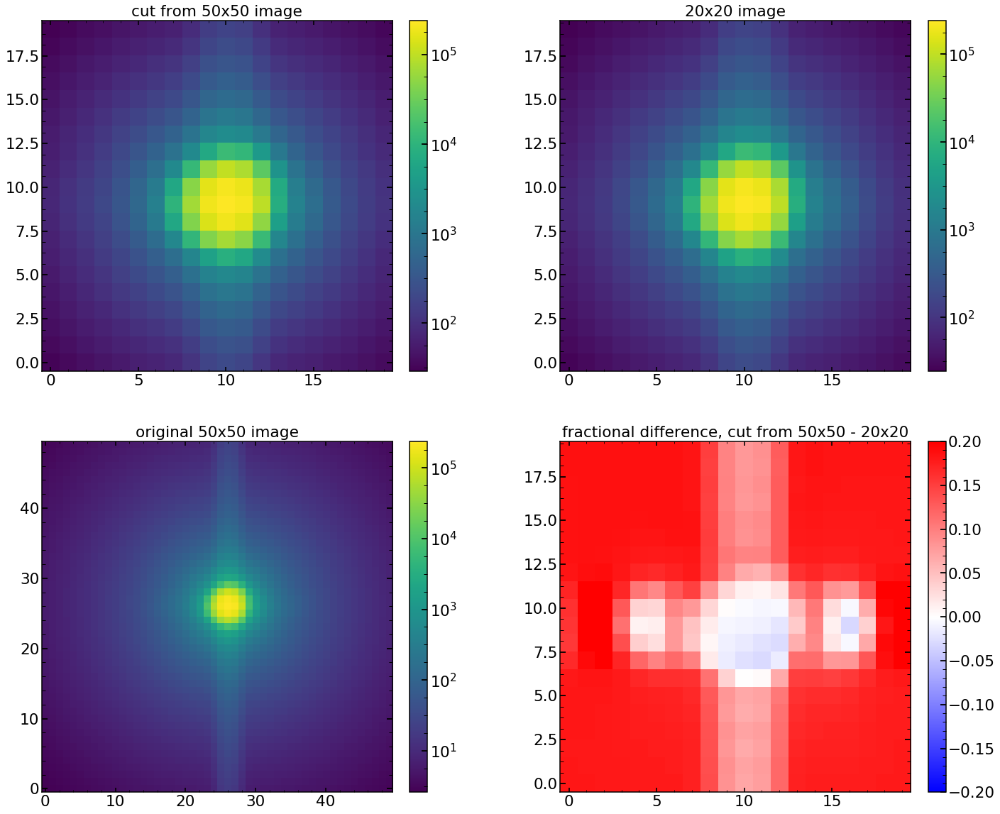

In [343]:
res_iapetus_large_cut=res_iapetus_large[17:37,16:36]
res_iapetus_large_cut=res_iapetus_large_cut*np.sum(res_iapetus)/np.sum(res_iapetus_large_cut)


plt.figure(figsize=(24,20))

plt.subplot(221)
plt.imshow(res_iapetus_large_cut,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])
plt.title('cut from 50x50 image')

plt.subplot(222)
plt.imshow(res_iapetus_small,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])
plt.title('20x20 image')



plt.subplot(223)
plt.imshow(res_iapetus_large,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])
plt.title('original 50x50 image')


plt.subplot(224)
plt.imshow((res_iapetus_large_cut-res_iapetus_small)/res_iapetus_small,cmap='bwr',vmax=0.2,vmin=-0.2)
cbar=plt.colorbar(fraction=0.046, pad=0.04)
plt.title('fractional difference, cut from 50x50 - 20x20')

In [839]:
optPsf_cut_downsampled_small_resized[0][0]

1.3600971220385552

In [323]:

apodization_sigma=(len(ilum_radiometric)/1158)**0.9*0.75
apodization_sigma

1.8046901591498017

In [908]:
print(optPsf_large.shape)
print(optPsf_small.shape)
print(3072/2)
print(1158/2)

(3072, 3072)
(1158, 1158)
1536.0
579.0


In [913]:
optPsf_small_initial=resize(optPsf_small[579-400:579+400,579-400:579+400],(20,20))
optPsf_large_initial=resize(optPsf_large[1536-424:1536+425,1536-424:1536+425],(20,20))
optPsf_large_initial=optPsf_large_initial*np.sum(optPsf_small_initial)/np.sum(optPsf_large_initial)

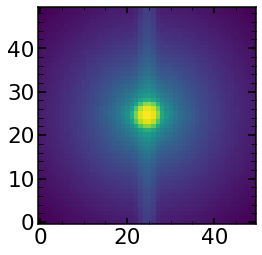

In [429]:
plt.imshow(res_iapetus,norm=LogNorm())

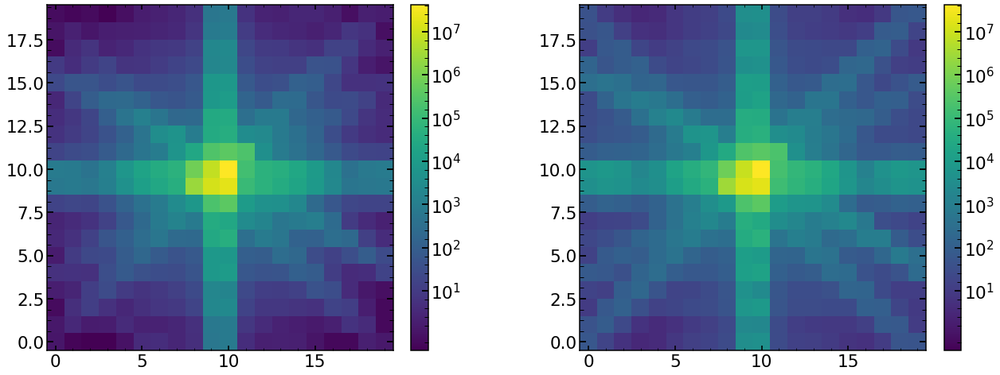

In [933]:
plt.figure(figsize=(22,8))

plt.subplot(121)
plt.imshow(optPsf_small_initial,norm=LogNorm(),vmax=np.max(optPsf_small_initial),vmin=np.max(optPsf_small_initial)/10**8)
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5,10**6,10**7])

plt.subplot(122)
plt.imshow(optPsf_large_initial,norm=LogNorm(),vmax=np.max(optPsf_small_initial),vmin=np.max(optPsf_small_initial)/10**8)
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5,10**6,10**7])


In [235]:
plt.imshow((optPsf_large_initial-optPsf_small_initial)/optPsf_small_initial,vmax=10)
plt.colorbar()

NameError: name 'optPsf_large_initial' is not defined

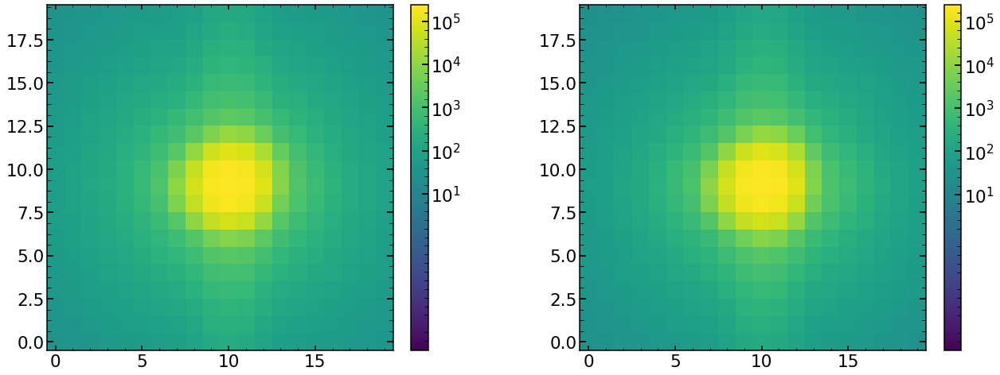

In [201]:
# why is it so offcenter
res_iapetus_large_cut=res_iapetus_large[17:37,16:36]
res_iapetus_large_cut=res_iapetus_large_cut*np.sum(res_iapetus_small)/np.sum(res_iapetus_large_cut)

plt.figure(figsize=(22,8))

plt.subplot(121)
plt.imshow(res_iapetus_large_cut,norm=LogNorm(),vmax=np.max(res_iapetus_large),vmin=np.max(res_iapetus_large)/10**8)
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5,10**6,10**7])

plt.subplot(122)
plt.imshow(res_iapetus_small,norm=LogNorm(),vmax=np.max(res_iapetus_small),vmin=np.max(res_iapetus_small)/10**8)
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5,10**6,10**7])


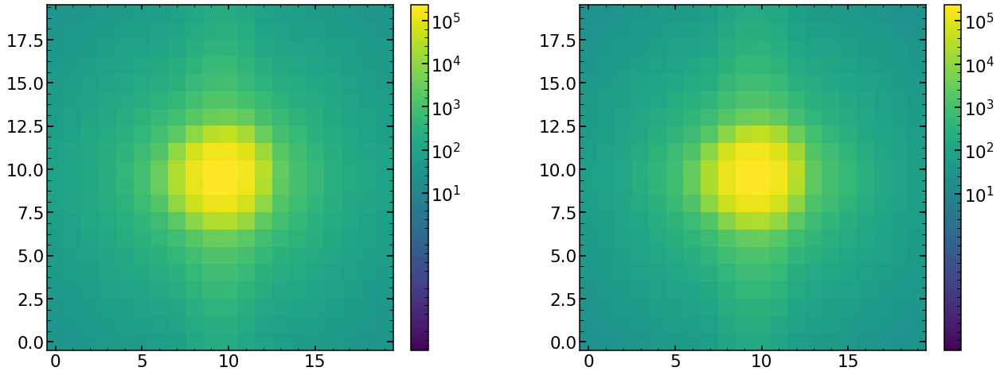

In [441]:
# why is it so offcenter
res_iapetus_large_cut=res_iapetus_large[15:35,15:35]
res_iapetus_large_cut=res_iapetus_large_cut*np.sum(res_iapetus_small)/np.sum(res_iapetus_large_cut)

plt.figure(figsize=(22,8))

plt.subplot(121)
plt.imshow(res_iapetus_large_cut,norm=LogNorm(),vmax=np.max(res_iapetus_large),vmin=np.max(res_iapetus_large)/10**8)
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5,10**6,10**7])

plt.subplot(122)
plt.imshow(res_iapetus_small,norm=LogNorm(),vmax=np.max(res_iapetus_small),vmin=np.max(res_iapetus_small)/10**8)
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5,10**6,10**7])

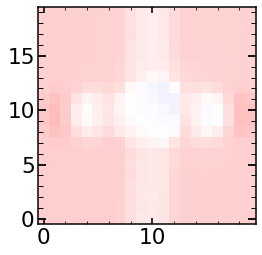

In [454]:
plt.imshow((res_iapetus_large_cut-res_iapetus_small)/res_iapetus_small,cmap='bwr',vmax=1,vmin=-1,origin='lower')

## after ``fix'' to apodization 

Text(0.5,1,'fractional difference, cut from 50x50 - 20x20')

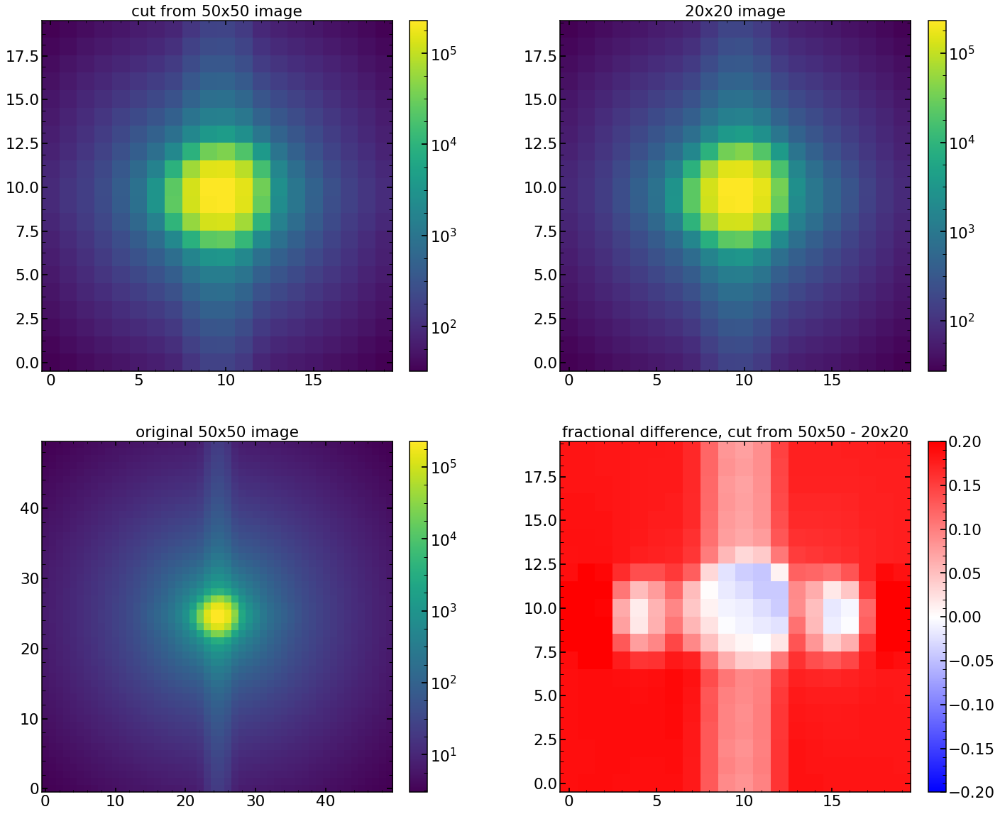

In [473]:
res_iapetus_large_cut=res_iapetus_large[15:35,15:35]
res_iapetus_large_cut=res_iapetus_large_cut*np.sum(res_iapetus)/np.sum(res_iapetus_large_cut)


plt.figure(figsize=(24,20))

plt.subplot(221)
plt.imshow(res_iapetus_large_cut,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])
plt.title('cut from 50x50 image')

plt.subplot(222)
plt.imshow(res_iapetus_small,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])
plt.title('20x20 image')



plt.subplot(223)
plt.imshow(res_iapetus_large,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])
plt.title('original 50x50 image')


plt.subplot(224)
plt.imshow((res_iapetus_large_cut-res_iapetus_small)/res_iapetus_small,cmap='bwr',vmax=0.2,vmin=-0.2)
cbar=plt.colorbar(fraction=0.046, pad=0.04)
plt.title('fractional difference, cut from 50x50 - 20x20')

Text(0,0.5,'values in var image')

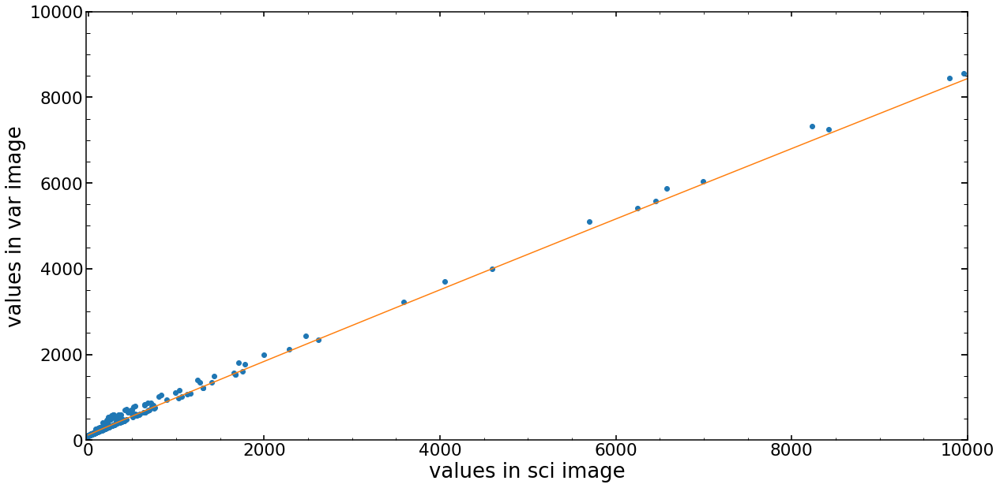

In [531]:
plt.figure(figsize=(20,10))
plt.plot(sci_image[15:35,15:35].ravel(),var_image[15:35,15:35].ravel(),ls='',marker='o')
plt.plot(np.arange(0,10000,1),120+np.arange(0,10000,1)**0.98)
plt.xlim(-25,10000)
plt.ylim(0,10000)
plt.xlabel('values in sci image')
plt.ylabel('values in var image')

In [542]:
sci_image_20=sci_image[15:35,15:35]
var_image_fake_20=120+(sci_image_20-np.min(sci_image_20))**0.98+np.min(sci_image_20)

In [547]:
np.mean((res_iapetus_large_cut-res_iapetus_small)**2/var_image_fake_20)

10.5593234582275

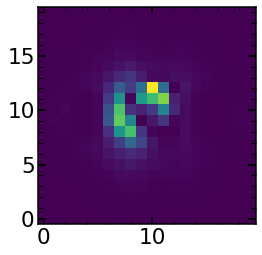

In [546]:
plt.imshow((res_iapetus_large_cut-res_iapetus_small)**2/var_image_fake_20)

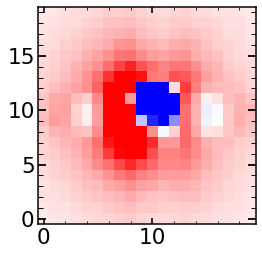

In [550]:
plt.imshow((res_iapetus_large_cut-res_iapetus_small)**1/np.sqrt(var_image_fake_20),cmap='bwr',vmax=5,vmin=-5)

# Change of slit 

In [8]:
df=pd.read_csv('/Users/nevencaplar/Documents/PFS/TigerAnalysis/matches.csv')

In [9]:
df

,expX,expY,obsX,obsY,refWavelength,fiberId
0,73.462932,2201.184080,80.010500,2200.640993,811.51320,650
1,73.262740,1608.274137,79.612590,1607.724043,760.36384,650
2,73.036113,2417.279601,79.643592,2416.732248,830.03907,650
3,70.585906,2980.034707,77.424036,2979.446832,877.91607,650
4,69.348258,3160.216255,76.253927,3159.608572,893.11447,650
...,...,...,...,...,...,...
145,4003.299175,2664.815771,4009.147891,2667.248841,851.12106,2
146,4002.469757,1716.359210,4007.914617,1718.632754,769.66579,2
147,4002.198939,2139.617898,4007.841820,2141.957605,806.17211,2
148,4002.537887,2397.918630,4008.297440,2400.289092,828.33284,2


In [15]:
X=df['obsX']
Y=df['obsY']

array_of_X_dif=df['obsX']-df['expX']
array_of_Y_dif=df['obsY']-df['expY']

In [30]:
Y[0]

2200.6409925895177

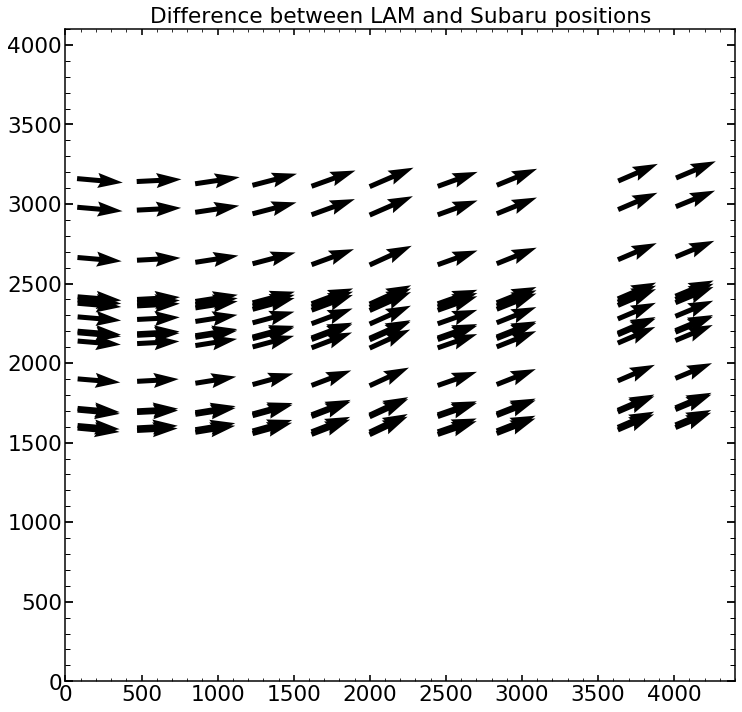

In [35]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

fig, ax = plt.subplots(figsize=(12,12))
for i in range(len(X)):
    ax.quiver(X[i], Y[i], array_of_X_dif[i]*1,array_of_Y_dif[i]*1,scale=101)
#ax.quiverkey(q, X=0.3, Y=1.1, U=10,
#             label='Quiver key, length = 10', labelpos='E')
ax.set_xlim(0,4100)
ax.set_ylim(0,4100)

#ax.text(X[0],np.min(Y)-200,"$\Delta$x=0.22 px",fontsize=12)
#ax.text(70,250,"$\Delta$y=0.11 px",fontsize=12)

#ax.text(3600,350,"$\Delta$x=-0.27 px",fontsize=12)
#ax.text(3600,250,"$\Delta$y=0.19 px",fontsize=12)

#ax.text(70,3800,"$\Delta$x=0.12 px",fontsize=12)
#ax.text(70,3700,"$\Delta$y=-0.14 px",fontsize=12)

#ax.text(3600,3800,"$\Delta$x=-0.17 px",fontsize=12)
#ax.text(3600,3700,"$\Delta$y=-0.11 px",fontsize=12)

ax.set_xlim(0,4400)
plt.title('Difference between LAM and Subaru positions')
plt.show()


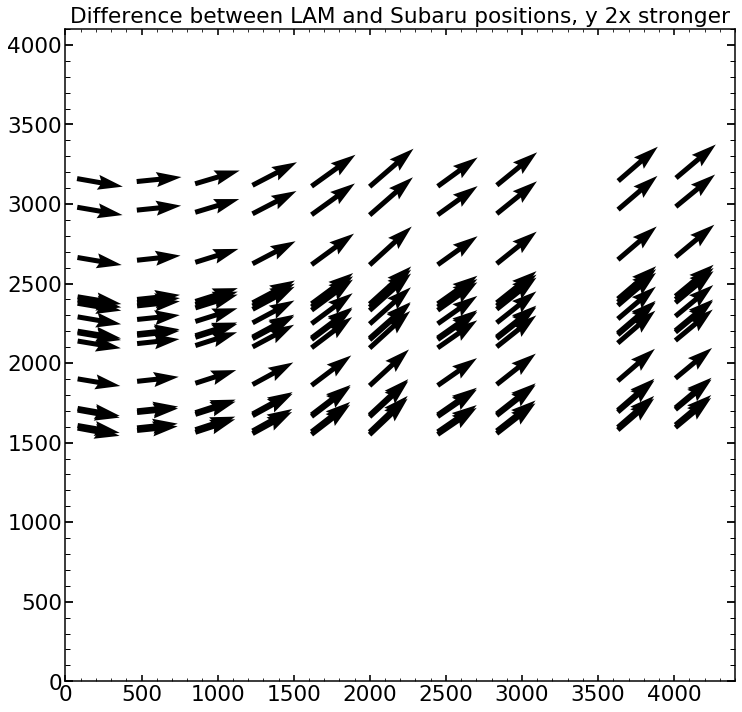

In [27]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

fig, ax = plt.subplots(figsize=(12,12))
for i in range(len(X)):
    ax.quiver(X[i], Y[i], array_of_X_dif[i]*1,array_of_Y_dif[i]*2,scale=101)
#ax.quiverkey(q, X=0.3, Y=1.1, U=10,
#             label='Quiver key, length = 10', labelpos='E')
ax.set_xlim(0,4100)
ax.set_ylim(0,4100)

#ax.text(70,350,"$\Delta$x=0.22 px",fontsize=12)
#ax.text(70,250,"$\Delta$y=0.11 px",fontsize=12)

#ax.text(3600,350,"$\Delta$x=-0.27 px",fontsize=12)
#ax.text(3600,250,"$\Delta$y=0.19 px",fontsize=12)

#ax.text(70,3800,"$\Delta$x=0.12 px",fontsize=12)
#ax.text(70,3700,"$\Delta$y=-0.14 px",fontsize=12)

#ax.text(3600,3800,"$\Delta$x=-0.17 px",fontsize=12)
#ax.text(3600,3700,"$\Delta$y=-0.11 px",fontsize=12)

ax.set_xlim(0,4400)
plt.title('Difference between LAM and Subaru positions, y 2x stronger')
plt.show()

# Speeding up - wavefront?

In [1126]:
u=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'u.npy')
v=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'v.npy')

In [1141]:
diam_sic=0.1395327
aberrations= [0.0, 0, 0.0, 0.0, 30.115791259671422, -0.8409862322199109, -1.8806403124529092, 0.0014884654196952382, -0.12744890267689543, -0.15781490133822806, -0.3993996577883861, -0.13672265467739167, 0.05267211780885176, 0.062484416071075674, 0.009838572639614792, 0.048844980057726466, 0.0038656300434903278, 0.047039901895592644, 0.014423190034522627, 0.0066852689295373875, -0.058461407976638145, 0.018591717131002078, 0.05750523706207685]
wavelength= 794

optics_screen=galsim.phase_screens.OpticalScreen(diam=diam_sic,aberrations=aberrations,lam_0=wavelength)
screens = galsim.PhaseScreenList(optics_screen)   
wf_all = screens.wavefront(u, v, None, 0)

diam_sic=0.1395327
aberrations= [0.0, 0, 0.0, 0.0, 30.115791259671422, 0, 0, 0.0, 0,0,0,0,0,0,0, 0,0, 0,0, 0, 0,0, 0]
wavelength= 794

optics_screen=galsim.phase_screens.OpticalScreen(diam=diam_sic,aberrations=aberrations,lam_0=wavelength)
screens = galsim.PhaseScreenList(optics_screen)   
wf_4 = screens.wavefront(u, v, None, 0)

diam_sic=0.1395327
aberrations= [0.0, 0, 0.0, 0.0, 0, -0.8409862322199109, 0, 0.0, 0,0,0,0,0,0,0, 0,0, 0,0, 0, 0,0, 0]
wavelength= 794

optics_screen=galsim.phase_screens.OpticalScreen(diam=diam_sic,aberrations=aberrations,lam_0=wavelength)
screens = galsim.PhaseScreenList(optics_screen)   
wf_5 = screens.wavefront(u, v, None, 0)

diam_sic=0.1395327
aberrations= [0.0, 0, 0.0, 0.0, 30.115791259671422, -0.8409862322199109, 0, 0.0, 0,0,0,0,0,0,0, 0,0, 0,0, 0, 0,0, 0]
wavelength= 794

optics_screen=galsim.phase_screens.OpticalScreen(diam=diam_sic,aberrations=aberrations,lam_0=wavelength)
screens = galsim.PhaseScreenList(optics_screen)   
wf_45 = screens.wavefront(u, v, None, 0)


diam_sic=0.1395327
aberrations= [0.0, 0, 0.0, 0.0, 30.115791259671422/2, 0, 0, 0.0, 0,0,0,0,0,0,0, 0,0, 0,0, 0, 0,0, 0]
wavelength= 794

optics_screen=galsim.phase_screens.OpticalScreen(diam=diam_sic,aberrations=aberrations,lam_0=wavelength)
screens = galsim.PhaseScreenList(optics_screen)   
wf_4half = screens.wavefront(u, v, None, 0)

In [1136]:
wf_5

array([-121.55255469, -117.28755277, -113.02255085, ..., -113.02255085,
       -117.28755277, -121.55255469])

In [1137]:
wf_4

array([41692.75228289, 41684.88266256, 41677.29410009, ...,
       41677.29410009, 41684.88266256, 41692.75228289])

In [1142]:
np.sum(wf_45-wf_4half*2-wf_5)

4.5005649207396914e-08

In [1148]:
input_img_single_realization_before_downsampling_primary_floor_floor=np.load(TESTING_FINAL_IMAGES_FOLDER+'input_img_single_realization_before_downsampling_primary_floor_floor.npy')
input_img_single_realization_before_downsampling_primary_floor_ceiling=np.load(TESTING_FINAL_IMAGES_FOLDER+'input_img_single_realization_before_downsampling_primary_floor_ceiling.npy')
input_img_single_realization_before_downsampling_primary_ceiling_floor=np.load(TESTING_FINAL_IMAGES_FOLDER+'input_img_single_realization_before_downsampling_primary_ceiling_floor.npy')
input_img_single_realization_before_downsampling_primary_ceiling_ceiling=np.load(TESTING_FINAL_IMAGES_FOLDER+'input_img_single_realization_before_downsampling_primary_ceiling_ceiling.npy')

In [1193]:
    from numba import jit, float64
    @jit(cache=True,nopython=True)
    def bilinear_interpolation(y,x,img_floor_floor,img_floor_ceiling,img_ceiling_floor,img_ceiling_ceiling):     
        # have to check if floor and ceiling definition are ok 
        # https://en.wikipedia.org/wiki/Bilinear_interpolation
        # x2=1
        # x1=0
        # y2=1
        # y1=0
        
        # img_floor_floor in top right corner
        # img_ceiling_ceiling in bottom left corner
        # img_floor_ceiling in top left corner
        # img_ceiling_floor in the bottom right corner 
        
        
        return img_floor_floor*(1-x)*(1-y)+img_floor_ceiling*(x)*(1-y)+img_ceiling_floor*(1-x)*(y)+img_ceiling_ceiling*(x)*(y)

In [1194]:
%timeit test=bilinear_interpolation(0.23,0.5,input_img_single_realization_before_downsampling_primary_floor_floor,\
                      input_img_single_realization_before_downsampling_primary_floor_ceiling,input_img_single_realization_before_downsampling_primary_ceiling_floor,\
                      input_img_single_realization_before_downsampling_primary_ceiling_ceiling)

192 µs ± 3.12 µs per loop (mean ± std. dev. of 7 runs, 10000 loops each)


In [1195]:

def bilinear_interpolation(y,x,img_floor_floor,img_floor_ceiling,img_ceiling_floor,img_ceiling_ceiling):     
    # have to check if floor and ceiling definition are ok 
    # https://en.wikipedia.org/wiki/Bilinear_interpolation
    # x2=1
    # x1=0
    # y2=1
    # y1=0

    # img_floor_floor in top right corner
    # img_ceiling_ceiling in bottom left corner
    # img_floor_ceiling in top left corner
    # img_ceiling_floor in the bottom right corner 


    return img_floor_floor*(1-x)*(1-y)+img_floor_ceiling*(x)*(1-y)+img_ceiling_floor*(1-x)*(y)+img_ceiling_ceiling*(x)*(y)

In [1196]:
%timeit test=bilinear_interpolation(0.23,0.5,input_img_single_realization_before_downsampling_primary_floor_floor,\
                      input_img_single_realization_before_downsampling_primary_floor_ceiling,input_img_single_realization_before_downsampling_primary_ceiling_floor,\
                      input_img_single_realization_before_downsampling_primary_ceiling_ceiling)

211 µs ± 6.42 µs per loop (mean ± std. dev. of 7 runs, 1000 loops each)


In [34]:
        optPsf_cut_fiber_convolved_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
        res_iapetus=optPsf_cut_fiber_convolved_downsampled

In [41]:
mask_image_inverse=np.logical_not(mask_image).astype(int)
size=sci_image.shape[0]
dithering=1

chi**2 reduced is: 69.78263273150866
Abs of residual divided by total flux is: 0.059370807816810665
Abs of residual divided by largest value of a flux in the image is: 0.11311284816188512


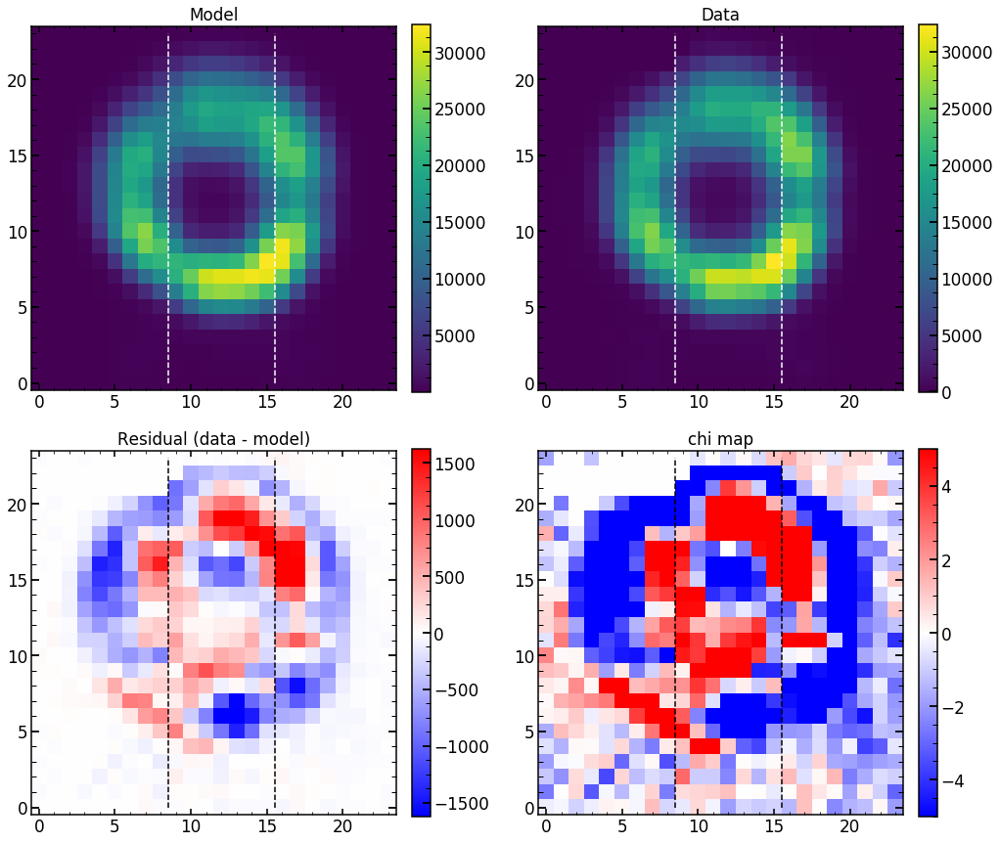

In [43]:
        
        plt.figure(figsize=(14,14))
        plt.subplot(221)
        plt.imshow(res_iapetus,origin='lower',vmax=np.max(np.abs(sci_image)))
        plt.plot(np.ones(len(sci_image))*(size/2-3.5),np.array(range(len(sci_image))),'--',color='white')
        plt.plot(np.ones(len(sci_image))*((size/2-dithering*3.5)+7*dithering),np.array(range(len(sci_image))),'--',color='white')
        plt.colorbar(fraction=0.046, pad=0.04)
        plt.title('Model')
        plt.grid(False)
        plt.subplot(222)
        plt.imshow(sci_image*mask_image_inverse,origin='lower',vmax=np.max(np.abs(sci_image)))
        plt.plot(np.ones(len(sci_image))*(size/2-3.5),np.array(range(len(sci_image))),'--',color='white')
        plt.plot(np.ones(len(sci_image))*((size/2-dithering*3.5)+7*dithering),np.array(range(len(sci_image))),'--',color='white')
        plt.colorbar(fraction=0.046, pad=0.04)
        plt.title('Data')
        plt.grid(False)
        plt.subplot(223)
        plt.imshow((sci_image-res_iapetus)*mask_image_inverse,origin='lower',cmap='bwr',vmin=-np.max(np.abs(sci_image))/20,vmax=np.max(np.abs(sci_image))/20)
        plt.plot(np.ones(len(sci_image))*(size/2-3.5),np.array(range(len(sci_image))),'--',color='black')
        plt.plot(np.ones(len(sci_image))*((size/2-dithering*3.5)+7*dithering),np.array(range(len(sci_image))),'--',color='black')
        plt.colorbar(fraction=0.046, pad=0.04)
        plt.title('Residual (data - model)')
        plt.grid(False)
        plt.subplot(224)
        #plt.imshow((res_iapetus-sci_image)/np.sqrt(var_image),origin='lower',cmap='bwr',vmax=np.max(np.abs((res_iapetus-sci_image)/np.sqrt(var_image))),vmin=-np.max(np.abs((res_iapetus-sci_image)/np.sqrt(var_image))))
        plt.imshow(((sci_image-res_iapetus)/np.sqrt(var_image))*mask_image_inverse,origin='lower',cmap='bwr',vmax=5,vmin=-5)

        plt.plot(np.ones(len(sci_image))*(size/2-3.5),np.array(range(len(sci_image))),'--',color='black')
        plt.plot(np.ones(len(sci_image))*((size/2-dithering*3.5)+7*dithering),np.array(range(len(sci_image))),'--',color='black')
        plt.colorbar(fraction=0.046, pad=0.04)
        plt.title('chi map')
        plt.tight_layout(pad=0.0, w_pad=1.8, h_pad=-10.0)
        print('chi**2 reduced is: '+str(np.sum((res_iapetus-sci_image)**2/((var_image.shape[0]*var_image.shape[1])*var_image))))
        print('Abs of residual divided by total flux is: '+str(np.sum(np.abs((res_iapetus-sci_image)))/np.sum((res_iapetus))))
        print('Abs of residual divided by largest value of a flux in the image is: '+str(np.max(np.abs((res_iapetus-sci_image)/np.max(res_iapetus)))))
  

In [44]:
21436-21346

90

# Zemax - wavefront

## init 

In [ ]:
# copying from Compare result of the fits to the real data with the outputs from Zemax (PIPE2D-421)

In [117]:
from astropy.io import fits
detectorMapOriginal=fits.open('/Users/nevencaplar/Documents/PFS/DetectorMap/detectorMap-sim-1-r.fits')

hdu = detectorMapOriginal["FIBERID"]
fiberIds = hdu.data
fiberIds = fiberIds.astype(np.int32) 
fiberIds.shape

list_of_illuminated_slit_fibers_in_January_24_data=[32,63,111,192,223,255,289,308,342,401,418,464,518,525,587,620]

list_of_illuminated_science_fibers_in_January_24_data=[]
for i in list_of_illuminated_slit_fibers_in_January_24_data:
    list_of_illuminated_science_fibers_in_January_24_data.append(np.where(fiberIds==i)[0][0])
    
list_of_illuminated_science_fibers_in_January_24_data


detectorMapOriginal_for_illuminated_fiber_Jan_24_2019_as_list_x=[]
detectorMapOriginal_for_illuminated_fiber_Jan_24_2019_as_list_y=[]
for j in list_of_illuminated_science_fibers_in_January_24_data:
    print(j)
    detectorMapOriginal_single_fiber_x=detectorMapOriginal[3].data[detectorMapOriginal[3].data['index']==j]    
    detectorMapOriginal_single_fiber_y=detectorMapOriginal[4].data[detectorMapOriginal[4].data['index']==j]
    
    detectorMapOriginal_single_fiber_as_list_x=[]
    detectorMapOriginal_single_fiber_as_list_y=[]
    # because I do not know how to work with numpy.record
    for i in range(len(detectorMapOriginal_single_fiber_y)):
        detectorMapOriginal_single_fiber_as_list_x.append(list(detectorMapOriginal_single_fiber_x[i]))
        detectorMapOriginal_single_fiber_as_list_y.append(list(detectorMapOriginal_single_fiber_y[i]))
        
    detectorMapOriginal_single_fiber_as_array_x=np.array(detectorMapOriginal_single_fiber_as_list_x)
    detectorMapOriginal_single_fiber_as_array_y=np.array(detectorMapOriginal_single_fiber_as_list_y)
    detectorMapOriginal_for_illuminated_fiber_Jan_24_2019_as_list_x.append(detectorMapOriginal_single_fiber_as_array_x)
    detectorMapOriginal_for_illuminated_fiber_Jan_24_2019_as_list_y.append(detectorMapOriginal_single_fiber_as_array_y)

30
59
104
180
211
241
273
292
305
362
379
423
472
479
538
569


In [118]:
def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return array[idx]


list_of_dy_values_in_fibers=[]
for fibers in [303,271,239,209,176,146,116,84,52,22,5,595,328,359,390,423,453,484,514,547,578]:
    list_of_values=[]
    for wavelengths in [630,664,698,732,766,800,834,868,902,936,970]:
        nearest_value=find_nearest(np.array(detectorMapOriginal[4].data[detectorMapOriginal[3].data['index']==fibers])['value'],wavelengths)
        index_of_value=list(np.array(detectorMapOriginal[4].data[detectorMapOriginal[3].data['index']==fibers])['value']).index(nearest_value)
        list_of_values.append(index_of_value)
    list_of_dy_values_in_fibers.append(list_of_values)

In [119]:
list_of_dy_values_in_fibers=np.transpose(np.array(list_of_dy_values_in_fibers)).ravel()
list_of_dy_values_in_fibers

array([  82,   83,   84,   86,   88,   91,   95,  100,  105,  110,  113,
        113,   83,   84,   86,   88,   91,   95,  100,  105,  110,  478,
        478,  480,  482,  484,  488,  492,  497,  502,  508,  511,  512,
        478,  480,  482,  484,  488,  492,  497,  502,  508,  873,  874,
        875,  877,  880,  884,  888,  894,  900,  906,  910,  910,  874,
        875,  877,  880,  884,  889,  894,  900,  907, 1269, 1269, 1271,
       1273, 1276, 1280, 1285, 1291, 1298, 1305, 1309, 1309, 1269, 1271,
       1273, 1276, 1280, 1285, 1291, 1298, 1305, 1664, 1665, 1667, 1669,
       1672, 1677, 1682, 1688, 1695, 1703, 1707, 1708, 1665, 1666, 1669,
       1672, 1677, 1682, 1688, 1695, 1703, 2060, 2060, 2062, 2065, 2068,
       2073, 2078, 2085, 2093, 2101, 2106, 2106, 2060, 2062, 2065, 2068,
       2073, 2079, 2085, 2093, 2101, 2455, 2456, 2458, 2460, 2464, 2469,
       2475, 2483, 2490, 2499, 2505, 2505, 2456, 2458, 2460, 2464, 2469,
       2475, 2482, 2490, 2500, 2851, 2851, 2853, 28

In [120]:
def rotate_WaveField(minchain_wave_11_field_11):
    WaveField_upper_left_only_z4_to_z22=np.copy(minchain_wave_11_field_11[3:22])
    WaveField_upper_left_only_z4_to_z22_modified=np.zeros((19))

    # z4_new = z4_old
    WaveField_upper_left_only_z4_to_z22_modified[0]=WaveField_upper_left_only_z4_to_z22[0]

    # z5_new = -z5_old
    WaveField_upper_left_only_z4_to_z22_modified[0+1]=-WaveField_upper_left_only_z4_to_z22[0+1]
    # z6_new = -z6_old
    WaveField_upper_left_only_z4_to_z22_modified[1+1]=-WaveField_upper_left_only_z4_to_z22[1+1]
    
    # z7_new = z8_old
    WaveField_upper_left_only_z4_to_z22_modified[2+1]=WaveField_upper_left_only_z4_to_z22[3+1]
    # z8_new = -z7_old
    WaveField_upper_left_only_z4_to_z22_modified[3+1]=-WaveField_upper_left_only_z4_to_z22[2+1]
    
    # z9_new = -z10_old
    WaveField_upper_left_only_z4_to_z22_modified[4+1]=-WaveField_upper_left_only_z4_to_z22[5+1]
    # z10_new = z9_old
    WaveField_upper_left_only_z4_to_z22_modified[5+1]=WaveField_upper_left_only_z4_to_z22[4+1]
    
    # z11_new = z11_old
    WaveField_upper_left_only_z4_to_z22_modified[6+1]=WaveField_upper_left_only_z4_to_z22[6+1]
    
    # z12_new = -z12_old
    WaveField_upper_left_only_z4_to_z22_modified[7+1]=-WaveField_upper_left_only_z4_to_z22[7+1]
    # z13_new = -z13_old
    WaveField_upper_left_only_z4_to_z22_modified[8+1]=-WaveField_upper_left_only_z4_to_z22[8+1]
    
    # z14_new = z14_old
    WaveField_upper_left_only_z4_to_z22_modified[9+1]=WaveField_upper_left_only_z4_to_z22[9+1]
    # z15_new = z15_old
    WaveField_upper_left_only_z4_to_z22_modified[10+1]=WaveField_upper_left_only_z4_to_z22[10+1]
    
    # z16_new = -z17_old
    WaveField_upper_left_only_z4_to_z22_modified[11+1]=-WaveField_upper_left_only_z4_to_z22[12+1]
    # z17_new = z16_old
    WaveField_upper_left_only_z4_to_z22_modified[12+1]=-WaveField_upper_left_only_z4_to_z22[11+1]
    
    # z18_new = z19_old
    WaveField_upper_left_only_z4_to_z22_modified[13+1]=WaveField_upper_left_only_z4_to_z22[14+1]
    # z19_new = -z18_old
    WaveField_upper_left_only_z4_to_z22_modified[14+1]=-WaveField_upper_left_only_z4_to_z22[13+1]
    
    # z20_new = -z21_old
    WaveField_upper_left_only_z4_to_z22_modified[15+1]=-WaveField_upper_left_only_z4_to_z22[16+1]
    # z21_new = z20_old
    WaveField_upper_left_only_z4_to_z22_modified[16+1]=WaveField_upper_left_only_z4_to_z22[15+1]

    minchain_wave_11_field_11_rotated=np.copy(minchain_wave_11_field_11)
    minchain_wave_11_field_11_rotated[3:22]=WaveField_upper_left_only_z4_to_z22_modified
    return minchain_wave_11_field_11_rotated

In [121]:
wave_position=[]
for i in range(11):
    wave_position.append(int(i*4096/10))
    
wave_position

[0, 409, 819, 1228, 1638, 2048, 2457, 2867, 3276, 3686, 4096]

In [122]:
#wave_position=[100,425,840,1230,1650,2020,2400,2740,3200,3600,4000]
field_position=[2048,2252,2457,2662,2867,3072,3276,3481,3686,3891,4096,0,1843,1638,1433,1228,1024,819,614,409,204]

postion_res=[]
WaveField_res=[]
WaveField_res_0=[]
for wave in [1,2,3,4,5,6,7,8,9,10,11]:
    for field in [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21]:
        f = io.open('/Users/nevencaplar/Documents/PFS/FromZemax/July8_focus/Wave_'+str(wave)+'_Field_'+str(field)+'.txt', 'rt', encoding='utf-16')
        lines=f.read()
        # Reading of file
        #WaveField = np.genfromtxt(io.BytesIO(lines.encode('latin-1')), skip_header=17, delimiter=b'\t')
        WaveField = np.genfromtxt(io.BytesIO(lines.encode('latin-1')), skip_header=38, delimiter='\t')[:,1]
        WaveField_res.append(rotate_WaveField(WaveField))
        WaveField_res_0.append(rotate_WaveField(WaveField))
        postion_res.append([wave_position[wave-1],field_position[field-1]])

In [123]:
def wavelength_correction(single_Zernike_res_z5):

    res=[]
    wavelengths=[630,664,698,732,766,800,834,868,902,936,970]
    for i in range(11):
        wavelength=wavelengths[i]
        res.append((np.split(np.array(single_Zernike_res_z5),11)[i])*(wavelength/800))
    res=np.array(res)
    return res.ravel()

In [124]:
Zemax_number=4
single_Zernike_res_z2=[]
single_Zernike_res_z3=[]
single_Zernike_res_z4=[]
single_Zernike_res_z5=[]
single_Zernike_res_z6=[]
single_Zernike_res_z7=[]
single_Zernike_res_z8=[]
single_Zernike_res_z9=[]
single_Zernike_res_z10=[]
single_Zernike_res_z11=[]
single_Zernike_res_z12=[]
single_Zernike_res_z13=[]
single_Zernike_res_z14=[]
single_Zernike_res_z15=[]
single_Zernike_res_z16=[]
single_Zernike_res_z17=[]
single_Zernike_res_z18=[]
single_Zernike_res_z19=[]
single_Zernike_res_z20=[]
single_Zernike_res_z21=[]
single_Zernike_res_z22=[]
single_Zernike_res_z74=[]
single_Zernike_res_z159=[]





position_Zernike_res=[]

for i in range(len(WaveField_res)):
    single_Zernike_res_z2.append(WaveField_res[i][2-1])   
    position_Zernike_res.append(postion_res[i])
single_Zernike_res_z2_wavelength_corrected=wavelength_correction(single_Zernike_res_z2)

for i in range(len(WaveField_res)):
    single_Zernike_res_z3.append(WaveField_res[i][3-1])
    position_Zernike_res.append(postion_res[i])
single_Zernike_res_z3_wavelength_corrected=wavelength_correction(single_Zernike_res_z3)


for i in range(len(WaveField_res)):
    single_Zernike_res_z4.append(WaveField_res[i][4-1])
    position_Zernike_res.append(postion_res[i])
single_Zernike_res_z4_wavelength_corrected=wavelength_correction(single_Zernike_res_z4)

    
for i in range(len(WaveField_res)):
    single_Zernike_res_z5.append(WaveField_res[i][5-1])
    position_Zernike_res.append(postion_res[i])
single_Zernike_res_z5_wavelength_corrected=wavelength_correction(single_Zernike_res_z5)
    
for i in range(len(WaveField_res)):
    single_Zernike_res_z6.append(WaveField_res[i][6-1])
    position_Zernike_res.append(postion_res[i])
single_Zernike_res_z6_wavelength_corrected=wavelength_correction(single_Zernike_res_z6)
    
for i in range(len(WaveField_res)):
    single_Zernike_res_z7.append(WaveField_res[i][7-1])
    position_Zernike_res.append(postion_res[i])
single_Zernike_res_z7_wavelength_corrected=wavelength_correction(single_Zernike_res_z7)
    
for i in range(len(WaveField_res)):
    single_Zernike_res_z8.append(WaveField_res[i][8-1])
    position_Zernike_res.append(postion_res[i])
single_Zernike_res_z8_wavelength_corrected=wavelength_correction(single_Zernike_res_z8)
    
for i in range(len(WaveField_res)):
    single_Zernike_res_z9.append(WaveField_res[i][9-1])
    position_Zernike_res.append(postion_res[i])
single_Zernike_res_z9_wavelength_corrected=wavelength_correction(single_Zernike_res_z9)
    
for i in range(len(WaveField_res)):
    single_Zernike_res_z10.append(WaveField_res[i][10-1])
    position_Zernike_res.append(postion_res[i])
single_Zernike_res_z10_wavelength_corrected=wavelength_correction(single_Zernike_res_z10)

    
for i in range(len(WaveField_res)):
    single_Zernike_res_z11.append(WaveField_res[i][11-1])
    position_Zernike_res.append(postion_res[i])
single_Zernike_res_z11_wavelength_corrected=wavelength_correction(single_Zernike_res_z11)

for i in range(len(WaveField_res)):
    single_Zernike_res_z12.append(WaveField_res[i][12-1])
    position_Zernike_res.append(postion_res[i])   
single_Zernike_res_z12_wavelength_corrected=wavelength_correction(single_Zernike_res_z12)

for i in range(len(WaveField_res)):
    single_Zernike_res_z13.append(WaveField_res[i][13-1])
    position_Zernike_res.append(postion_res[i])   
single_Zernike_res_z13_wavelength_corrected=wavelength_correction(single_Zernike_res_z13)
    
for i in range(len(WaveField_res)):
    single_Zernike_res_z14.append(WaveField_res[i][14-1])
    position_Zernike_res.append(postion_res[i])   
single_Zernike_res_z14_wavelength_corrected=wavelength_correction(single_Zernike_res_z14)
    
for i in range(len(WaveField_res)):
    single_Zernike_res_z15.append(WaveField_res[i][15-1])
    position_Zernike_res.append(postion_res[i])   
single_Zernike_res_z15_wavelength_corrected=wavelength_correction(single_Zernike_res_z15)
    
for i in range(len(WaveField_res)):
    single_Zernike_res_z16.append(WaveField_res[i][16-1])
    position_Zernike_res.append(postion_res[i])   
single_Zernike_res_z16_wavelength_corrected=wavelength_correction(single_Zernike_res_z16)
    
for i in range(len(WaveField_res)):
    single_Zernike_res_z17.append(WaveField_res[i][17-1])
    position_Zernike_res.append(postion_res[i])   
single_Zernike_res_z17_wavelength_corrected=wavelength_correction(single_Zernike_res_z17)
    
for i in range(len(WaveField_res)):
    single_Zernike_res_z18.append(WaveField_res[i][18-1])
    position_Zernike_res.append(postion_res[i])   
single_Zernike_res_z18_wavelength_corrected=wavelength_correction(single_Zernike_res_z18)
    
for i in range(len(WaveField_res)):
    single_Zernike_res_z19.append(WaveField_res[i][19-1])
    position_Zernike_res.append(postion_res[i])   
single_Zernike_res_z19_wavelength_corrected=wavelength_correction(single_Zernike_res_z19)
    
for i in range(len(WaveField_res)):
    single_Zernike_res_z20.append(WaveField_res[i][20-1])
    position_Zernike_res.append(postion_res[i])   
single_Zernike_res_z20_wavelength_corrected=wavelength_correction(single_Zernike_res_z20)
    
for i in range(len(WaveField_res)):
    single_Zernike_res_z21.append(WaveField_res[i][21-1])
    position_Zernike_res.append(postion_res[i])   
single_Zernike_res_z21_wavelength_corrected=wavelength_correction(single_Zernike_res_z21)

for i in range(len(WaveField_res)):
    single_Zernike_res_z159.append(WaveField_res[i][159-1])
    position_Zernike_res.append(postion_res[i])   
single_Zernike_res_z159_wavelength_corrected=wavelength_correction(single_Zernike_res_z159)
    
for i in range(len(WaveField_res)):
    single_Zernike_res_z74.append(WaveField_res[i][74-1])
    position_Zernike_res.append(postion_res[i])   
single_Zernike_res_z74_wavelength_corrected=wavelength_correction(single_Zernike_res_z74)    
    
position_Zernike_res=[]   
for i in range(len(WaveField_res)):
    single_Zernike_res_z22.append(WaveField_res[i][22-1])
    position_Zernike_res.append(postion_res[i])   

single_Zernike_res_z22_wavelength_corrected=wavelength_correction(single_Zernike_res_z22)
    
    
position_Zernike_res=np.array(position_Zernike_res)

In [125]:
x=np.array(position_Zernike_res[:,1])
#y=np.array(position_Zernike_res[:,0])
y=list_of_dy_values_in_fibers
colors=np.array(single_Zernike_res_z4)

median_color=np.median(colors)
up_limit=np.abs(max(colors)-median_color)
low_limit=np.abs(min(colors)-median_color)
max_dif=np.max([low_limit,up_limit])
min_dif=np.min([low_limit,up_limit])
max_colors=median_color+(min_dif+max_dif)/2
min_colors=median_color-(min_dif+max_dif)/2

area=250

In [126]:
y=np.concatenate((np.full(21,np.median(list_of_dy_values_in_fibers[:21])),np.full(21,np.median(list_of_dy_values_in_fibers[22:22+21])),np.full(21,np.median(list_of_dy_values_in_fibers[43:43+21]))
               ,np.full(21,np.median(list_of_dy_values_in_fibers[64:64+21])),np.full(21,np.median(list_of_dy_values_in_fibers[85:85+21])),np.full(21,np.median(list_of_dy_values_in_fibers[106:106+21]))
               ,np.full(21,np.median(list_of_dy_values_in_fibers[127:127+21])),np.full(21,np.median(list_of_dy_values_in_fibers[148:148+21])),np.full(21,np.median(list_of_dy_values_in_fibers[169:169+21]))
               ,np.full(21,np.median(list_of_dy_values_in_fibers[190:190+21])),np.full(21,np.median(list_of_dy_values_in_fibers[211:211+21]))),axis=0)

In [127]:
def rotate_around_point_lowperf(point, radians, origin=(0, 0)):
    """Rotate a point around a given point.
    
    I call this the "low performance" version since it's recalculating
    the same values more than once [cos(radians), sin(radians), x-ox, y-oy).
    It's more readable than the next function, though.
    """
    x, y = point
    ox, oy = origin

    qx = ox + math.cos(radians) * (x - ox) + math.sin(radians) * (y - oy)
    qy = oy + -math.sin(radians) * (x - ox) + math.cos(radians) * (y - oy)

    return qx, qy

In [128]:
x_rotated=[]
y_rotated=[]
for i in range(len(x)):
    x_rotated.append(rotate_around_point_lowperf((x[i],y[i]),np.pi/2,origin=(2048,2048))[0])
    y_rotated.append(rotate_around_point_lowperf((x[i],y[i]),np.pi/2,origin=(2048,2048))[1])
    
x_rotated=np.array(x_rotated)
y_rotated=np.array(y_rotated)

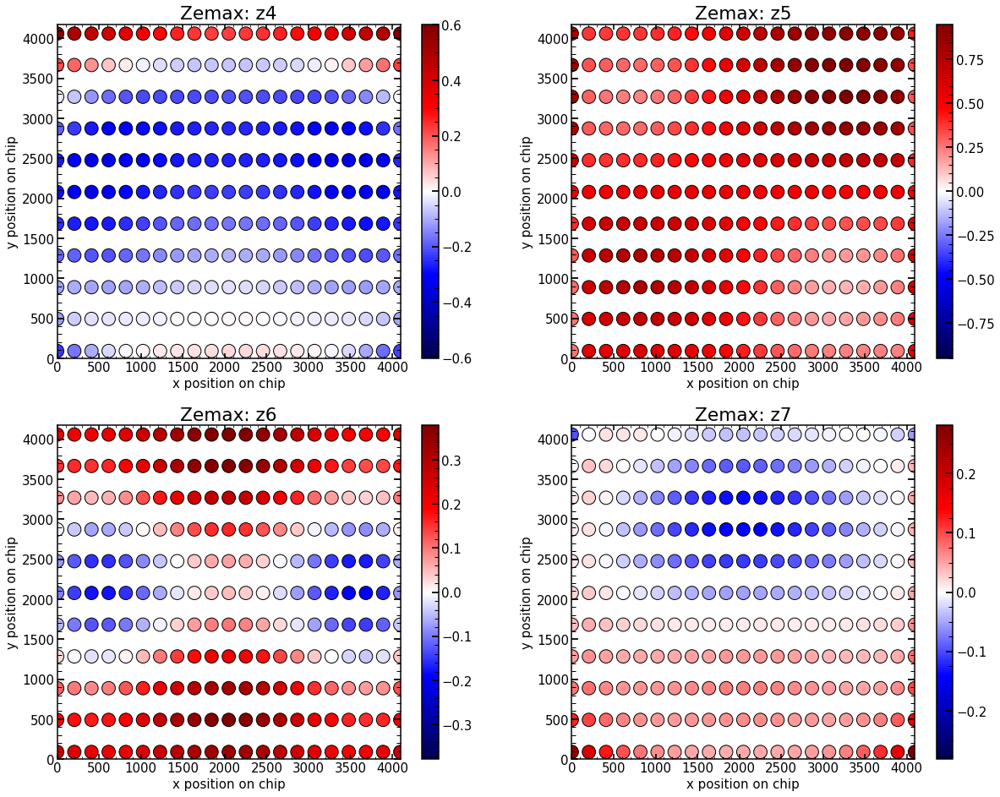

In [129]:
plt.figure(figsize=(20,16))

plt.subplot(2,2,1)
values=np.array(wavelength_correction(single_Zernike_res_z4))
plt.scatter(x, y, s=area, c=values, cmap='seismic', alpha=1,vmin=-np.max(np.abs(values)), vmax=np.max(np.abs(values)),edgecolor='black')
#plt.scatter(x_rotated, y_rotated, s=area, c=values, cmap='seismic', alpha=1,vmin=-np.max(np.abs(values)), vmax=np.max(np.abs(values)),edgecolor='black')
plt.ylim(0,4176)
plt.xlim(0,4096)
plt.xlabel('x position on chip')
plt.ylabel('y position on chip')
plt.title('Zemax: z'+str(4))
plt.colorbar()

plt.subplot(2,2,2)
values=np.array(wavelength_correction(single_Zernike_res_z5))
plt.scatter(x, y, s=area, c=values, cmap='seismic', alpha=1,vmin=-np.max(np.abs(values)), vmax=np.max(np.abs(values)),edgecolor='black')
plt.ylim(0,4176)
plt.xlim(0,4096)
plt.xlabel('x position on chip')
plt.ylabel('y position on chip')
plt.title('Zemax: z'+str(5))
plt.colorbar()

plt.subplot(2,2,3)
values=np.array(wavelength_correction(single_Zernike_res_z6))
plt.scatter(x, y, s=area, c=values, cmap='seismic', alpha=1,vmin=-np.max(np.abs(values)), vmax=np.max(np.abs(values)),edgecolor='black')
plt.ylim(0,4176)
plt.xlim(0,4096)
plt.xlabel('x position on chip')
plt.ylabel('y position on chip')
plt.title('Zemax: z'+str(6))
plt.colorbar()

plt.subplot(2,2,4)
values=np.array(wavelength_correction(single_Zernike_res_z7))
plt.scatter(x, y, s=area, c=values, cmap='seismic', alpha=1,vmin=-np.max(np.abs(values)), vmax=np.max(np.abs(values)),edgecolor='black')
plt.ylim(0,4176)
plt.xlim(0,4096)
plt.xlabel('x position on chip')
plt.ylabel('y position on chip')
plt.title('Zemax: z'+str(7))
plt.colorbar()

## Wavefront rms 

In [108]:

date='Dec17'
obs=21400
single_number='9'
image_index=int(single_number)
eps=5
arc='HgAr'
dataset=4

if dataset==2:
    STAMPS_FOLDER="/Users/nevencaplar/Documents/PFS/ReducedData/Data_May_28/Stamps_cleaned/"
if dataset==3:
    STAMPS_FOLDER="/Users/nevencaplar/Documents/PFS/ReducedData/Data_Jun_25/Stamps_cleaned/"
if dataset==4:
    STAMPS_FOLDER="/Users/nevencaplar/Documents/PFS/ReducedData/Data_Aug_14/Stamps_cleaned/"    

if dataset==1:
    if arc=="HgAr":
        single_number_focus=11748
    elif arc=="Ne":
        single_number_focus=11748+607    
    else:
        print("Not recognized arc-line")
        
if dataset==2:
    if arc=="HgAr":
        single_number_focus=17017+54
    elif arc=="Ne":
        single_number_focus=16292  
    elif arc=="Kr":
        single_number_focus=17364  
    else:
        print("Not recognized arc-line")
        
if dataset==3:
    if arc=="HgAr":
        single_number_focus=19238+54
    elif arc=="Ne":
        single_number_focus=19472  
    else:
        print("Not recognized arc-line")
      
if dataset==4:
    if arc=="HgAr":
        single_number_focus=21346+54
    elif arc=="Ne":
        single_number_focus=21550 +54 
    elif arc=="Kr":
        single_number_focus=21754  +54 
    else:
        print("Not recognized arc-line")    
    
if dataset==1:
    if arc=='HgAr':
        obs_possibilites=np.array([11796,11790,11784,11778,11772,11766,11760,11754,11748,11748,11694,11700,11706,11712,11718,11724,11730,11736])
    elif arc=='Ne':
        obs_possibilites=np.array([12403,12397,12391,12385,12379,12373,12367,12361,12355,12355,12349,12343,12337,12331,12325,12319,12313,12307])
        
if dataset==2:
    if arc=='HgAr':
        obs_possibilites=np.array([17023,17023+6,17023+12,17023+18,17023+24,17023+30,17023+36,17023+42,17023+48,17023+48,\
                                   17023+54,17023+60,17023+66,17023+72,17023+78,17023+84,17023+90,17023+96,17023+48])
    if arc=='Ne':
        # different sequence than for HgAr
        obs_possibilites=np.array([16238+6,16238+12,16238+18,16238+24,16238+30,16238+36,16238+42,16238+48,16238+54,16238+54,\
                                   16238+60,16238+66,16238+72,16238+78,16238+84,16238+90,16238+96,16238+102,16238+54])
    if arc=='Kr':
         obs_possibilites=np.array([17310+6,17310+12,17310+18,17310+24,17310+30,17310+36,17310+42,17310+48,17310+54,17310+54,\
                                    17310+60,17310+66,17310+72,17310+78,17310+84,17310+90,17310+96,17310+102,17310+54])

if dataset==3:    
    if arc=='HgAr':
        obs_possibilites=np.array([19238,19238+6,19238+12,19238+18,19238+24,19238+30,19238+36,19238+42,19238+48,19238+48,\
                                   19238+54,19238+60,19238+66,19238+72,19238+78,19238+84,19238+90,19238+96,19238+48])
    elif arc=='Ne':
    # different sequence than for HgAr
        obs_possibilites=np.array([19472+6,19472+12,19472+18,19472+24,19472+30,19472+36,19472+42,19472+48,19472+54,19472+54,\
                                   19472+60,19472+66,19472+72,19472+78,19472+84,19472+90,19472+96,19472+102,19472+54]) 
  
if dataset==4:
    if arc=='HgAr':
        obs_possibilites=np.array([21346+6,21346+12,21346+18,21346+24,21346+30,21346+36,21346+42,21346+48,21346+54,21346+54,\
                                   21346+60,21346+66,21346+72,21346+78,21346+84,21346+90,21346+96,21346+102,21346+48])
    if arc=='Ne':
        obs_possibilites=np.array([21550+6,21550+12,21550+18,21550+24,21550+30,21550+36,21550+42,21550+48,21550+54,21550+54,\
                                   21550+60,21550+66,21550+72,21550+78,21550+84,21550+90,21550+96,21550+102,21550+54])
    if arc=='Kr':
         obs_possibilites=np.array([21754+6,21754+12,21754+18,21754+24,21754+30,21754+36,21754+42,21754+48,21754+54,21754+54,\
                                    21754+60,21754+66,21754+72,21754+78,21754+84,21754+90,21754+96,21754+102,21754+54])
        
label=['m4','m35','m3','m25','m2','m15','m1','m05','0d','0','p05','p1','p15','p2','p25','p3','p35','p4','0p']
labelInput=label[list(obs_possibilites).index(int(obs))]
print(labelInput)
if obs==8600:
    print("Not implemented for December 2018 data")
else:
    sci_image =np.load(STAMPS_FOLDER+'sci'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
    mask_image =np.load(STAMPS_FOLDER+'mask'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
    var_image =np.load(STAMPS_FOLDER+'var'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
    #sci_image_focus_large =np.load(STAMPS_FOLDER+'sci'+str(single_number_focus)+str(single_number)+str(arc)+'_Stacked_large.npy')
    #var_image_focus_large =np.load(STAMPS_FOLDER+'var'+str(single_number_focus)+str(single_number)+str(arc)+'_Stacked_large.npy')

if dataset==1:
    if arc=="HgAr":
        finalArc=finalHgAr_Feb2019
    elif arc=="Ne":
        finalArc=finalNe_Feb2019    
    else:
        print("Not recognized arc-line")  
        
if dataset==2:   
    if arc=="HgAr":
        finalArc=finalHgAr_May2019
    elif arc=="Ne":
        finalArc=finalNe_May2019    
    elif arc=="Kr":
        finalArc=finalKr_May2019    
    else:
        print("Not recognized arc-line")   
        
if dataset==3:   
    if arc=="HgAr":
        finalArc=finalHgAr_May2019
    elif arc=="Ne":
        finalArc=finalNe_May2019    
    else:
        print("Not recognized arc-line")   
        
if dataset==4:   
    if arc=="HgAr":
        finalArc=finalHgAr_May2019
    elif arc=="Ne":
        finalArc=finalNe_May2019    
    elif arc=="Kr":
        finalArc=finalKr_May2019    
    else:
        print("Not recognized arc-line")           
        
finalArc.loc[int(single_number)]

0d


fiber                           2
xc                             66
yc                           3395
wavelength               912.5693
close                           1
lamp                         HgAr
xc_effective                   66
old_index_approx                9
superold_index_approx        20.0
Name: 9, dtype: object

In [55]:
with open('/Users/nevencaplar/Documents/PFS/ReducedData/Data_May_28/Dataframes/finalNe_May2019.pkl', 'rb') as f:
    finalNe_May2019=pickle.load(f)  
with open('/Users/nevencaplar/Documents/PFS/ReducedData/Data_May_28/Dataframes/finalHgAr_May2019.pkl', 'rb') as f:
    finalHgAr_May2019=pickle.load(f)  
with open('/Users/nevencaplar/Documents/PFS/ReducedData/Data_May_28/Dataframes/finalKr_May2019.pkl', 'rb') as f:
    finalKr_May2019=pickle.load(f)  
    
finalKr=finalKr_May2019
finalHgAr=finalHgAr_May2019
finalNe=finalNe_May2019

In [50]:
with open('/Users/nevencaplar/Documents/PFS/Fit_Results/Dec17_Focus/' + 'results_of_fit_many_direct_HgAr_from_Dec17.pkl', 'rb') as f:
    results_of_fit_many_direct_HgAr_from_Dec17=pickle.load(f)
with open('/Users/nevencaplar/Documents/PFS/Fit_Results/Dec17_Focus/' + 'results_of_fit_many_direct_Ne_from_Dec17.pkl', 'rb') as f:
    results_of_fit_many_direct_Ne_from_Dec17=pickle.load(f)
with open('/Users/nevencaplar/Documents/PFS/Fit_Results/Dec17_Focus/' + 'results_of_fit_many_direct_Kr_from_Dec17.pkl', 'rb') as f:
    results_of_fit_many_direct_Kr_from_Dec17=pickle.load(f)

In [51]:
results_of_fit_many_direct_HgAr_from_Dec17.index.values

array([  1,   3,   6,   9,  11,  13,  15,  18,  21,  23,  27,  30,  33,
        35,  37,  39,  42,  45,  47,  49,  51,  54,  57,  59,  61,  63,
        66,  69,  71,  73,  75,  78,  81,  83,  85,  87,  90,  93,  95,
        97,  99, 102, 105, 107, 109, 111, 114, 117, 119])

In [52]:

wavefront_values_HgAr=[]
list_of_wf_grid_HgAr=[]list_of_wf_grid=[]

wavefront_values_HgAr=[]
list_of_wf_grid_HgAr=[]
list_of_wf_grid_HgAr_0=[]
list_of_wf_grid_HgAr_0_and_focus_0=[]


arc='HgAr'
obs=21346+54
for single_number in tqdm(results_of_fit_many_direct_HgAr_from_Dec17.index.values):
    minchain=results_of_fit_many_direct_HgAr_from_Dec17.loc[single_number].values[:42]

    sci_image =np.load(STAMPS_FOLDER+'sci'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
    mask_image =np.load(STAMPS_FOLDER+'mask'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
    var_image =np.load(STAMPS_FOLDER+'var'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')


    model = LN_PFS_single(sci_image,var_image,dithering=1,save=1,zmax=22,verbosity=0)   

    model(minchain)

    wf_grid=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'wf_grid.npy')  
    wavefront_values_HgAr.append([single_number,np.max(wf_grid[np.abs(wf_grid)>0]),np.min(wf_grid[np.abs(wf_grid)>0]),\
                                  np.mean(wf_grid[np.abs(wf_grid)>0]),np.median(wf_grid[np.abs(wf_grid)>0]),np.std(wf_grid[np.abs(wf_grid)>0])])
 
    list_of_wf_grid_HgAr.append(wf_grid)

    # eliminating values for 
    minchain_0=np.copy(minchain)
    minchain_0[19]=0
    minchain_0[20]=0
    minchain_0[23]=0
    model(minchain_0)
    wf_grid=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'wf_grid.npy') 
    list_of_wf_grid_HgAr_0.append(wf_grid)
    
    # also eliminating defocus value z4-z22
    minchain_0_and_focus_0=np.copy(minchain_0)
    minchain_0_and_focus_0[0]=0
    minchain_0_and_focus_0[7]=0
    minchain_0_and_focus_0[18]=0
    model(minchain_0_and_focus_0)
    wf_grid=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'wf_grid.npy') 
    list_of_wf_grid_HgAr_0_and_focus_0.append(wf_grid)

for single_number in tqdm(results_of_fit_many_direct_HgAr_from_Dec17.index.values):

SyntaxError: unexpected EOF while parsing (<ipython-input-52-828bd29c7576>, line 1)

In [53]:
results_of_fit_many_direct_HgAr_from_Dec17.index.values[0]

1

In [62]:
finalHgAr_May2019.iloc[1][['xc','yc']].values

array([69, 875], dtype=object)

In [63]:
x

array([2048, 2252, 2457, 2662, 2867, 3072, 3276, 3481, 3686, 3891, 4096,
          0, 1843, 1638, 1433, 1228, 1024,  819,  614,  409,  204, 2048,
       2252, 2457, 2662, 2867, 3072, 3276, 3481, 3686, 3891, 4096,    0,
       1843, 1638, 1433, 1228, 1024,  819,  614,  409,  204, 2048, 2252,
       2457, 2662, 2867, 3072, 3276, 3481, 3686, 3891, 4096,    0, 1843,
       1638, 1433, 1228, 1024,  819,  614,  409,  204, 2048, 2252, 2457,
       2662, 2867, 3072, 3276, 3481, 3686, 3891, 4096,    0, 1843, 1638,
       1433, 1228, 1024,  819,  614,  409,  204, 2048, 2252, 2457, 2662,
       2867, 3072, 3276, 3481, 3686, 3891, 4096,    0, 1843, 1638, 1433,
       1228, 1024,  819,  614,  409,  204, 2048, 2252, 2457, 2662, 2867,
       3072, 3276, 3481, 3686, 3891, 4096,    0, 1843, 1638, 1433, 1228,
       1024,  819,  614,  409,  204, 2048, 2252, 2457, 2662, 2867, 3072,
       3276, 3481, 3686, 3891, 4096,    0, 1843, 1638, 1433, 1228, 1024,
        819,  614,  409,  204, 2048, 2252, 2457, 26

In [81]:
Zernike_single_Zemax=[]

x_position=finalHgAr_May2019.iloc[1]['xc']
y_position=finalHgAr_May2019.iloc[1]['yc']

for i in [single_Zernike_res_z4,single_Zernike_res_z5,single_Zernike_res_z6,single_Zernike_res_z7,single_Zernike_res_z8,single_Zernike_res_z9,single_Zernike_res_z10,single_Zernike_res_z11,\
         single_Zernike_res_z12,single_Zernike_res_z13,single_Zernike_res_z14,single_Zernike_res_z15,single_Zernike_res_z16,single_Zernike_res_z17,single_Zernike_res_z18,\
          single_Zernike_res_z19,single_Zernike_res_z20,single_Zernike_res_z21,single_Zernike_res_z22]:
    Zernike_single_Zemax.append(scipy.interpolate.SmoothBivariateSpline(x,y,np.array(wavelength_correction(i)))(x_position,y_position)[0][0])

In [78]:
Zernike_single_Zemax=np.array(Zernike_single_Zemax)
Zernike_single_Zemax

array([-0.13130879,  0.41509238,  0.06414604,  0.09224901,  0.00734821,
       -0.02016886, -0.18513287,  0.00836944,  0.07772098,  0.00251068,
        0.00815661, -0.00210975, -0.02197216,  0.01339144,  0.02028477,
       -0.01421675,  0.00502621,  0.00068521,  0.        ])

In [82]:
Zernike_single_Zemax

[-0.14602488392780674,
 0.4367871379456539,
 0.017716711943527967,
 0.07024328743528228,
 0.002818315263000529,
 0.0028573215785303537,
 -0.1979207777717424,
 0.046591059332904056,
 0.09235481091245364,
 -0.003357068875549644,
 0.0037939599347870537,
 -0.0014782759452029825,
 -0.022155794142603737,
 0.011115767149797347,
 0.02028271258920176,
 -0.013361185371552346,
 0.004843292905449146,
 4.143065086596038e-05,
 0.0]

In [94]:
minchain=results_of_fit_many_direct_HgAr_from_Dec17.loc[1].values[:42]
minchain_Zemax=np.copy(minchain)

minchain_Zemax[0:19]=Zernike_single_Zemax
minchain_Zemax

array([   -0.14602488,     0.43678714,     0.01771671,     0.07024329,
           0.00281832,     0.00285732,    -0.19792078,     0.04659106,
           0.09235481,    -0.00335707,     0.00379396,    -0.00147828,
          -0.02215579,     0.01111577,     0.02028271,    -0.01336119,
           0.00484329,     0.00004143,     0.        ,     0.68633122,
           0.09974333,    -0.1900477 ,    -0.04529421,     0.05214261,
           0.05087747,     0.00004148,     0.00004146,     0.9749291 ,
           0.94835567,     0.03885964,    -0.05278661,     0.92055316,
           0.05681748,     0.62724215,     1.00053215,     0.61525985,
       44687.82746289,     1.92366563,     0.00074594,     0.35      ,
           1.78193719,     0.99946374])

In [109]:
list_of_wf_grid=[]

wavefront_values_HgAr=[]
list_of_wf_grid_HgAr=[]
list_of_wf_grid_HgAr_0=[]
list_of_wf_grid_HgAr_0_and_focus_0=[]


arc='HgAr'
obs=21346+54
for single_number in tqdm(results_of_fit_many_direct_HgAr_from_Dec17.index.values):
    minchain=results_of_fit_many_direct_HgAr_from_Dec17.loc[single_number].values[:42]
   
    Zernike_single_Zemax=[]
    x_position=finalHgAr_May2019.iloc[single_number]['xc']
    y_position=finalHgAr_May2019.iloc[single_number]['yc']

    for i in [single_Zernike_res_z4,single_Zernike_res_z5,single_Zernike_res_z6,single_Zernike_res_z7,single_Zernike_res_z8,single_Zernike_res_z9,single_Zernike_res_z10,single_Zernike_res_z11,\
             single_Zernike_res_z12,single_Zernike_res_z13,single_Zernike_res_z14,single_Zernike_res_z15,single_Zernike_res_z16,single_Zernike_res_z17,single_Zernike_res_z18,\
              single_Zernike_res_z19,single_Zernike_res_z20,single_Zernike_res_z21,single_Zernike_res_z22]:
        Zernike_single_Zemax.append(scipy.interpolate.SmoothBivariateSpline(x,y,np.array(wavelength_correction(i)))(x_position,y_position)[0][0])    
    
    minchain_Zemax=np.copy(minchain)
    minchain_Zemax[0:19]=Zernike_single_Zemax
    
    sci_image =np.load(STAMPS_FOLDER+'sci'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
    mask_image =np.load(STAMPS_FOLDER+'mask'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
    var_image =np.load(STAMPS_FOLDER+'var'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')


    model = LN_PFS_single(sci_image,var_image,dithering=1,save=1,zmax=22,verbosity=0)   

    model(minchain_Zemax)

    wf_grid=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'wf_grid.npy')  
    wavefront_values_HgAr.append([single_number,np.max(wf_grid[np.abs(wf_grid)>0]),np.min(wf_grid[np.abs(wf_grid)>0]),\
                                  np.mean(wf_grid[np.abs(wf_grid)>0]),np.median(wf_grid[np.abs(wf_grid)>0]),np.std(wf_grid[np.abs(wf_grid)>0])])
 
    list_of_wf_grid_HgAr.append(wf_grid)

    # eliminating values for 
    minchain_0=np.copy(minchain_Zemax)
    minchain_0[19]=0
    minchain_0[20]=0
    minchain_0[23]=0
    model(minchain_0)
    wf_grid=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'wf_grid.npy') 
    list_of_wf_grid_HgAr_0.append(wf_grid)
    
    # also eliminating defocus value z4-z22
    minchain_0_and_focus_0=np.copy(minchain_0)
    minchain_0_and_focus_0[0]=0
    minchain_0_and_focus_0[7]=0
    minchain_0_and_focus_0[18]=0
    model(minchain_0_and_focus_0)
    wf_grid=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'wf_grid.npy') 
    list_of_wf_grid_HgAr_0_and_focus_0.append(wf_grid)
    
    
    
wavefront_values_Ne=[]
list_of_wf_grid_Ne=[]
list_of_wf_grid_Ne_0=[]
list_of_wf_grid_Ne_0_and_focus_0=[]
arc='Ne'
obs=21550 +54
for single_number in tqdm(results_of_fit_many_direct_Ne_from_Dec17.index.values):
    minchain=results_of_fit_many_direct_Ne_from_Dec17.loc[single_number].values[:42]

    Zernike_single_Zemax=[]
    x_position=finalNe_May2019.iloc[single_number]['xc']
    y_position=finalNe_May2019.iloc[single_number]['yc']

    for i in [single_Zernike_res_z4,single_Zernike_res_z5,single_Zernike_res_z6,single_Zernike_res_z7,single_Zernike_res_z8,single_Zernike_res_z9,single_Zernike_res_z10,single_Zernike_res_z11,\
             single_Zernike_res_z12,single_Zernike_res_z13,single_Zernike_res_z14,single_Zernike_res_z15,single_Zernike_res_z16,single_Zernike_res_z17,single_Zernike_res_z18,\
              single_Zernike_res_z19,single_Zernike_res_z20,single_Zernike_res_z21,single_Zernike_res_z22]:
        Zernike_single_Zemax.append(scipy.interpolate.SmoothBivariateSpline(x,y,np.array(wavelength_correction(i)))(x_position,y_position)[0][0])    

    minchain_Zemax=np.copy(minchain)
    minchain_Zemax[0:19]=Zernike_single_Zemax
    
    sci_image =np.load(STAMPS_FOLDER+'sci'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
    mask_image =np.load(STAMPS_FOLDER+'mask'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
    var_image =np.load(STAMPS_FOLDER+'var'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')


    model = LN_PFS_single(sci_image,var_image,dithering=1,save=1,zmax=22,verbosity=0)    

    model(minchain_Zemax)

    wf_grid=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'wf_grid.npy')  
    wavefront_values_Ne.append([single_number,np.max(wf_grid[np.abs(wf_grid)>0]),np.min(wf_grid[np.abs(wf_grid)>0]),\
                                  np.mean(wf_grid[np.abs(wf_grid)>0]),np.median(wf_grid[np.abs(wf_grid)>0]),np.std(wf_grid[np.abs(wf_grid)>0])])
    list_of_wf_grid_Ne.append(wf_grid)
    
    minchain_0=np.copy(minchain_Zemax)
    minchain_0[19]=0
    minchain_0[20]=0
    minchain_0[23]=0
    model(minchain_0)
    wf_grid=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'wf_grid.npy') 
    list_of_wf_grid_Ne_0.append(wf_grid)
        
    minchain_0_and_focus_0=np.copy(minchain_0)
    minchain_0_and_focus_0[0]=0
    minchain_0_and_focus_0[7]=0
    minchain_0_and_focus_0[18]=0
    model(minchain_0_and_focus_0)
    wf_grid=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'wf_grid.npy') 
    list_of_wf_grid_Ne_0_and_focus_0.append(wf_grid)
    
 
wavefront_values_Kr=[]
list_of_wf_grid_Kr=[]
list_of_wf_grid_Kr_0=[]
list_of_wf_grid_Kr_0_and_focus_0=[]
arc='Kr'
obs=21754+54 
for single_number in tqdm(results_of_fit_many_direct_Kr_from_Dec17.index.values):
    minchain=results_of_fit_many_direct_Kr_from_Dec17.loc[single_number].values[:42]

    Zernike_single_Zemax=[]
    x_position=finalKr_May2019.iloc[single_number]['xc']
    y_position=finalKr_May2019.iloc[single_number]['yc']

    for i in [single_Zernike_res_z4,single_Zernike_res_z5,single_Zernike_res_z6,single_Zernike_res_z7,single_Zernike_res_z8,single_Zernike_res_z9,single_Zernike_res_z10,single_Zernike_res_z11,\
             single_Zernike_res_z12,single_Zernike_res_z13,single_Zernike_res_z14,single_Zernike_res_z15,single_Zernike_res_z16,single_Zernike_res_z17,single_Zernike_res_z18,\
              single_Zernike_res_z19,single_Zernike_res_z20,single_Zernike_res_z21,single_Zernike_res_z22]:
        Zernike_single_Zemax.append(scipy.interpolate.SmoothBivariateSpline(x,y,np.array(wavelength_correction(i)))(x_position,y_position)[0][0])    

    minchain_Zemax=np.copy(minchain)
    minchain_Zemax[0:19]=Zernike_single_Zemax
    
    
    sci_image =np.load(STAMPS_FOLDER+'sci'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
    mask_image =np.load(STAMPS_FOLDER+'mask'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
    var_image =np.load(STAMPS_FOLDER+'var'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')


    model = LN_PFS_single(sci_image,var_image,dithering=1,save=1,zmax=22,verbosity=0)   

    model(minchain_Zemax)

    wf_grid=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'wf_grid.npy')  
    wavefront_values_Kr.append([single_number,np.max(wf_grid[np.abs(wf_grid)>0]),np.min(wf_grid[np.abs(wf_grid)>0]),\
                                  np.mean(wf_grid[np.abs(wf_grid)>0]),np.median(wf_grid[np.abs(wf_grid)>0]),np.std(wf_grid[np.abs(wf_grid)>0])])
    list_of_wf_grid_Kr.append(wf_grid)

    minchain_0=np.copy(minchain_Zemax)
    minchain_0[19]=0
    minchain_0[20]=0
    minchain_0[23]=0
    model(minchain_0)
    wf_grid=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'wf_grid.npy') 
    list_of_wf_grid_Kr_0.append(wf_grid)
    
    minchain_0_and_focus_0=np.copy(minchain_0)
    minchain_0_and_focus_0[0]=0
    minchain_0_and_focus_0[7]=0
    minchain_0_and_focus_0[18]=0
    model(minchain_0_and_focus_0)
    wf_grid=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'wf_grid.npy') 
    list_of_wf_grid_Kr_0_and_focus_0.append(wf_grid)
    
wavefront_values_HgAr=np.array(wavefront_values_HgAr)
wavefront_values_Ne=np.array(wavefront_values_Ne)
wavefront_values_Kr=np.array(wavefront_values_Kr)
    

100%|██████████| 10/10 [00:44<00:00,  4.45s/it]


In [138]:
# plot the results of the interpolation
zMax=22
from pylab import rcParams
rcParams['figure.figsize'] = 12, 10
date='Dec17'
descriptions=results_of_fit_many_direct_HgAr_from_Dec17.columns


# take values for HgAr
x_HgAr=finalHgAr.loc[results_of_fit_many_direct_HgAr_from_Dec17.index.astype(int).ravel()]['xc_effective'].values
y_HgAr=finalHgAr.loc[results_of_fit_many_direct_HgAr_from_Dec17.index.astype(int).ravel()]['yc'].values
values_HgAr_RMS=wavefront_values_HgAr[:,5]
values_HgAr_max_min=wavefront_values_HgAr[:,1]-wavefront_values_HgAr[:,2]
values_HgAr_mean=wavefront_values_HgAr[:,4]

# take values for Neon        
x_Ne=finalNe.loc[results_of_fit_many_direct_Ne_from_Dec17.index.astype(int).ravel()]['xc_effective'].values
y_Ne=finalNe.loc[results_of_fit_many_direct_Ne_from_Dec17.index.astype(int).ravel()]['yc'].values
values_Ne_RMS=wavefront_values_Ne[:,5]
values_Ne_max_min=wavefront_values_Ne[:,1]-wavefront_values_Ne[:,2]
values_Ne_mean=wavefront_values_Ne[:,4]

# take values for Krypton        
x_Kr=finalKr.loc[results_of_fit_many_direct_Kr_from_Dec17.index.astype(int).ravel()]['xc_effective'].values
y_Kr=finalKr.loc[results_of_fit_many_direct_Kr_from_Dec17.index.astype(int).ravel()]['yc'].values
values_Kr_RMS=wavefront_values_Kr[:,5] 
values_Kr_max_min=wavefront_values_Kr[:,1]-wavefront_values_Kr[:,2]
values_Kr_mean=wavefront_values_Kr[:,4]
#x=x_HgAr
#y=y_HgAr  
#colors=values_HgAr

# join these values
x=np.concatenate((x_HgAr,x_Ne,x_Kr))
y=np.concatenate((y_HgAr,y_Ne,y_Kr))    
colors_RMS= np.concatenate((values_HgAr_RMS,values_Ne_RMS,values_Kr_RMS))
colors_max_min= np.concatenate((values_HgAr_max_min,values_Ne_max_min,values_Kr_max_min))
colors_mean= np.concatenate((values_HgAr_mean,values_Ne_mean,values_Kr_mean))


min_colors_RMS=np.quantile(colors_RMS,0.1)
max_colors_RMS=np.quantile(colors_RMS,0.9)
min_colors_max_min=np.quantile(colors_max_min,0.1)
max_colors_max_min=np.quantile(colors_max_min,0.9)
min_colors_mean=np.quantile(colors_mean,0.1)
max_colors_mean=np.quantile(colors_mean,0.9)

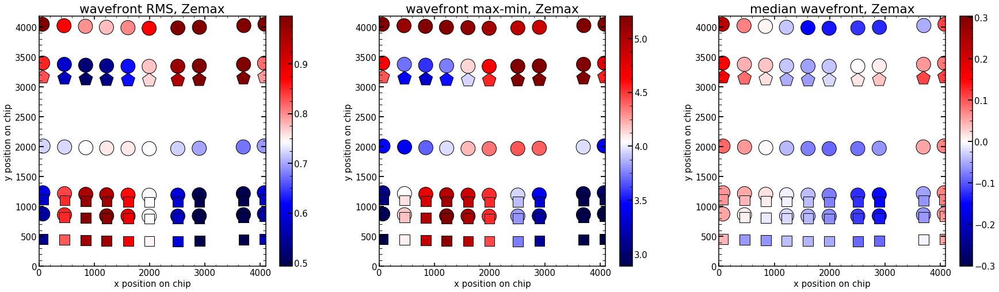

In [140]:


matplotlib.rcParams.update({'font.size': 18})


plt.figure(figsize=(30,8))

plt.subplot(131)

plt.scatter(x_HgAr, y_HgAr, s=np.pi * (14 * 1)**2, c=values_HgAr_RMS, cmap='seismic', alpha=1,vmin=min_colors_RMS, vmax=max_colors_RMS,edgecolor='black',marker='o')
plt.scatter(x_Ne, y_Ne, s=np.pi * (10 * 1)**2, c=values_Ne_RMS, cmap='seismic', alpha=1,vmin=min_colors_RMS, vmax=max_colors_RMS,edgecolor='black',marker='s')
plt.scatter(x_Kr, y_Kr, s=np.pi * (14 * 1)**2, c=values_Kr_RMS, cmap='seismic', alpha=1,vmin=min_colors_RMS, vmax=max_colors_RMS,edgecolor='black',marker='p')
plt.ylim(0,4176)
plt.xlim(0,4096)
plt.xlabel('x position on chip')
plt.ylabel('y position on chip')
plt.title('wavefront RMS, Zemax')
plt.colorbar()


plt.subplot(132)

plt.scatter(x_HgAr, y_HgAr, s=np.pi * (14 * 1)**2, c=values_HgAr_max_min, cmap='seismic', alpha=1,vmin=min_colors_max_min, vmax=max_colors_max_min,edgecolor='black',marker='o')
plt.scatter(x_Ne, y_Ne, s=np.pi * (10 * 1)**2, c=values_Ne_max_min, cmap='seismic', alpha=1,vmin=min_colors_max_min, vmax=max_colors_max_min,edgecolor='black',marker='s')
plt.scatter(x_Kr, y_Kr, s=np.pi * (14 * 1)**2, c=values_Kr_max_min, cmap='seismic', alpha=1,vmin=min_colors_max_min, vmax=max_colors_max_min,edgecolor='black',marker='p')
plt.ylim(0,4176)
plt.xlim(0,4096)
plt.xlabel('x position on chip')
plt.ylabel('y position on chip')
plt.title('wavefront max-min, Zemax')
plt.colorbar()

plt.subplot(133)

plt.scatter(x_HgAr, y_HgAr, s=np.pi * (14 * 1)**2, c=values_HgAr_mean, cmap='seismic', alpha=1,vmin=-abs_colors_mean, vmax=abs_colors_mean,edgecolor='black',marker='o')
plt.scatter(x_Ne, y_Ne, s=np.pi * (10 * 1)**2, c=values_Ne_mean, cmap='seismic', alpha=1,vmin=-abs_colors_mean, vmax=abs_colors_mean,edgecolor='black',marker='s')
plt.scatter(x_Kr, y_Kr, s=np.pi * (14 * 1)**2, c=values_Kr_mean, cmap='seismic', alpha=1,vmin=-abs_colors_mean, vmax=abs_colors_mean,edgecolor='black',marker='p')
plt.ylim(0,4176)
plt.xlim(0,4096)
plt.xlabel('x position on chip')
plt.ylabel('y position on chip')
plt.title('median wavefront, Zemax')
plt.colorbar()

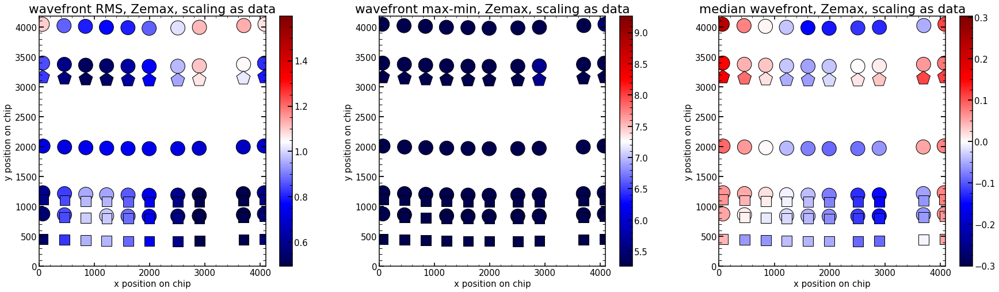

In [142]:
matplotlib.rcParams.update({'font.size': 18})

max_colors_RMS=1.596
max_colors_max_min=0.867
max_colors_max_min=9.26
min_colors_max_min=5.26
abs_colors_mean=0.302


plt.figure(figsize=(30,8))

plt.subplot(131)

plt.scatter(x_HgAr, y_HgAr, s=np.pi * (14 * 1)**2, c=values_HgAr_RMS, cmap='seismic', alpha=1,vmin=min_colors_RMS, vmax=max_colors_RMS,edgecolor='black',marker='o')
plt.scatter(x_Ne, y_Ne, s=np.pi * (10 * 1)**2, c=values_Ne_RMS, cmap='seismic', alpha=1,vmin=min_colors_RMS, vmax=max_colors_RMS,edgecolor='black',marker='s')
plt.scatter(x_Kr, y_Kr, s=np.pi * (14 * 1)**2, c=values_Kr_RMS, cmap='seismic', alpha=1,vmin=min_colors_RMS, vmax=max_colors_RMS,edgecolor='black',marker='p')
plt.ylim(0,4176)
plt.xlim(0,4096)
plt.xlabel('x position on chip')
plt.ylabel('y position on chip')
plt.title('wavefront RMS, Zemax, scaling as data')
plt.colorbar()


plt.subplot(132)

plt.scatter(x_HgAr, y_HgAr, s=np.pi * (14 * 1)**2, c=values_HgAr_max_min, cmap='seismic', alpha=1,vmin=min_colors_max_min, vmax=max_colors_max_min,edgecolor='black',marker='o')
plt.scatter(x_Ne, y_Ne, s=np.pi * (10 * 1)**2, c=values_Ne_max_min, cmap='seismic', alpha=1,vmin=min_colors_max_min, vmax=max_colors_max_min,edgecolor='black',marker='s')
plt.scatter(x_Kr, y_Kr, s=np.pi * (14 * 1)**2, c=values_Kr_max_min, cmap='seismic', alpha=1,vmin=min_colors_max_min, vmax=max_colors_max_min,edgecolor='black',marker='p')
plt.ylim(0,4176)
plt.xlim(0,4096)
plt.xlabel('x position on chip')
plt.ylabel('y position on chip')
plt.title('wavefront max-min, Zemax, scaling as data')
plt.colorbar()

plt.subplot(133)

plt.scatter(x_HgAr, y_HgAr, s=np.pi * (14 * 1)**2, c=values_HgAr_mean, cmap='seismic', alpha=1,vmin=-abs_colors_mean, vmax=abs_colors_mean,edgecolor='black',marker='o')
plt.scatter(x_Ne, y_Ne, s=np.pi * (10 * 1)**2, c=values_Ne_mean, cmap='seismic', alpha=1,vmin=-abs_colors_mean, vmax=abs_colors_mean,edgecolor='black',marker='s')
plt.scatter(x_Kr, y_Kr, s=np.pi * (14 * 1)**2, c=values_Kr_mean, cmap='seismic', alpha=1,vmin=-abs_colors_mean, vmax=abs_colors_mean,edgecolor='black',marker='p')
plt.ylim(0,4176)
plt.xlim(0,4096)
plt.xlabel('x position on chip')
plt.ylabel('y position on chip')
plt.title('median wavefront, Zemax, scaling as data')
plt.colorbar()

## 2d

### original figure 

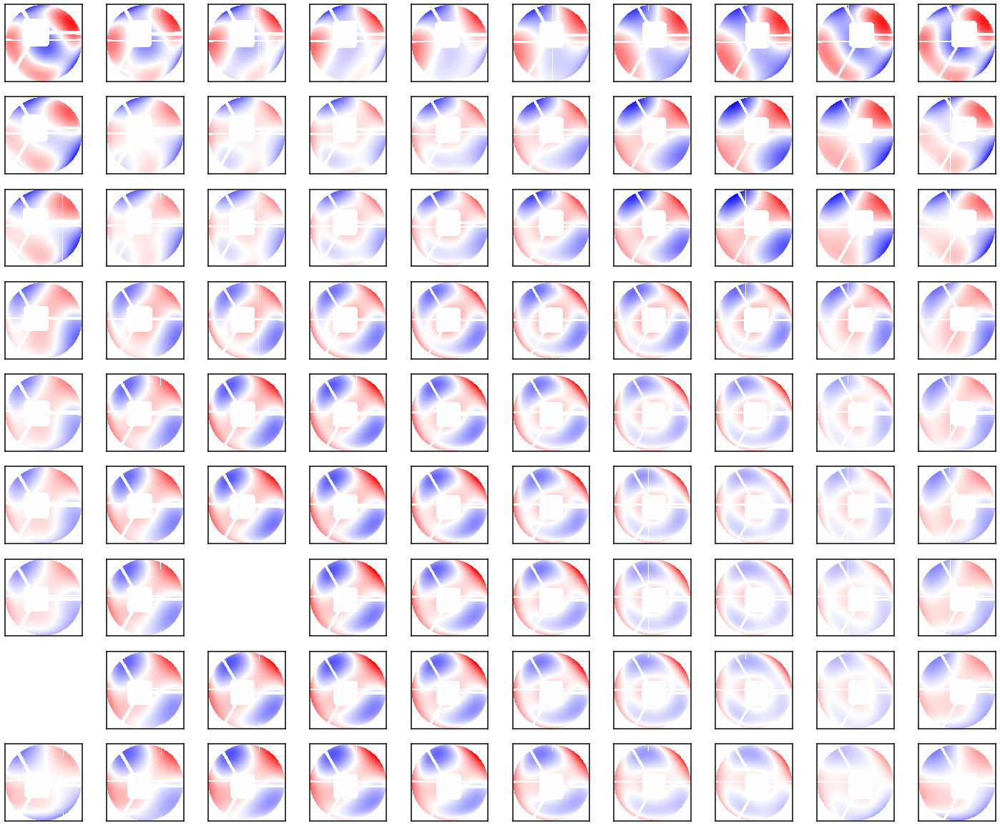

In [114]:
## matplotlib.rcParams.update({'font.size': 4})
matplotlib.rcParams.update({'axes.labelsize': 'small'})
matplotlib.rcParams.update({'xtick.labelsize': 'small'})
matplotlib.rcParams.update({'ytick.labelsize': 'small'})

y_range=9
x_range=10


plt.figure(figsize=(25,21))

# lowest Neon wavelength
# 660.0668 0,  2,  5,  8, 11, 14, 17, 20, 23, 26  
plt.subplot(y_range,x_range,81)
wavefront=list_of_wf_grid_Ne[0][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,82)
wavefront=list_of_wf_grid_Ne[2][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,83)
wavefront=list_of_wf_grid_Ne[5][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,84)
wavefront=list_of_wf_grid_Ne[8][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,85)
wavefront=list_of_wf_grid_Ne[11][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,86)
wavefront=list_of_wf_grid_Ne[14][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,87)
wavefront=list_of_wf_grid_Ne[17][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,88)
wavefront=list_of_wf_grid_Ne[20][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,89)
wavefront=list_of_wf_grid_Ne[23][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,90)
wavefront=list_of_wf_grid_Ne[26][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')
###############
# Ne 693
# 3,  6,  9, 12, 15, 18, 21, 24, 27

plt.subplot(y_range,x_range,72)
wavefront=list_of_wf_grid_Ne[3][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,73)
wavefront=list_of_wf_grid_Ne[6][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,74)
wavefront=list_of_wf_grid_Ne[9][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,75)
wavefront=list_of_wf_grid_Ne[12][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,76)
wavefront=list_of_wf_grid_Ne[15][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,77)
wavefront=list_of_wf_grid_Ne[18][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,78)
wavefront=list_of_wf_grid_Ne[21][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,79)
wavefront=list_of_wf_grid_Ne[24][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,80)
wavefront=list_of_wf_grid_Ne[27][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

###############
# HgAr 696
#  0,  5, 14, 19, 24, 29, 34, 39, 44
plt.subplot(y_range,x_range,61)
wavefront=list_of_wf_grid_HgAr[0][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,62)
wavefront=list_of_wf_grid_HgAr[5][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,64)
wavefront=list_of_wf_grid_HgAr[14][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,65)
wavefront=list_of_wf_grid_HgAr[19][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,66)
wavefront=list_of_wf_grid_HgAr[24][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,67)
wavefront=list_of_wf_grid_HgAr[29][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,68)
wavefront=list_of_wf_grid_HgAr[34][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,69)
wavefront=list_of_wf_grid_HgAr[39][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,70)
wavefront=list_of_wf_grid_HgAr[44][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

###############
# Ne 717
# [ 1,  4,  7, 10, 13, 16, 19, 22, 25, 28]

plt.subplot(y_range,x_range,51)
wavefront=list_of_wf_grid_Ne[1][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,52)
wavefront=list_of_wf_grid_Ne[4][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,53)
wavefront=list_of_wf_grid_Ne[7][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,54)
wavefront=list_of_wf_grid_Ne[10][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,55)
wavefront=list_of_wf_grid_Ne[13][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,56)
wavefront=list_of_wf_grid_Ne[16][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,57)
wavefront=list_of_wf_grid_Ne[19][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,58)
wavefront=list_of_wf_grid_Ne[22][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,59)
wavefront=list_of_wf_grid_Ne[25][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,60)
wavefront=list_of_wf_grid_Ne[28][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

###############
# HgAr 727
# 1,  6, 10, 15, 20, 25, 30, 35, 40, 45
plt.subplot(y_range,x_range,41)
wavefront=list_of_wf_grid_HgAr[1][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,42)
wavefront=list_of_wf_grid_HgAr[6][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,43)
wavefront=list_of_wf_grid_HgAr[10][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,44)
wavefront=list_of_wf_grid_HgAr[15][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,45)
wavefront=list_of_wf_grid_HgAr[20][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,46)
wavefront=list_of_wf_grid_HgAr[25][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,47)
wavefront=list_of_wf_grid_HgAr[30][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,48)
wavefront=list_of_wf_grid_HgAr[30][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,49)
wavefront=list_of_wf_grid_HgAr[40][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,50)
wavefront=list_of_wf_grid_HgAr[45][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

###############
# HgAr 795
# [ 2,  7, 11, 16, 21, 26, 31, 36, 41, 46]

plt.subplot(y_range,x_range,31)
wavefront=list_of_wf_grid_HgAr[2][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,32)
wavefront=list_of_wf_grid_HgAr[7][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,33)
wavefront=list_of_wf_grid_HgAr[11][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,34)
wavefront=list_of_wf_grid_HgAr[16][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,35)
wavefront=list_of_wf_grid_HgAr[21][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,36)
wavefront=list_of_wf_grid_HgAr[26][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,37)
wavefront=list_of_wf_grid_HgAr[31][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,38)
wavefront=list_of_wf_grid_HgAr[36][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,39)
wavefront=list_of_wf_grid_HgAr[41][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,40)
wavefront=list_of_wf_grid_HgAr[46][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

###############
# Kr 893
#0, 1, 2, 3, 4, 5, 6, 7, 8, 9
plt.subplot(y_range,x_range,21)
wavefront=list_of_wf_grid_Kr[0][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,22)
wavefront=list_of_wf_grid_Kr[1][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,23)
wavefront=list_of_wf_grid_Kr[2][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,24)
wavefront=list_of_wf_grid_Kr[3][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,25)
wavefront=list_of_wf_grid_Kr[4][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,26)
wavefront=list_of_wf_grid_Kr[5][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,27)
wavefront=list_of_wf_grid_Kr[6][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,28)
wavefront=list_of_wf_grid_Kr[7][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,29)
wavefront=list_of_wf_grid_Kr[8][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,30)
wavefront=list_of_wf_grid_Kr[9][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

###############
# HgAr 912
#  3,  8, 12, 17, 22, 27, 32, 37, 42, 47
plt.subplot(y_range,x_range,11)
wavefront=list_of_wf_grid_HgAr[3][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,12)
wavefront=list_of_wf_grid_HgAr[8][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,13)
wavefront=list_of_wf_grid_HgAr[12][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,14)
wavefront=list_of_wf_grid_HgAr[17][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,15)
wavefront=list_of_wf_grid_HgAr[22][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,16)
wavefront=list_of_wf_grid_HgAr[27][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,17)
wavefront=list_of_wf_grid_HgAr[32][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,18)
wavefront=list_of_wf_grid_HgAr[37][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,19)
wavefront=list_of_wf_grid_HgAr[42][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,20)
wavefront=list_of_wf_grid_HgAr[47][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

###############
# HgAr 966
#  4,  9, 13, 18, 23, 28, 33, 38, 43, 48
plt.subplot(y_range,x_range,1)
wavefront=list_of_wf_grid_HgAr[4][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,2)
wavefront=list_of_wf_grid_HgAr[9][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,3)
wavefront=list_of_wf_grid_HgAr[13][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,4)
wavefront=list_of_wf_grid_HgAr[18][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,5)
wavefront=list_of_wf_grid_HgAr[23][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,6)
wavefront=list_of_wf_grid_HgAr[28][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,7)
wavefront=list_of_wf_grid_HgAr[33][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,8)
wavefront=list_of_wf_grid_HgAr[38][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,9)
wavefront=list_of_wf_grid_HgAr[43][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,10)
wavefront=list_of_wf_grid_HgAr[48][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

### wavefront_0

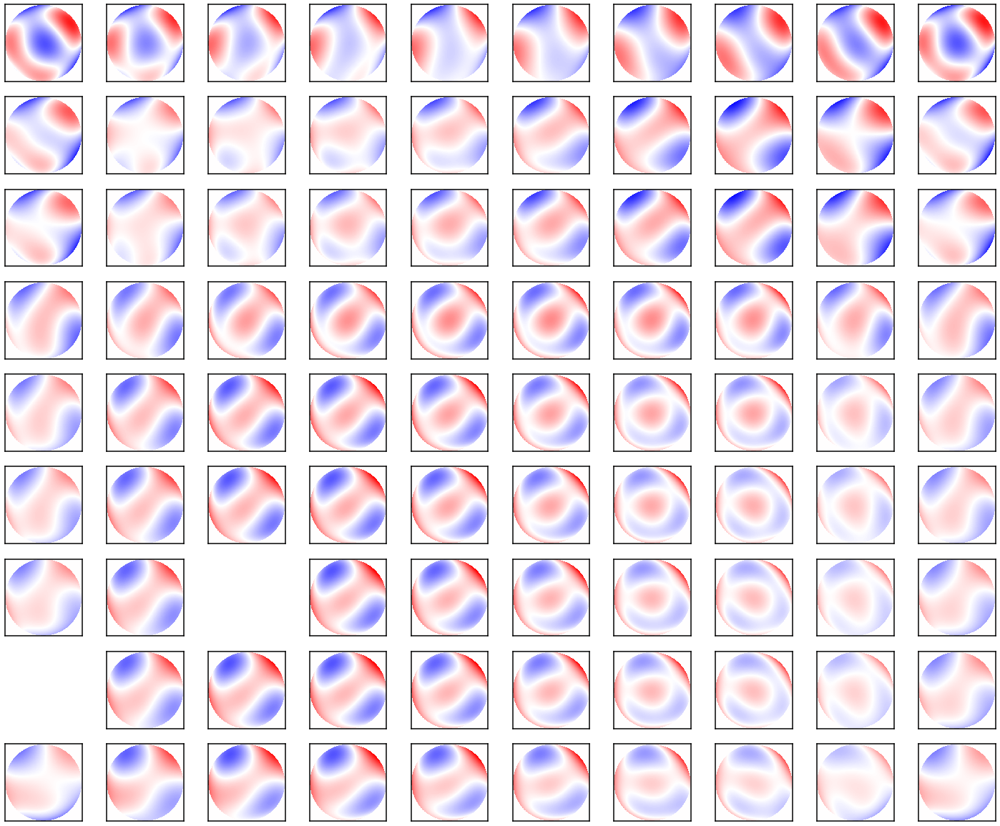

In [115]:
## matplotlib.rcParams.update({'font.size': 4})
matplotlib.rcParams.update({'axes.labelsize': 'small'})
matplotlib.rcParams.update({'xtick.labelsize': 'small'})
matplotlib.rcParams.update({'ytick.labelsize': 'small'})

y_range=9
x_range=10


plt.figure(figsize=(25,21))

# lowest Neon wavelength
# 660.0668 0,  2,  5,  8, 11, 14, 17, 20, 23, 26  
plt.subplot(y_range,x_range,81)
wavefront=list_of_wf_grid_Ne_0[0][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,82)
wavefront=list_of_wf_grid_Ne_0[2][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,83)
wavefront=list_of_wf_grid_Ne_0[5][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,84)
wavefront=list_of_wf_grid_Ne_0[8][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,85)
wavefront=list_of_wf_grid_Ne_0[11][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,86)
wavefront=list_of_wf_grid_Ne_0[14][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,87)
wavefront=list_of_wf_grid_Ne_0[17][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,88)
wavefront=list_of_wf_grid_Ne_0[20][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,89)
wavefront=list_of_wf_grid_Ne_0[23][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,90)
wavefront=list_of_wf_grid_Ne_0[26][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')
###############
# Ne 693
# 3,  6,  9, 12, 15, 18, 21, 24, 27

plt.subplot(y_range,x_range,72)
wavefront=list_of_wf_grid_Ne_0[3][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,73)
wavefront=list_of_wf_grid_Ne_0[6][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,74)
wavefront=list_of_wf_grid_Ne_0[9][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,75)
wavefront=list_of_wf_grid_Ne_0[12][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,76)
wavefront=list_of_wf_grid_Ne_0[15][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,77)
wavefront=list_of_wf_grid_Ne_0[18][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,78)
wavefront=list_of_wf_grid_Ne_0[21][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,79)
wavefront=list_of_wf_grid_Ne_0[24][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,80)
wavefront=list_of_wf_grid_Ne_0[27][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

###############
# HgAr 696
#  0,  5, 14, 19, 24, 29, 34, 39, 44
plt.subplot(y_range,x_range,61)
wavefront=list_of_wf_grid_HgAr_0[0][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,62)
wavefront=list_of_wf_grid_HgAr_0[5][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,64)
wavefront=list_of_wf_grid_HgAr_0[14][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,65)
wavefront=list_of_wf_grid_HgAr_0[19][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,66)
wavefront=list_of_wf_grid_HgAr_0[24][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,67)
wavefront=list_of_wf_grid_HgAr_0[29][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,68)
wavefront=list_of_wf_grid_HgAr_0[34][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,69)
wavefront=list_of_wf_grid_HgAr_0[39][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,70)
wavefront=list_of_wf_grid_HgAr_0[44][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

###############
# Ne 717
# [ 1,  4,  7, 10, 13, 16, 19, 22, 25, 28]

plt.subplot(y_range,x_range,51)
wavefront=list_of_wf_grid_Ne_0[1][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,52)
wavefront=list_of_wf_grid_Ne_0[4][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,53)
wavefront=list_of_wf_grid_Ne_0[7][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,54)
wavefront=list_of_wf_grid_Ne_0[10][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,55)
wavefront=list_of_wf_grid_Ne_0[13][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,56)
wavefront=list_of_wf_grid_Ne_0[16][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,57)
wavefront=list_of_wf_grid_Ne_0[19][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,58)
wavefront=list_of_wf_grid_Ne_0[22][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,59)
wavefront=list_of_wf_grid_Ne_0[25][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,60)
wavefront=list_of_wf_grid_Ne_0[28][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

###############
# HgAr 727
# 1,  6, 10, 15, 20, 25, 30, 35, 40, 45
plt.subplot(y_range,x_range,41)
wavefront=list_of_wf_grid_HgAr_0[1][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,42)
wavefront=list_of_wf_grid_HgAr_0[6][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,43)
wavefront=list_of_wf_grid_HgAr_0[10][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,44)
wavefront=list_of_wf_grid_HgAr_0[15][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,45)
wavefront=list_of_wf_grid_HgAr_0[20][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,46)
wavefront=list_of_wf_grid_HgAr_0[25][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,47)
wavefront=list_of_wf_grid_HgAr_0[30][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,48)
wavefront=list_of_wf_grid_HgAr_0[30][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,49)
wavefront=list_of_wf_grid_HgAr_0[40][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,50)
wavefront=list_of_wf_grid_HgAr_0[45][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

###############
# HgAr 795
# [ 2,  7, 11, 16, 21, 26, 31, 36, 41, 46]

plt.subplot(y_range,x_range,31)
wavefront=list_of_wf_grid_HgAr_0[2][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,32)
wavefront=list_of_wf_grid_HgAr_0[7][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,33)
wavefront=list_of_wf_grid_HgAr_0[11][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,34)
wavefront=list_of_wf_grid_HgAr_0[16][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,35)
wavefront=list_of_wf_grid_HgAr_0[21][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,36)
wavefront=list_of_wf_grid_HgAr_0[26][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,37)
wavefront=list_of_wf_grid_HgAr_0[31][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,38)
wavefront=list_of_wf_grid_HgAr_0[36][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,39)
wavefront=list_of_wf_grid_HgAr_0[41][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,40)
wavefront=list_of_wf_grid_HgAr_0[46][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

###############
# Kr 893
#0, 1, 2, 3, 4, 5, 6, 7, 8, 9
plt.subplot(y_range,x_range,21)
wavefront=list_of_wf_grid_Kr_0[0][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,22)
wavefront=list_of_wf_grid_Kr_0[1][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,23)
wavefront=list_of_wf_grid_Kr_0[2][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,24)
wavefront=list_of_wf_grid_Kr_0[3][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,25)
wavefront=list_of_wf_grid_Kr_0[4][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,26)
wavefront=list_of_wf_grid_Kr_0[5][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,27)
wavefront=list_of_wf_grid_Kr_0[6][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,28)
wavefront=list_of_wf_grid_Kr_0[7][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,29)
wavefront=list_of_wf_grid_Kr_0[8][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,30)
wavefront=list_of_wf_grid_Kr_0[9][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

###############
# HgAr 912
#  3,  8, 12, 17, 22, 27, 32, 37, 42, 47
plt.subplot(y_range,x_range,11)
wavefront=list_of_wf_grid_HgAr_0[3][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,12)
wavefront=list_of_wf_grid_HgAr_0[8][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,13)
wavefront=list_of_wf_grid_HgAr_0[12][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,14)
wavefront=list_of_wf_grid_HgAr_0[17][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,15)
wavefront=list_of_wf_grid_HgAr_0[22][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,16)
wavefront=list_of_wf_grid_HgAr_0[27][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,17)
wavefront=list_of_wf_grid_HgAr_0[32][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,18)
wavefront=list_of_wf_grid_HgAr_0[37][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,19)
wavefront=list_of_wf_grid_HgAr_0[42][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,20)
wavefront=list_of_wf_grid_HgAr_0[47][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

###############
# HgAr 966
#  4,  9, 13, 18, 23, 28, 33, 38, 43, 48
plt.subplot(y_range,x_range,1)
wavefront=list_of_wf_grid_HgAr_0[4][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,2)
wavefront=list_of_wf_grid_HgAr_0[9][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,3)
wavefront=list_of_wf_grid_HgAr_0[13][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,4)
wavefront=list_of_wf_grid_HgAr_0[18][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,5)
wavefront=list_of_wf_grid_HgAr_0[23][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,6)
wavefront=list_of_wf_grid_HgAr_0[28][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,7)
wavefront=list_of_wf_grid_HgAr_0[33][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,8)
wavefront=list_of_wf_grid_HgAr_0[38][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,9)
wavefront=list_of_wf_grid_HgAr_0[43][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,10)
wavefront=list_of_wf_grid_HgAr_0[48][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

### wavefront_0_focus_0

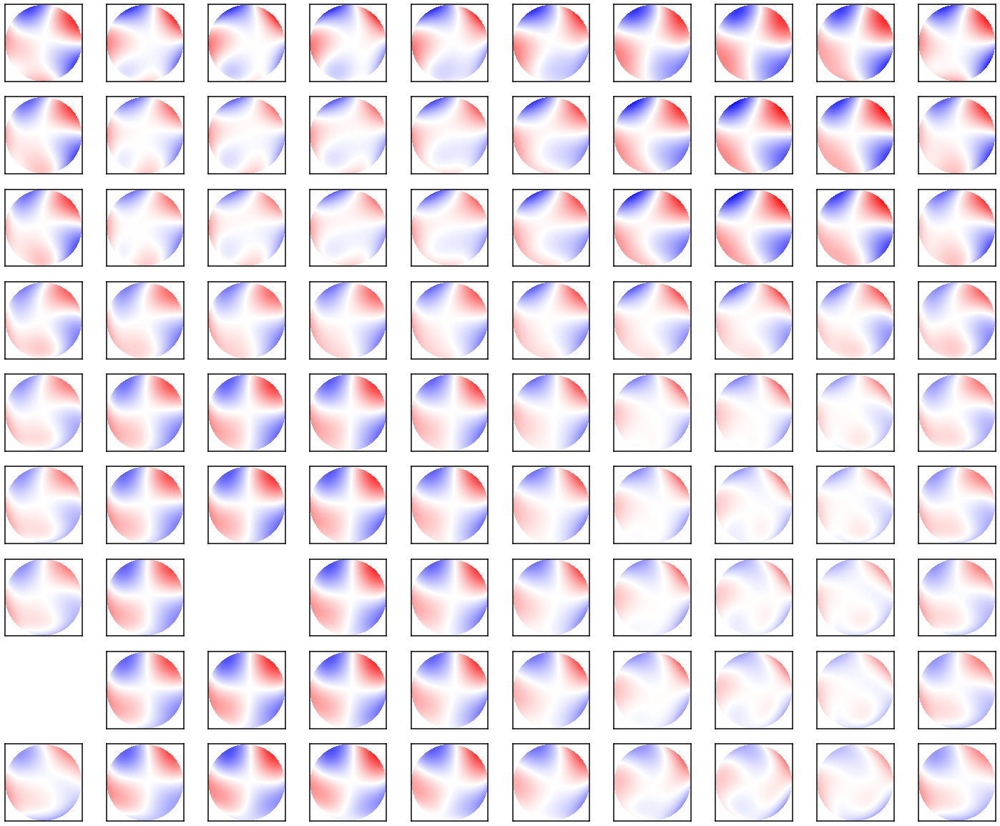

In [116]:
## matplotlib.rcParams.update({'font.size': 4})
matplotlib.rcParams.update({'axes.labelsize': 'small'})
matplotlib.rcParams.update({'xtick.labelsize': 'small'})
matplotlib.rcParams.update({'ytick.labelsize': 'small'})

y_range=9
x_range=10


plt.figure(figsize=(25,21))

# lowest Neon wavelength
# 660.0668 0,  2,  5,  8, 11, 14, 17, 20, 23, 26  
plt.subplot(y_range,x_range,81)
wavefront=list_of_wf_grid_Ne_0_and_focus_0[0][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,82)
wavefront=list_of_wf_grid_Ne_0_and_focus_0[2][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,83)
wavefront=list_of_wf_grid_Ne_0_and_focus_0[5][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,84)
wavefront=list_of_wf_grid_Ne_0_and_focus_0[8][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,85)
wavefront=list_of_wf_grid_Ne_0_and_focus_0[11][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,86)
wavefront=list_of_wf_grid_Ne_0_and_focus_0[14][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,87)
wavefront=list_of_wf_grid_Ne_0_and_focus_0[17][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,88)
wavefront=list_of_wf_grid_Ne_0_and_focus_0[20][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,89)
wavefront=list_of_wf_grid_Ne_0_and_focus_0[23][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,90)
wavefront=list_of_wf_grid_Ne_0_and_focus_0[26][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')
###############
# Ne 693
# 3,  6,  9, 12, 15, 18, 21, 24, 27

plt.subplot(y_range,x_range,72)
wavefront=list_of_wf_grid_Ne_0_and_focus_0[3][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,73)
wavefront=list_of_wf_grid_Ne_0_and_focus_0[6][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,74)
wavefront=list_of_wf_grid_Ne_0_and_focus_0[9][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,75)
wavefront=list_of_wf_grid_Ne_0_and_focus_0[12][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,76)
wavefront=list_of_wf_grid_Ne_0_and_focus_0[15][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,77)
wavefront=list_of_wf_grid_Ne_0_and_focus_0[18][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,78)
wavefront=list_of_wf_grid_Ne_0_and_focus_0[21][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,79)
wavefront=list_of_wf_grid_Ne_0_and_focus_0[24][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,80)
wavefront=list_of_wf_grid_Ne_0_and_focus_0[27][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

###############
# HgAr 696
#  0,  5, 14, 19, 24, 29, 34, 39, 44
plt.subplot(y_range,x_range,61)
wavefront=list_of_wf_grid_HgAr_0_and_focus_0[0][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,62)
wavefront=list_of_wf_grid_HgAr_0_and_focus_0[5][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,64)
wavefront=list_of_wf_grid_HgAr_0_and_focus_0[14][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,65)
wavefront=list_of_wf_grid_HgAr_0_and_focus_0[19][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,66)
wavefront=list_of_wf_grid_HgAr_0_and_focus_0[24][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,67)
wavefront=list_of_wf_grid_HgAr_0_and_focus_0[29][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,68)
wavefront=list_of_wf_grid_HgAr_0_and_focus_0[34][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,69)
wavefront=list_of_wf_grid_HgAr_0_and_focus_0[39][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,70)
wavefront=list_of_wf_grid_HgAr_0_and_focus_0[44][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

###############
# Ne 717
# [ 1,  4,  7, 10, 13, 16, 19, 22, 25, 28]

plt.subplot(y_range,x_range,51)
wavefront=list_of_wf_grid_Ne_0_and_focus_0[1][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,52)
wavefront=list_of_wf_grid_Ne_0_and_focus_0[4][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,53)
wavefront=list_of_wf_grid_Ne_0_and_focus_0[7][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,54)
wavefront=list_of_wf_grid_Ne_0_and_focus_0[10][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,55)
wavefront=list_of_wf_grid_Ne_0_and_focus_0[13][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,56)
wavefront=list_of_wf_grid_Ne_0_and_focus_0[16][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,57)
wavefront=list_of_wf_grid_Ne_0_and_focus_0[19][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,58)
wavefront=list_of_wf_grid_Ne_0_and_focus_0[22][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,59)
wavefront=list_of_wf_grid_Ne_0_and_focus_0[25][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,60)
wavefront=list_of_wf_grid_Ne_0_and_focus_0[28][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

###############
# HgAr 727
# 1,  6, 10, 15, 20, 25, 30, 35, 40, 45
plt.subplot(y_range,x_range,41)
wavefront=list_of_wf_grid_HgAr_0_and_focus_0[1][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,42)
wavefront=list_of_wf_grid_HgAr_0_and_focus_0[6][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,43)
wavefront=list_of_wf_grid_HgAr_0_and_focus_0[10][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,44)
wavefront=list_of_wf_grid_HgAr_0_and_focus_0[15][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,45)
wavefront=list_of_wf_grid_HgAr_0_and_focus_0[20][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,46)
wavefront=list_of_wf_grid_HgAr_0_and_focus_0[25][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,47)
wavefront=list_of_wf_grid_HgAr_0_and_focus_0[30][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,48)
wavefront=list_of_wf_grid_HgAr_0_and_focus_0[30][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,49)
wavefront=list_of_wf_grid_HgAr_0_and_focus_0[40][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,50)
wavefront=list_of_wf_grid_HgAr_0_and_focus_0[45][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

###############
# HgAr 795
# [ 2,  7, 11, 16, 21, 26, 31, 36, 41, 46]

plt.subplot(y_range,x_range,31)
wavefront=list_of_wf_grid_HgAr_0_and_focus_0[2][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,32)
wavefront=list_of_wf_grid_HgAr_0_and_focus_0[7][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,33)
wavefront=list_of_wf_grid_HgAr_0_and_focus_0[11][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,34)
wavefront=list_of_wf_grid_HgAr_0_and_focus_0[16][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,35)
wavefront=list_of_wf_grid_HgAr_0_and_focus_0[21][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,36)
wavefront=list_of_wf_grid_HgAr_0_and_focus_0[26][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,37)
wavefront=list_of_wf_grid_HgAr_0_and_focus_0[31][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,38)
wavefront=list_of_wf_grid_HgAr_0_and_focus_0[36][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,39)
wavefront=list_of_wf_grid_HgAr_0_and_focus_0[41][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,40)
wavefront=list_of_wf_grid_HgAr_0_and_focus_0[46][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

###############
# Kr 893
#0, 1, 2, 3, 4, 5, 6, 7, 8, 9
plt.subplot(y_range,x_range,21)
wavefront=list_of_wf_grid_Kr_0_and_focus_0[0][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,22)
wavefront=list_of_wf_grid_Kr_0_and_focus_0[1][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,23)
wavefront=list_of_wf_grid_Kr_0_and_focus_0[2][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,24)
wavefront=list_of_wf_grid_Kr_0_and_focus_0[3][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,25)
wavefront=list_of_wf_grid_Kr_0_and_focus_0[4][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,26)
wavefront=list_of_wf_grid_Kr_0_and_focus_0[5][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,27)
wavefront=list_of_wf_grid_Kr_0_and_focus_0[6][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,28)
wavefront=list_of_wf_grid_Kr_0_and_focus_0[7][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,29)
wavefront=list_of_wf_grid_Kr_0_and_focus_0[8][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,30)
wavefront=list_of_wf_grid_Kr_0_and_focus_0[9][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

###############
# HgAr 912
#  3,  8, 12, 17, 22, 27, 32, 37, 42, 47
plt.subplot(y_range,x_range,11)
wavefront=list_of_wf_grid_HgAr_0_and_focus_0[3][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,12)
wavefront=list_of_wf_grid_HgAr_0_and_focus_0[8][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,13)
wavefront=list_of_wf_grid_HgAr_0_and_focus_0[12][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,14)
wavefront=list_of_wf_grid_HgAr_0_and_focus_0[17][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,15)
wavefront=list_of_wf_grid_HgAr_0_and_focus_0[22][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,16)
wavefront=list_of_wf_grid_HgAr_0_and_focus_0[27][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,17)
wavefront=list_of_wf_grid_HgAr_0_and_focus_0[32][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,18)
wavefront=list_of_wf_grid_HgAr_0_and_focus_0[37][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,19)
wavefront=list_of_wf_grid_HgAr_0_and_focus_0[42][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,20)
wavefront=list_of_wf_grid_HgAr_0_and_focus_0[47][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

###############
# HgAr 966
#  4,  9, 13, 18, 23, 28, 33, 38, 43, 48
plt.subplot(y_range,x_range,1)
wavefront=list_of_wf_grid_HgAr_0_and_focus_0[4][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,2)
wavefront=list_of_wf_grid_HgAr_0_and_focus_0[9][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,3)
wavefront=list_of_wf_grid_HgAr_0_and_focus_0[13][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,4)
wavefront=list_of_wf_grid_HgAr_0_and_focus_0[18][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,5)
wavefront=list_of_wf_grid_HgAr_0_and_focus_0[23][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,6)
wavefront=list_of_wf_grid_HgAr_0_and_focus_0[28][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,7)
wavefront=list_of_wf_grid_HgAr_0_and_focus_0[33][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,8)
wavefront=list_of_wf_grid_HgAr_0_and_focus_0[38][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,9)
wavefront=list_of_wf_grid_HgAr_0_and_focus_0[43][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')

plt.subplot(y_range,x_range,10)
wavefront=list_of_wf_grid_HgAr_0_and_focus_0[48][320:840,320:840]
plt.imshow(wavefront,cmap=plt.get_cmap('bwr'),vmax=3,vmin=-3)
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='minor')
plt.tick_params(top=False, bottom=False, left=False, right=False, labelleft=False, labelbottom=False,which='major')